# COLOR EVOLUTION, COMPARISON WITH LITERATURE

26-04-2023: expanded the compatibility to 3sigma

25-04-2023: merged similar filters, ugriz and u'g'r'i'z', K Ks K'

16-04-2023: 
We applied the 2.5% criteria in the whole LC

29-03-2023: 
Biagio -> I corrected the weights definition as 1/y_err rather than 1/y_err^2 ; I added the right comment if |slope_err/slope|>1 then it is compatible in 1sigma and there is no color evolution 

### Imports

In [ ]:
#The following warning has been ignored, keep in mind when inserting this code in the grblc package
#C:\Users\biagi\AppData\Local\Temp\ipykernel_2268\907779747.py:51: FutureWarning:
#Using short name for 'orient' is deprecated. Only the options: ('dict', list, 'series', 'split', 'records', 'index') will be used in a future version. Use one of the above to silence this warning.

In [1]:
import os
import os.path
import shutil
import glob
from functools import reduce
import re
import itertools

import pandas as pd
import numpy as np
from numpy import inf
import math
import astropy.units as u
import astropy.constants as const
from astropy.modeling import models, fitting
from astropy.time import Time

import statsmodels.api as sm
import scipy.stats
import lmfit
from lmfit import Model
from lmfit.models import LinearModel, PowerLawModel, GaussianModel

import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cmx
import seaborn as sns
from IPython.display import display, clear_output, Markdown

#import plotly.offline
#plotly.offline.init_notebook_mode(connected=True)

#import grblc
#from grblc.fitting import Model, Lightcurve

import warnings
warnings.filterwarnings("ignore")
directory = os.getcwd()

from sklearn import datasets
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.linear_model import (LinearRegression, HuberRegressor, RANSACRegressor, TheilSenRegressor)
from sklearn import linear_model, datasets

In [2]:
# create a list of the path of all our grbs.

#path ="/content/drive//MyDrive/gamma-ray-gang/sample/527GRBS_mag_with_telescope&systeminfo/Ready_for_Ridha(completefiles)/GRBs_AB+galextcorr_08-02-2023/"
path = "C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/"
grblist = []
filelist = []

for root, dirs, files in os.walk(path):
    for file in files:
        filelist.append(os.path.join(root,file))
        names = file.split('_')
        grblist.append(names[0])

filedf=pd.DataFrame()
filedf['grb'] = grblist
filedf['path'] = filelist

### COLOR EVOLUTION ANALYSIS


####################################################################################################

000131A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 3], ['K', 1], ['I', 1], ['H', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 3 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    V          1  5.482287      -1.40           0.14           7.142857
1    I          1  5.491224       1.23           0.11           9.090909
2    H          1  5.809393       2.88           0.49           2.040816
3    K          1  5.810761       3.66           0.60           1.666667
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

000301C
List of filters in the form: [Filter,number of 

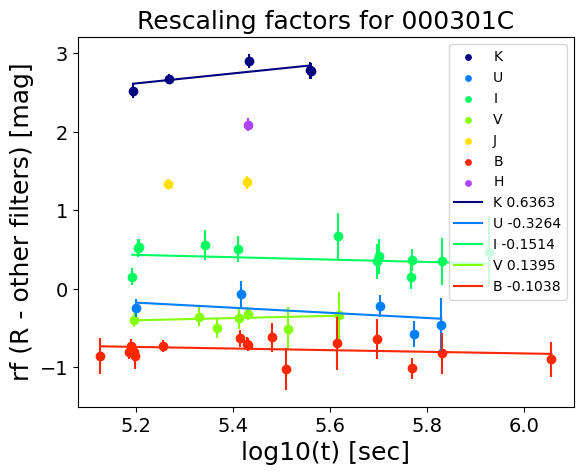


####################################################################################################

000418A
List of filters in the form: [Filter,number of points that have this filter]
[['Rc', 34], ['K', 6], ['R', 3], ['V', 2], ['i_Gunn', 1], ['B', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  Rc , with 34 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    K          6  5.332378   4.140000           0.54           1.851852
1    K          6  5.333923   4.130000           0.54           1.851852
2    K          6  5.337583   3.740000           0.24           4.166667
3    K          6  5.341490   3.730000           0.24           4.166667
4    R          3  5.373629   0.200791           0.24           4.166667
Rescaling results
------------------
          slope slope_err intercept inter_err acceptance           red_chi2  \
K      

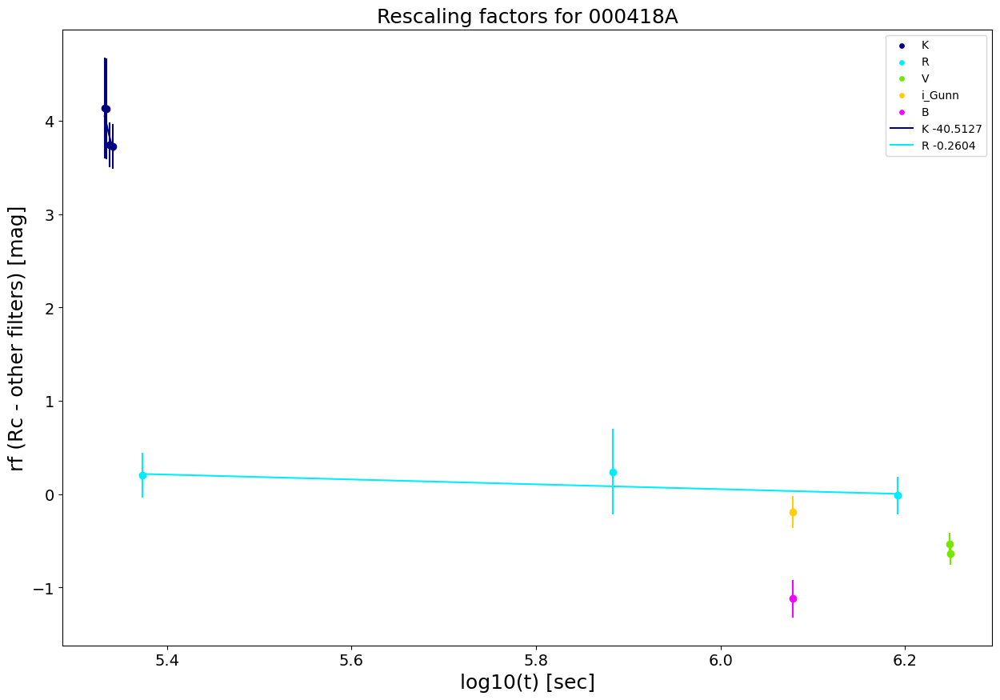


####################################################################################################

000911A
List of filters in the form: [Filter,number of points that have this filter]
[['I', 23], ['R', 21], ['V', 13], ['B', 7], ['J', 5], ['H', 2], ['K', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  I , with 23 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    R         21  5.568731  -0.028815          0.105           9.523810
1    R         21  5.569030  -0.416815          0.082          12.195122
2    R         21  5.570333  -0.437595          0.112           8.928571
3    R         21  5.629588  -0.438470          0.350           2.857143
4    V         13  5.637700  -0.853475          0.400           2.500000
Rescaling results
------------------
    slope slope_err intercept inter_err acceptance red_chi2  \
J   0.592    0.000

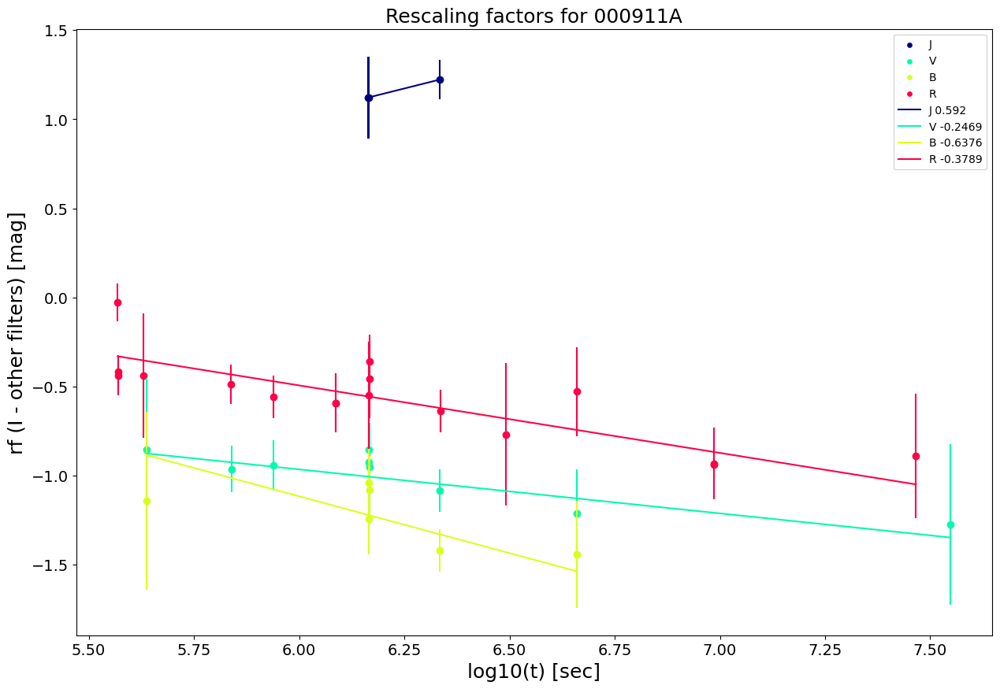


####################################################################################################

000926A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 82], ['B', 24], ['I', 9], ['V', 5], ['F606W', 4], ['F814W', 4], ['i', 4], ['F450W', 3], ['U', 3], ['Unfiltered', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 82 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    B         24  4.888808  -1.045764          0.044          22.727273
1    B         24  4.889431  -0.978764          0.052          19.230769
2    i          4  4.909535   0.430994          0.049          20.408163
3    i          4  4.909727   0.478994          0.049          20.408163
4    U          3  4.919455  -0.762176          0.058          17.241379
Rescaling results
------------------
    slope slope_err i

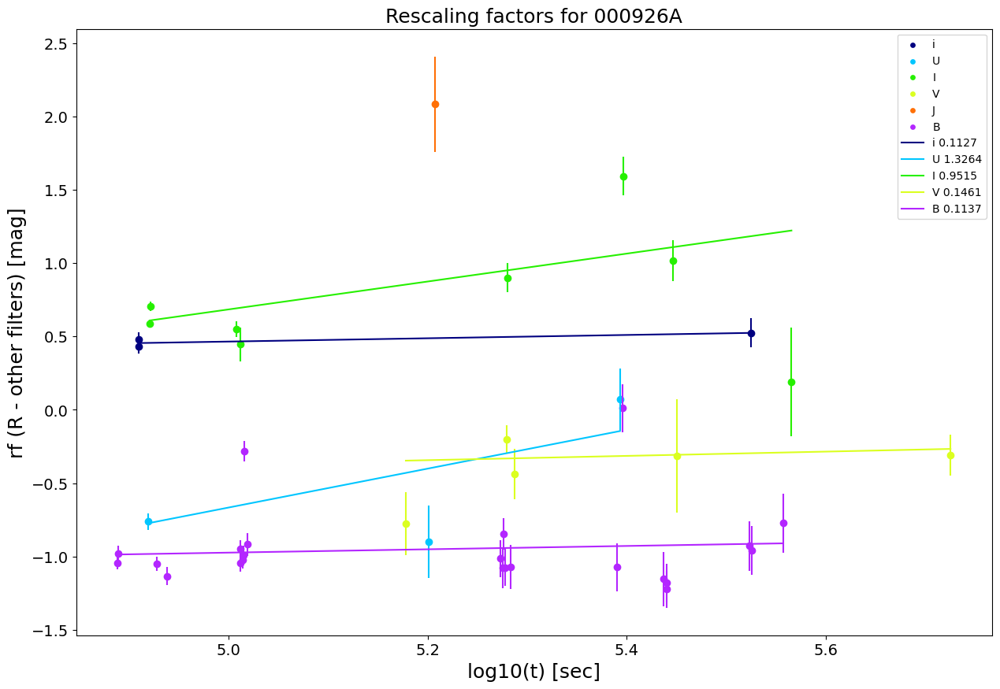


####################################################################################################

010222A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 87], ['V', 28], ['I', 16], ['B', 12], ['Rc', 9], ['g', 6], ['U', 4], ['Ic', 4], ['J', 3], ['K', 2], ['R_Steide', 2], ['u', 1], ['r', 1], ['i', 1], ['z', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 87 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    r          1  4.235326  -0.324414           0.12           8.333333
1    i          1  4.237141  -0.130184           0.12           8.333333
2    u          1  4.238949  -0.901477           0.06          16.666667
3    z          1  4.240724   0.237303           0.06          16.666667
4    g          6  4.242517  -0.427768           0.05          20.000000
Rescaling results
----------

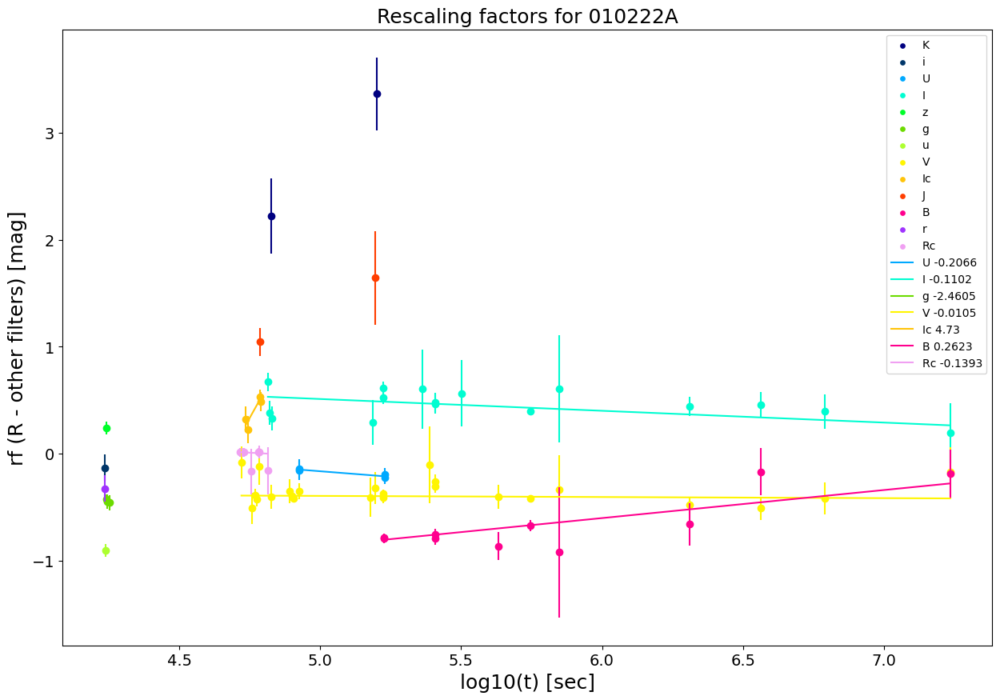


####################################################################################################

010921A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 9], ['R', 6], ['i', 4], ['F702W', 3], ['F555W', 3], ['g', 3], ['F850LP', 3], ['Ic', 3], ['F814W', 2], ['V', 2], ['F450W', 2], ['B', 2], ['clear', 2], ['I', 2], ['Rc', 1], ['U', 1], ['H', 1], ['K', 1], ['z', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 9 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
    band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0      g          3  4.887928  -1.130821          0.900           1.111111
1      i          4  4.890832   0.599875          1.000           1.000000
2      R          6  4.895047   0.080071          0.500           2.000000
3  clear          2  4.897834   0.175415          0.133           7.518797
4      g          3  5.24450

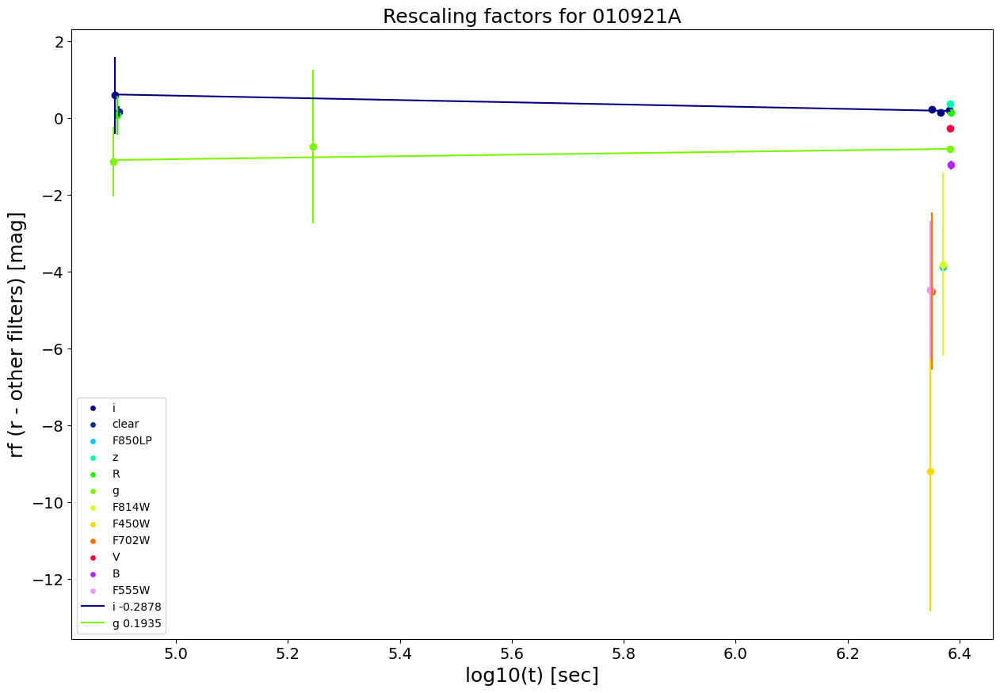


####################################################################################################

011121A
List of filters in the form: [Filter,number of points that have this filter]
[['K', 40], ['J', 19], ['R', 18], ['V', 12], ['Rc', 10], ['I', 7], ['Js', 7], ['B', 6], ['H', 4], ['F702W', 3], ['F555W', 3], ['F814W', 3], ['F850LP', 3], ['U', 3], ['F450W', 1], ['Ic', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  K , with 40 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    R         18  4.655098  -3.663580          0.075          13.333333
1    V         12  4.660380  -4.263580          0.095          10.526316
2    I          7  4.665435  -3.023580          0.075          13.333333
3   Rc         10  4.669215  -2.497127          0.050          20.000000
4    R         18  4.672033  -3.670580          0.071          14.084507
Re

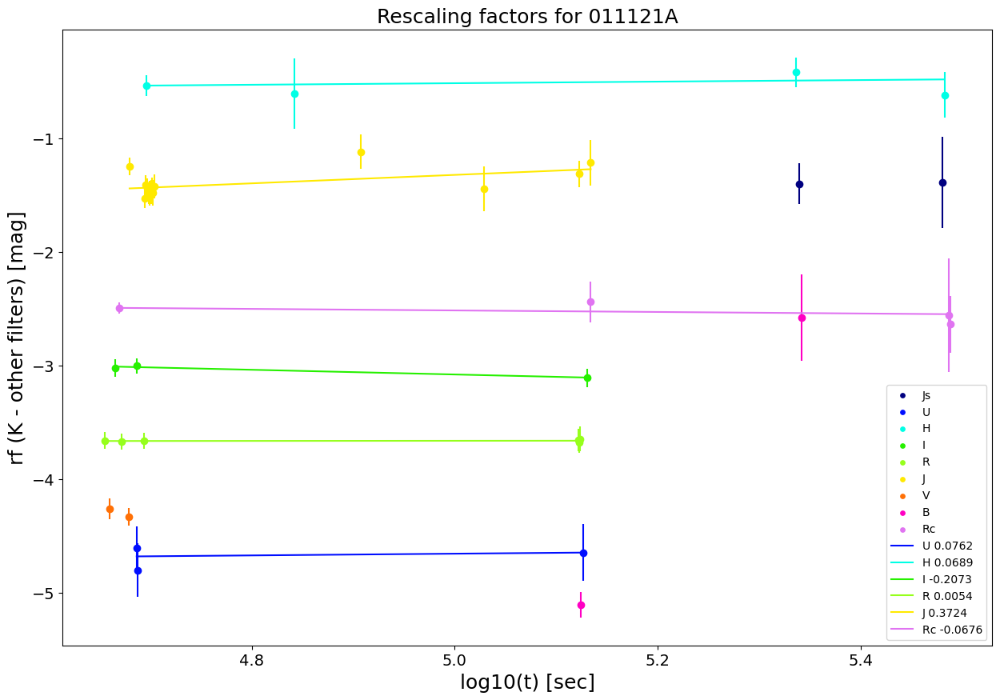


####################################################################################################

011211A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 36], ['I', 10], ['V', 8], ['B', 4], ['J', 2], ['U', 1], ['K', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 36 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    I         10  4.609970   0.510036           0.11           9.090909
1    I         10  4.628101   0.340036           0.09          11.111111
2    V          8  4.645421  -0.384242           0.08          12.500000
3    I         10  4.652327   0.410036           0.09          11.111111
4    I         10  4.665656   0.440036           0.09          11.111111
Rescaling results
------------------
    slope slope_err intercept inter_err acceptance           red_chi2  \
V  0.1849

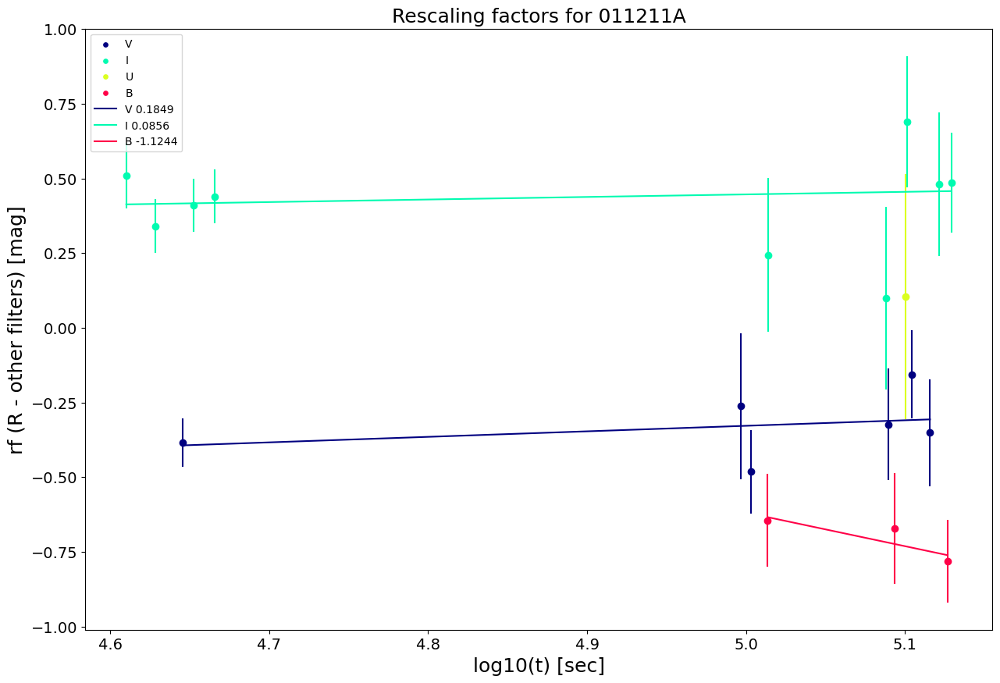


####################################################################################################

020124A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 16], ['B', 6], ['K', 2], ['I', 1], ['r', 1], ['Unfiltered', 1], ['Js', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 16 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    B          6  3.760829  -0.602692          0.098          10.204082
1    B          6  3.789235  -0.635692          0.107           9.345794
2    B          6  3.815890  -0.623692          0.118           8.474576
3    B          6  3.988050  -0.875692          0.138           7.246377
4    B          6  4.005142  -0.609692          0.089          11.235955
Rescaling results
------------------
             slope slope_err intercept inter_err acceptance  \
Unfiltered

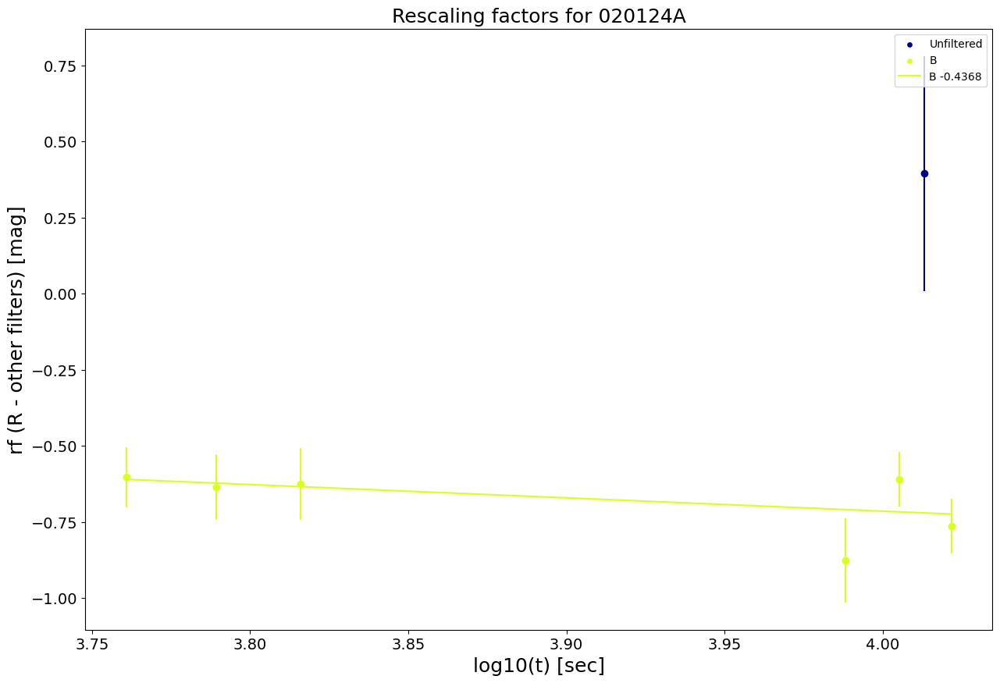


####################################################################################################

020405A
List of filters in the form: [Filter,number of points that have this filter]
[['V', 14], ['Rc', 14], ['Ic', 5], ['F702W', 4], ['B', 3], ['F555W', 3], ['F814W', 3], ['H', 2], ['K', 2], ['J', 2], ['U', 1], ['i_Gunn', 1], ['R', 1], ['Js', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  V , with 14 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    U          1  4.970030   0.338939           0.09          11.111111
1    B          3  4.973633  -0.435951           0.06          16.666667
2   Rc         14  4.977997   0.409332           0.07          14.285714
3   Ic          5  4.979966   1.048354           0.11           9.090909
4   Rc         14  4.980751   0.309332           0.05          20.000000
Rescaling results
-----------

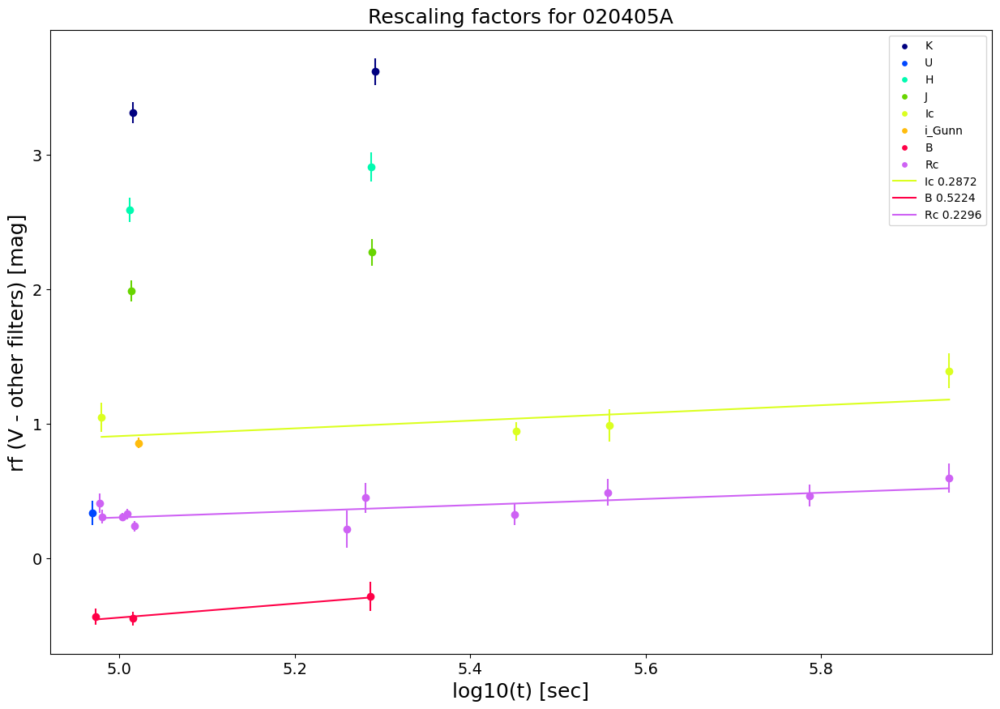


####################################################################################################

020813A
List of filters in the form: [Filter,number of points that have this filter]
[['V', 49], ['I', 17], ['R', 16], ['B', 3]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  V , with 49 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    I         17  4.144686   0.798215          0.009         111.111111
1    R         16  4.154787   0.274628          0.009         111.111111
2    I         17  4.159230   0.767215          0.009         111.111111
3    I         17  4.162081   0.763215          0.010         100.000000
4    I         17  4.164914   0.809215          0.010         100.000000
Rescaling results
------------------
    slope slope_err intercept inter_err acceptance red_chi2  \
I -0.0435    0.1553    0.9729    0.6499     3.57

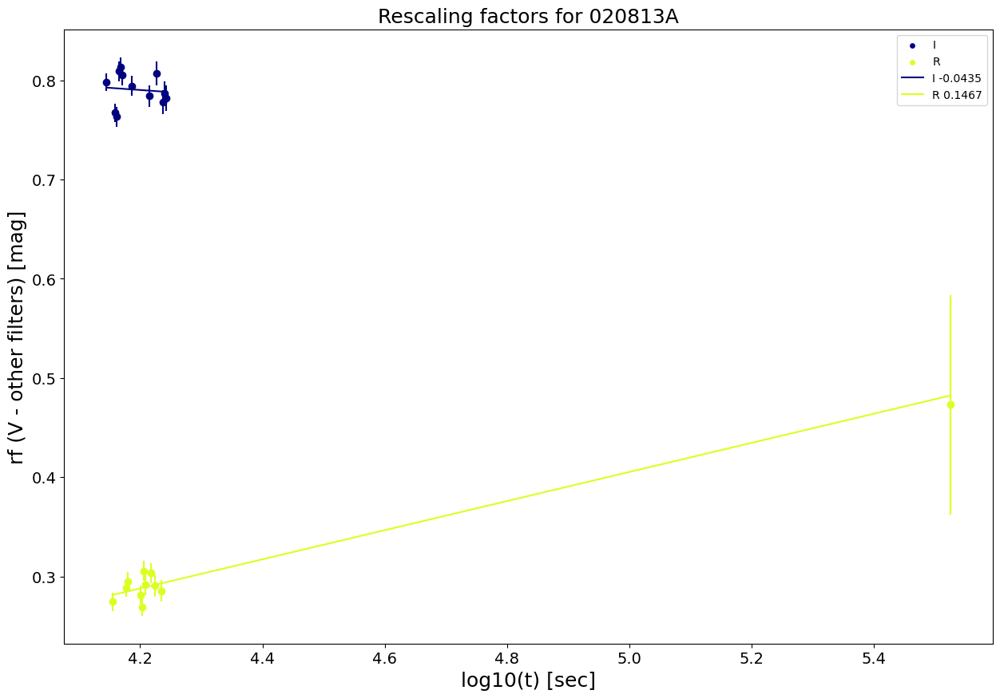


####################################################################################################

020903A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 18], ['I', 6], ['B', 5], ['F606W', 4], ['V', 2]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 18 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    I          6  6.391335   0.284142          0.160           6.250000
1    V          2  6.391533  -0.515569          0.130           7.692308
2    B          5  6.391670  -1.219502          0.150           6.666667
3    I          6  6.407159   0.610142          0.106           9.433962
4    I          6  6.501795   0.913376          0.115           8.695652
Rescaling results
------------------
        slope slope_err intercept inter_err acceptance           red_chi2  \
V           0         

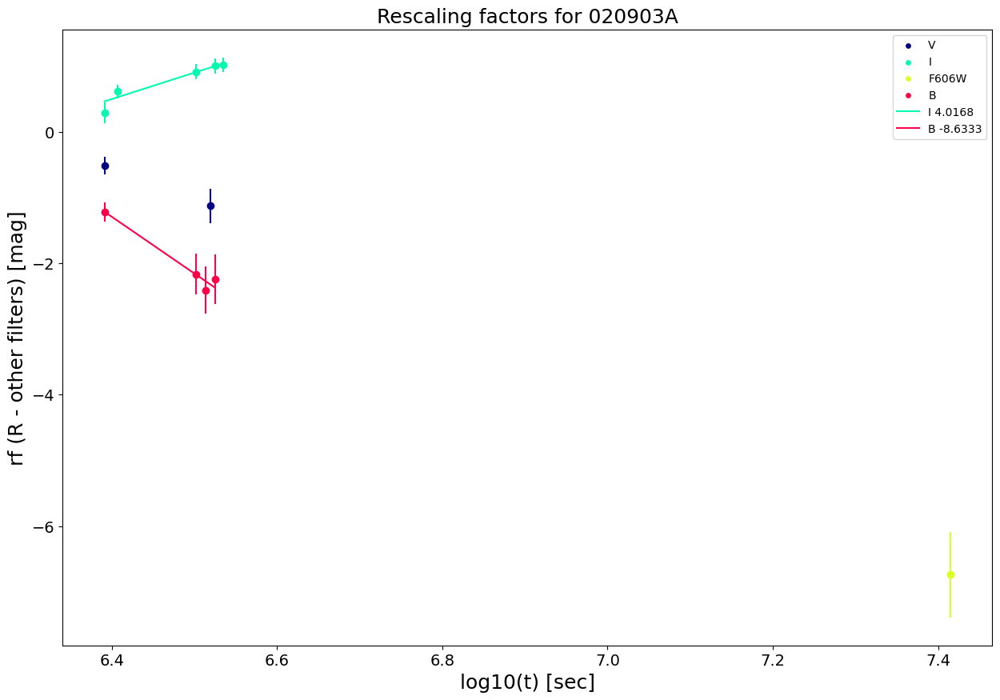


####################################################################################################

021004A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 158], ['Rc', 79], ['V', 73], ['B', 46], ['I', 38], ['Ic', 28], ['U', 15], ['N', 5], ['J', 4], ['F606W', 4], ['K', 4], ['F160W', 4], ['F435W', 2], ['F814W', 2], ['F110W', 2], ['F250W', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 158 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0   Rc         79  4.017864   0.213039           0.11           9.090909
1   Rc         79  4.090864   0.083039           0.08          12.500000
2    B         46  4.185157   0.629861           0.02          50.000000
3    B         46  4.196905   0.609861           0.02          50.000000
4    V         73  4.235690  -0.294207           0.02          50.000

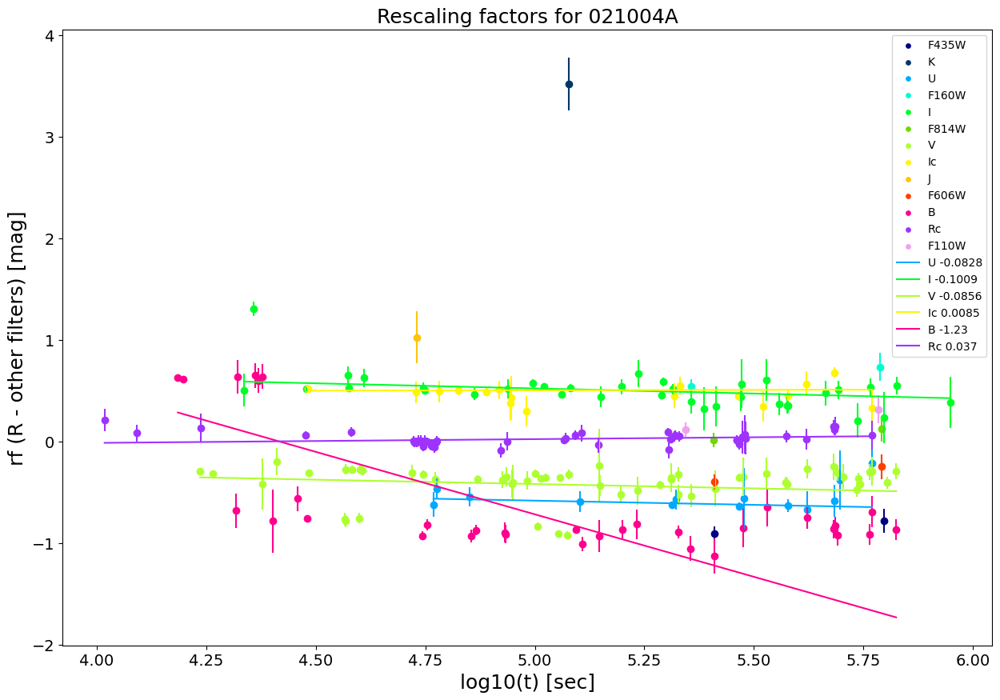


####################################################################################################

021211A
List of filters in the form: [Filter,number of points that have this filter]
[['Rc', 43], ['R', 18], ['J', 6], ['V', 5], ['i', 4], ['B', 3], ['K', 2], ['H', 2], ['Ic', 2], ['F606W', 1], ['g', 1], ['r', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  Rc , with 43 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    R         18  3.337914   0.079522          0.223           4.484305
1    R         18  3.549298   0.231318          0.198           5.050505
2    K          2  3.851914   2.672568          0.570           1.754386
3    B          3  4.615362  -0.454266          0.320           3.125000
4    B          3  4.882050  -0.400000          0.320           3.125000
No filter with at least 3 rescaling factors to be fitted

####

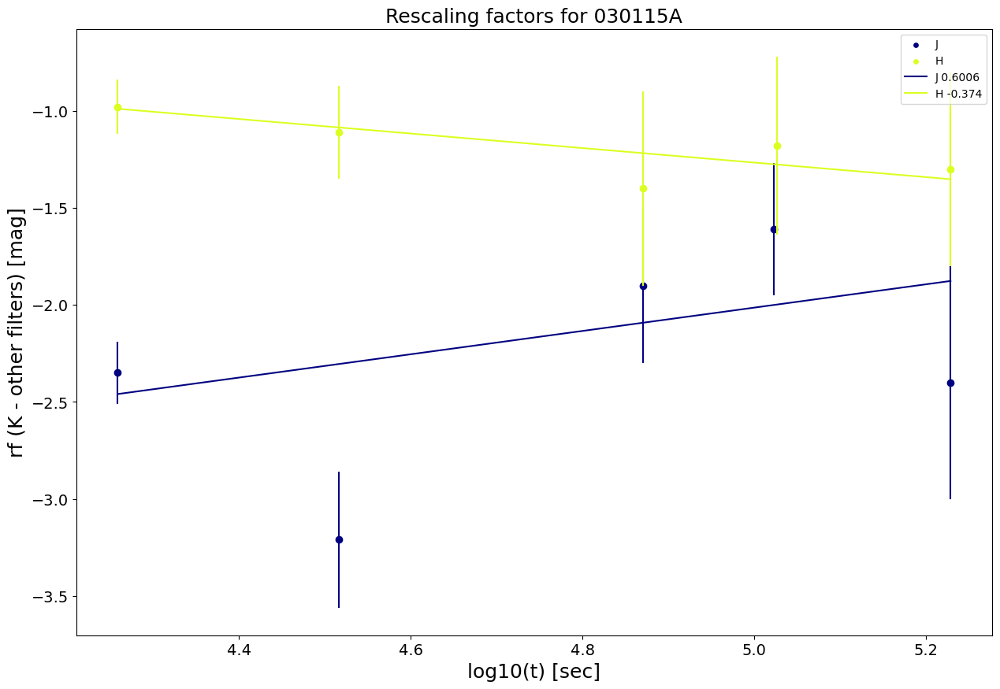


####################################################################################################

030226A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 32], ['V', 11], ['I', 7], ['B', 5], ['Rc', 3], ['U', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 32 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    I          7  4.587377   0.625621           0.11           9.090909
1    V         11  4.593447  -0.215494           0.08          12.500000
2    B          5  4.605898  -0.708013           0.12           8.333333
3    B          5  4.637885  -0.488013           0.11           9.090909
4    V         11  4.640156  -0.645494           0.23           4.347826
Rescaling results
------------------
    slope slope_err intercept inter_err acceptance           red_chi2  \
V  0.0155    0.720

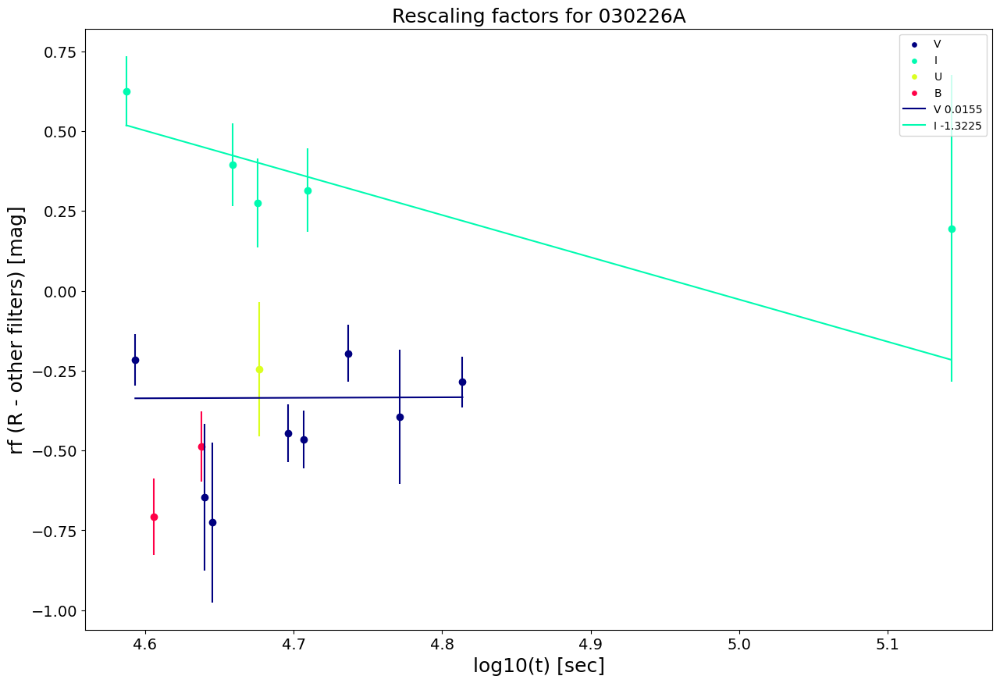


####################################################################################################

030323A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 16], ['V', 14], ['I', 7], ['K', 3], ['H', 2], ['B', 2], ['J', 2]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 16 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    V         14  4.533607  -0.860383           0.08          12.500000
1    I          7  4.547652   0.537559           0.07          14.285714
2    V         14  4.983960  -0.816957           0.11           9.090909
3    V         14  4.985130  -0.826957           0.11           9.090909
4    B          2  5.007086  -1.693464           0.06          16.666667
Rescaling results
------------------
    slope slope_err intercept inter_err acceptance           red_chi2  \
K       0

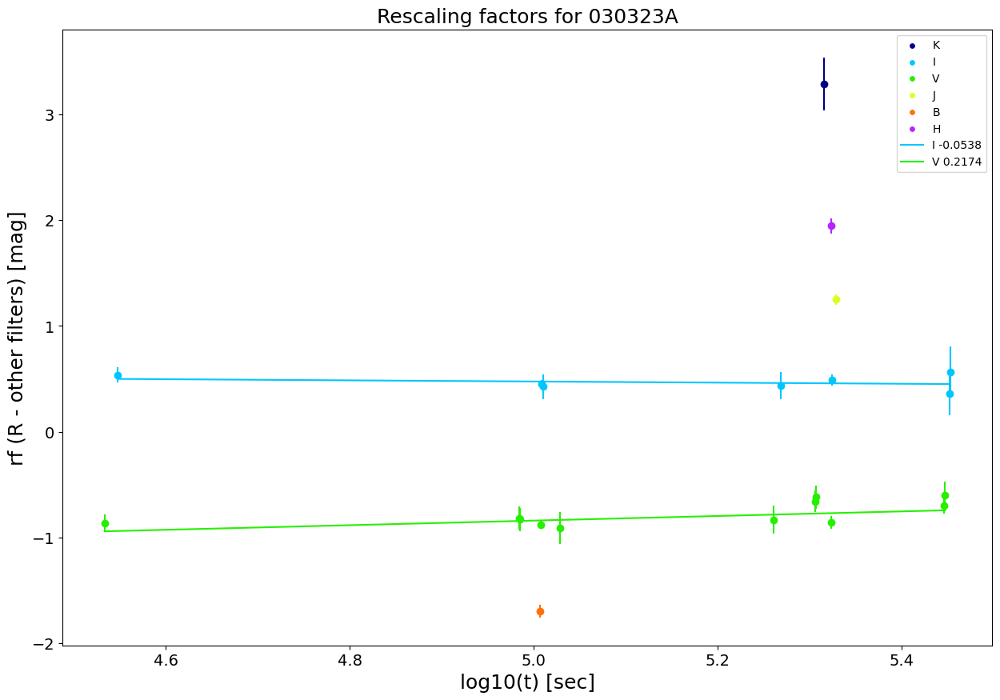


####################################################################################################

030328A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 89], ['I', 7], ['i', 1], ['B', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 89 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    i          1  4.670117   0.412728           0.08          12.500000
1    I          7  4.823515   0.268839           0.12           8.333333
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

030329A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 1811], ['V', 447], ['B', 395], ['I', 389], ['Rc', 277], ['U', 13]]
 
The most numerous filter is considered for resca

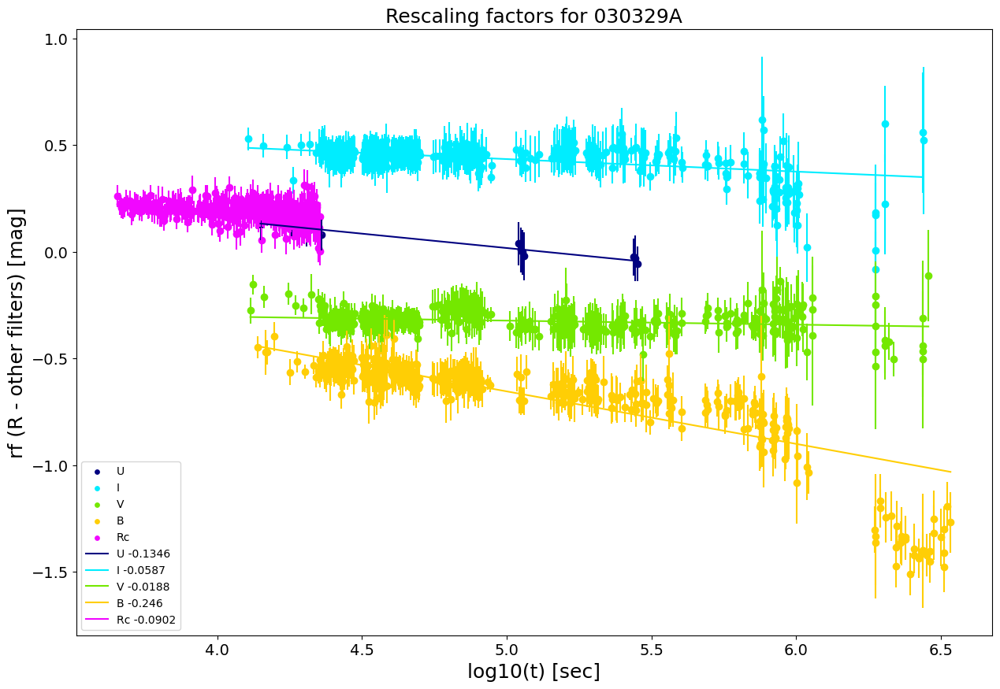


####################################################################################################

030429A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 14], ['K', 6], ['I', 5], ['Rc', 4], ['J', 4], ['V', 4], ['H', 4], ['Js', 2], ['B', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 14 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0   Rc          4  4.264889  -0.274905           0.30           3.333333
1    V          4  4.669075  -0.553228           0.07          14.285714
2   Js          2  4.675624   1.508558           0.08          12.500000
3    K          6  4.683926   3.329809           0.24           4.166667
4    J          4  4.683926   1.858216           0.24           4.166667
Rescaling results
------------------
     slope slope_err intercept inter_err acceptance          

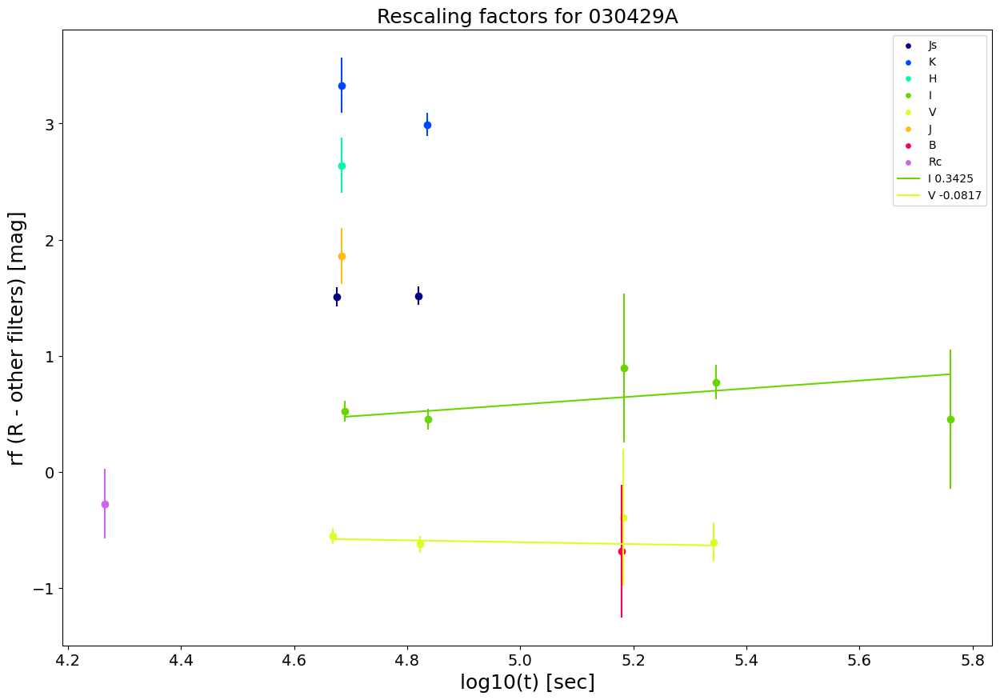


####################################################################################################

030528A
List of filters in the form: [Filter,number of points that have this filter]
[['K', 4], ['Js', 4], ['I', 2], ['H', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  K , with 4 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    H          1  4.766071       -1.4            1.3           0.769231
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

031203A
List of filters in the form: [Filter,number of points that have this filter]
[['I', 11], ['R', 10], ['K', 9], ['H', 5], ['J', 5], ['V', 4]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  I , with 11 occurrences
-\|/-|/

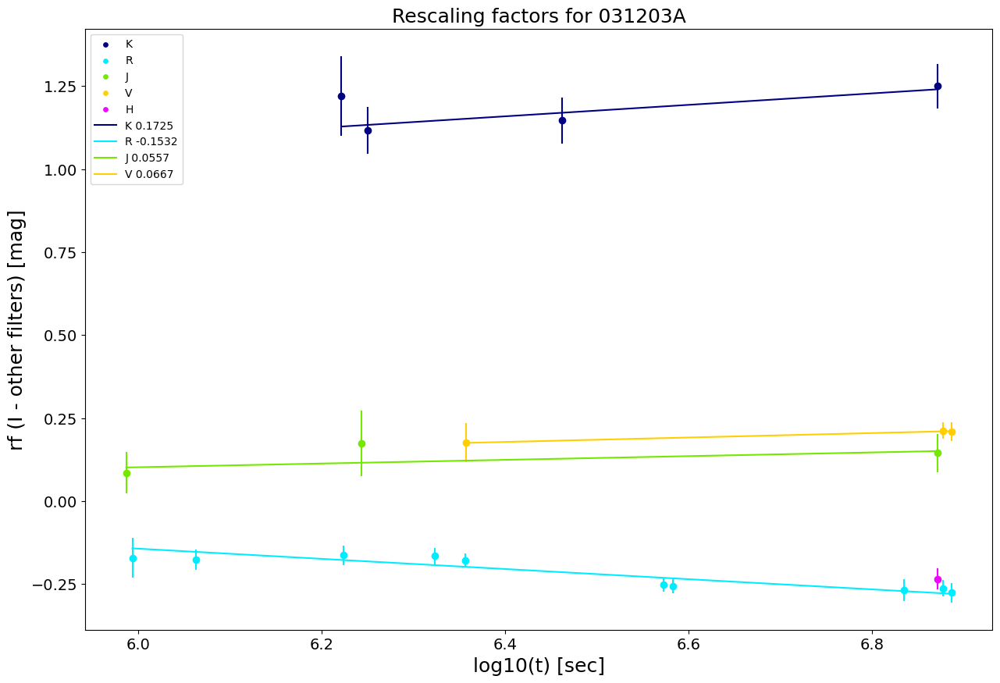


####################################################################################################

040924A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 42], ['Rc', 19], ['V', 6], ['I', 5], ['z', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 42 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0   Rc         19  4.508700  -0.032187           0.26           3.846154
1   Rc         19  4.528609   0.277813           0.20           5.000000
2   Rc         19  4.545632   0.277813           0.21           4.761905
3   Rc         19  4.562008   0.307813           0.19           5.263158
4   Rc         19  4.579057   0.287813           0.20           5.000000
Rescaling results
------------------
     slope slope_err intercept inter_err acceptance           red_chi2  \
V        0         0       

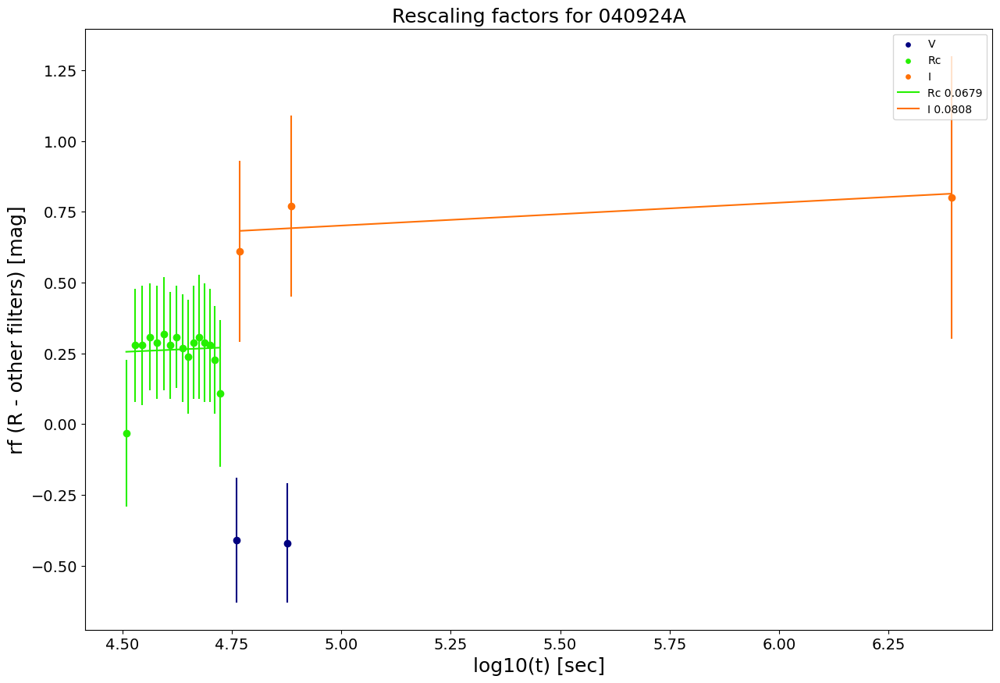


####################################################################################################

041006A
List of filters in the form: [Filter,number of points that have this filter]
[['Rc', 73], ['R', 33], ['V', 16], ['B', 12], ['H', 5], ['Ic', 3], ['g', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  Rc , with 73 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    R         33  4.105216   0.517535          0.140           7.142857
1    R         33  4.105272   0.006535          0.117           8.547009
2    R         33  4.116176  -0.013465          0.125           8.000000
3   Ic          3  4.124570   0.327713          0.120           8.333333
4    V         16  4.156186  -0.470870          0.138           7.246377
Rescaling results
------------------
     slope slope_err intercept inter_err acceptance           red_chi2  \
V  

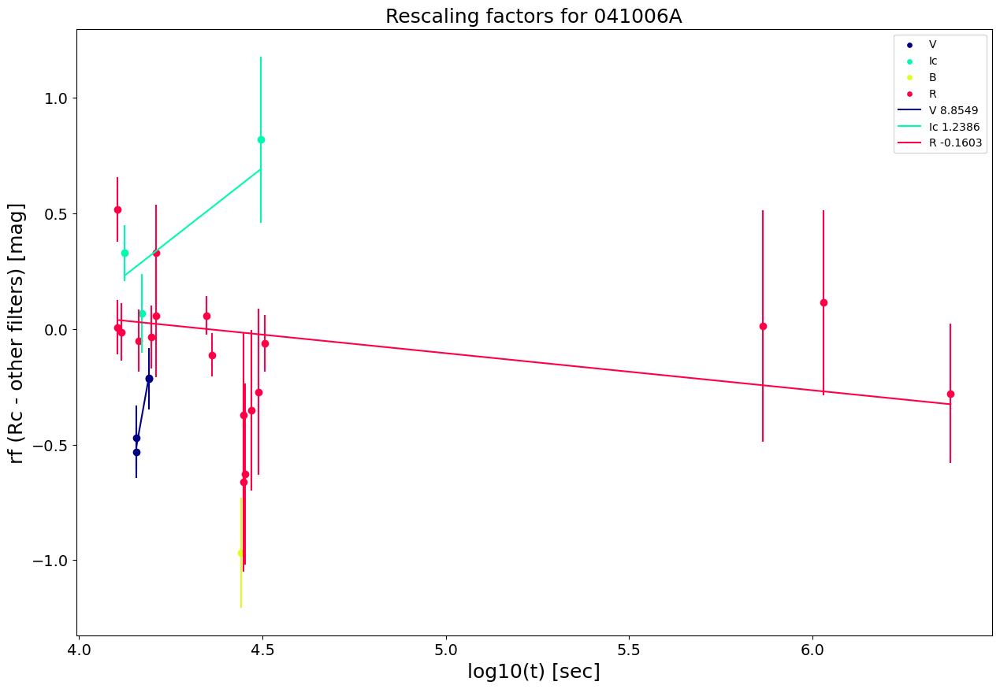


####################################################################################################

041219A
List of filters in the form: [Filter,number of points that have this filter]
[['K', 73], ['H', 66], ['J', 58], ['z', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  K , with 73 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    H         66  2.636989  -0.886271       1.535624           0.651201
1    J         58  2.636989  -1.315536       1.013365           0.986811
2    H         66  2.644832  -0.247788       0.197266           5.069303
3    H         66  2.658488  -0.701589       0.043549          22.962714
4    J         58  2.658488  -0.805658       0.060615          16.497573
Rescaling results
------------------
    slope slope_err intercept inter_err acceptance red_chi2  \
J  0.0791    0.0524   -0.5499    0.1891     0.66

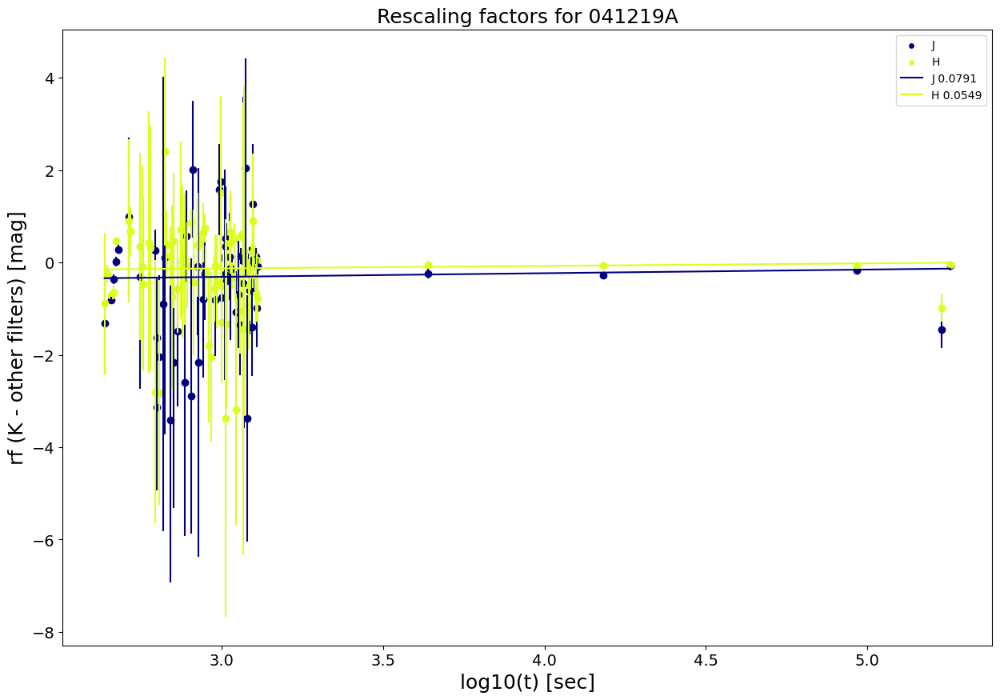


####################################################################################################

050126A
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/050126A_magAB_extcorr.txt has only one data point along all the LC, thus no rescaling is needed

----------------------------------------------------------------------------------------------------


####################################################################################################

050215B
List of filters in the form: [Filter,number of points that have this filter]
[['K', 5], ['V', 4], ['B', 3], ['r', 3], ['U', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  K , with 5 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

##############################

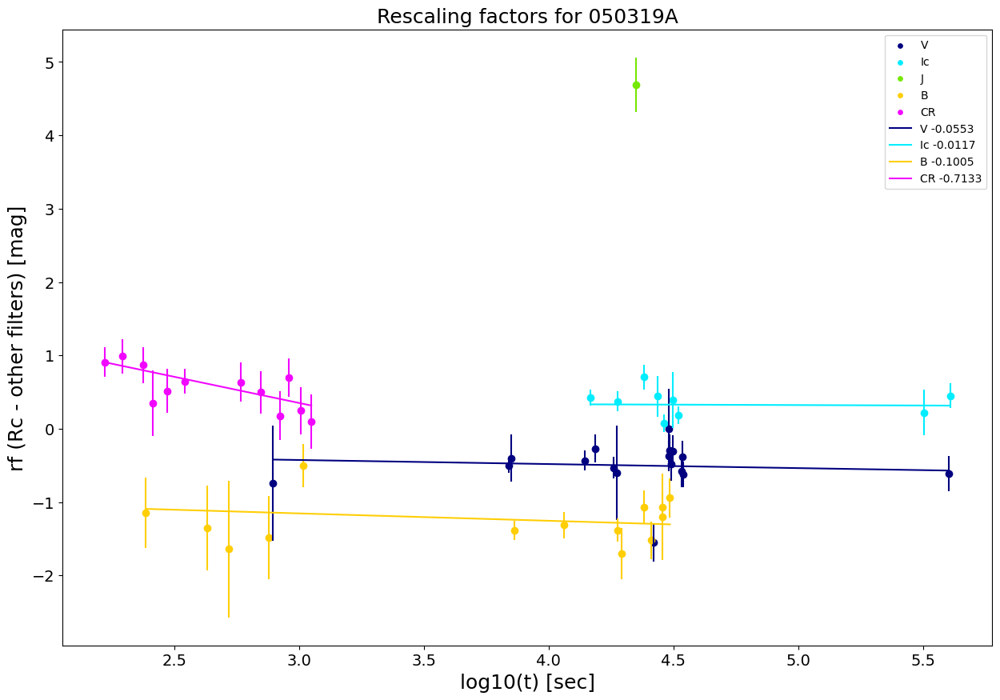


####################################################################################################

050401A
List of filters in the form: [Filter,number of points that have this filter]
[['CR', 16], ['Rc', 16], ['H', 4], ['K', 2], ['V', 1], ['Ic', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  CR , with 16 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0   Rc         16  4.527630   0.529167           0.22           4.545455
1   Rc         16  4.608526  -0.150833           0.11           9.090909
2    H          4  4.814248   3.034136           0.10          10.000000
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

050406A
List of filters in the form: [Filter,number of points that have this filter]
[['U', 8], ['UB'

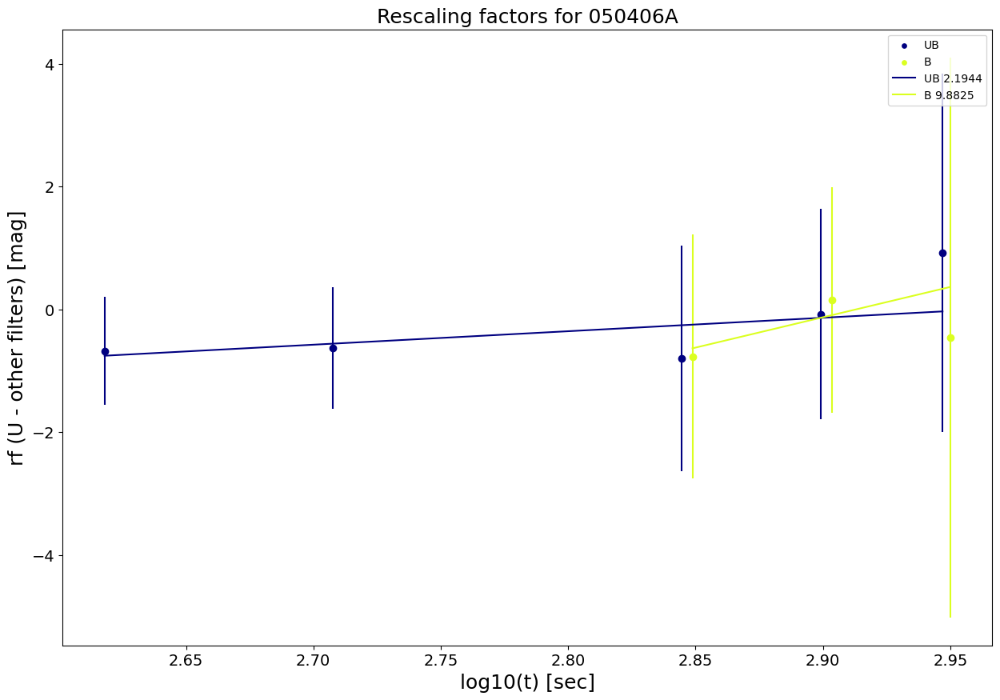


####################################################################################################

050408A
List of filters in the form: [Filter,number of points that have this filter]
[['Rc', 87], ['V', 14], ['Ic', 11], ['B', 10], ['U', 4], ['I', 2], ['R', 2], ['J', 2], ['K', 1], ['H', 1], ['z', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  Rc , with 87 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    B         10  4.113943  -1.286737           0.13           7.692308
1    B         10  4.136721  -1.496737           0.12           8.333333
2    V         14  4.150588   0.767587           0.31           3.225806
3    I          2  4.239350   0.999185           0.38           2.631579
4    R          2  4.239350   0.169711           0.28           3.571429
Rescaling results
------------------
     slope slope_err intercept inter_

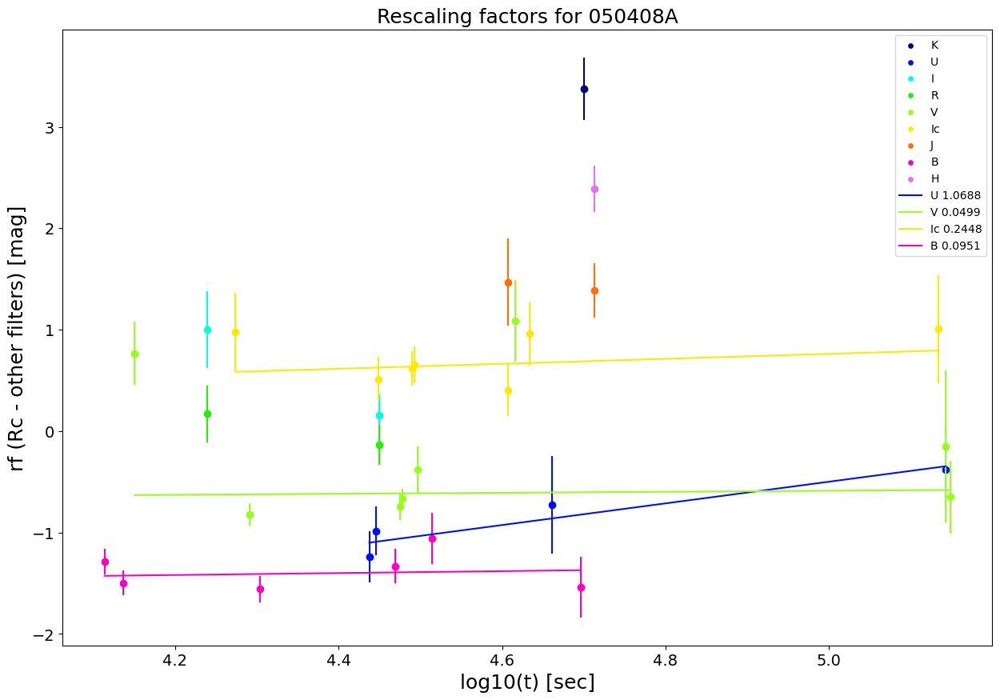


####################################################################################################

050416A
List of filters in the form: [Filter,number of points that have this filter]
[['Rc', 29], ['Ic', 12], ['K', 7], ['B', 5], ['V', 4], ['F775W', 3], ['F850LP', 1], ['U', 1], ['UVW2', 1], ['z', 1], ['UVM2', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  Rc , with 29 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0   Ic         12  4.912753   0.553494           0.60           1.666667
1    B          5  5.161368   0.699345           0.58           1.724138
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

050502A
List of filters in the form: [Filter,number of points that have this filter]
[['V', 10], ['Rc', 4]]
 
The most n

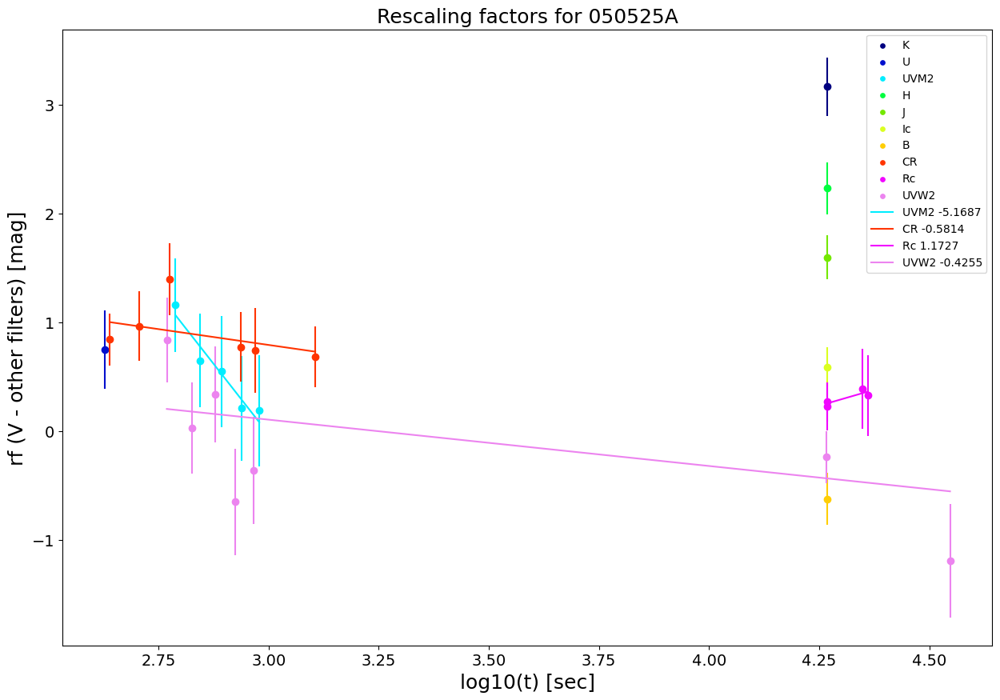


####################################################################################################

050603A
List of filters in the form: [Filter,number of points that have this filter]
[['V', 9]]
 
The most numerous filter is considered for rescaling
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/050603A_magAB_extcorr.txt has only one filter along all the LC, thus no rescaling is needed

####################################################################################################

050709A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 8], ['F814W', 3], ['V', 3], ['K', 3], ['I', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 8 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    I          1  5.327202  -0.551712           0.45           2.222222
1    V    

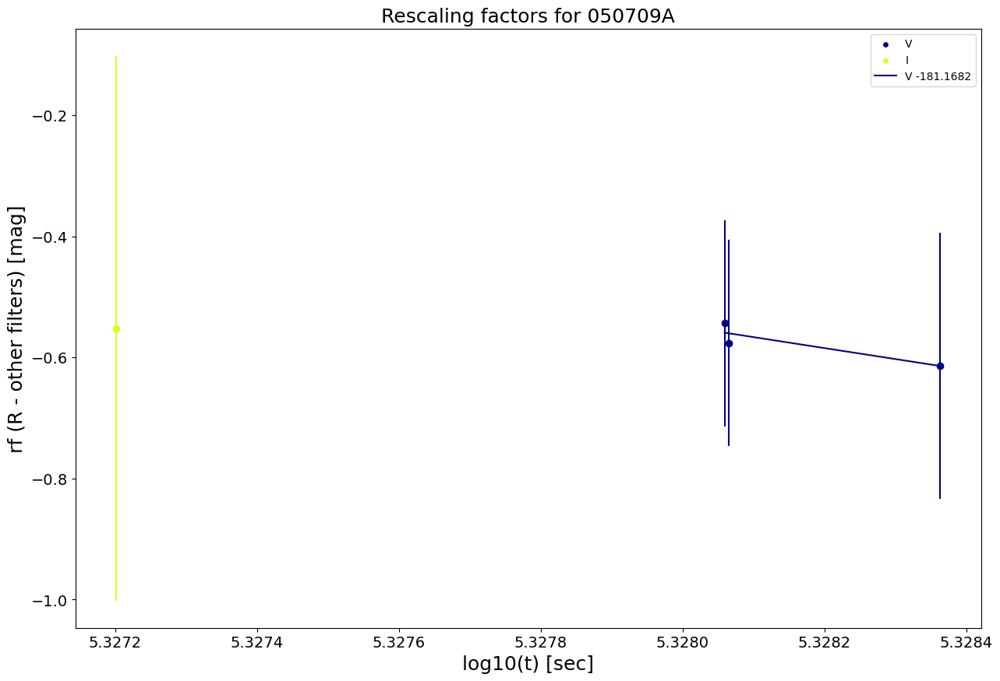


####################################################################################################

050724A
List of filters in the form: [Filter,number of points that have this filter]
[['I', 5], ['R', 3], ['J', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  I , with 5 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    R          3  4.623940  -0.202850           0.07          14.285714
1    J          1  4.683407   1.190843           0.64           1.562500
2    R          3  5.101852   0.027150           0.21           4.761905
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

050730A
List of filters in the form: [Filter,number of points that have this filter]
[['V', 21], ['I', 14], ['R', 9], ['r', 9], ['i', 8], 

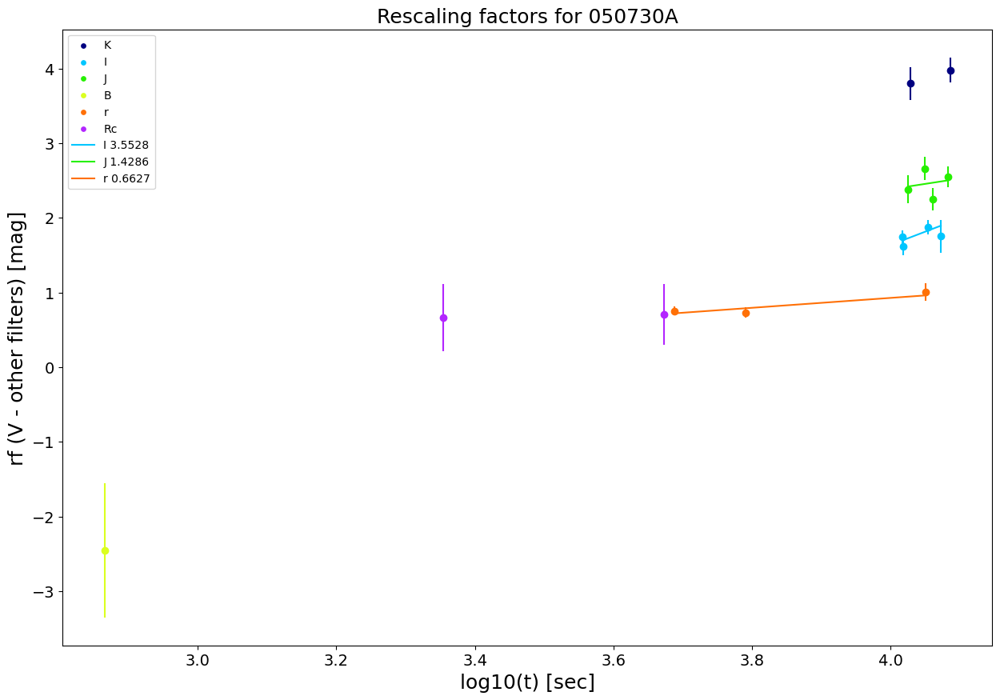


####################################################################################################

050801A
List of filters in the form: [Filter,number of points that have this filter]
[['CR', 46], ['V', 24], ['UVM2', 12], ['U', 12], ['B', 11], ['UVW1', 11], ['UVW2', 9], ['Rc', 3], ['J', 1], ['Ic', 1], ['K', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  CR , with 46 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
   band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0     V         24  1.755875  -0.070853           0.12           8.333333
1     V         24  1.857332  -0.040853           0.14           7.142857
2     V         24  1.949390  -0.180853           0.13           7.692308
3     V         24  1.995635  -0.140853           0.14           7.142857
4  UVW1         11  2.271842   0.735057           0.13           7.692308
Rescaling results
------------------
       slope slope_

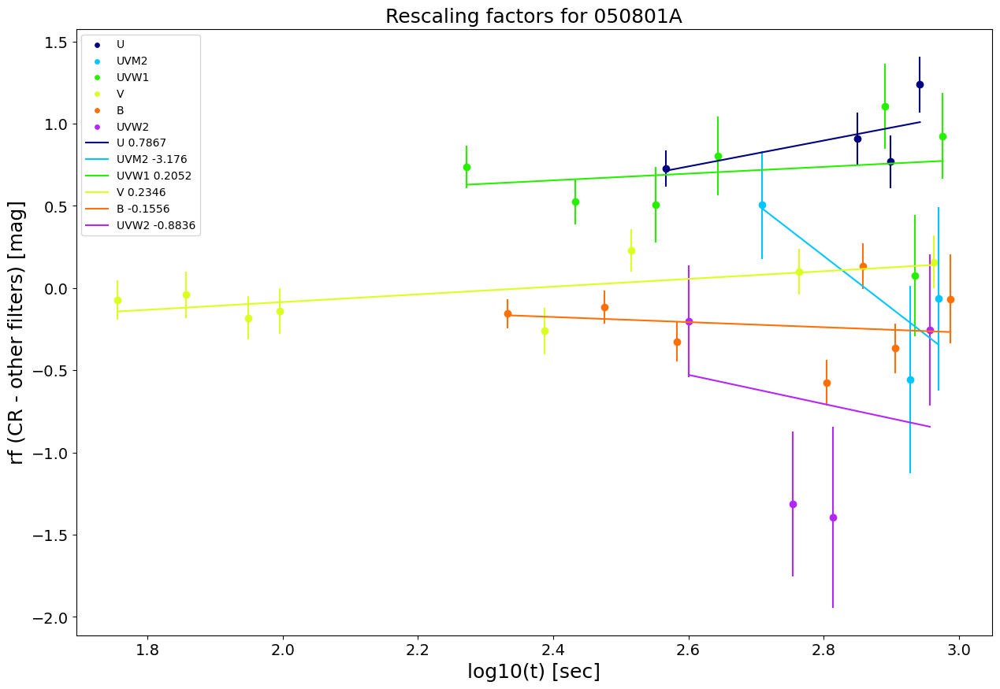


####################################################################################################

050802A
List of filters in the form: [Filter,number of points that have this filter]
[['V', 36], ['Rc', 31], ['B', 22], ['Ic', 15], ['UVW1', 13], ['U', 13], ['UVW2', 5], ['UVM2', 4]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  V , with 36 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
   band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0  UVW2          5  2.729974  -1.070585           2.00           0.500000
1  UVM2          4  2.864511  -1.373094           1.15           0.869565
2  UVW2          5  2.897627  -1.270585           2.10           0.476190
3  UVW2          5  2.941511  -1.570585           1.15           0.869565
4    Rc         31  4.494982   0.164597           0.18           5.555556
Rescaling results
------------------
       slope slope_err intercept inter_err acceptan

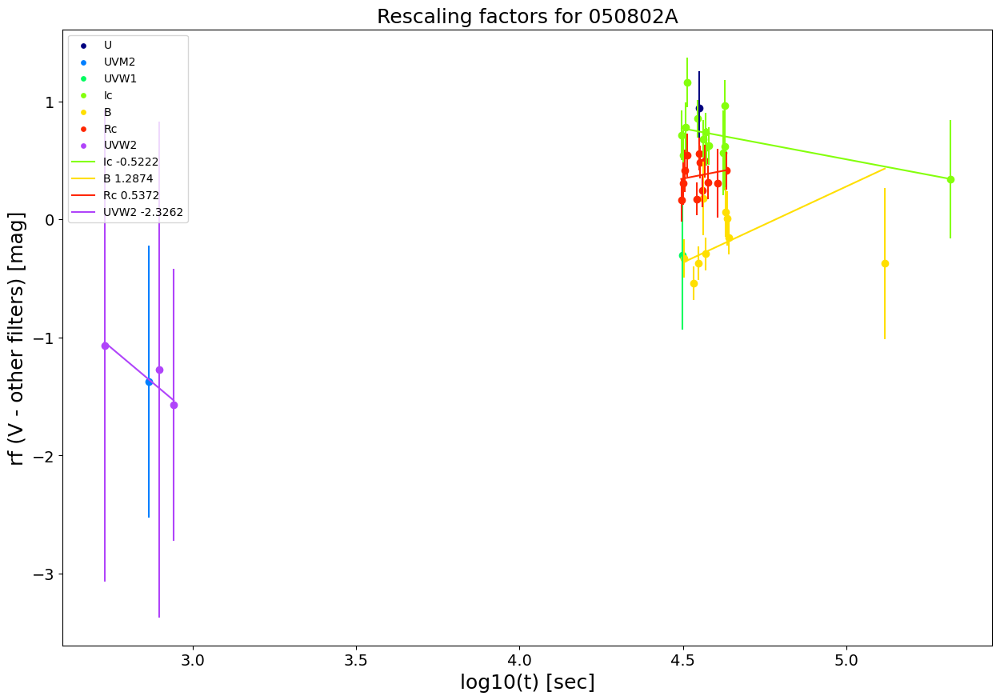


####################################################################################################

050803A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 5]]
 
The most numerous filter is considered for rescaling
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/050803A_magAB_extcorr.txt has only one filter along all the LC, thus no rescaling is needed

####################################################################################################

050814A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 4], ['K', 2], ['I', 2], ['i', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 4 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    I          2  4.705501   2.517902           0.27           3.703704
No filter with

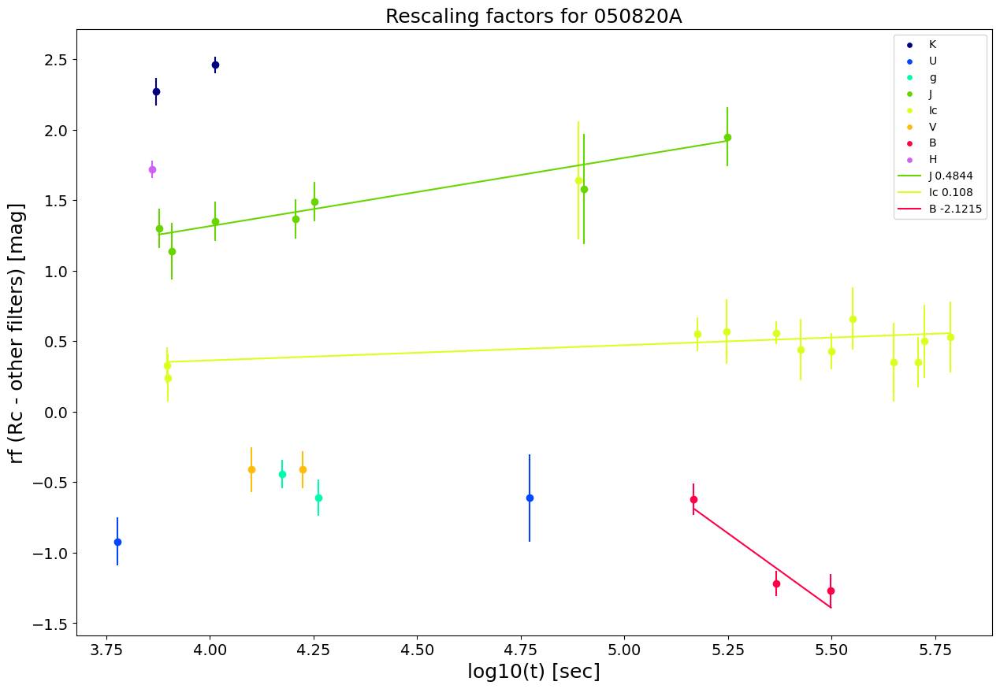


####################################################################################################

050824A
List of filters in the form: [Filter,number of points that have this filter]
[['Rc', 97], ['Ic', 15], ['B', 5], ['V', 2], ['U', 1], ['UVW1', 1], ['K', 1], ['UVM2', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  Rc , with 97 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
   band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0  UVM2          1  3.878522   0.692870           0.40           2.500000
1    Ic         15  4.017033  -0.189366           0.24           4.166667
2    Ic         15  4.204120   0.278010           0.12           8.333333
3    Ic         15  4.250420   0.278010           0.15           6.666667
4     B          5  4.263873  -0.442618           0.44           2.272727
Rescaling results
------------------
       slope slope_err intercept inter_err acceptance    

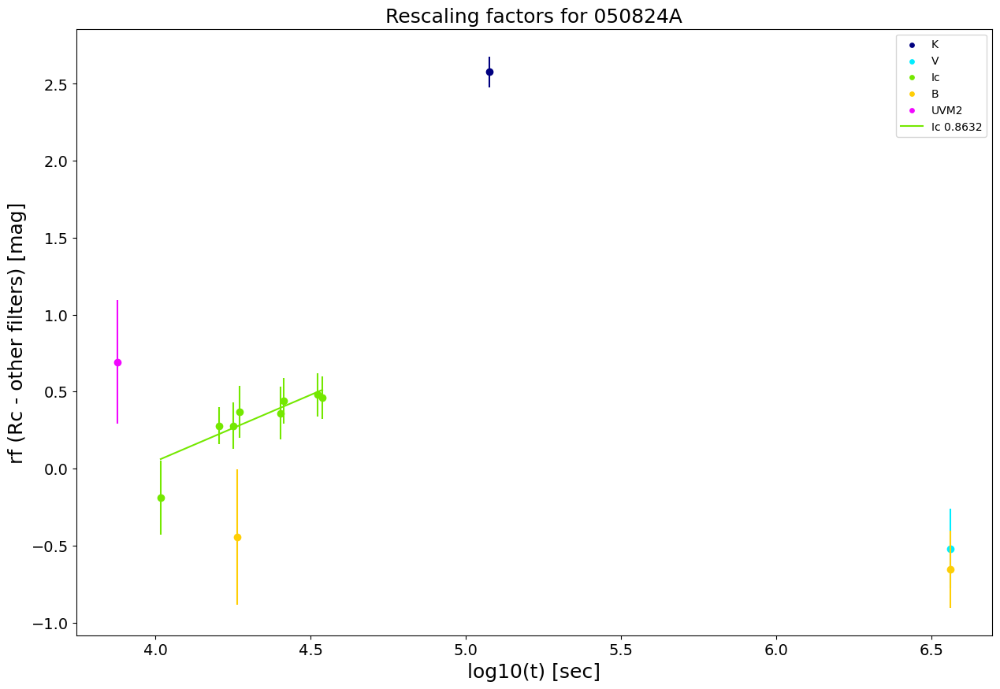


####################################################################################################

050826A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 4]]
 
The most numerous filter is considered for rescaling
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/050826A_magAB_extcorr.txt has only one filter along all the LC, thus no rescaling is needed

####################################################################################################

050904A
List of filters in the form: [Filter,number of points that have this filter]
[['J', 14], ['Ic', 6], ['K', 5], ['z', 5], ['H', 3], ['Y', 2]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  J , with 14 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    H          3  4.546543   0.831749           0.12           8.333333
1

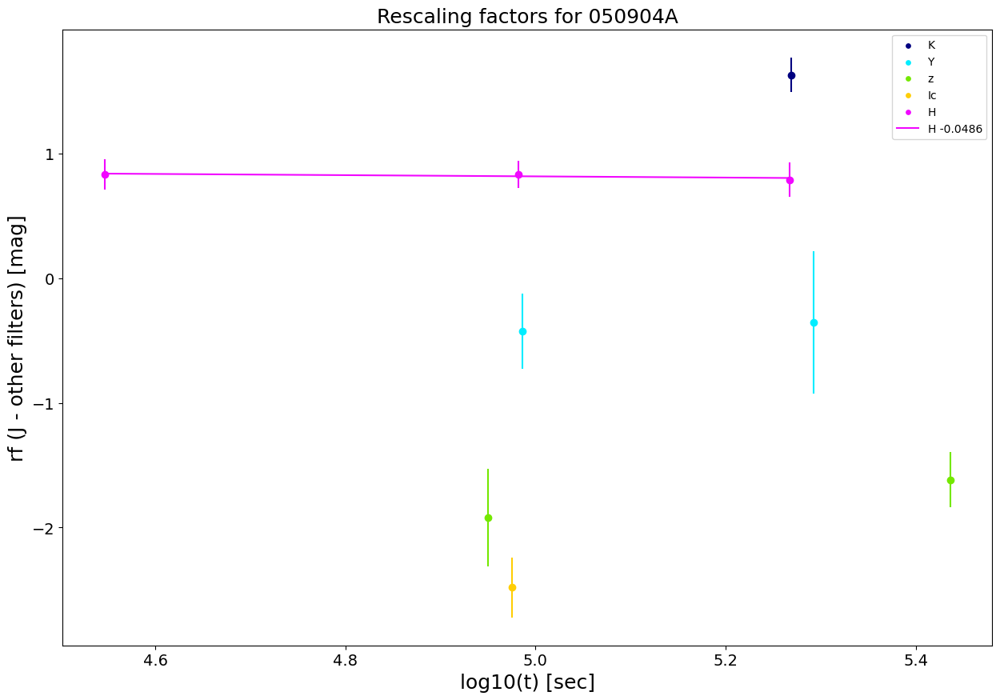


####################################################################################################

050908A
List of filters in the form: [Filter,number of points that have this filter]
[['Rc', 10], ['CR', 9], ['i', 5], ['I', 1], ['R', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  Rc , with 10 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    R          1  4.761995  -0.014019            0.5                2.0
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

050915A
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/050915A_magAB_extcorr.txt has only one data point along all the LC, thus no rescaling is needed

--------------------------------------------------------------------------------

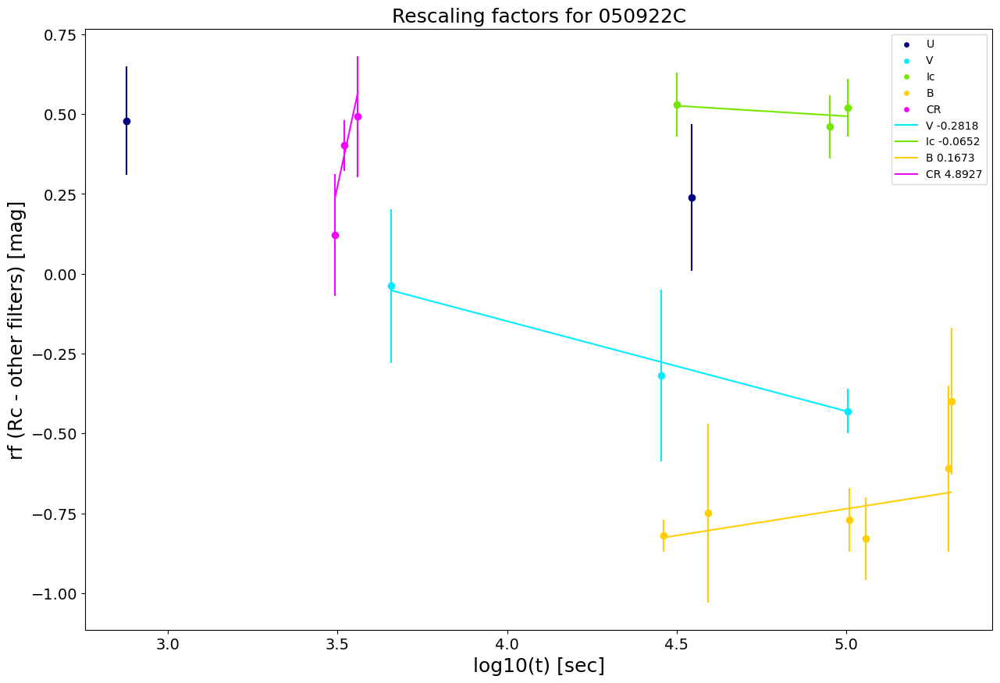


####################################################################################################

051006A
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/051006A_magAB_extcorr.txt has only one data point along all the LC, thus no rescaling is needed

----------------------------------------------------------------------------------------------------


####################################################################################################

051016B
List of filters in the form: [Filter,number of points that have this filter]
[['U', 1], ['UVW2', 1], ['R', 1], ['B', 1], ['UVW1', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  U , with 1 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
   band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0  UVW1          1  4.243992  -0.747759            0.7           1.428571
No filter with at least 3 rescaling factor

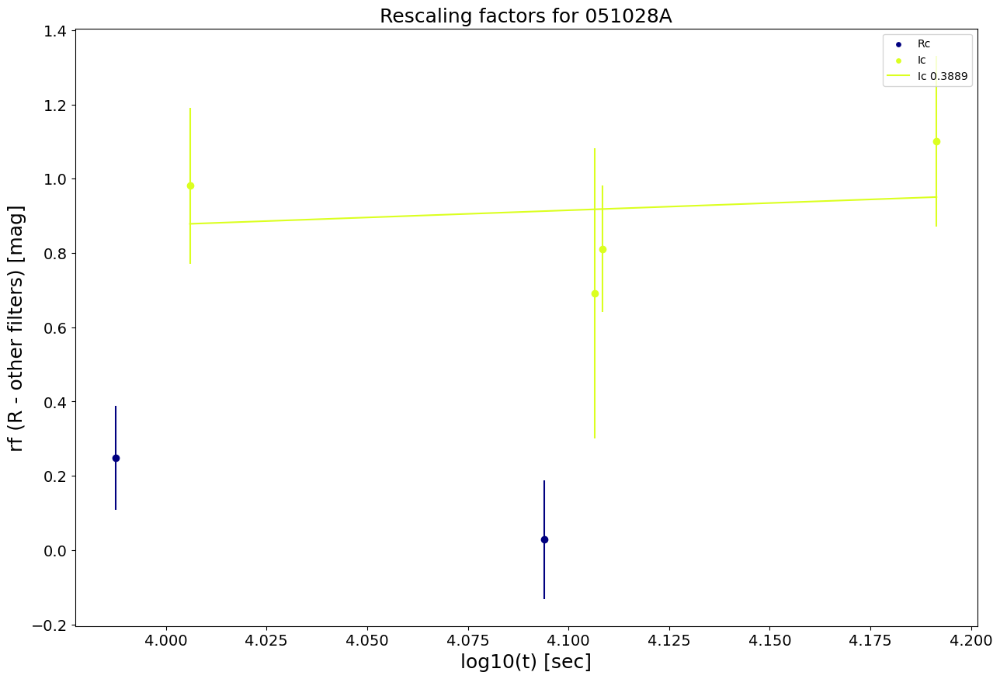


####################################################################################################

051109A
List of filters in the form: [Filter,number of points that have this filter]
[['unfiltered', 7], ['R', 3], ['V', 2], ['Rc', 1], ['r', 1], ['K', 1], ['H', 1], ['B', 1], ['I', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  unfiltered , with 7 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

051111A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 24], ['V', 16], ['B', 14], ['I', 12], ['Rc', 4], ['unfiltered', 2], ['U', 1], ['K', 1], ['H', 1], ['UVW1', 1], ['J', 1]]
 
The most numerous filter is 

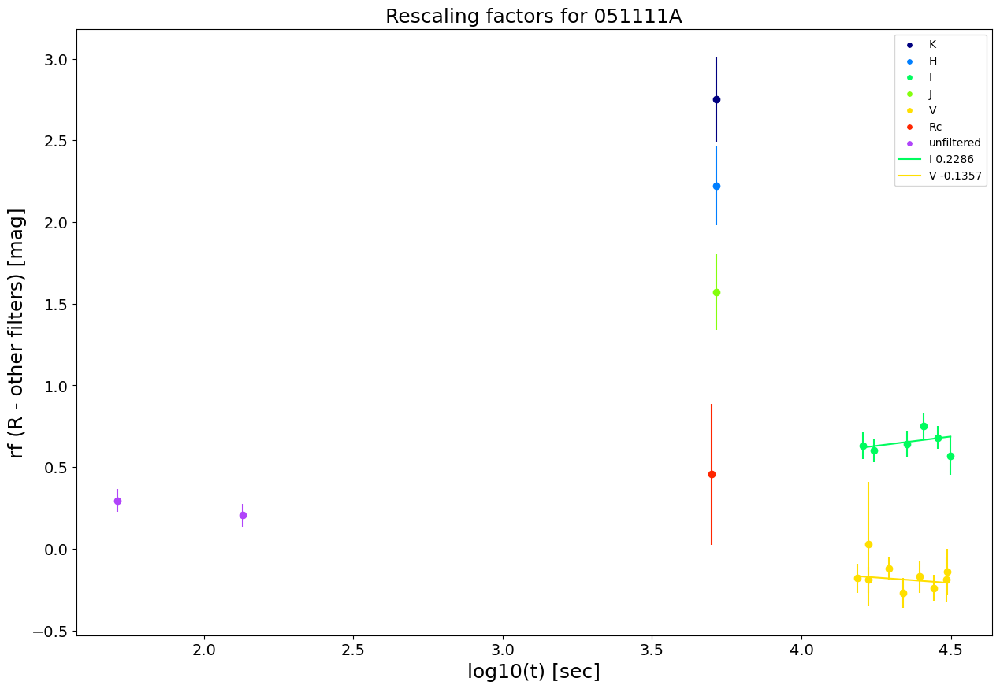


####################################################################################################

051221A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 6], ['R', 4], ['i', 2], ['z', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 6 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    i          2  4.991165  -0.117537           0.31           3.225806
1    i          2  5.263689  -0.127537           0.47           2.127660
2    z          1  5.266460   0.134746           0.52           1.923077
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

060108A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 9], ['i', 9], ['B', 4], ['V', 2], ['K', 1]]
 


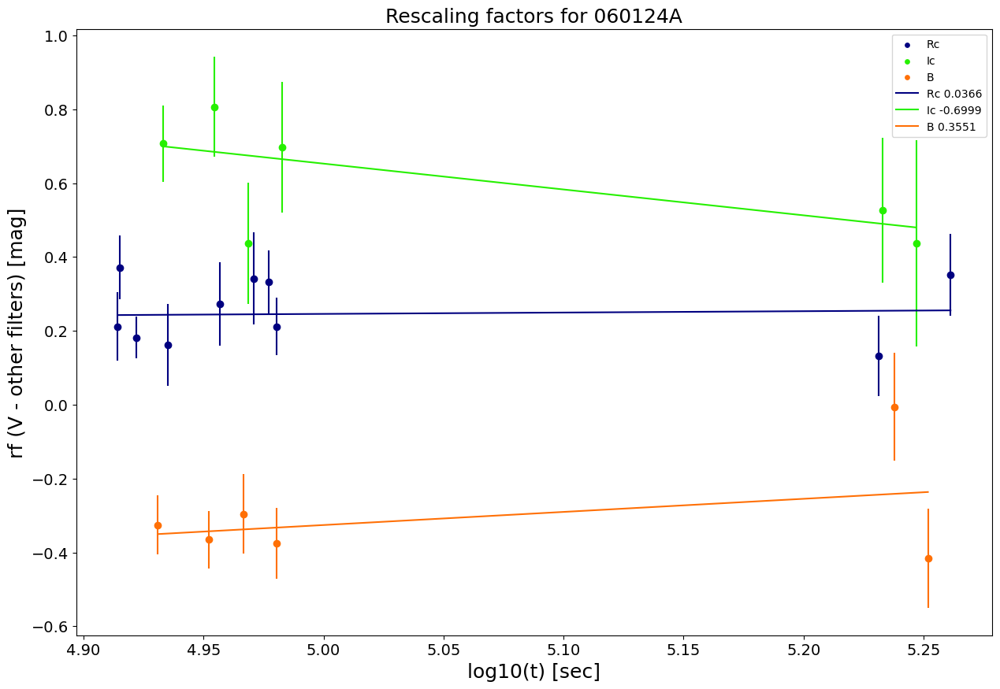


####################################################################################################

060204B
List of filters in the form: [Filter,number of points that have this filter]
[['i', 1], ['R', 1], ['I', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  i , with 1 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

060206A
List of filters in the form: [Filter,number of points that have this filter]
[['Rc', 141], ['CR', 100], ['r', 18], ['i', 6], ['z', 5], ['I', 4], ['V', 3], ['K', 2], ['R', 2], ['Ic', 2], ['J', 2], ['H', 1], ['unfiltered', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this G

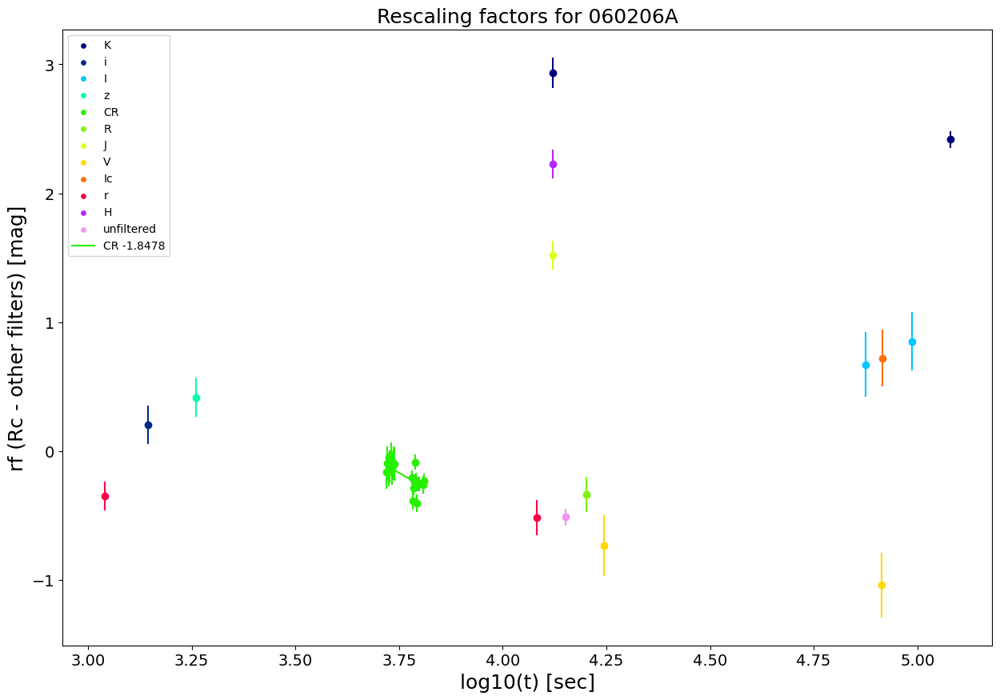


####################################################################################################

060210A
List of filters in the form: [Filter,number of points that have this filter]
[['Rc', 25], ['Ic', 14], ['i', 10], ['CR', 10], ['R', 3], ['z', 3], ['K', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  Rc , with 25 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0   CR         10  2.577377  -0.186029          0.440           2.272727
1    i         10  3.153845   1.195310          0.310           3.225806
2   CR         10  3.354665  -0.035029          0.312           3.205128
3   Ic         14  3.363386   1.068938          0.112           8.928571
4    i         10  3.463116   1.015310          0.259           3.861004
Rescaling results
------------------
     slope slope_err intercept inter_err acceptance red_chi2  \
CR  0.3412  

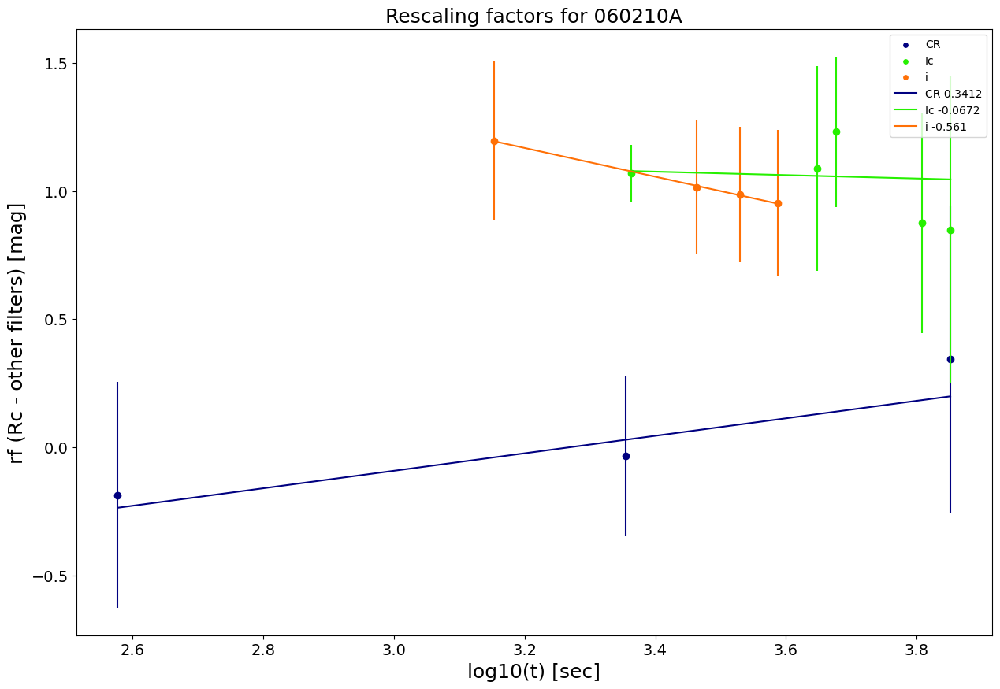


####################################################################################################

060218A
List of filters in the form: [Filter,number of points that have this filter]
[['V', 60], ['B', 52], ['R', 51], ['I', 26], ['Rc', 22], ['J', 14], ['Ic', 14], ['H', 12], ['K', 10], ['U', 9], ['r', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  V , with 60 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    J         14  5.235367  -0.816198           0.15           6.666667
1    H         12  5.235367  -0.518417           0.27           3.703704
2    K         10  5.235367  -0.293484           0.54           1.851852
3   Rc         22  5.240367  -0.027570           0.12           8.333333
4   Rc         22  5.241659  -0.027570           0.12           8.333333
Rescaling results
------------------
     slope slope_err intercept in

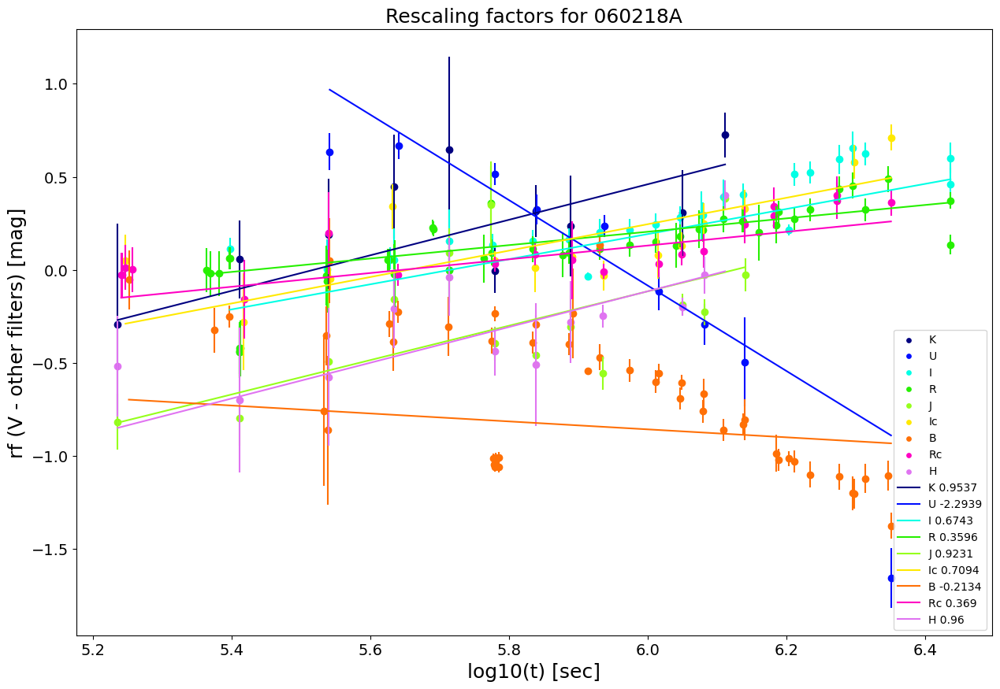


####################################################################################################

060223A
List of filters in the form: [Filter,number of points that have this filter]
[['V', 4]]
 
The most numerous filter is considered for rescaling
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/060223A_magAB_extcorr.txt has only one filter along all the LC, thus no rescaling is needed

####################################################################################################

060319A
List of filters in the form: [Filter,number of points that have this filter]
[['K', 2]]
 
The most numerous filter is considered for rescaling
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/060319A_magAB_extcorr.txt has only one filter along all the LC, thus no rescaling is needed

####################################################################################################

060418A
List of filters in the form: [Filter,number of po

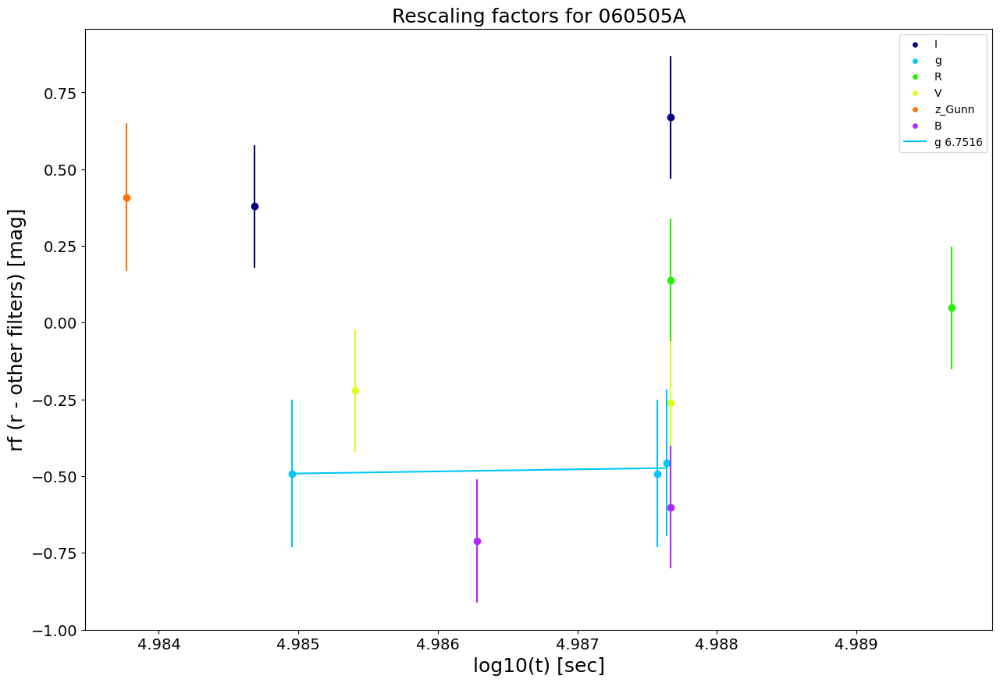


####################################################################################################

060510B
List of filters in the form: [Filter,number of points that have this filter]
[['R', 4], ['z', 4], ['i', 3], ['Rc', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 4 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

060512A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 20], ['V', 4], ['U', 4], ['white', 4], ['K', 2], ['R', 2], ['CR', 2], ['B', 2]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 20 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|

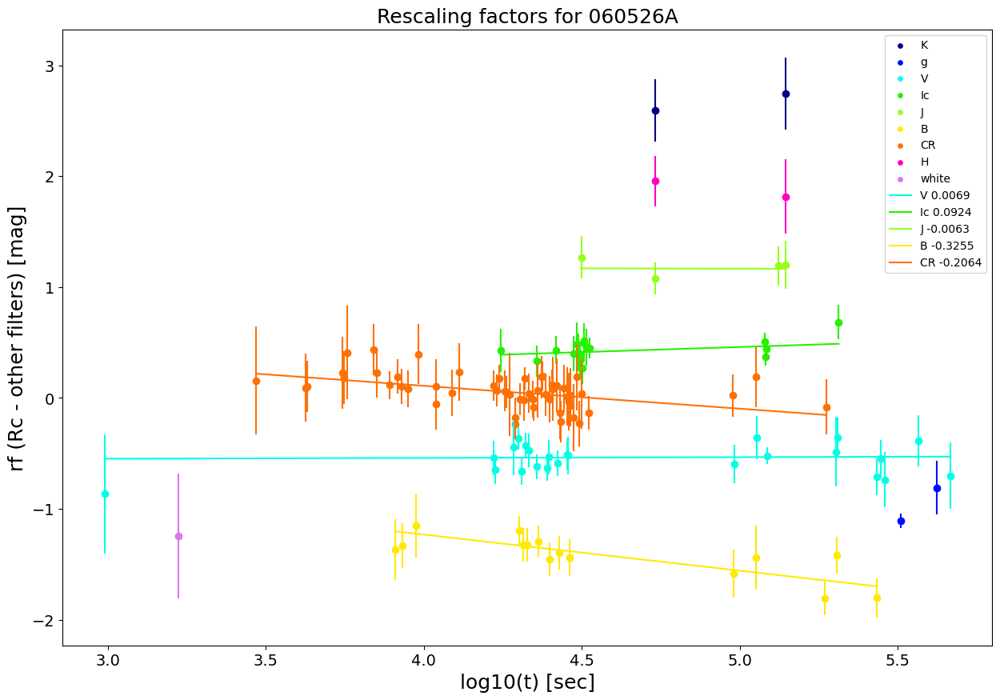


####################################################################################################

060602A
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/060602A_magAB_extcorr.txt has only one data point along all the LC, thus no rescaling is needed

----------------------------------------------------------------------------------------------------


####################################################################################################

060604A
List of filters in the form: [Filter,number of points that have this filter]
[['white', 3], ['R', 2], ['U', 1], ['B', 1], ['UVW1', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  white , with 3 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

#########

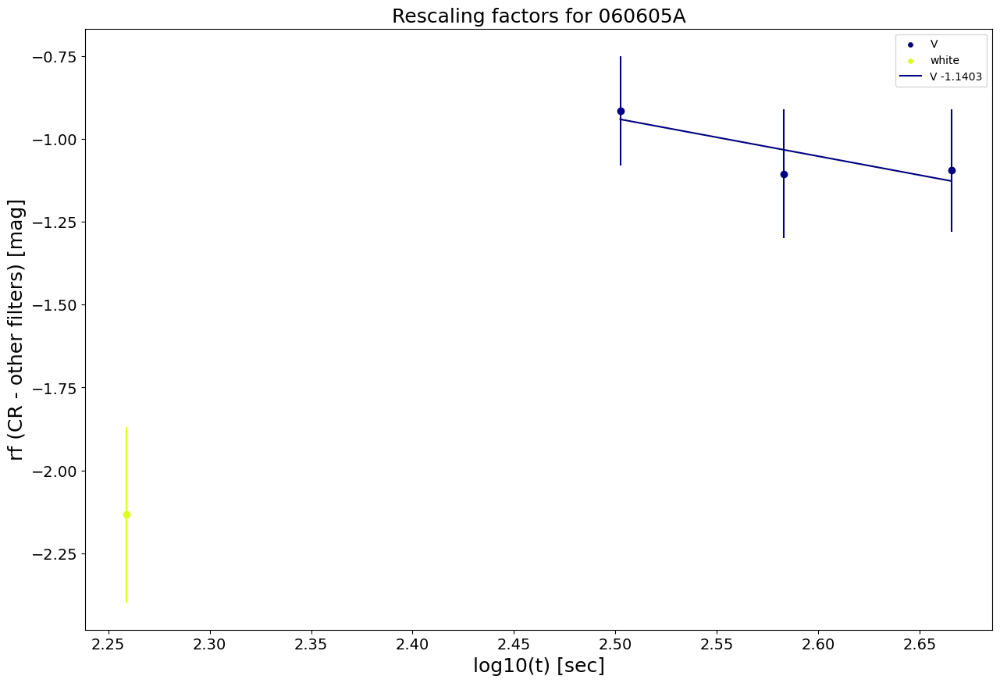


####################################################################################################

060607A
List of filters in the form: [Filter,number of points that have this filter]
[['H', 40], ['B', 36], ['g', 26], ['r', 25], ['i', 19], ['V', 13], ['white', 11], ['U', 3], ['Rc', 1], ['Ic', 1], ['K', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  H , with 40 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
    band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0      B         36  2.064083  -3.427275           0.17           5.882353
1  white         11  2.120574  -2.835148           0.12           8.333333
2      B         36  2.167022  -3.257275           0.12           8.333333
3      r         25  2.176381  -1.951680           0.08          12.500000
4      B         36  2.249932  -3.187275           0.11           9.090909
Rescaling results
------------------
        s

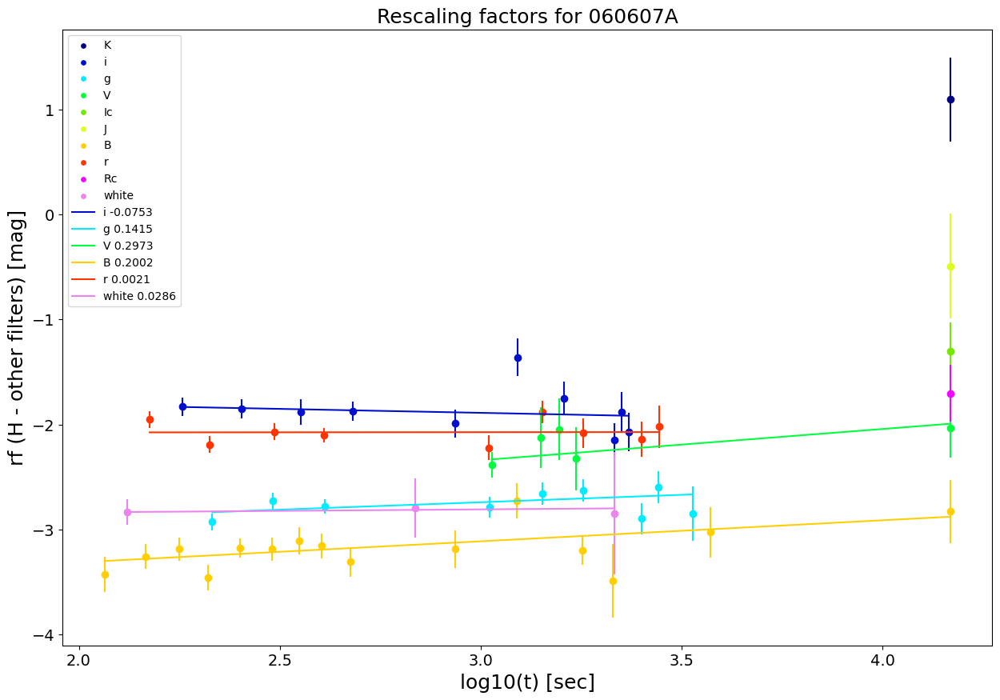


####################################################################################################

060614A
List of filters in the form: [Filter,number of points that have this filter]
[['Rc', 50], ['U', 15], ['B', 12], ['UVW1', 11], ['UVW2', 9], ['UVM2', 9], ['white', 9], ['Ic', 8], ['V', 7], ['J', 2]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  Rc , with 50 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
   band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0  UVW1         11  3.790039   0.915847           0.35           2.857143
1     B         12  4.015590  -0.171753           0.24           4.166667
2     V          7  4.224157  -0.263112           0.32           3.125000
3  UVM2          9  4.239425   0.566606           0.91           1.098901
4  UVW1         11  4.447391   1.085847           0.42           2.380952
Rescaling results
------------------
       slope slope_err inter

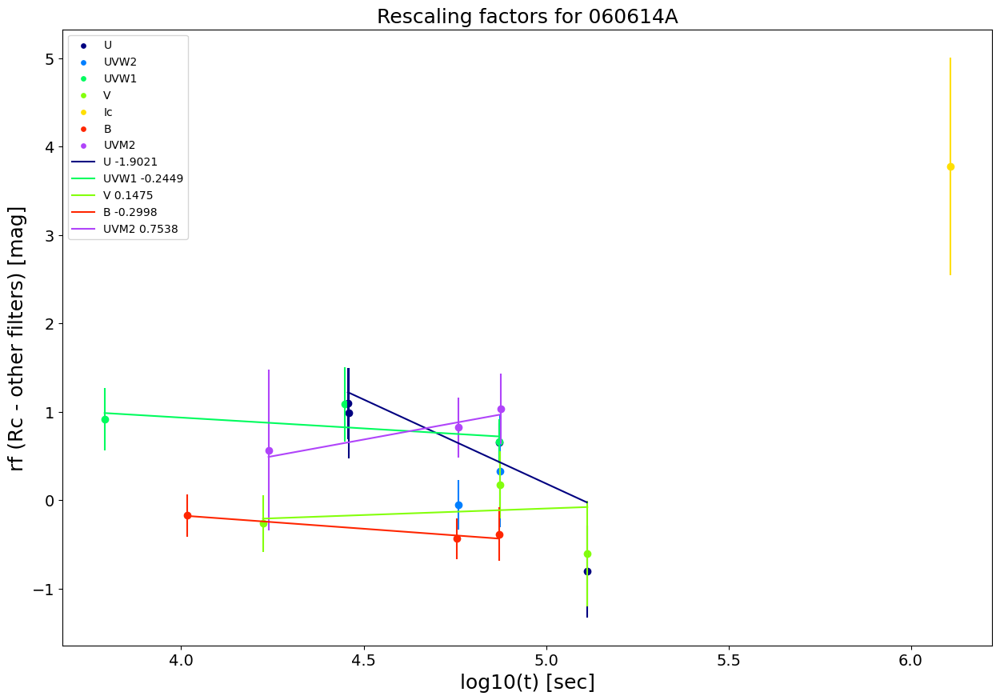


####################################################################################################

060707A
List of filters in the form: [Filter,number of points that have this filter]
[['Unfiltered', 2], ['B', 1], ['white', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  Unfiltered , with 2 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

060708A
List of filters in the form: [Filter,number of points that have this filter]
[['white', 3], ['U', 2], ['B', 2], ['V', 2], ['UVW1', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  white , with 3 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-

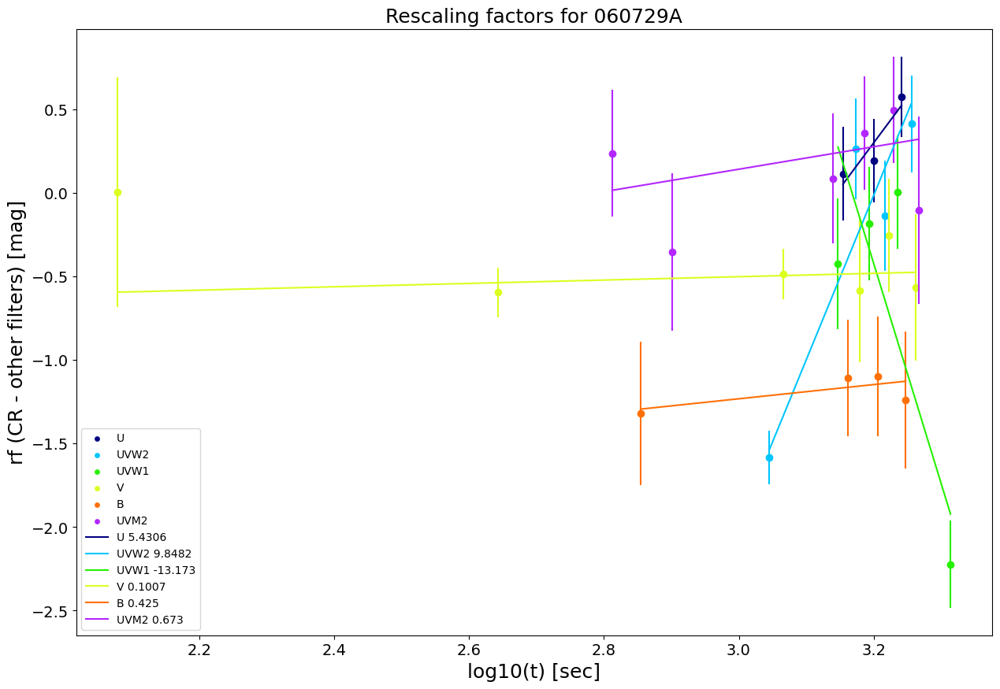


####################################################################################################

060805A
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/060805A_magAB_extcorr.txt has only limiting magnitudes, thus it will be skipped

----------------------------------------------------------------------------------------------------


####################################################################################################

060814A
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/060814A_magAB_extcorr.txt has only limiting magnitudes, thus it will be skipped

----------------------------------------------------------------------------------------------------


####################################################################################################

060904A
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/060904A_magAB_extcorr.txt has only limiting magnitudes, thus it will be skipped

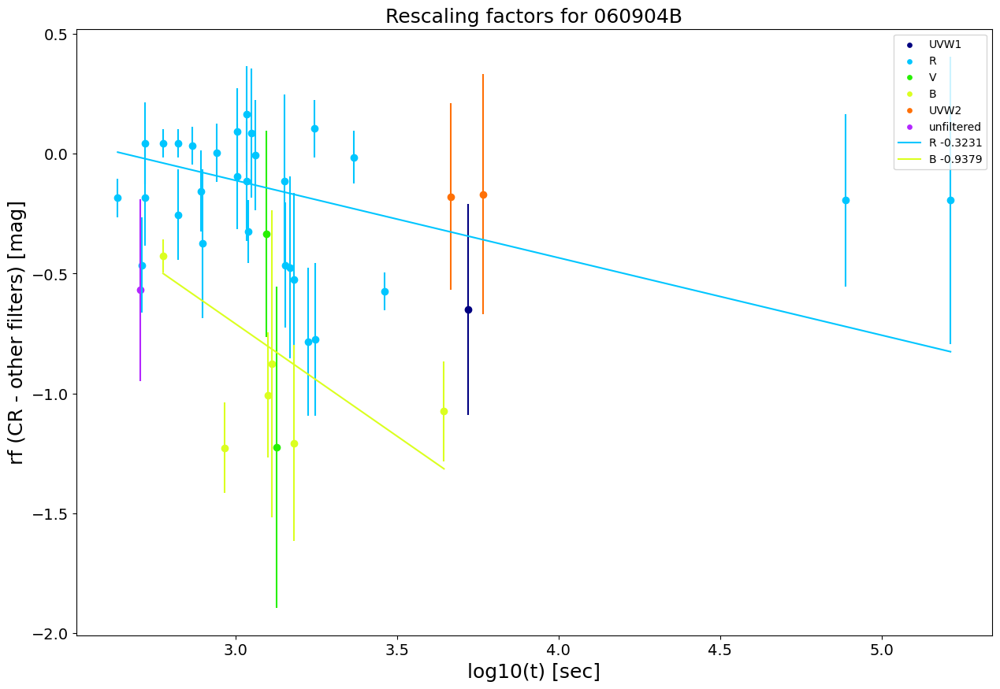


####################################################################################################

060906A
List of filters in the form: [Filter,number of points that have this filter]
[['i', 21], ['Rc', 21], ['z', 19], ['g', 15], ['clear', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  i , with 21 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0   Rc         21  3.952792  -0.090767           0.35           2.857143
1    z         19  3.986772   0.021097           0.54           1.851852
2   Rc         21  4.047664  -0.010767           0.35           2.857143
3    z         19  4.084934   0.131097           0.51           1.960784
4   Rc         21  4.135451  -0.030767           0.31           3.225806
Rescaling results
------------------
     slope slope_err intercept inter_err acceptance red_chi2  \
Rc  0.3149    0.2971   -1.3193 

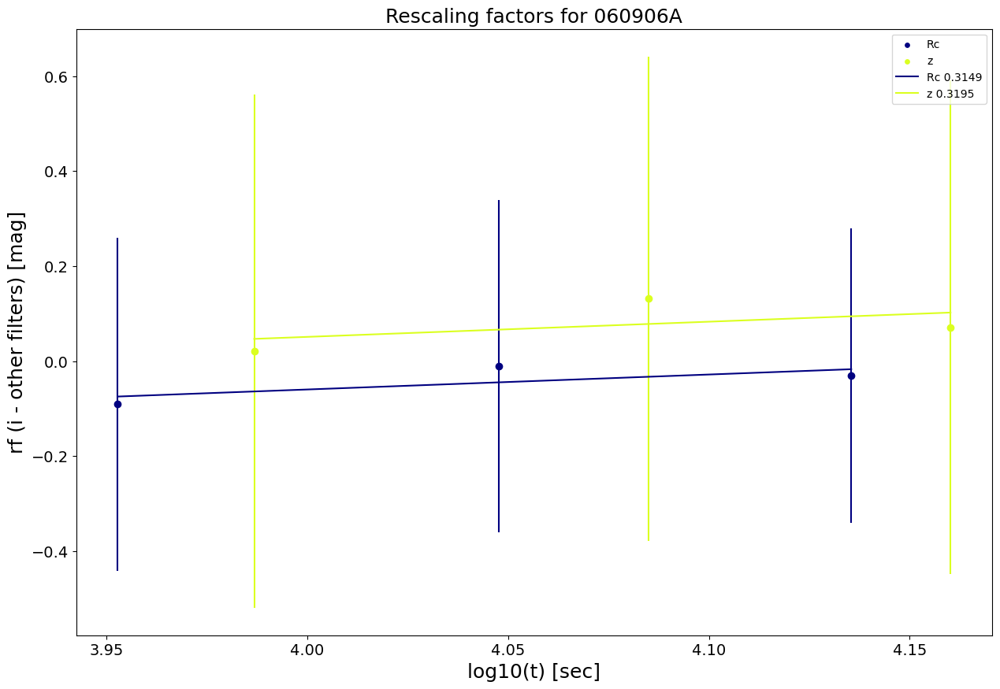


####################################################################################################

060908A
List of filters in the form: [Filter,number of points that have this filter]
[['Rc', 63], ['i', 17], ['z', 13], ['V', 12], ['white', 12], ['g', 9], ['Ic', 4], ['K', 2], ['U', 1], ['H', 1], ['B', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  Rc , with 63 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
    band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0  white         12  1.980003  -0.339615           0.17           5.882353
1  white         12  2.062582  -0.539615           0.18           5.555556
2  white         12  2.131939  -0.249615           0.20           5.000000
3  white         12  2.191730  -0.379615           0.23           4.347826
4  white         12  2.244277  -0.399615           0.23           4.347826
Rescaling results
------------------
        sl

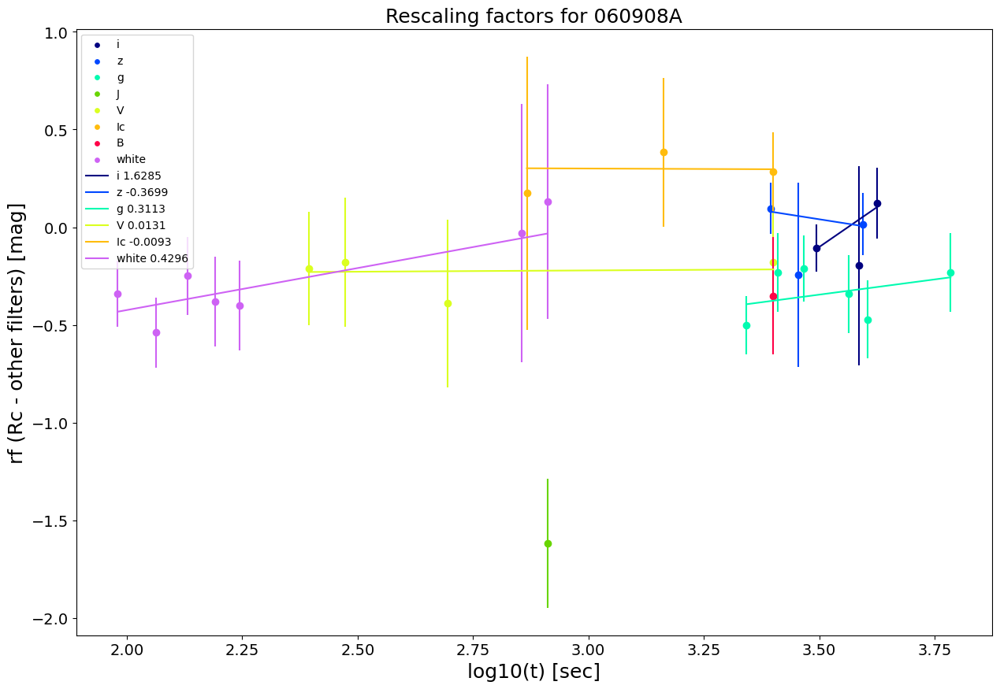


####################################################################################################

060912A
List of filters in the form: [Filter,number of points that have this filter]
[['Rc', 10], ['CR', 10], ['white', 7], ['U', 6], ['V', 4], ['B', 4], ['UVM2', 3], ['UVW1', 2]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  Rc , with 10 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    U          6  4.127753   0.449127           0.51           1.960784
1    B          4  4.313867  -1.282577           0.45           2.222222
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

060923A
List of filters in the form: [Filter,number of points that have this filter]
[['K', 3], ['Rc', 2], ['Ic', 1]]
 
The most numerous filter is conside

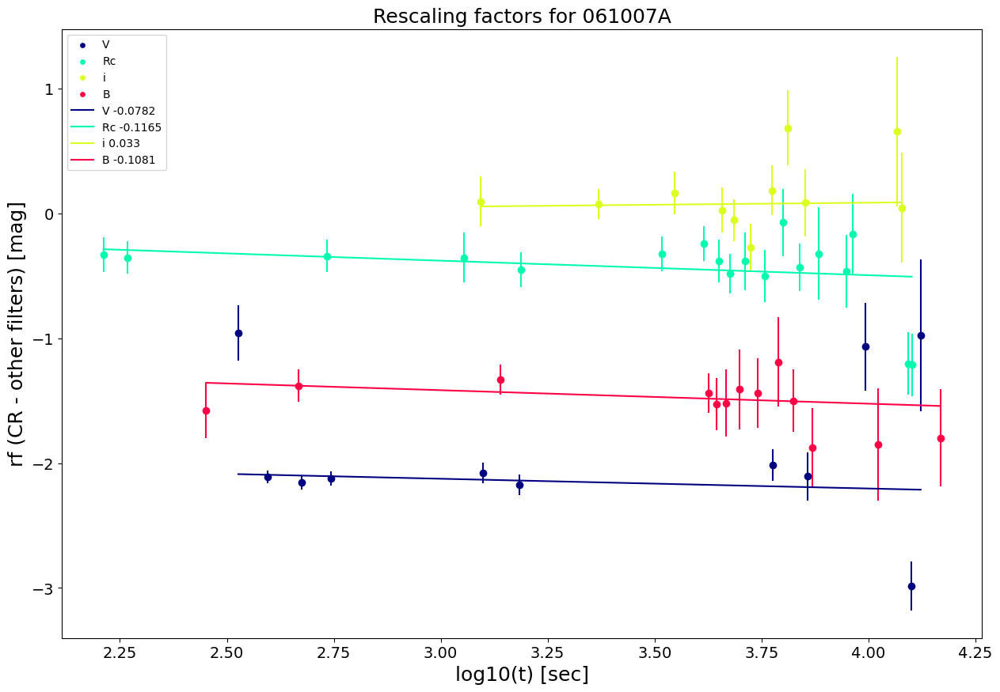


####################################################################################################

061021A
List of filters in the form: [Filter,number of points that have this filter]
[['white', 4], ['U', 2], ['UVW1', 2], ['B', 2], ['UVM2', 2], ['V', 2], ['UVW2', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  white , with 4 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
   band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0  UVW1          2  3.651036   0.213278           0.43           2.325581
1     U          2  3.670478  -0.108813           0.20           5.000000
2     B          2  3.800683  -0.983633           0.44           2.272727
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

061110A
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/06111

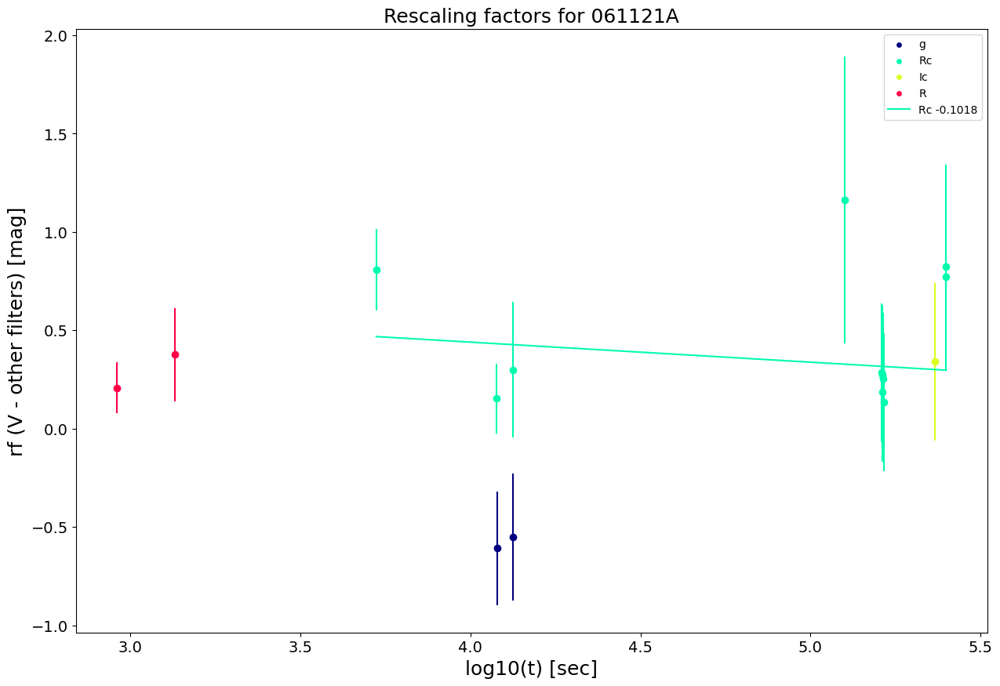


####################################################################################################

061126A
List of filters in the form: [Filter,number of points that have this filter]
[['Rc', 92], ['clear', 45], ['J', 43], ['K', 36], ['i', 29], ['B', 23], ['H', 21], ['Ic', 19], ['V', 18], ['U', 13], ['white', 9], ['r', 8], ['UVM2', 3], ['g', 3], ['UVW1', 2]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  Rc , with 92 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
    band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0  clear         45  2.412796   0.691888           0.14           7.142857
1      J         43  2.418301   2.247317           0.10          10.000000
2      K         36  2.418301   3.904256           0.10          10.000000
3      H         21  2.418301   3.155200           0.10          10.000000
4      J         43  2.451479   2.257317           0.10          10.000000
Re

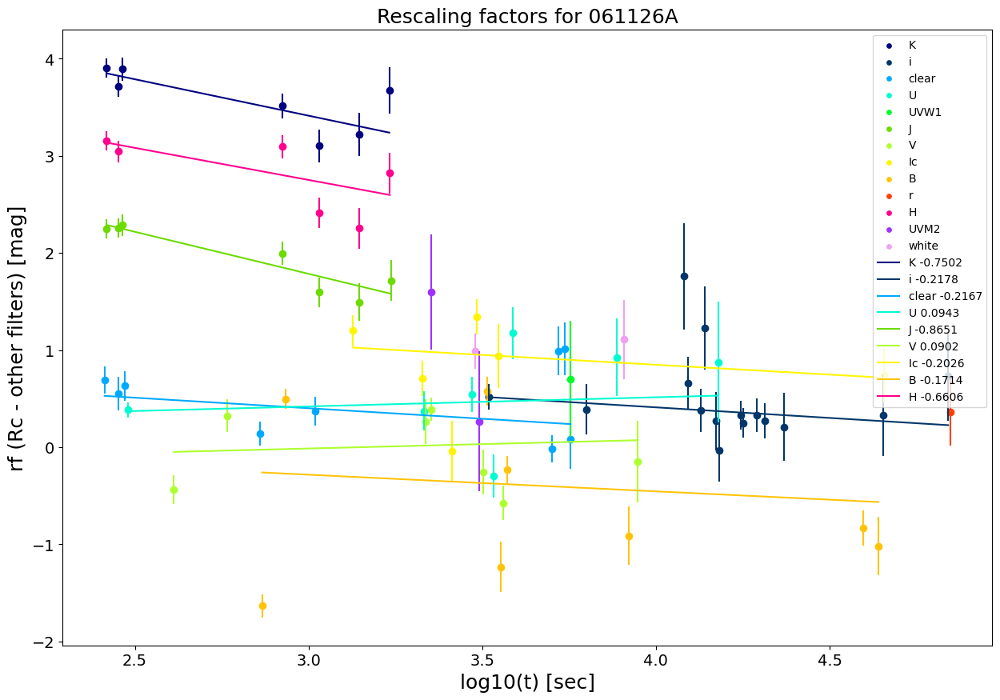


####################################################################################################

061201A
List of filters in the form: [Filter,number of points that have this filter]
[['white', 5], ['UVW1', 4], ['UVM2', 3], ['U', 2], ['UVW2', 1], ['I', 1], ['R', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  white , with 5 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
   band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0     U          2  3.520942   0.227924           0.70           1.428571
1     U          2  3.530225   0.067924           0.84           1.190476
2  UVW1          4  3.967244   0.236119           0.90           1.111111
3  UVW1          4  3.977920   0.186119           0.76           1.315789
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

061222A
C:/Us

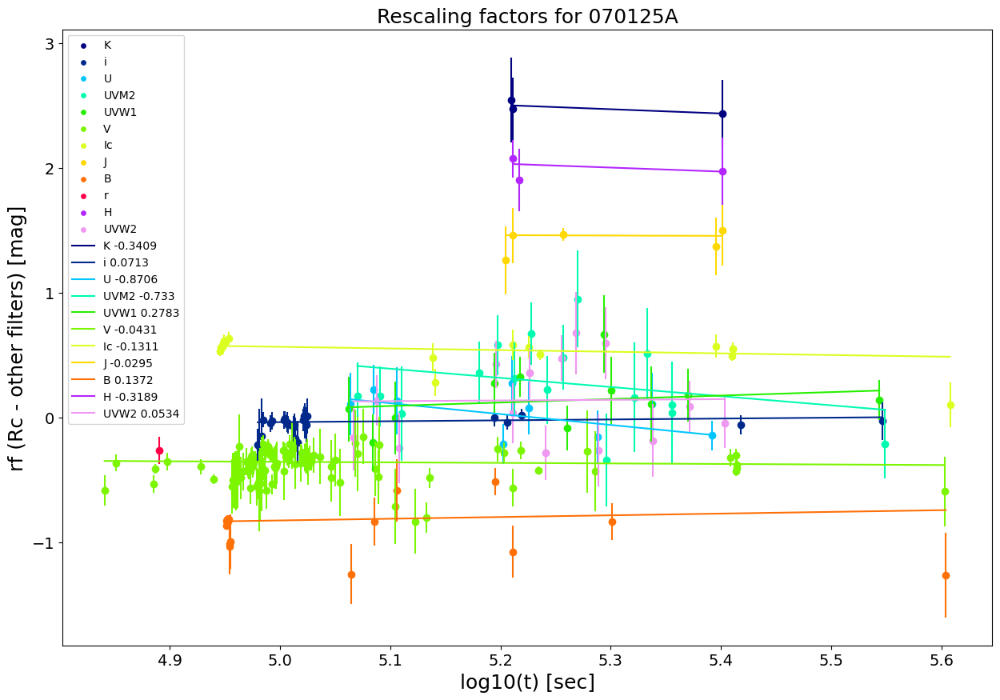


####################################################################################################

070129A
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/070129A_magAB_extcorr.txt has only one data point along all the LC, thus no rescaling is needed

----------------------------------------------------------------------------------------------------


####################################################################################################

070208A
List of filters in the form: [Filter,number of points that have this filter]
[['i', 10], ['R', 10], ['Rc', 7], ['z', 6], ['r', 5], ['g', 3], ['K', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  i , with 10 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    R         10  3.064458  -0.448864           0.15           6.666667
1    r          

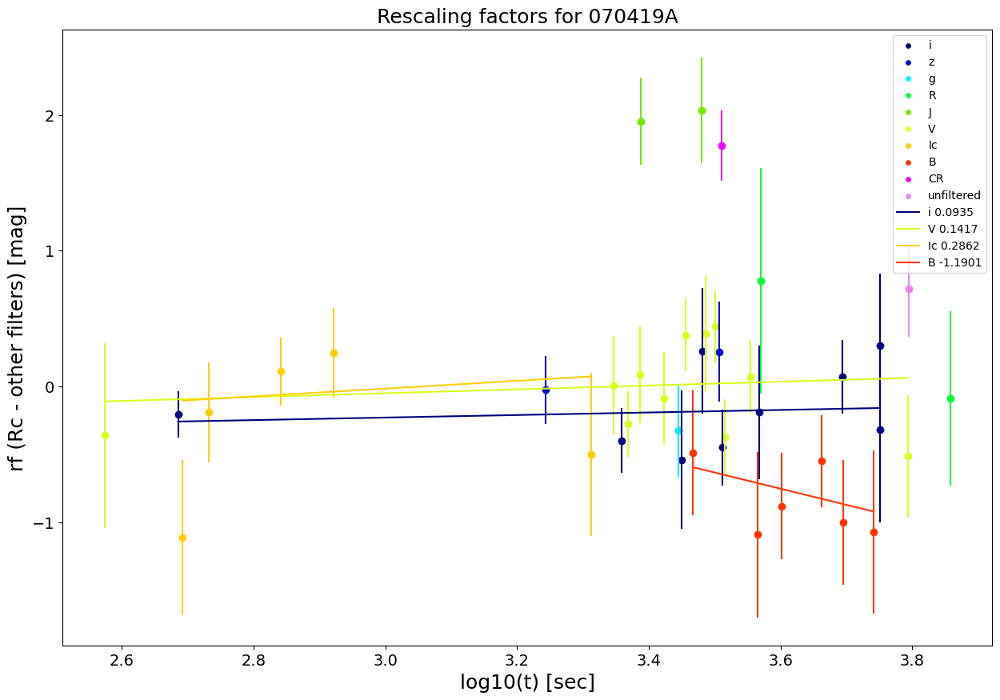


####################################################################################################

070419B
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/070419B_magAB_extcorr.txt has only limiting magnitudes, thus it will be skipped

----------------------------------------------------------------------------------------------------


####################################################################################################

070506A
List of filters in the form: [Filter,number of points that have this filter]
[['white', 4], ['B', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  white , with 4 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

##########################################################

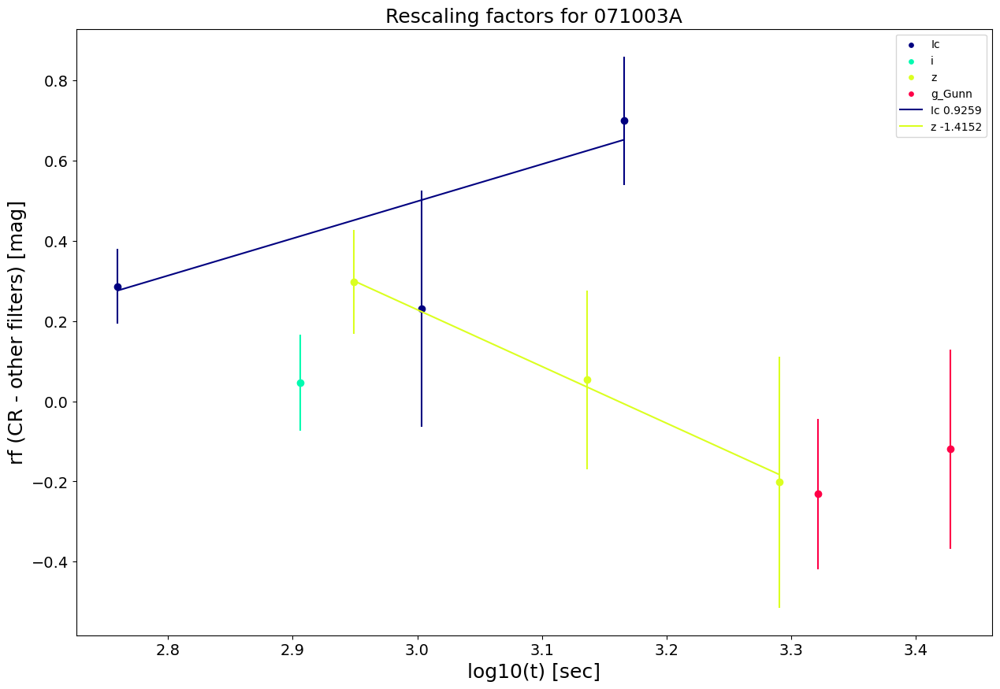


####################################################################################################

071010A
List of filters in the form: [Filter,number of points that have this filter]
[['Rc', 27], ['V', 15], ['CR', 12], ['H', 8], ['J', 7], ['K', 7], ['Ic', 7], ['z', 3], ['i', 3], ['U', 2], ['B', 2]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  Rc , with 27 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0   CR         12  2.507181   0.348736           0.31           3.225806
1    K          7  2.934700   3.278465           0.31           3.225806
2    K          7  4.071772   3.448676           0.09          11.111111
3    V         15  4.881316  -0.508069           0.08          12.500000
4    V         15  4.881850  -0.508069           0.08          12.500000
Rescaling results
------------------
     slope slope_err intercept inter_

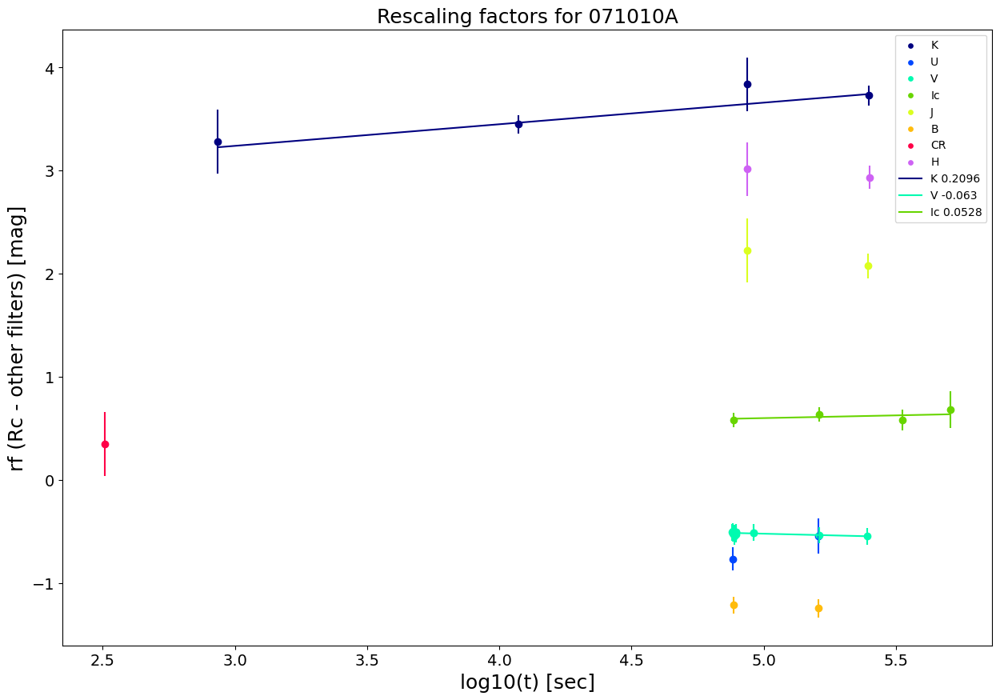


####################################################################################################

071010B
List of filters in the form: [Filter,number of points that have this filter]
[['Rc', 54], ['CR', 27], ['R', 9], ['V', 3], ['Ic', 2]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  Rc , with 54 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0   CR         27  4.229618   0.767932          0.069          14.492754
1   CR         27  4.242904   0.743932          0.063          15.873016
2   CR         27  4.261767   0.790932          0.057          17.543860
3   CR         27  4.282420   0.707932          0.090          11.111111
4   CR         27  4.365881   0.720932          0.059          16.949153
Rescaling results
------------------
    slope slope_err intercept inter_err acceptance red_chi2  \
CR -0.352    0.2679    2.2577    1.

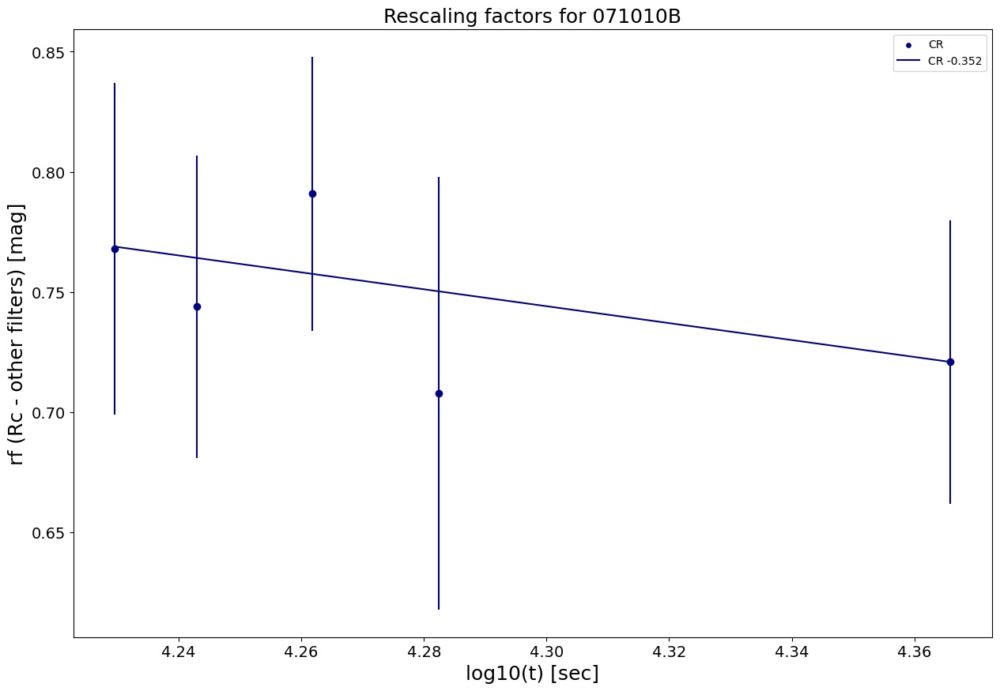


####################################################################################################

071020A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 3], ['Ic', 2], ['Rc', 2], ['H', 1], ['I', 1], ['Unfiltered', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 3 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

071021A
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/071021A_magAB_extcorr.txt has only limiting magnitudes, thus it will be skipped

----------------------------------------------------------------------------------------------------


###############

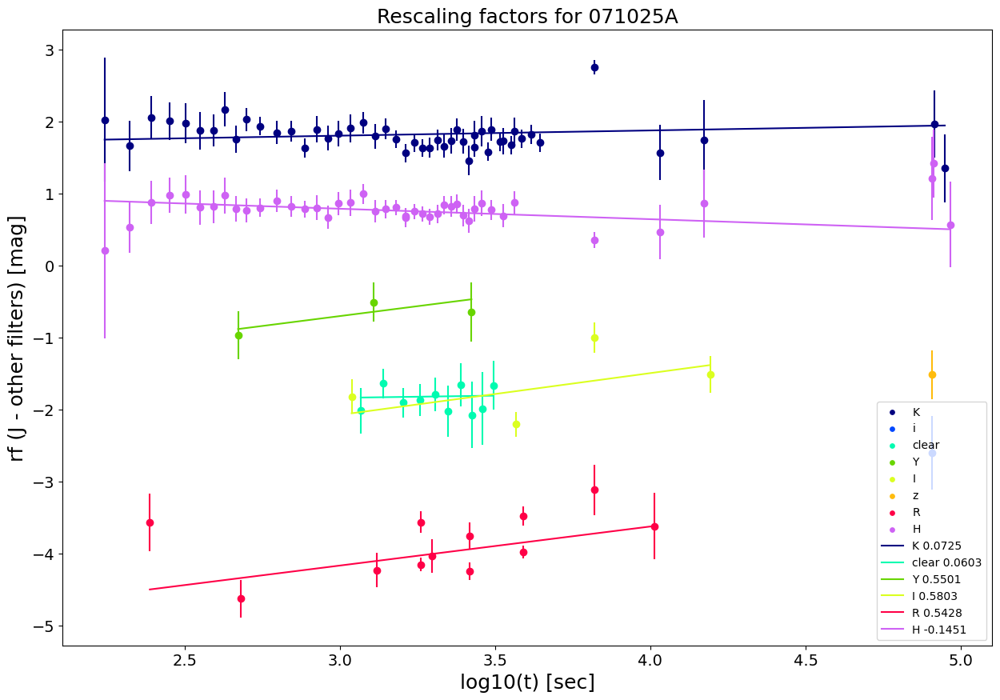


####################################################################################################

071031A
List of filters in the form: [Filter,number of points that have this filter]
[['J', 121], ['K', 77], ['H', 77], ['g', 75], ['i', 75], ['r', 75], ['z', 63], ['V', 9], ['Ic', 6], ['white', 4], ['B', 2], ['Rc', 1], ['U', 1], ['I', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  J , with 121 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    K         77  2.457882       0.57           0.12           8.333333
1    H         77  2.457882       0.21           0.12           8.333333
2    g         75  2.460898      -1.40           0.08          12.500000
3    i         75  2.460898      -0.48           0.08          12.500000
4    r         75  2.460898      -0.70           0.08          12.500000
Rescaling results
------------------

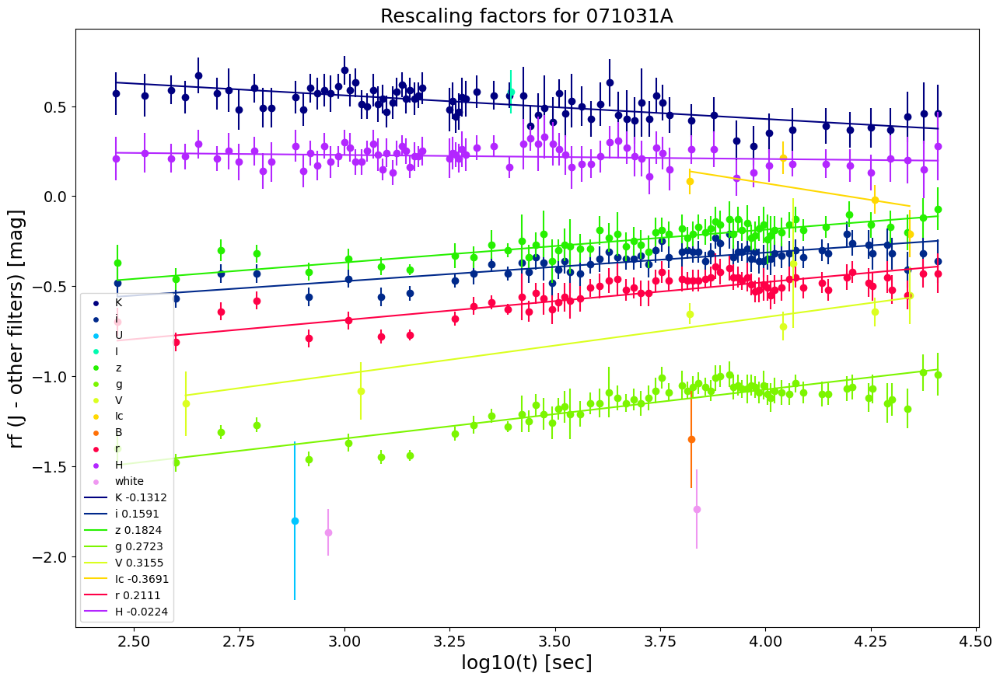


####################################################################################################

071112C
List of filters in the form: [Filter,number of points that have this filter]
[['R', 44], ['Rc', 41], ['CR', 34], ['V', 34], ['g', 22], ['J', 20], ['r', 19], ['i', 19], ['z', 16], ['Ic', 10], ['K', 9], ['Unfiltered', 4], ['U', 2], ['H', 2], ['UVW1', 2], ['B', 2], ['white', 2], ['I', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 44 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
         band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  \
0  Unfiltered          4  2.077004  -0.182467           0.35   
1          Rc         41  2.120574  -0.232467           0.46   
2           g         22  2.120574  -0.378628           0.66   
3       white          2  2.152288  -0.114259           0.19   
4          CR         34  2.167317  -0.303460           0.46   

   Resc_fact_weights  
0           

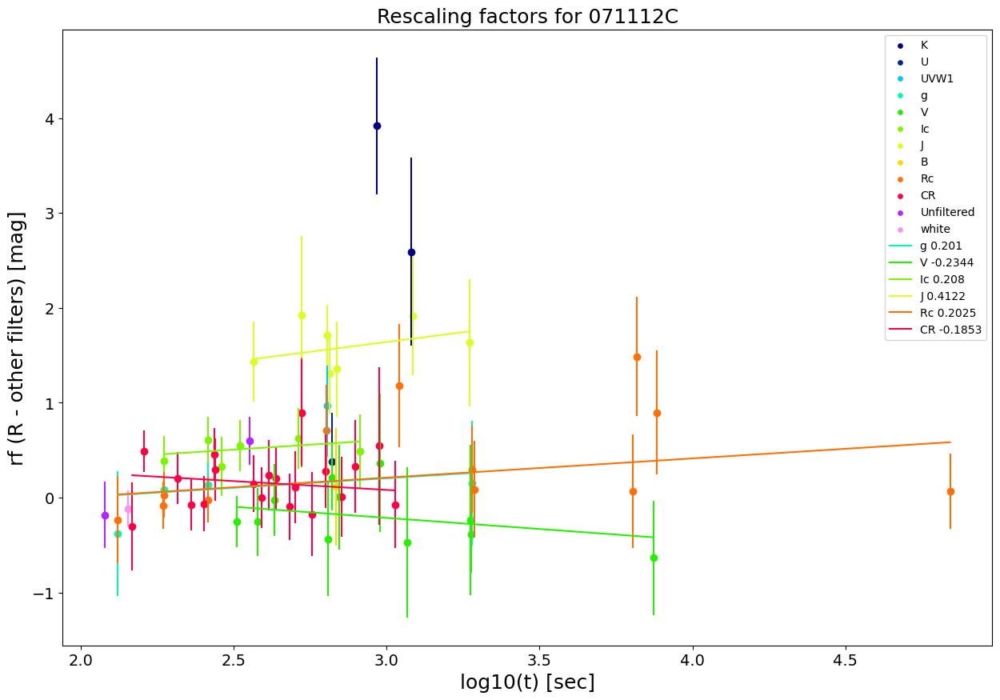


####################################################################################################

071117A
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/071117A_magAB_extcorr.txt has only limiting magnitudes, thus it will be skipped

----------------------------------------------------------------------------------------------------


####################################################################################################

071122A
List of filters in the form: [Filter,number of points that have this filter]
[['i', 7], ['Rc', 6], ['z', 3], ['white', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  i , with 7 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    z          3  3.754310   0.012118           0.56           1.785714
1    z          3  3.919857  -0.027882           0.57           1.75438

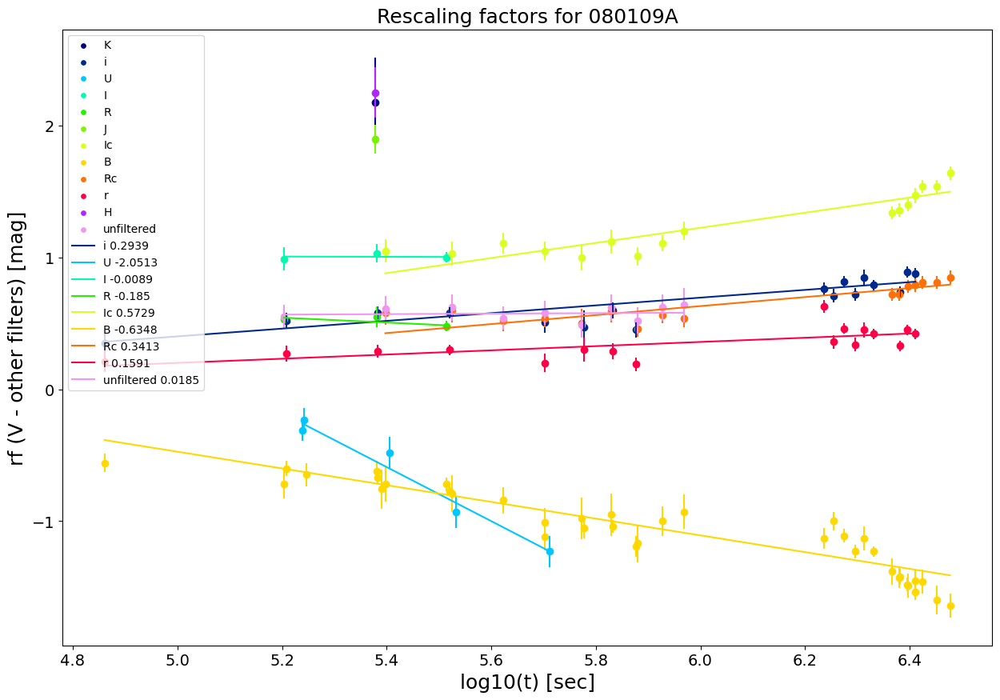


####################################################################################################

080129A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 5]]
 
The most numerous filter is considered for rescaling
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/080129A_magAB_extcorr.txt has only one filter along all the LC, thus no rescaling is needed

####################################################################################################

080205A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 3], ['white', 3], ['V', 2]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 3 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

##########

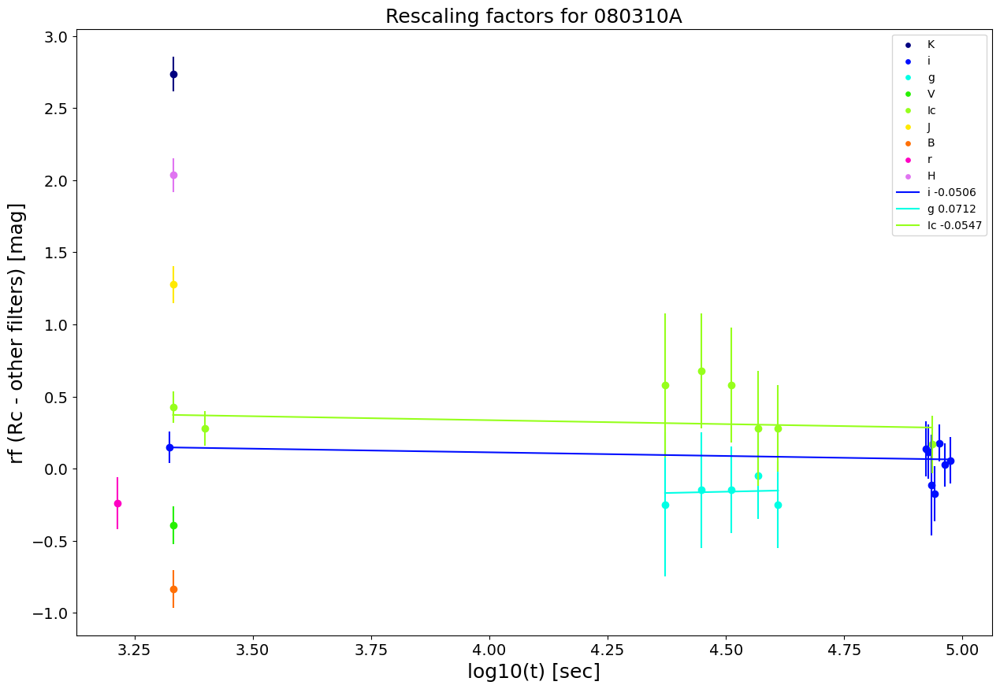


####################################################################################################

080319A
List of filters in the form: [Filter,number of points that have this filter]
[['Rc', 7], ['i', 5], ['z', 4], ['R', 2], ['r', 2], ['white', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  Rc , with 7 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

080319B
List of filters in the form: [Filter,number of points that have this filter]
[['V', 189], ['Rc', 173], ['H', 155], ['J', 147], ['K', 137], ['i', 118], ['CR', 101], ['z', 91], ['R', 88], ['Ic', 72], ['r', 68], ['I', 59], ['clear', 55], ['B', 35], ['UVW2', 9], ['UVM2', 8], ['g', 7], ['U', 

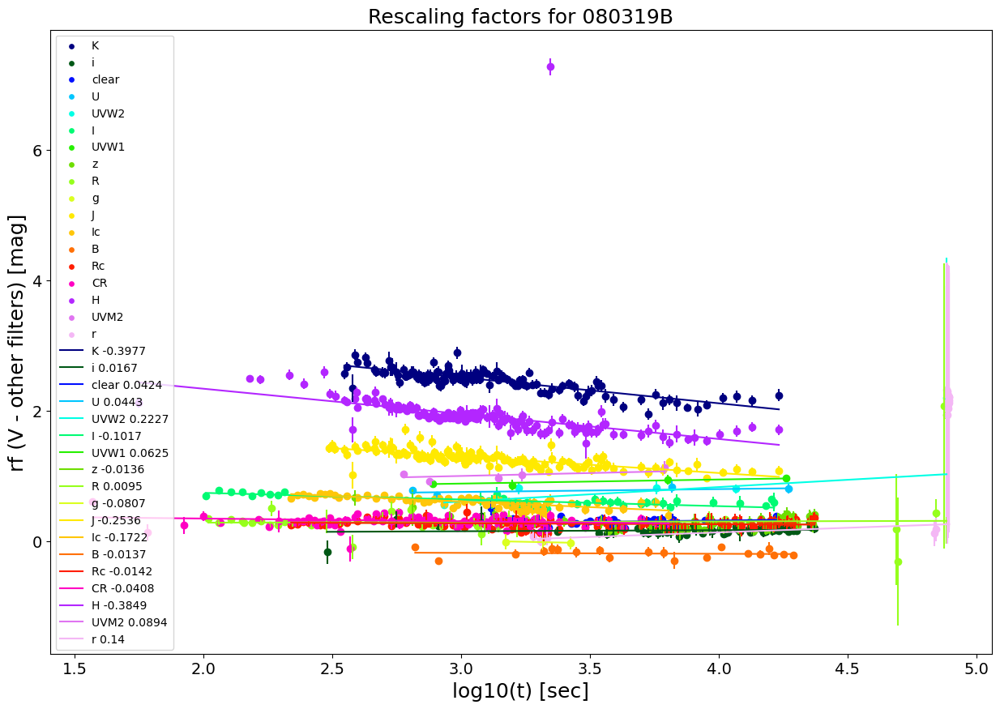


####################################################################################################

080319C
List of filters in the form: [Filter,number of points that have this filter]
[['CR', 14], ['i', 4], ['Rc', 3], ['z', 2], ['U', 1], ['white', 1], ['B', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  CR , with 14 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
    band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0  white          1  2.591621  -1.640860          0.240           4.166667
1      z          2  3.159838   0.630424          0.146           6.849315
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

080325A
List of filters in the form: [Filter,number of points that have this filter]
[['J', 4]]
 
The most numerous filter is considered for rescaling
C:/Us

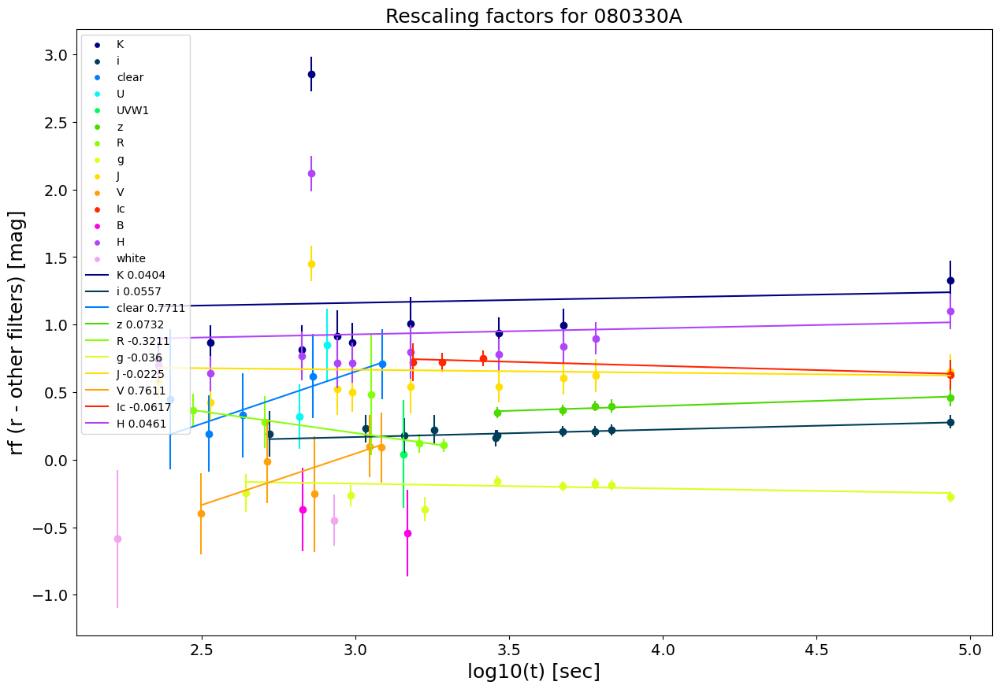


####################################################################################################

080411A
List of filters in the form: [Filter,number of points that have this filter]
[['B', 2], ['white', 2], ['U', 1], ['UVW2', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  B , with 2 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

080413A
List of filters in the form: [Filter,number of points that have this filter]
[['V', 6], ['B', 5], ['Rc', 4], ['K', 4], ['Ic', 4], ['CR', 3], ['white', 3], ['H', 3], ['J', 2], ['U', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  V , with 6 occurre

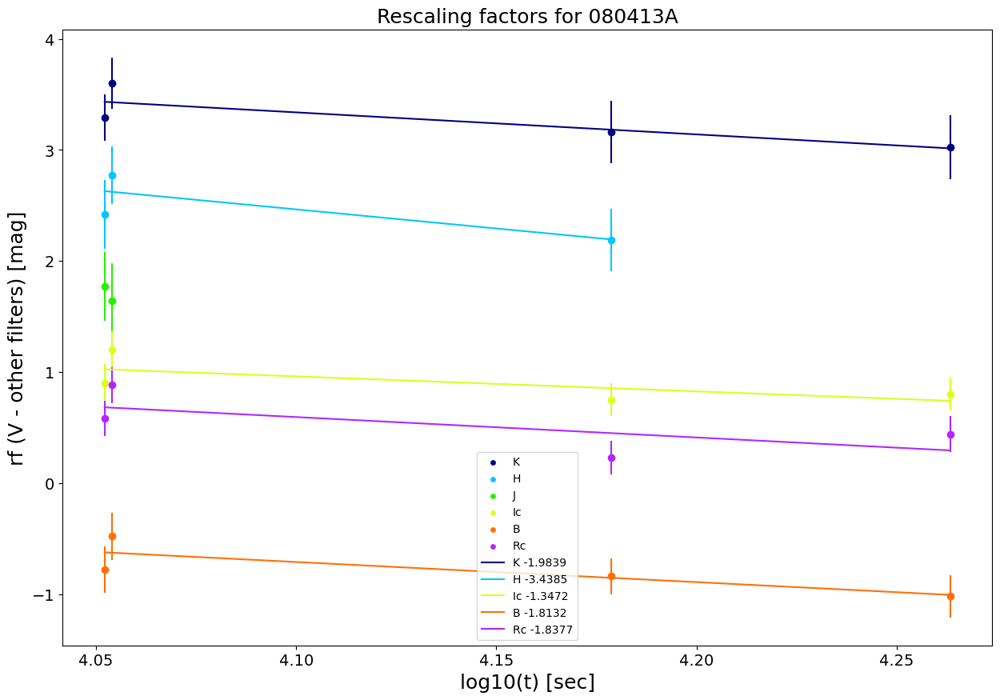


####################################################################################################

080413B
List of filters in the form: [Filter,number of points that have this filter]
[['r', 57], ['g', 53], ['z', 50], ['i', 50], ['H', 13], ['J', 12], ['K', 9], ['Ic', 3], ['V', 2], ['white', 2], ['Rc', 1], ['UVM2', 1], ['U', 1], ['UVW1', 1], ['UVW2', 1], ['B', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 57 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    g         53  2.534153  -0.108881           0.08          12.500000
1    z         50  2.534153   0.141923           0.08          12.500000
2    i         50  2.534153   0.022241           0.07          14.285714
3    V          2  2.643453  -0.081370           0.13           7.692308
4    g         53  2.647481  -0.088881           0.07          14.285714
Rescaling 

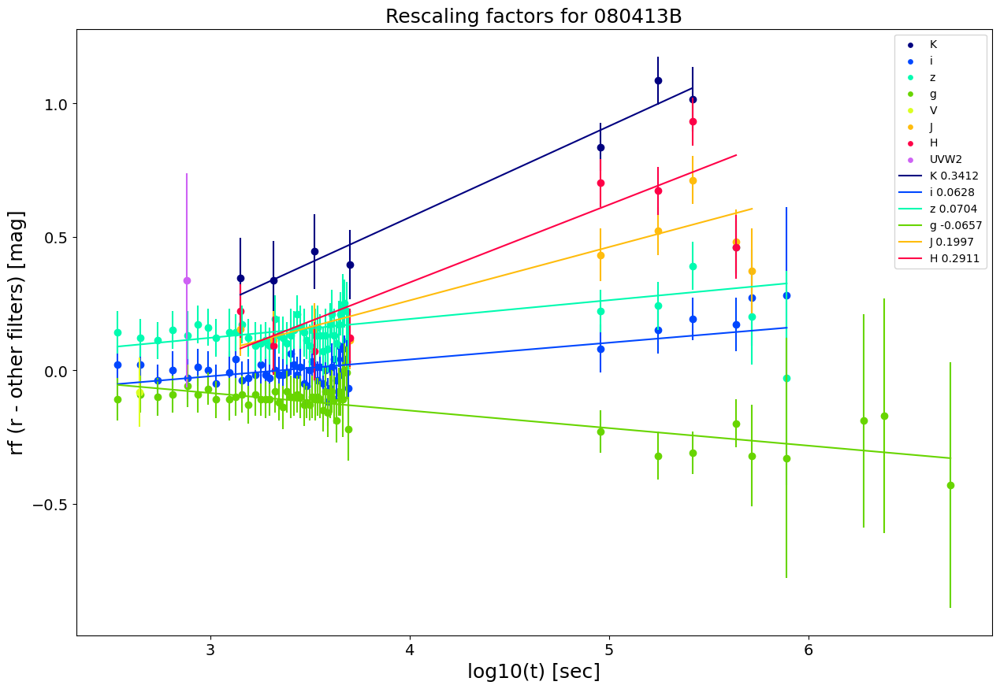


####################################################################################################

080430A
List of filters in the form: [Filter,number of points that have this filter]
[['Rc', 17], ['CR', 9], ['V', 5], ['B', 4], ['Ic', 3], ['white', 3], ['U', 2], ['unfiltered', 2], ['UVW1', 1], ['UVW2', 1], ['R', 1], ['UVM2', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  Rc , with 17 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
         band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  \
0           B          4  3.796852  -0.381342          0.300   
1          CR          9  3.852992   0.801073          0.302   
2  unfiltered          2  4.952841   1.600000          0.360   
3           V          5  6.389979   0.278957          0.230   
4           B          4  6.389979   0.230284          0.230   

   Resc_fact_weights  
0           3.333333  
1           3.311258  
2           2.777778  
3    

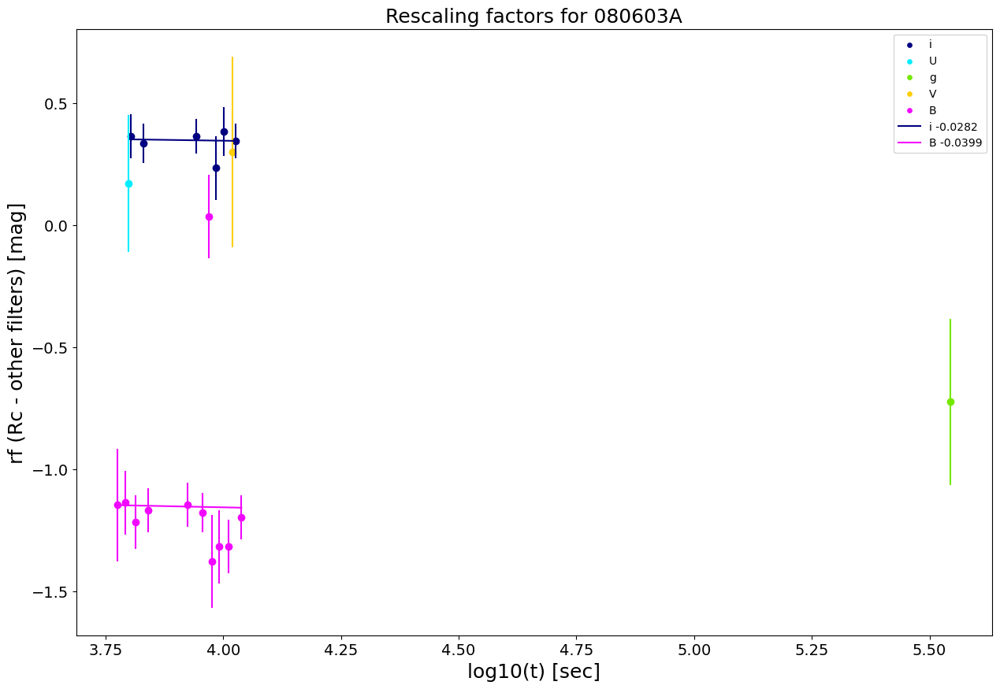


####################################################################################################

080603B
List of filters in the form: [Filter,number of points that have this filter]
[['r', 13], ['Clear', 11], ['R', 5], ['g', 5], ['i', 2], ['J', 1], ['Rc', 1], ['U', 1], ['H', 1], ['K', 1], ['B', 1], ['UVW1', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 13 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
    band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0      U          1  3.798561  -1.070621           0.38           2.631579
1  Clear         11  3.828222  -0.011448           0.12           8.333333
2  Clear         11  3.944107   0.238552           0.24           4.166667
3  Clear         11  4.142890  -0.121448           0.24           4.166667
Rescaling results
------------------
        slope slope_err intercept inter_err acceptance           red_chi2  \


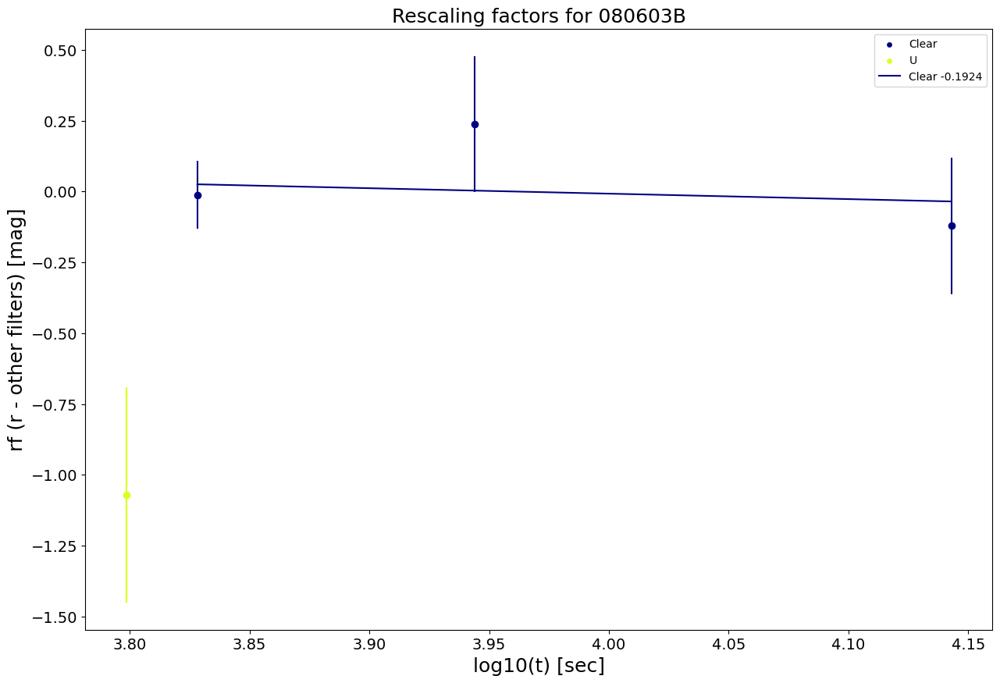


####################################################################################################

080604A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 2], ['Ic', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 2 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

080605A
List of filters in the form: [Filter,number of points that have this filter]
[['Ic', 15], ['r', 7], ['i', 5], ['V', 4], ['J', 4], ['white', 4], ['K', 4], ['H', 4], ['z', 3], ['Rc', 3], ['g', 2], ['U', 1], ['B', 1], ['UVW1', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  Ic , with 1

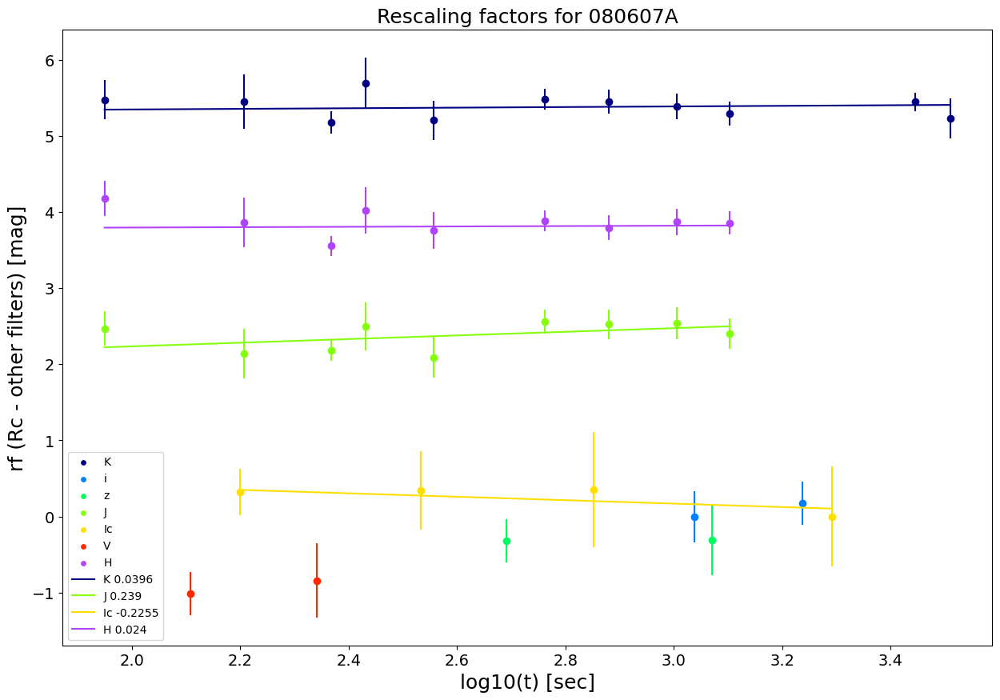


####################################################################################################

080707A
List of filters in the form: [Filter,number of points that have this filter]
[['g', 2], ['r', 2], ['i', 2], ['white', 1], ['z', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  g , with 2 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    r          2  3.742882   0.396755            0.6           1.666667
1    i          2  3.742882   0.434442            0.6           1.666667
2    z          1  3.742882   0.622544            0.6           1.666667
3    r          2  4.975156   0.487710            0.6           1.666667
4    i          2  4.975156   0.521254            0.6           1.666667
No filter with at least 3 rescaling factors to be fitted

######################################################################

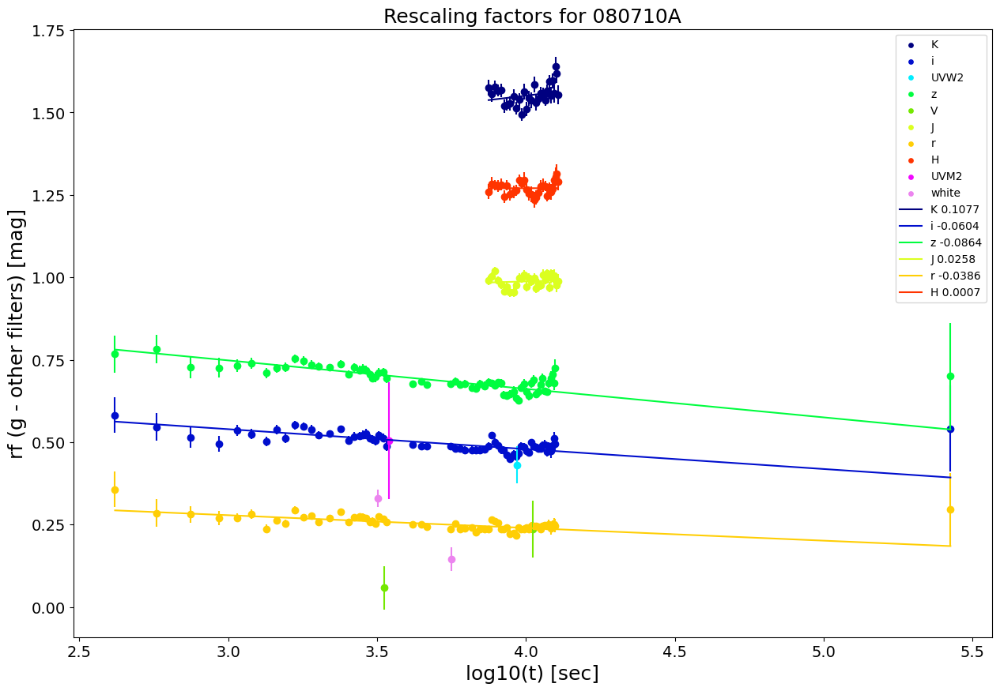


####################################################################################################

080721A
List of filters in the form: [Filter,number of points that have this filter]
[['V', 13], ['white', 11], ['R', 9], ['r', 4], ['U', 1], ['I', 1], ['B', 1], ['i', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  V , with 13 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
    band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0  white         11  4.893207  -1.347744           0.46           2.173913
1      R          9  5.961421   0.569996           0.39           2.564103
2      I          1  5.961895   1.274726           0.77           1.298701
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

080804A
List of filters in the form: [Filter,number of points that have this filter

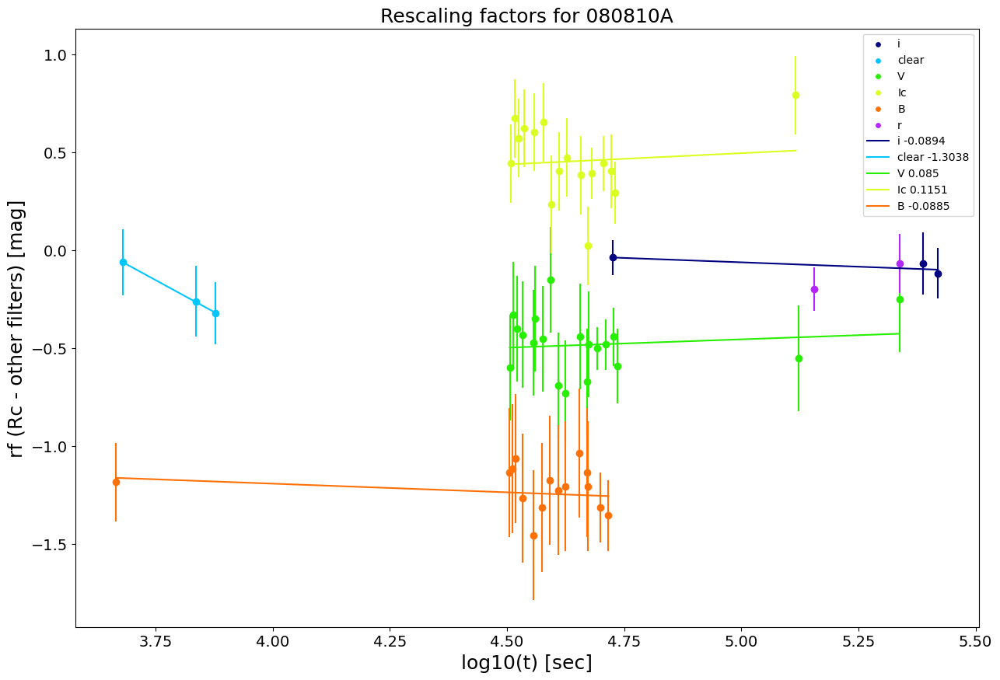


####################################################################################################

080825B
List of filters in the form: [Filter,number of points that have this filter]
[['I', 3], ['H', 1], ['K', 1], ['g', 1], ['r', 1], ['i', 1], ['z', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  I , with 3 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

080905A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 2]]
 
The most numerous filter is considered for rescaling
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/080905A_magAB_extcorr.txt has only one filter along all t

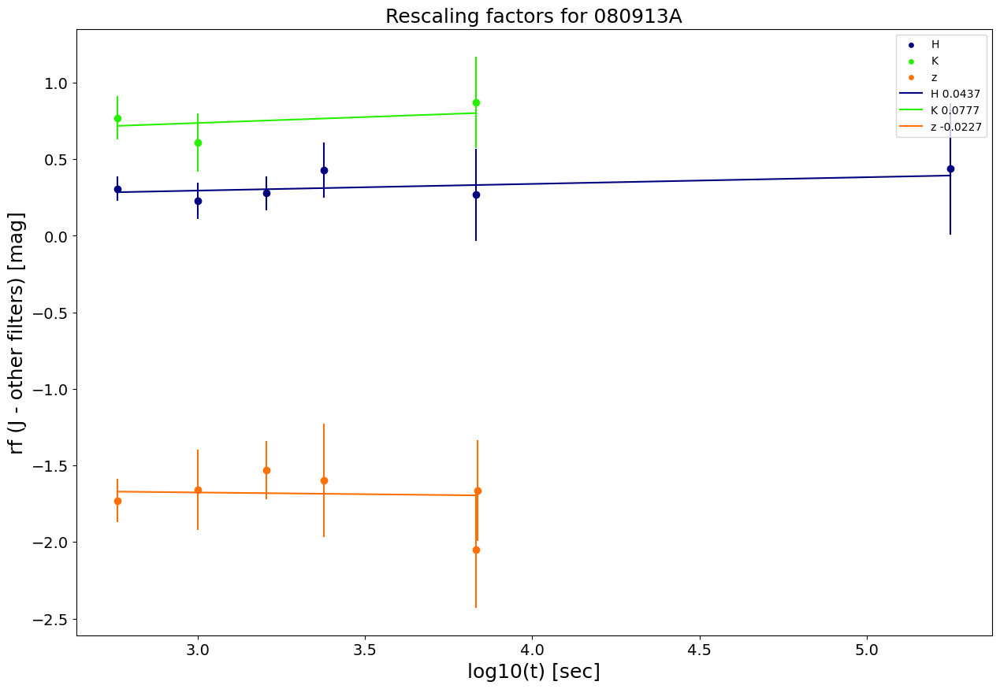


####################################################################################################

080916A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 4], ['white', 3], ['V', 2], ['UVM2', 1], ['U', 1], ['UVW2', 1], ['B', 1], ['UVW1', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 4 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

080916C
List of filters in the form: [Filter,number of points that have this filter]
[['i', 3], ['K', 2], ['H', 2], ['z', 2], ['J', 2], ['r', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  i , with 3 occurrences
-\|/-|

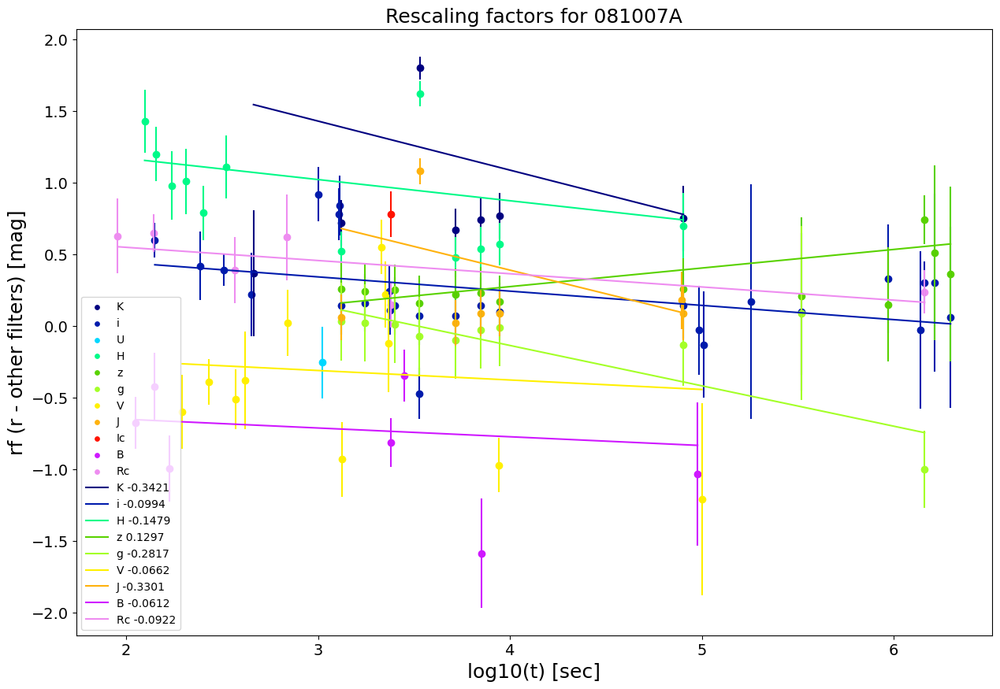


####################################################################################################

081008A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 62], ['white', 29], ['B', 13], ['V', 12], ['UVW1', 6], ['Ic', 3], ['J', 3], ['Rc', 3], ['H', 3], ['K', 3]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 62 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
    band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0      V         12  1.915400  -0.754257       0.109165           9.160445
1  white         29  2.003891  -1.135467       0.091525          10.925988
2  white         29  2.148911  -1.116098       0.070260          14.232870
3  white         29  2.232742  -1.111938       0.085475          11.699286
4  white         29  2.302980  -1.188687       0.086450          11.567393
Rescaling results
------------------
        slope slope_err inter

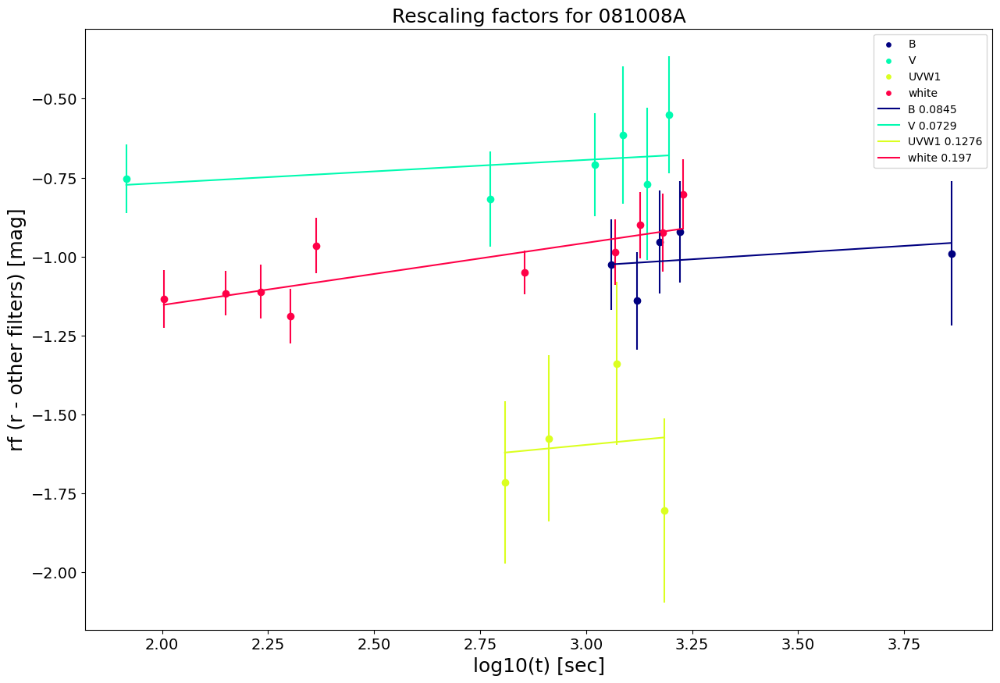


####################################################################################################

081028A
List of filters in the form: [Filter,number of points that have this filter]
[['J', 5], ['K', 4], ['I', 4], ['H', 4], ['U', 2], ['g', 2], ['r', 2], ['i', 2], ['z', 2], ['R', 1], ['B', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  J , with 5 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    K          4  4.324941        0.0           0.30           3.333333
1    H          4  4.324941        0.3           0.30           3.333333
2    g          2  4.325187       -0.9           0.25           4.000000
3    r          2  4.325187       -0.3           0.25           4.000000
4    i          2  4.325187       -0.2           0.25           4.000000
Rescaling results
------------------
    slope slope_err intercept inter

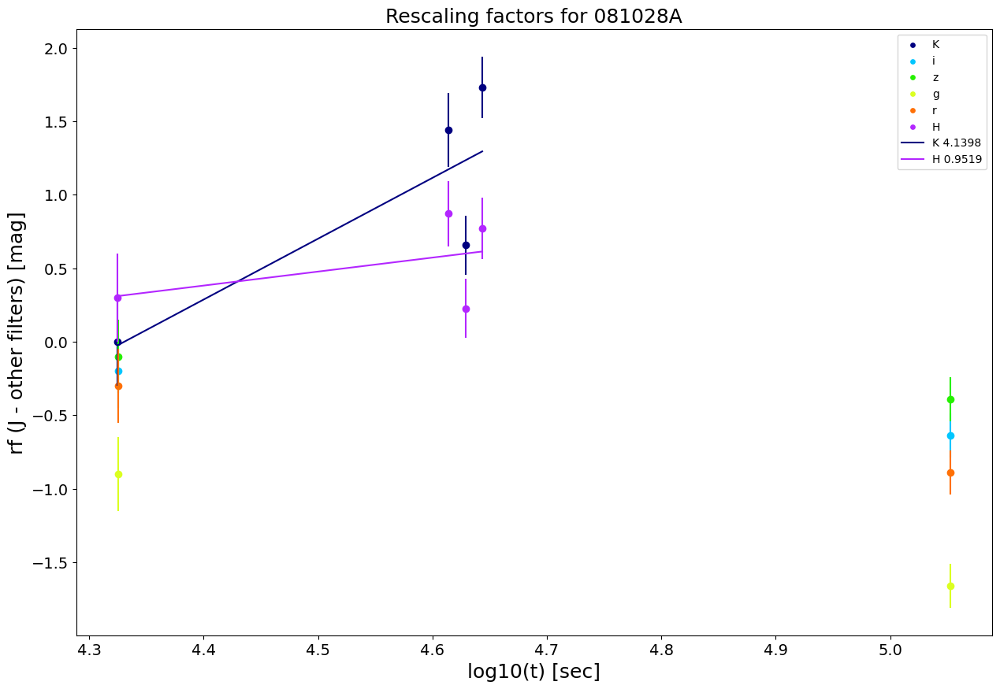


####################################################################################################

081029A
List of filters in the form: [Filter,number of points that have this filter]
[['J', 82], ['r', 79], ['i', 78], ['H', 76], ['g', 75], ['z', 73], ['K', 71], ['CR', 34], ['Rc', 29], ['V', 10], ['B', 6], ['IC', 4], ['white', 3]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  J , with 82 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0   CR         34  2.183611  -0.972126          0.350           2.857143
1   CR         34  2.483474  -1.332126          0.375           2.666667
2   CR         34  2.593085  -1.322126          0.405           2.469136
3   Rc         29  2.651681  -1.219944          0.580           1.724138
4   CR         34  2.653617  -1.362126          0.595           1.680672
Rescaling results
------------------
       

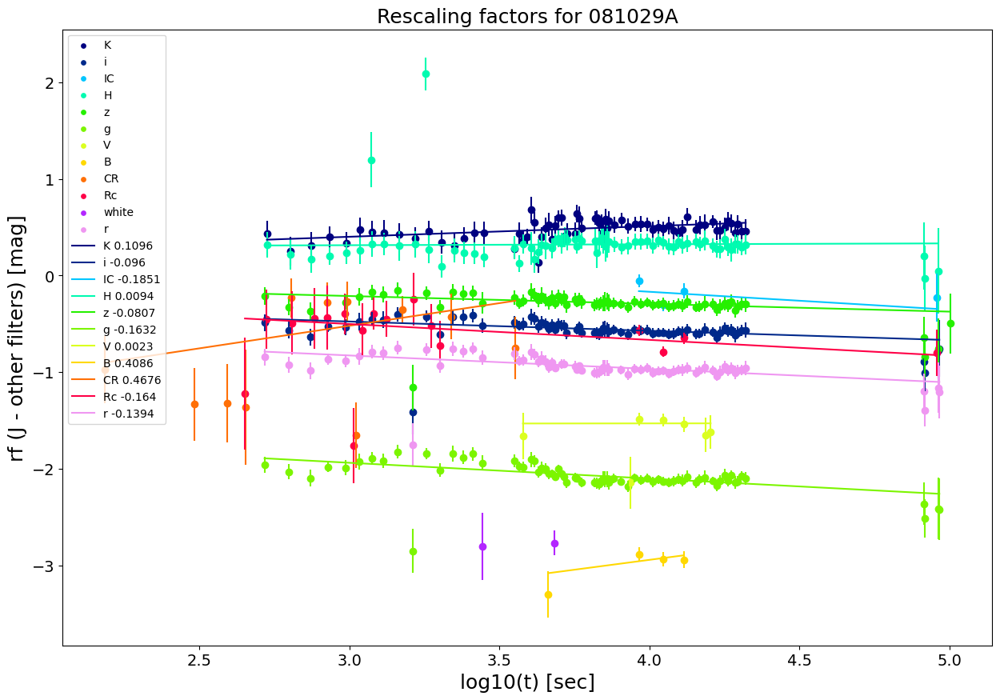


####################################################################################################

081109A
List of filters in the form: [Filter,number of points that have this filter]
[['H', 13], ['K', 7], ['z', 3], ['J', 3], ['i', 3], ['r', 2], ['white', 1], ['g', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  H , with 13 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    z          3  4.790925  -1.684772           0.30           3.333333
1    i          3  4.790925  -2.074251           0.30           3.333333
2    r          2  4.790925  -3.060991           0.45           2.222222
3    K          7  4.790988   0.796564           0.35           2.857143
4    J          3  4.790988  -0.694469           0.25           4.000000
Rescaling results
------------------
     slope slope_err intercept inter_err acceptance           red_chi

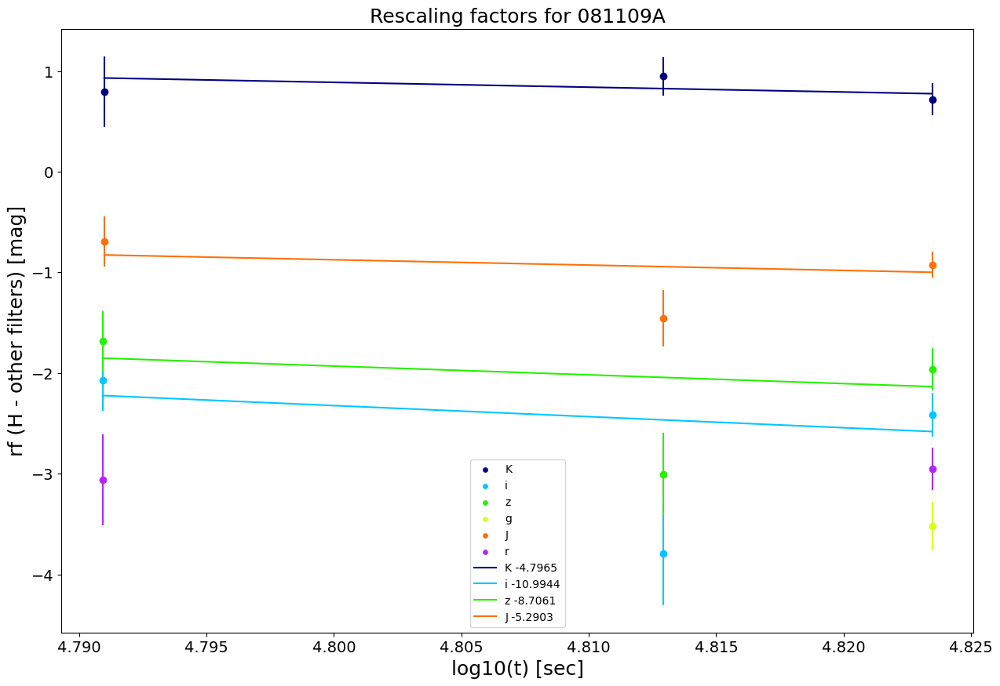


####################################################################################################

081118A
List of filters in the form: [Filter,number of points that have this filter]
[['unfiltered', 1], ['H', 1], ['K', 1], ['g', 1], ['r', 1], ['i', 1], ['z', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  unfiltered , with 1 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

081121A
List of filters in the form: [Filter,number of points that have this filter]
[['H', 2], ['K', 2], ['B', 2], ['J', 2], ['U', 1], ['white', 1], ['r', 1], ['I', 1], ['g', 1], ['i', 1], ['R', 1], ['z', 1], ['UVW1', 1], ['V', 1]]
 
The most numerous filter is c

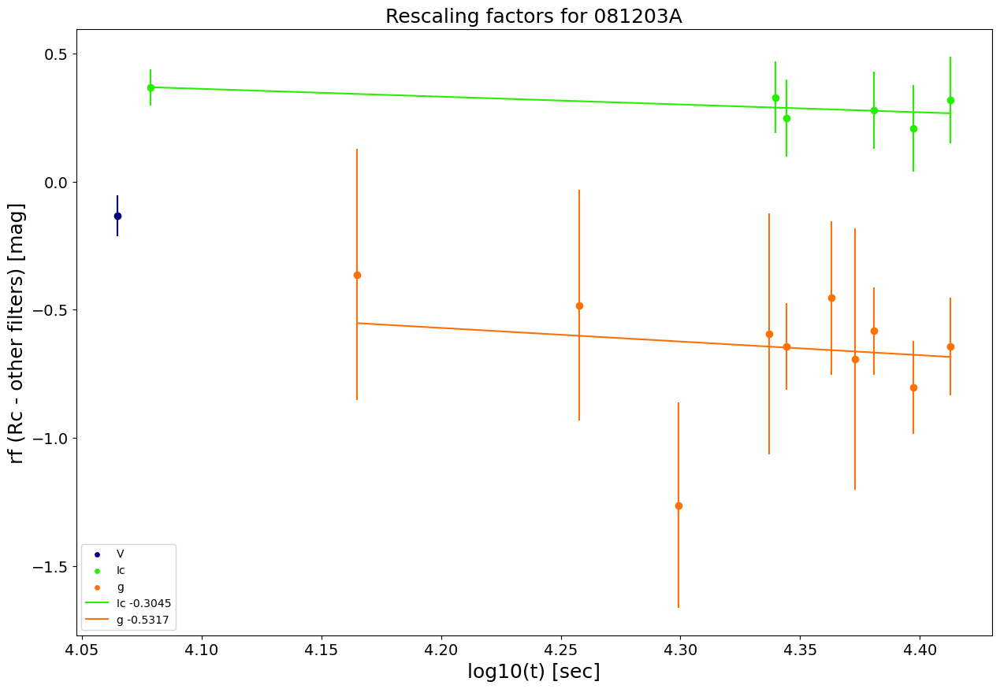


####################################################################################################

081210A
List of filters in the form: [Filter,number of points that have this filter]
[['white', 2], ['U', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  white , with 2 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

081221A
List of filters in the form: [Filter,number of points that have this filter]
[['i', 1], ['g', 1], ['r', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  i , with 1 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fac

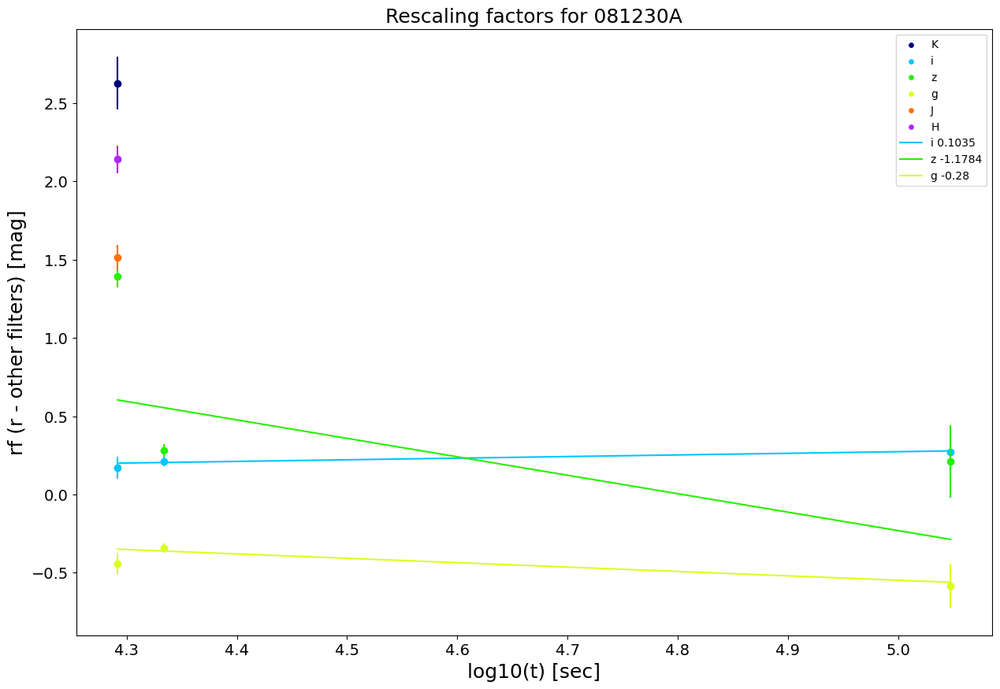


####################################################################################################

090102A
List of filters in the form: [Filter,number of points that have this filter]
[['Rc', 64], ['g', 18], ['z', 15], ['i', 15], ['H', 13], ['J', 3], ['K', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  Rc , with 64 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    H         13  2.294687       2.56           0.27           3.703704
1    g         18  3.956265      -0.36           0.09          11.111111
2    z         15  3.956265       1.09           0.12           8.333333
3    i         15  3.956265       0.66           0.10          10.000000
4    g         18  3.961801      -0.35           0.07          14.285714
Rescaling results
------------------
    slope slope_err intercept inter_err acceptance           red_chi2  \
K   

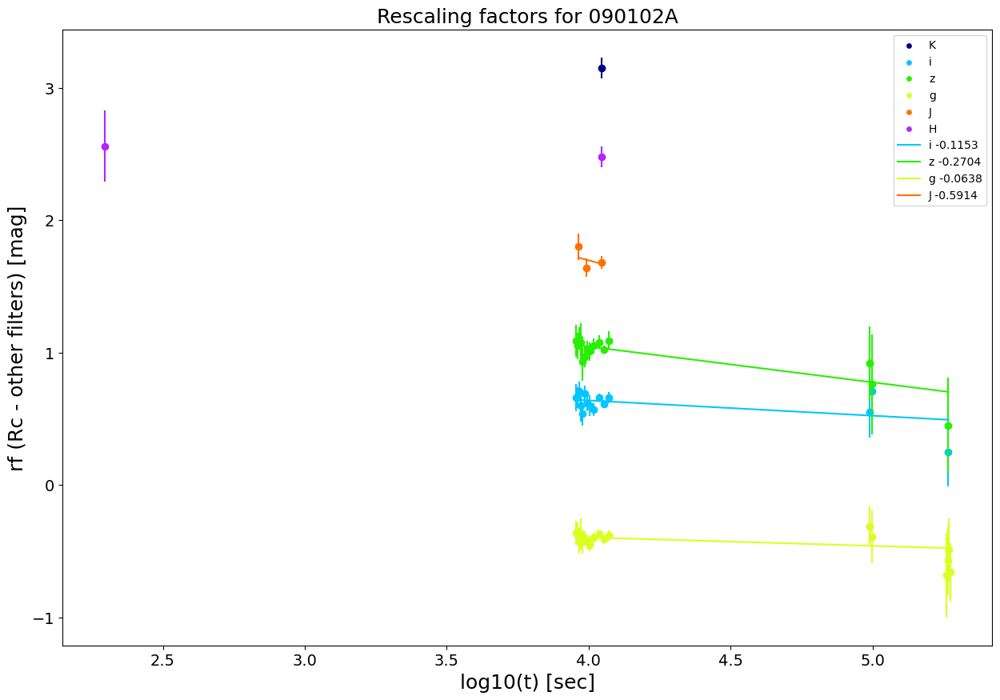


####################################################################################################

090113A
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/090113A_magAB_extcorr.txt has only limiting magnitudes, thus it will be skipped

----------------------------------------------------------------------------------------------------


####################################################################################################

090201A
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/090201A_magAB_extcorr.txt has only limiting magnitudes, thus it will be skipped

----------------------------------------------------------------------------------------------------


####################################################################################################

090205A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 3], ['I', 2], ['i', 1]]
 
The most numerous filter is considered for 

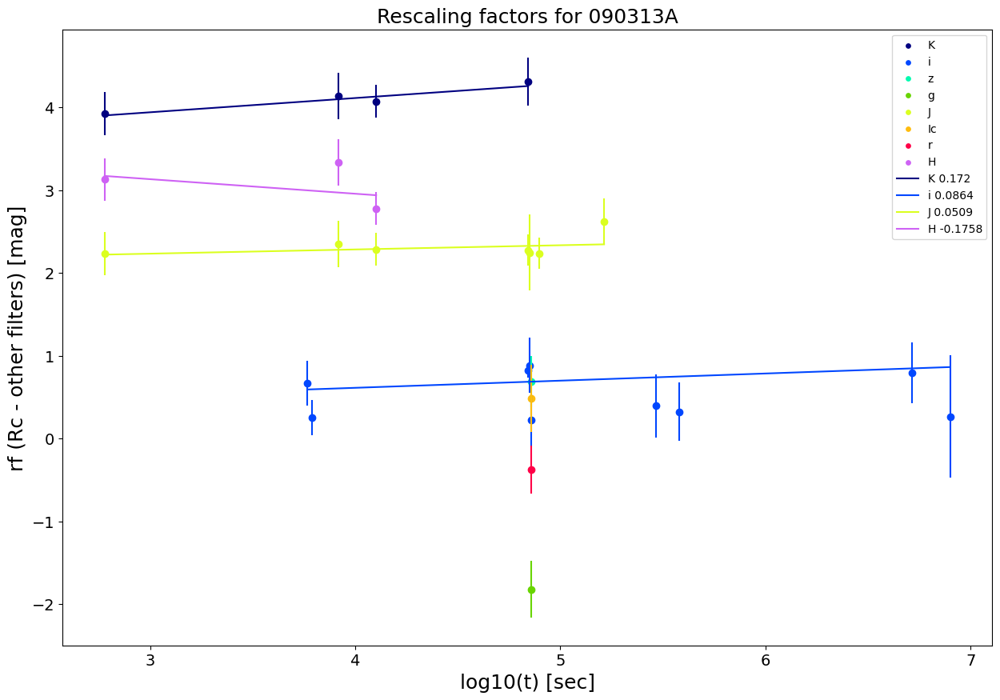


####################################################################################################

090323A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 15], ['i', 15], ['R', 10], ['Rc', 2], ['white', 1], ['K', 1], ['H', 1], ['g', 1], ['z', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 15 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    i         15  4.985732   0.373069           0.05          20.000000
1    K          1  4.985732   1.395999           0.06          16.666667
2    H          1  4.985732   1.120192           0.05          20.000000
3    g          1  4.985732  -1.581393           0.10          10.000000
4    z          1  4.985732   0.609636           0.05          20.000000
Rescaling results
------------------
    slope slope_err intercept inter_err accept

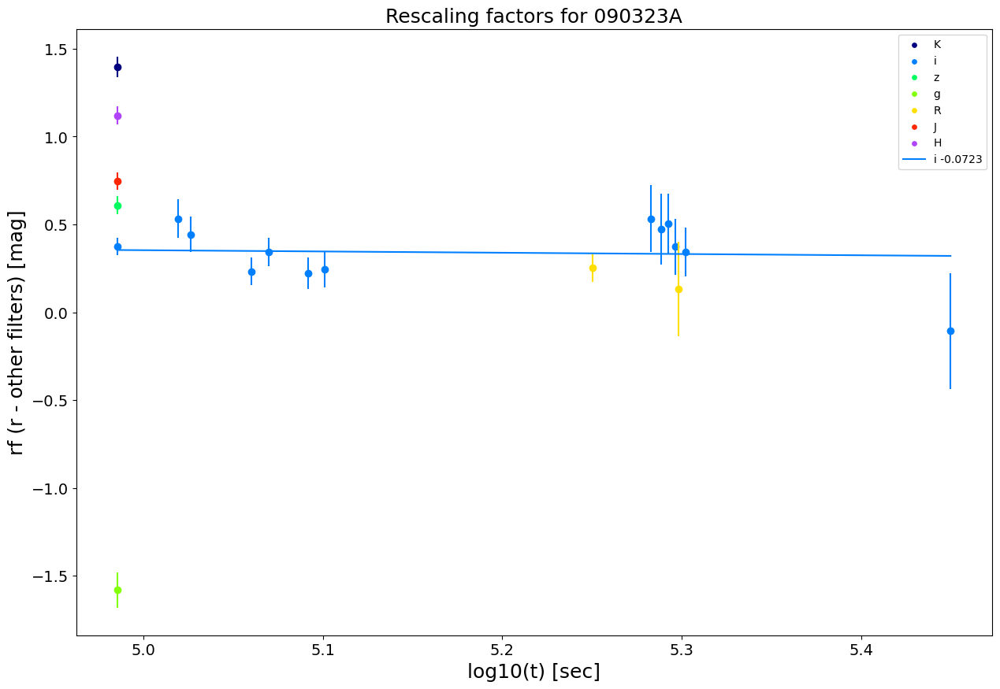


####################################################################################################

090328A
List of filters in the form: [Filter,number of points that have this filter]
[['U', 8], ['i', 2], ['clear', 1], ['white', 1], ['K', 1], ['H', 1], ['g', 1], ['r', 1], ['z', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  U , with 8 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
    band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0  white          1  4.763128  -0.199073           0.24           4.166667
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

090407A
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/090407A_magAB_extcorr.txt has only limiting magnitudes, thus it will be skipped

-------------------------------------------------

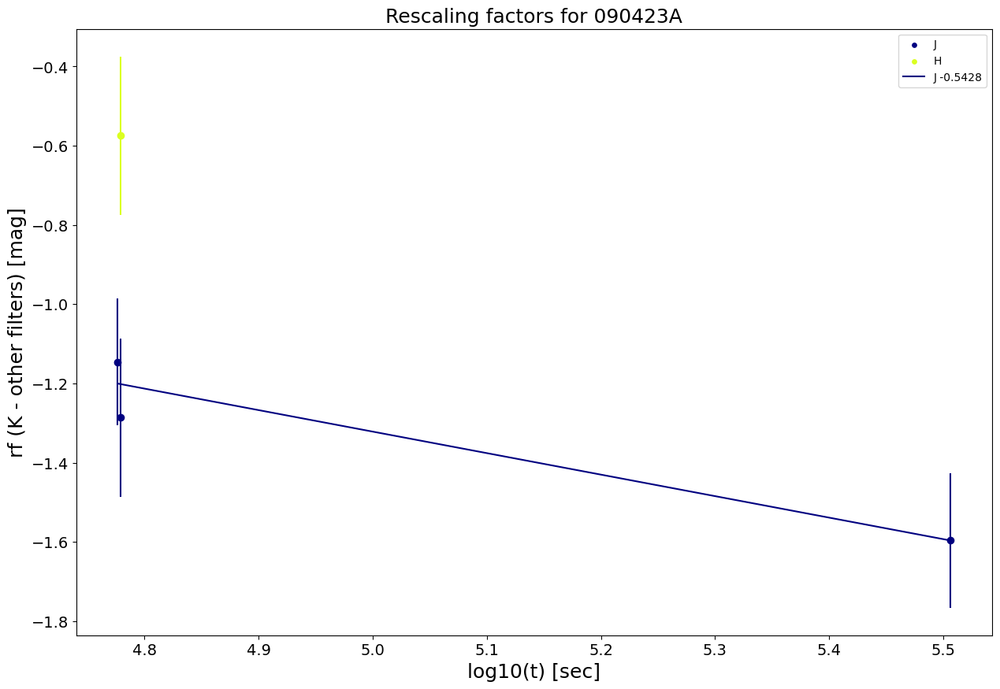


####################################################################################################

090424A
List of filters in the form: [Filter,number of points that have this filter]
[['Rc', 40], ['U', 40], ['white', 34], ['V', 18], ['B', 17], ['r', 13], ['i', 13], ['UVW1', 11], ['I', 9], ['J', 8], ['R', 7], ['Ic', 6], ['UVM2', 4], ['UVW2', 4], ['CR', 3], ['K', 2], ['H', 2], ['Unfiltered', 1], ['g', 1], ['z', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  Rc , with 40 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0   Ic          6  3.982814   0.686058           0.11           9.090909
1   Ic          6  4.336129   0.446058           0.21           4.761905
2   Ic          6  4.336460   0.446058           0.21           4.761905
3   CR          3  4.337140  -0.115547           0.42           2.380952
4    V         18  4.357581  -

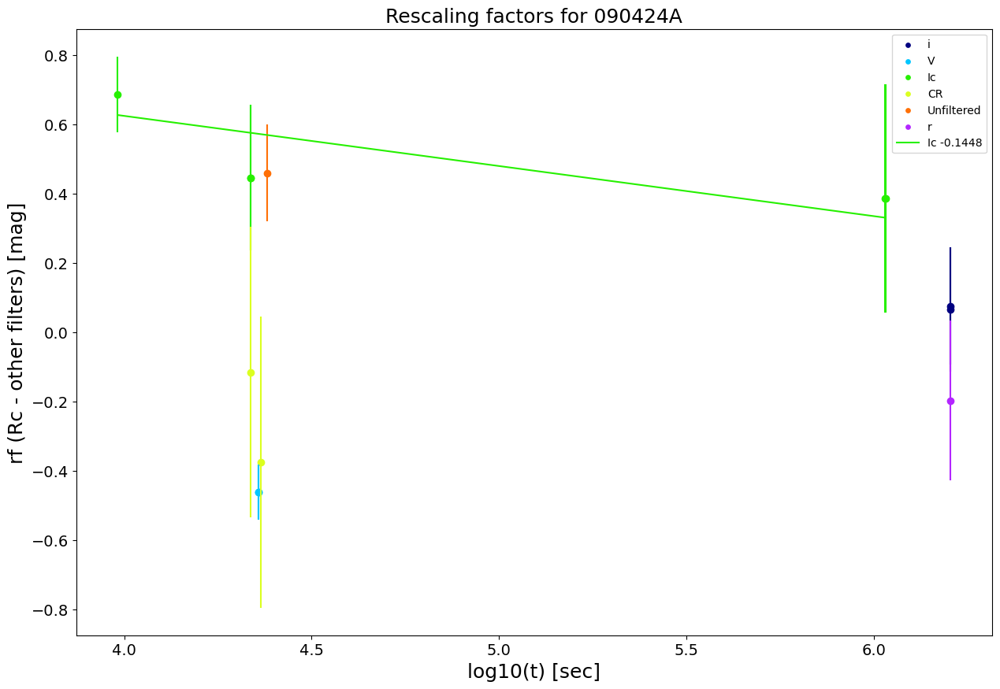


####################################################################################################

090426A
List of filters in the form: [Filter,number of points that have this filter]
[['Rc', 34], ['V', 15], ['g', 14], ['i', 13], ['R', 13], ['z', 12], ['r', 12], ['Ic', 1], ['B', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  Rc , with 34 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0   Ic          1  4.601109   0.071673           0.15           6.666667
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

090429B
List of filters in the form: [Filter,number of points that have this filter]
[['K', 1], ['H', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  K , with 1 oc

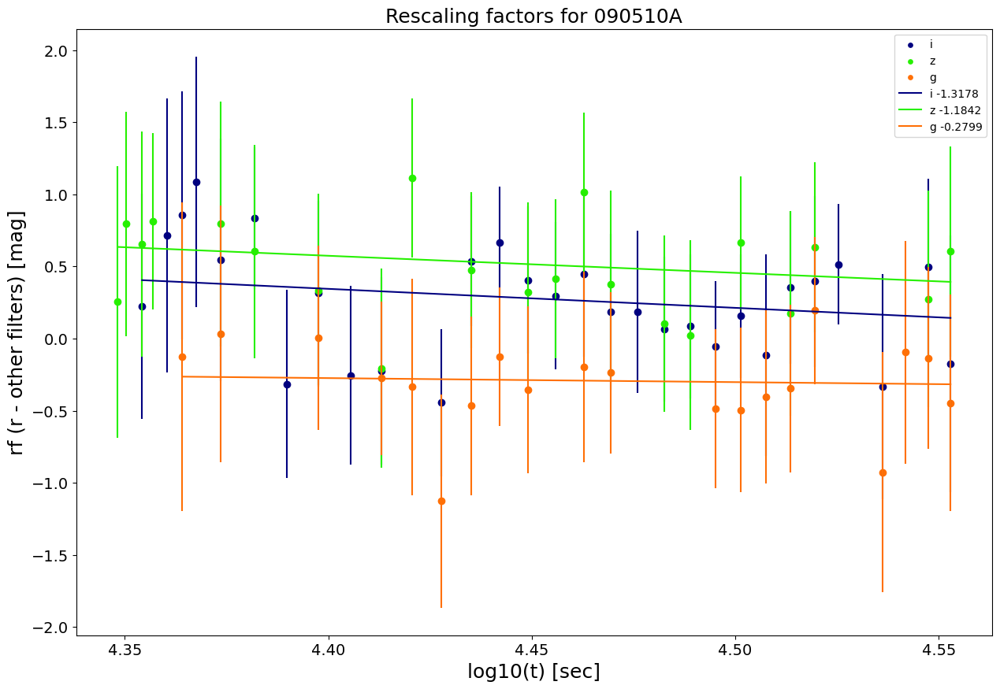


####################################################################################################

090516A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 5], ['K', 1], ['H', 1], ['g', 1], ['r', 1], ['i', 1], ['z', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 5 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

090519A
List of filters in the form: [Filter,number of points that have this filter]
[['i', 1], ['g', 1], ['r', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  i , with 1 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/

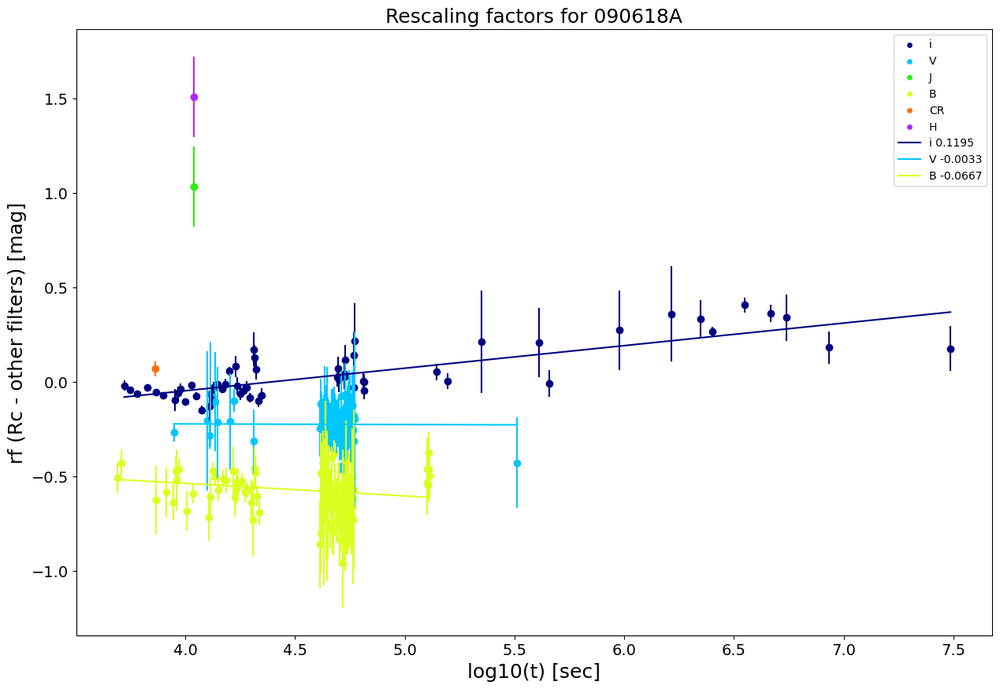


####################################################################################################

090709A
List of filters in the form: [Filter,number of points that have this filter]
[['K', 6], ['H', 4], ['r', 3], ['R', 2], ['z', 2], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  K , with 6 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    H          4  2.079181  -1.024635           0.37           2.702703
1    H          4  2.487845  -1.184635           0.28           3.571429
2    z          2  2.495822  -4.457865           0.45           2.222222
3    H          4  2.641474  -1.384635           0.40           2.500000
4    z          2  2.644439  -5.117865           0.70           1.428571
Rescaling results
------------------
    slope slope_err intercept inter_err acceptance           red_chi2  \
H -0.0728     0.392   

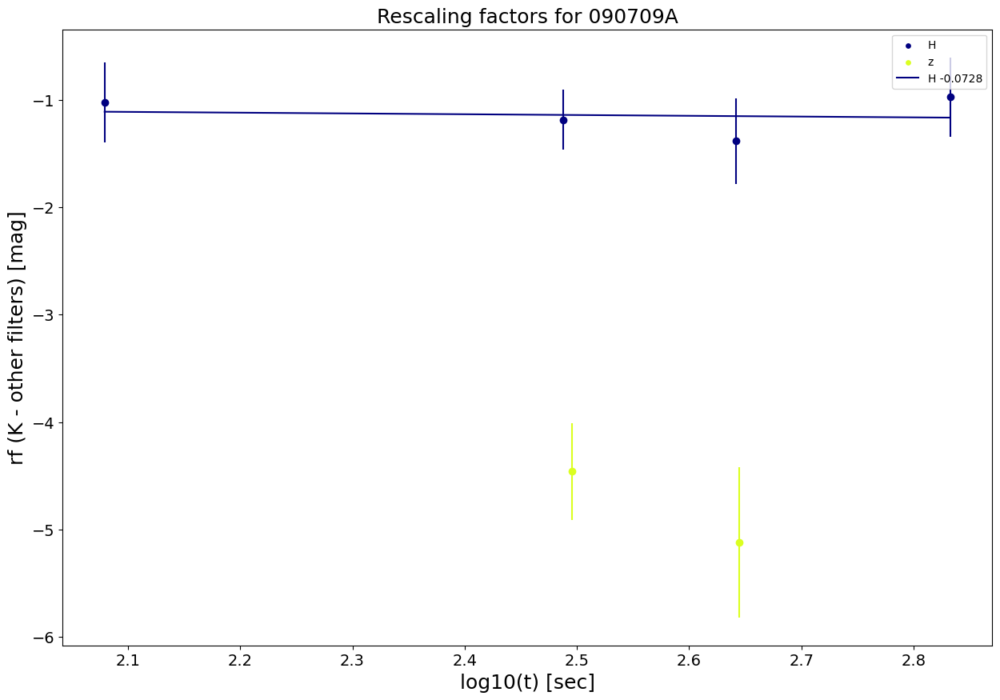


####################################################################################################

090715B
List of filters in the form: [Filter,number of points that have this filter]
[['R', 14], ['I', 1], ['r', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 14 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    I          1  4.136086   0.506427           0.52           1.923077
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

090726A
List of filters in the form: [Filter,number of points that have this filter]
[['CR', 27], ['R', 24], ['white', 2], ['v', 1], ['b', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  CR , with 27 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\

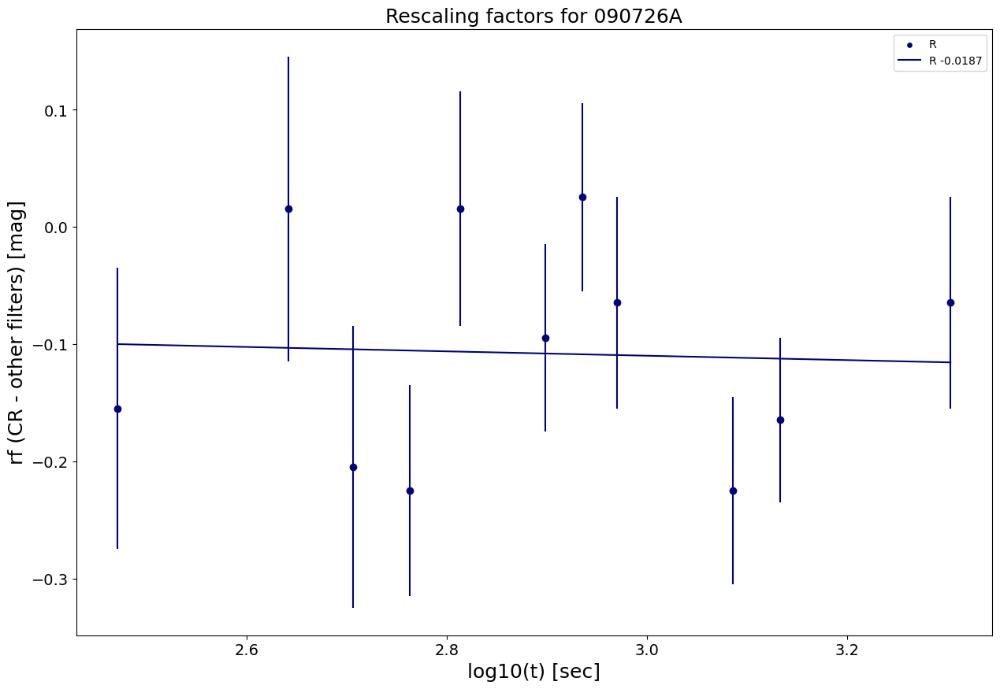


####################################################################################################

090809A
List of filters in the form: [Filter,number of points that have this filter]
[['i', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  i , with 1 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

090812A
List of filters in the form: [Filter,number of points that have this filter]
[['CR', 6], ['r', 4], ['i', 3], ['V', 2], ['Rc', 1], ['U', 1], ['Ic', 1], ['B', 1], ['g', 1], ['J', 1], ['z', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  CR , with 6 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/

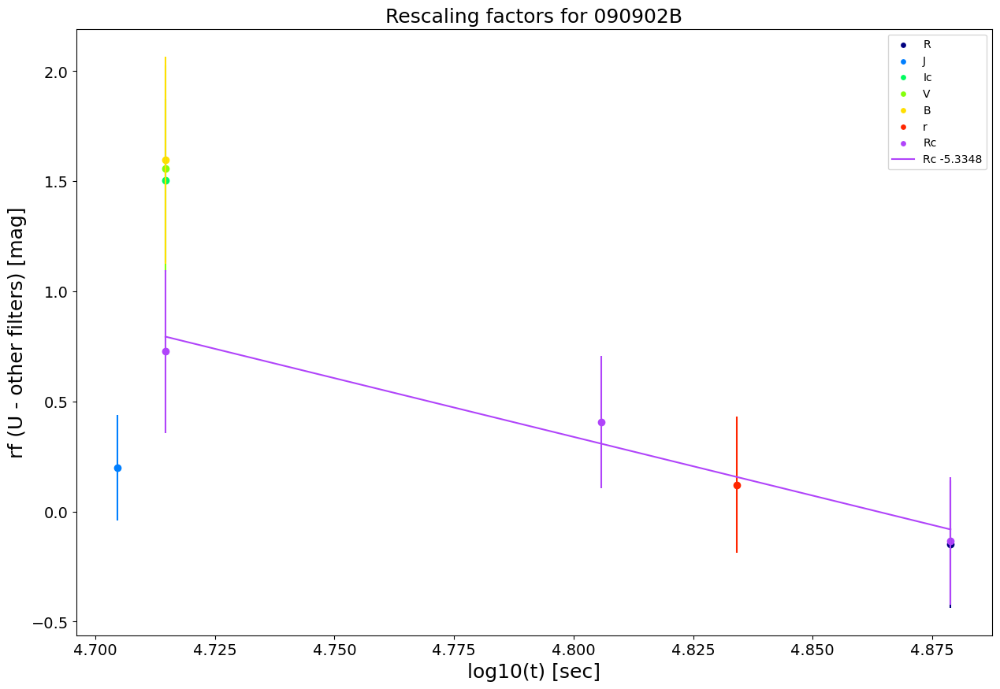


####################################################################################################

090926A
List of filters in the form: [Filter,number of points that have this filter]
[['I', 48], ['R', 47], ['V', 31], ['U', 30], ['B', 17], ['J', 3], ['white', 3], ['i', 1], ['r', 1], ['g', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  I , with 48 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
    band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0      V         31  4.837754  -0.703677           0.41           2.439024
1      R         47  4.837918  -0.664493           0.35           2.857143
2      U         30  4.842957  -0.842915           0.27           3.703704
3      U         30  4.842999  -0.752915           0.28           3.571429
4  white          3  4.845938  -1.231689           0.24           4.166667
Rescaling results
------------------
        slope slope_err intercept

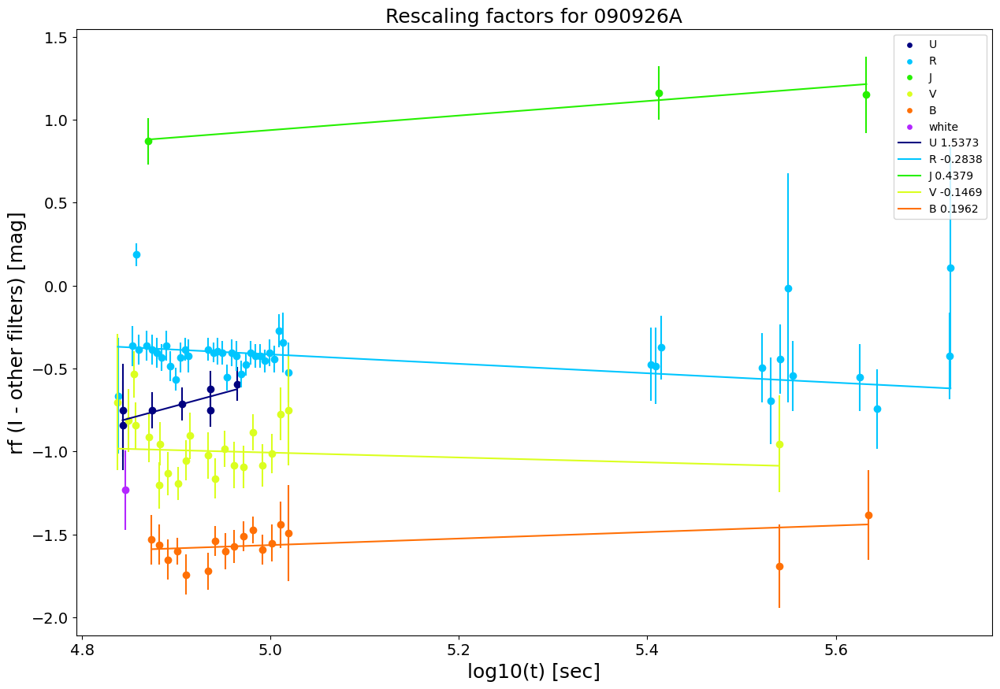


####################################################################################################

090926B
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/090926B_magAB_extcorr.txt has only limiting magnitudes, thus it will be skipped

----------------------------------------------------------------------------------------------------


####################################################################################################

090927A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 5], ['R', 3], ['white', 3], ['I', 2], ['B', 2], ['i', 2], ['V', 2], ['U', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 5 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    i          2  4.790285       0.11           0.15           6.666667
1    i          2  5.178819     

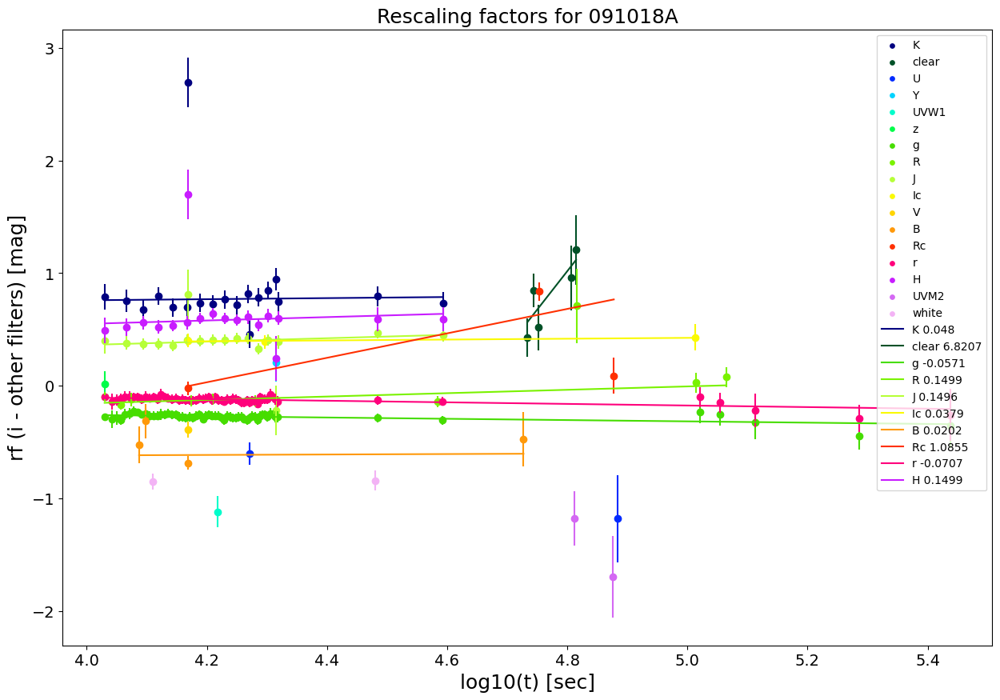


####################################################################################################

091020A
List of filters in the form: [Filter,number of points that have this filter]
[['Unfiltered', 22], ['R', 9], ['Rc', 4], ['V', 4], ['B', 4], ['Ic', 3], ['Z', 3], ['white', 3], ['U', 1], ['UVW1', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  Unfiltered , with 22 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    Z          3  4.159092   1.731657           0.29           3.448276
1    Z          3  4.179646   2.491657           0.41           2.439024
2   Ic          3  4.189806   1.570284           0.25           4.000000
3   Ic          3  4.199489   1.760284           0.27           3.703704
4   Ic          3  4.208959   1.740284           0.27           3.703704
Rescaling results
------------------
     slope slope_err inter

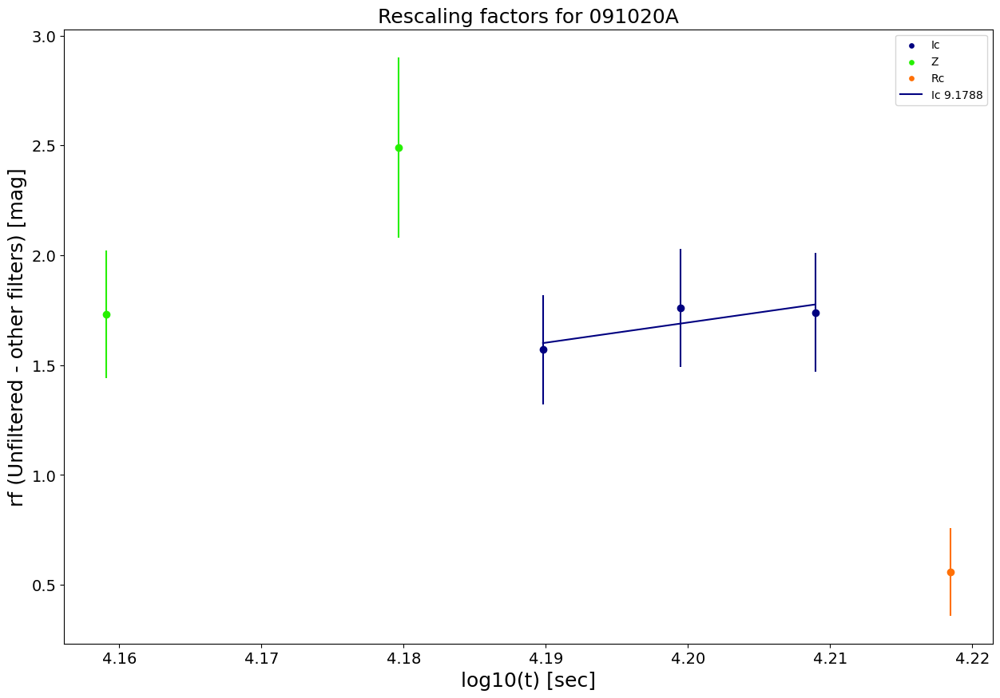


####################################################################################################

091024A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 91], ['I', 26], ['V', 25], ['B', 12], ['Rc', 10], ['Ic', 1], ['unfiltered', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 91 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    V         25  2.361728      -1.26           0.51           1.960784
1    I         26  2.569374       0.56           0.10          10.000000
2    B         12  2.643453      -0.86           0.21           4.761905
3    V         25  2.705693      -0.43           0.13           7.692308
4    I         26  2.750508       0.49           0.08          12.500000
Rescaling results
------------------
             slope slope_err intercept inter_err acceptance  \
I    

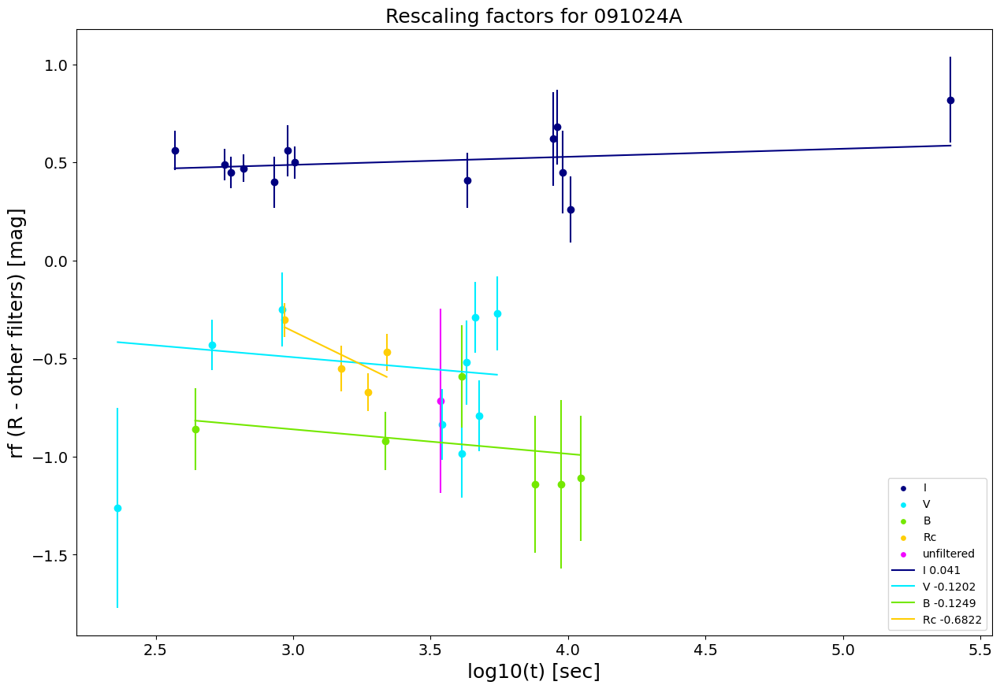


####################################################################################################

091029A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 45], ['g', 44], ['i', 44], ['z', 42], ['Unfiltered', 20], ['J', 18], ['white', 17], ['U', 16], ['K', 12], ['H', 12], ['B', 10], ['V', 9], ['clear', 6], ['0', 3], ['Ic', 2]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 45 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    g         44  2.431364  -0.252372           0.20           5.000000
1    J         18  2.431364   0.423661           0.18           5.555556
2    g         44  2.486714  -0.350000           0.06          16.666667
3    i         44  2.486714   0.060000           0.05          20.000000
4    z         42  2.486714   0.250000           0.10          10.000000
Rescaling re

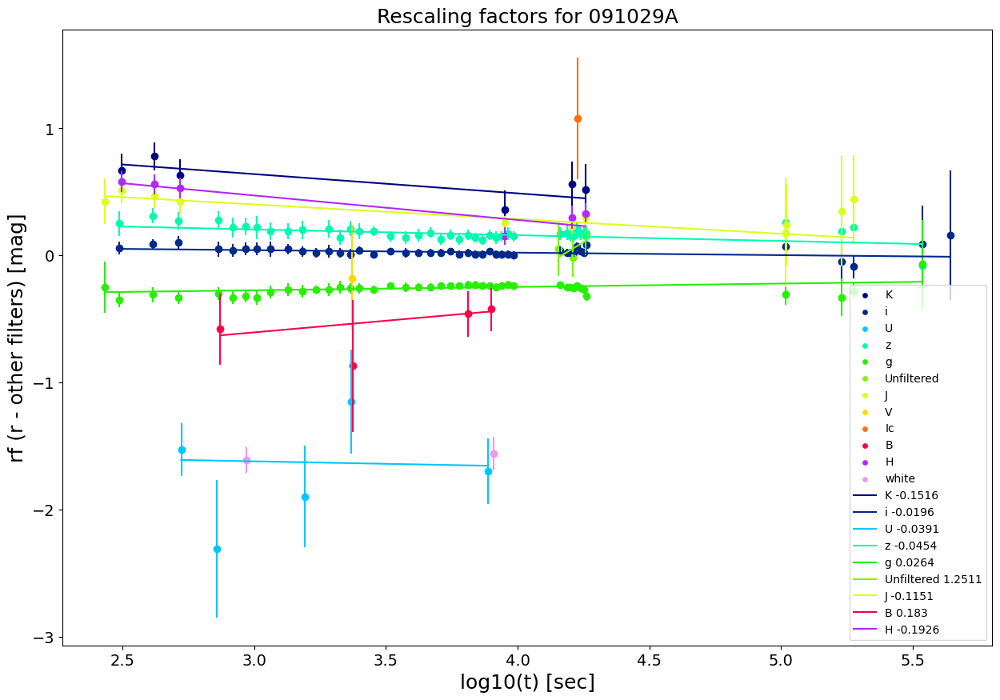


####################################################################################################

091109A
List of filters in the form: [Filter,number of points that have this filter]
[['i', 2], ['r', 1], ['g', 1], ['R', 1], ['z', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  i , with 2 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    r          1   4.85132  -0.179039            0.2           5.000000
1    g          1   4.85132  -1.043621            0.2           5.000000
2    z          1   4.85132   0.083369            0.3           3.333333
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

091127A
List of filters in the form: [Filter,number of points that have this filter]
[['g', 156], ['r', 156], ['i', 156], ['z', 

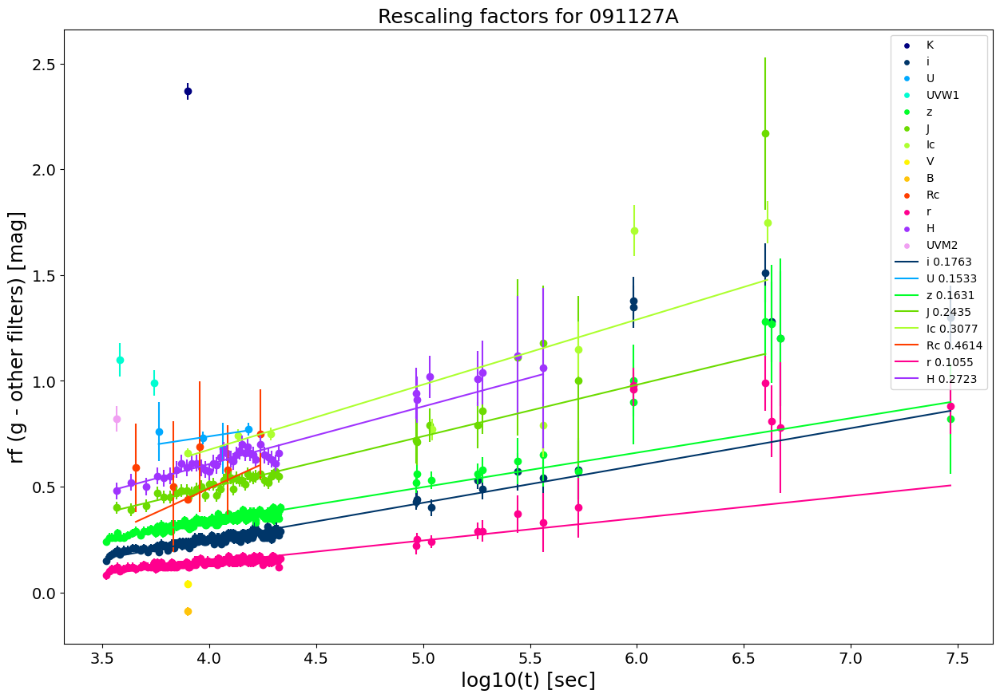


####################################################################################################

091208B
List of filters in the form: [Filter,number of points that have this filter]
[['clear', 21], ['R', 6], ['Rc', 4], ['Ic', 4], ['g', 4], ['I', 2], ['U', 1], ['white', 1], ['r', 1], ['H', 1], ['B', 1], ['i', 1], ['z', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  clear , with 21 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0   Rc          4  1.892095  -0.360000           0.17           5.882353
1   Ic          4  1.892095   0.210747           0.17           5.882353
2    g          4  1.892095  -1.392395           0.27           3.703704
3    R          6  2.757396  -0.349678           0.18           5.555556
No filter with at least 3 rescaling factors to be fitted

###################################################

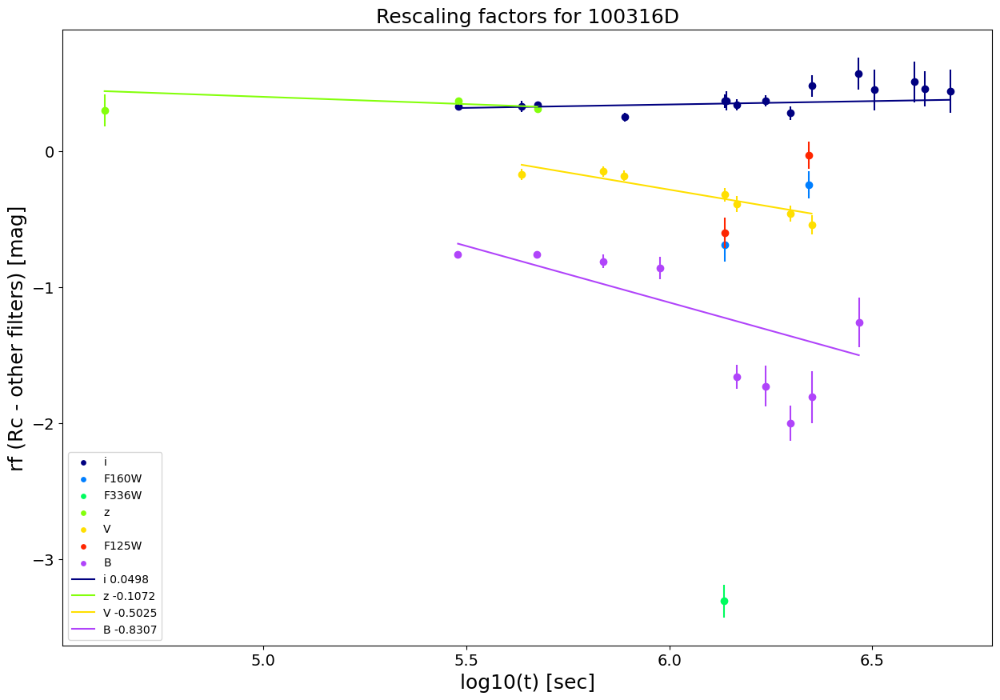


####################################################################################################

100414A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 3], ['white', 2], ['Rc', 1], ['g', 1], ['i', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 3 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    g          1  5.419625  -0.366043            0.2                5.0
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

100418A
List of filters in the form: [Filter,number of points that have this filter]
[['Rc', 34], ['white', 14], ['r', 10], ['g', 8], ['J', 8], ['i', 7], ['K', 7], ['UVW1', 7], ['B', 6], ['UVM2', 6], ['H', 5], ['z', 5], ['U', 4], ['UVW2', 4], ['Ic', 3], ['u',

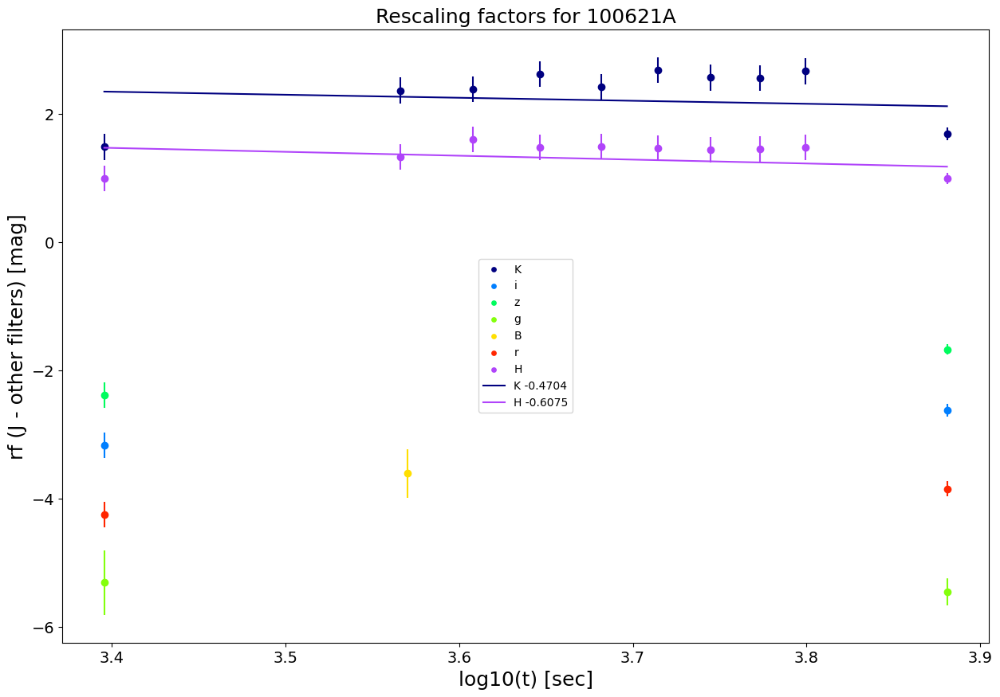


####################################################################################################

100724A
List of filters in the form: [Filter,number of points that have this filter]
[['U', 2]]
 
The most numerous filter is considered for rescaling
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/100724A_magAB_extcorr.txt has only one filter along all the LC, thus no rescaling is needed

####################################################################################################

100728A
List of filters in the form: [Filter,number of points that have this filter]
[['H', 1], ['r', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  H , with 1 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

########################

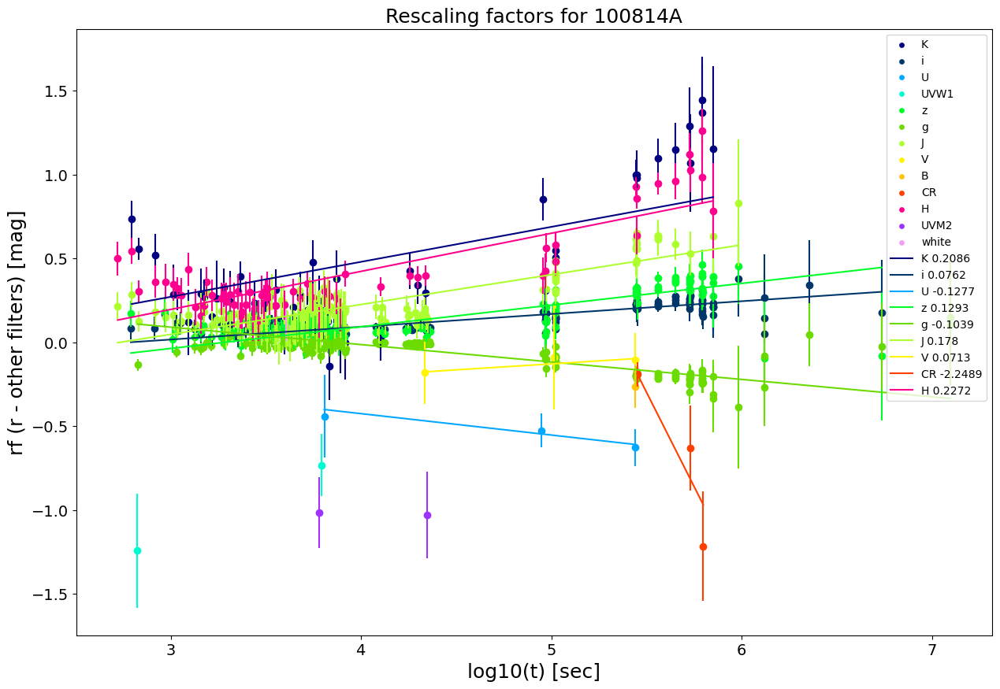


####################################################################################################

100816A
List of filters in the form: [Filter,number of points that have this filter]
[['white', 3], ['U', 2], ['R', 2], ['r', 1], ['B', 1], ['UVW1', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  white , with 3 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

100901A
List of filters in the form: [Filter,number of points that have this filter]
[['Rc', 29], ['R', 24], ['I', 14], ['Ic', 12], ['g', 12], ['V', 11], ['Unfiltered', 10], ['B', 6], ['CR', 4], ['unfiltered', 3], ['white', 3], ['U', 3], ['r_Gunn', 1], ['UVW1', 1], ['UVW2', 1], ['

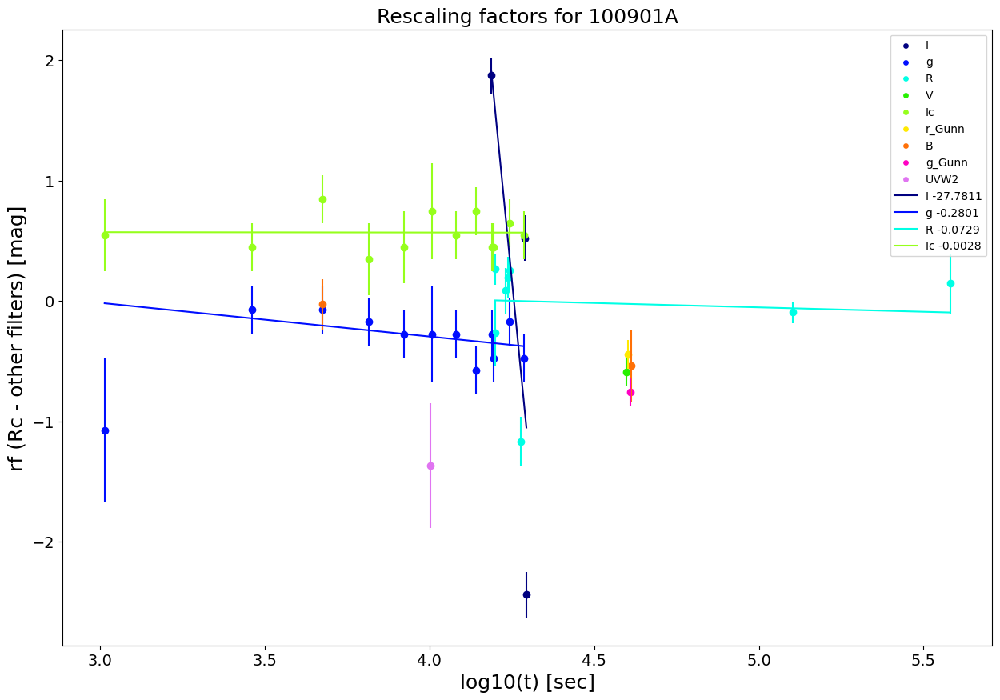


####################################################################################################

100905A
List of filters in the form: [Filter,number of points that have this filter]
[['K', 1], ['H', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  K , with 1 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    H          1  4.761078  -0.210022           0.69           1.449275
1    J          1  4.761078  -0.323218           0.63           1.587302
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

100906A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 22], ['CR', 19], ['Rc', 15], ['g', 4], ['Ic', 3], ['U', 2], ['Unfiltered', 2], ['V', 2], ['r', 1], ['K', 1], ['B', 1], ['UVW1', 1

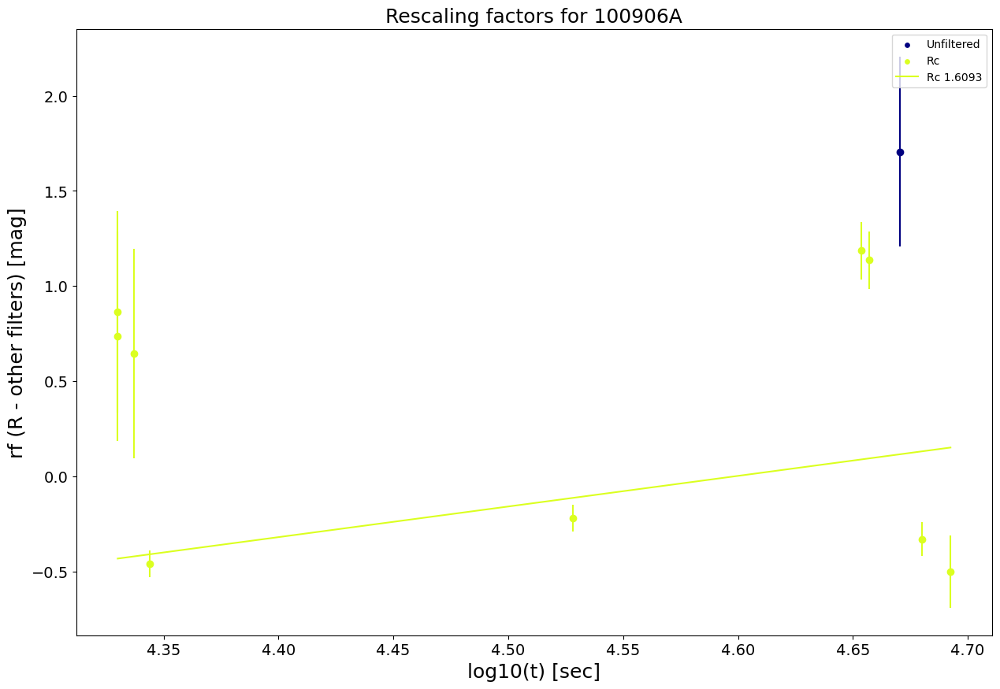


####################################################################################################

101219A
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/101219A_magAB_extcorr.txt has only limiting magnitudes, thus it will be skipped

----------------------------------------------------------------------------------------------------


####################################################################################################

101219B
List of filters in the form: [Filter,number of points that have this filter]
[['i', 17], ['z', 17], ['r', 17], ['g', 14], ['H', 7], ['J', 6], ['K', 5], ['white', 3], ['U', 2], ['UVW2', 2], ['UVW1', 2], ['B', 2], ['V', 2], ['UVM2', 2]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  i , with 17 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    z         17  4.477176   0

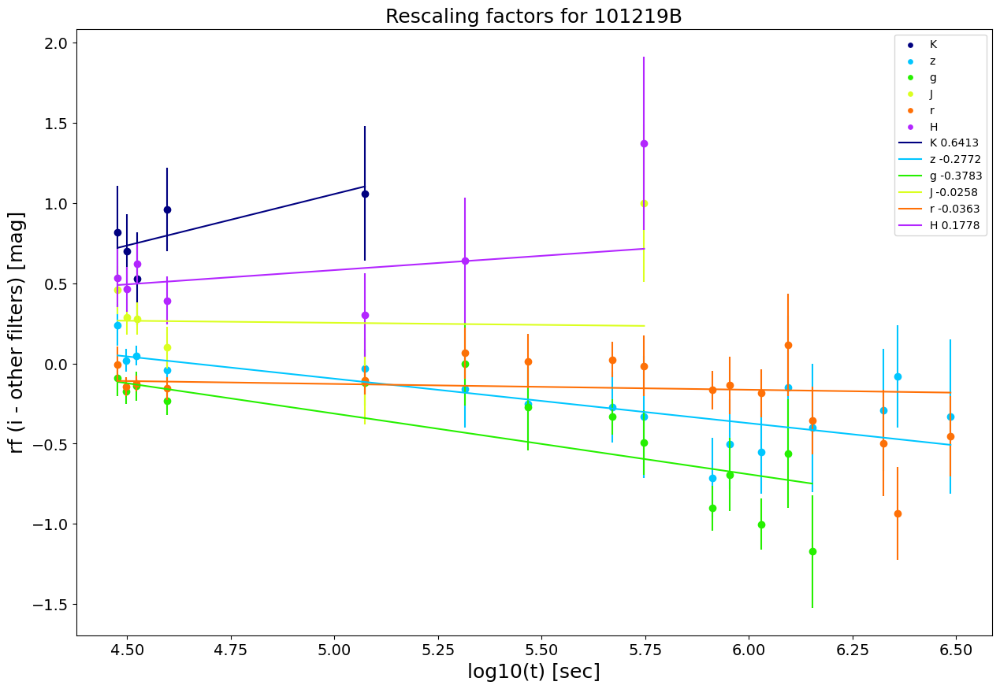


####################################################################################################

101225A
List of filters in the form: [Filter,number of points that have this filter]
[['UVW2', 19], ['r', 17], ['R', 16], ['UVM2', 10], ['i', 9], ['I', 7], ['UVW1', 7], ['g', 5], ['B', 4], ['z', 4], ['U', 3], ['V', 2], ['F606W', 1], ['F435W', 1], ['K', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  UVW2 , with 19 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
   band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0     z          4  4.419159  -3.353470           0.48           2.083333
1     V          2  4.949298  -1.346995           0.36           2.777778
2  UVW1          7  5.170588   0.692239           0.55           1.818182
3     r         17  5.201269  -1.843295           0.41           2.439024
4  UVM2         10  5.205160  -1.442062           0.56           1.785714
No filter w

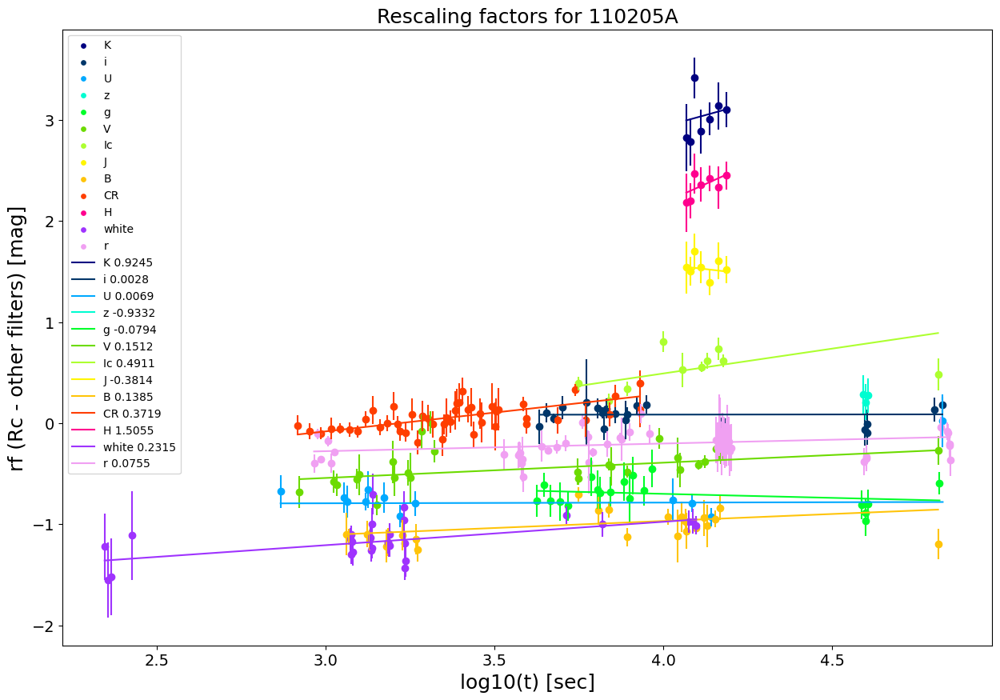


####################################################################################################

110213A
List of filters in the form: [Filter,number of points that have this filter]
[['white', 60], ['clear', 45], ['U', 43], ['V', 34], ['I', 31], ['r', 19], ['B', 18], ['Rc', 18], ['i', 17], ['g', 14], ['z', 14], ['Ic', 4], ['UVM2', 1], ['UVW1', 1], ['UVW2', 1], ['R', 1], ['Unfiltered', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  white , with 60 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
    band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0  clear         45  2.012837   0.276063          0.250           4.000000
1      V         34  2.107210   0.506866          0.160           6.250000
2     Rc         18  2.157759   0.706063          0.150           6.666667
3      I         31  2.206826   0.833689          0.130           7.692308
4      r         19  2.209515   0.445939 

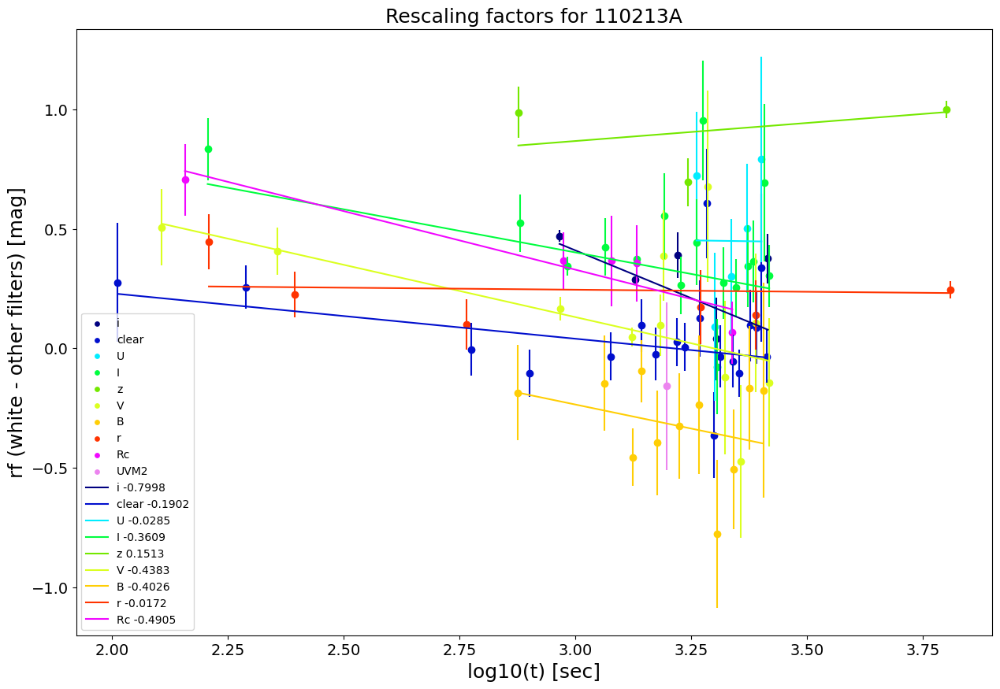


####################################################################################################

110213B
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/110213B_magAB_extcorr.txt has only one data point along all the LC, thus no rescaling is needed

----------------------------------------------------------------------------------------------------


####################################################################################################

110422A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 25], ['U', 2], ['B', 2], ['white', 2], ['r', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 25 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    U          2  3.001734  -1.236158           0.46           2.173913
No filter with at least 3 rescalin

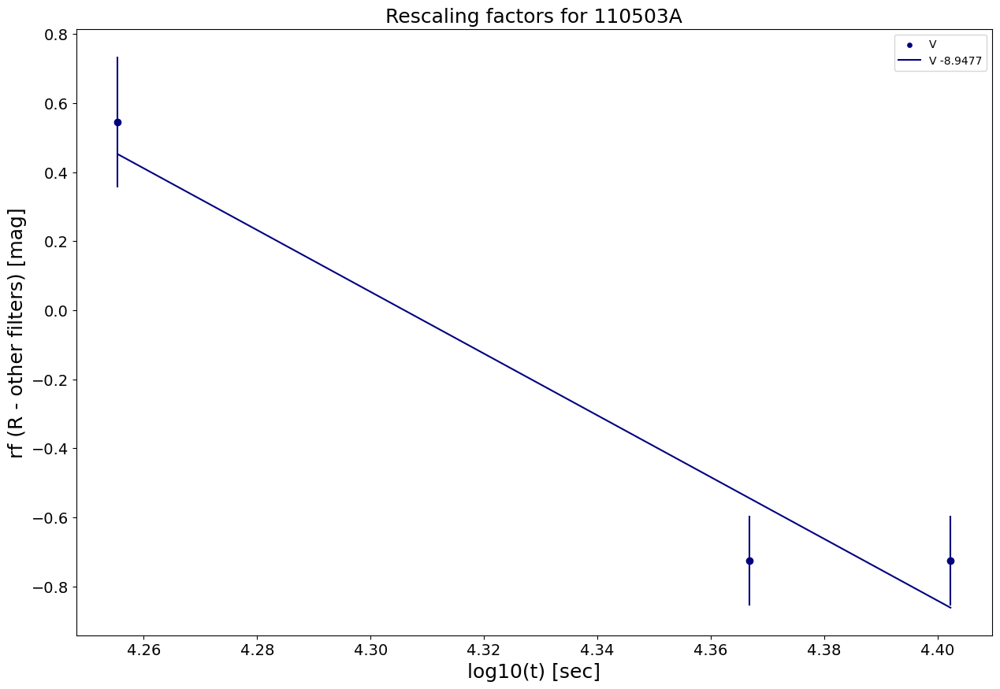


####################################################################################################

110715A
List of filters in the form: [Filter,number of points that have this filter]
[['white', 30], ['V', 11], ['U', 7], ['K', 5], ['H', 5], ['B', 5], ['z', 5], ['g', 5], ['r', 5], ['i', 5], ['J', 5], ['R', 3], ['Ic', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  white , with 30 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    V         11  4.839700       1.26           0.37           2.702703
1    V         11  4.938519       1.70           0.28           3.571429
2    U          7  4.940007       0.08           0.51           1.960784
3    V         11  5.207807       1.91           0.61           1.639344
4    V         11  5.394413       2.61           1.03           0.970874
Rescaling results
------------------
    slope slo

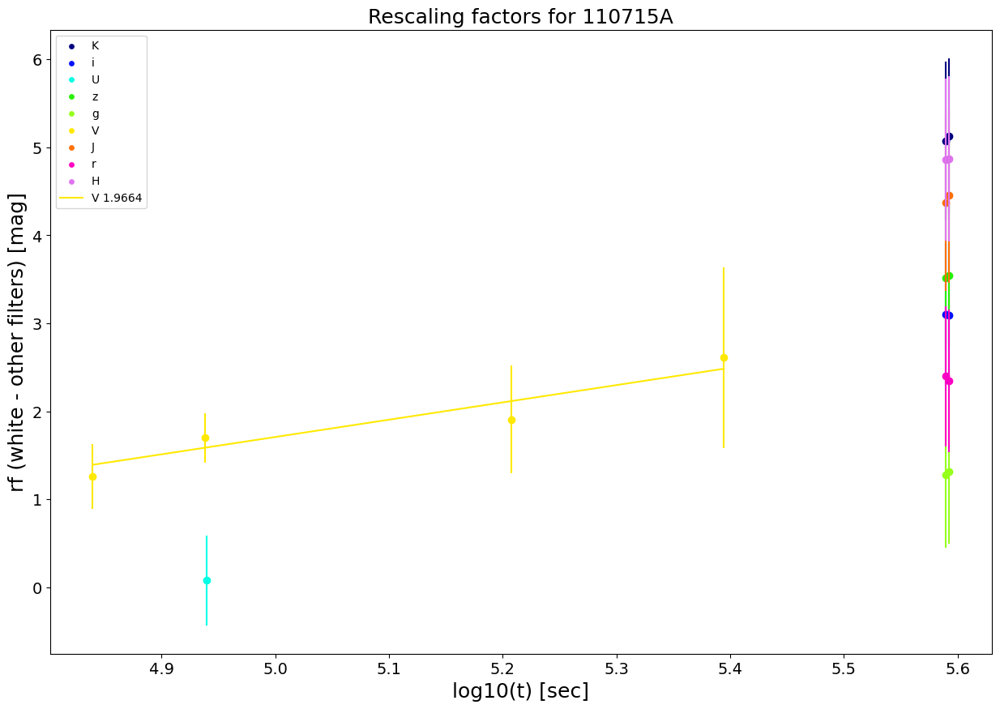


####################################################################################################

110731A
List of filters in the form: [Filter,number of points that have this filter]
[['I', 32], ['V', 25], ['U', 12], ['B', 5], ['white', 3], ['r', 1], ['H', 1], ['R', 1], ['i', 1], ['g', 1], ['z', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  I , with 32 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    U         12  2.526985  -1.830000           0.38           2.631579
1    B          5  2.866287  -1.600000           0.71           1.408451
2    V         25  2.902818   0.190544           0.35           2.857143
3    U         12  3.052117  -0.345289           0.58           1.724138
4    V         25  3.599665  -1.020000           0.49           2.040816
No filter with at least 3 rescaling factors to be fitted

######

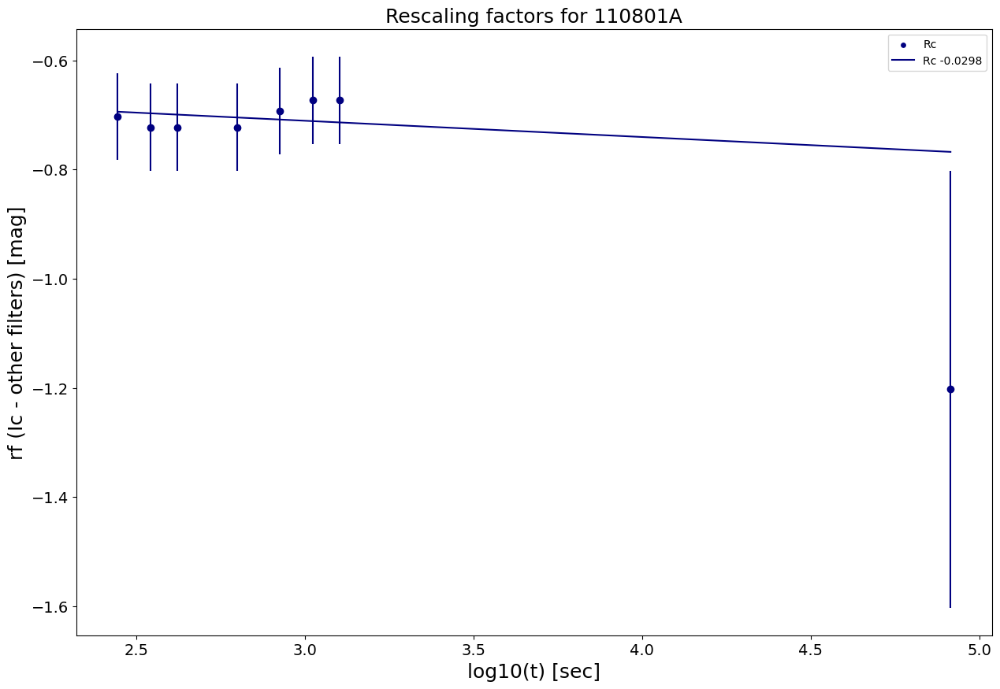


####################################################################################################

110808A
List of filters in the form: [Filter,number of points that have this filter]
[['U', 2], ['white', 1], ['B', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  U , with 2 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

110818A
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/110818A_magAB_extcorr.txt has only limiting magnitudes, thus it will be skipped

----------------------------------------------------------------------------------------------------


##############################################################

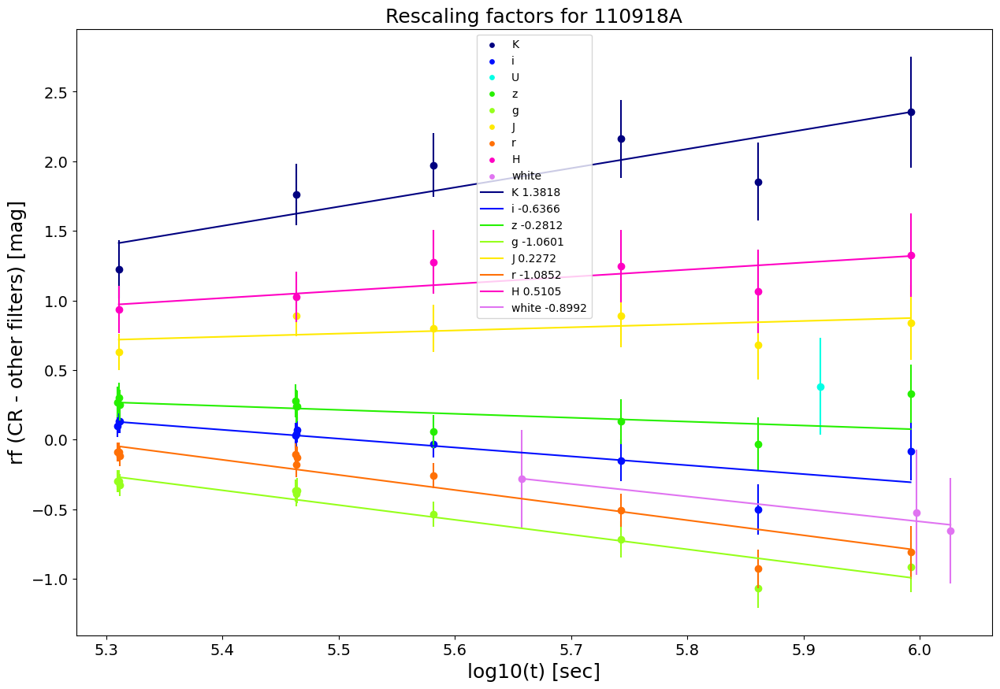


####################################################################################################

111005A
List of filters in the form: [Filter,number of points that have this filter]
[['i', 1], ['K', 1], ['g', 1], ['r', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  i , with 1 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    g          1  7.297320  -1.000457          0.004         250.000000
1    r          1  7.297452  -0.129037          0.003         333.333333
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

111008A
List of filters in the form: [Filter,number of points that have this filter]
[['K', 1], ['H', 1], ['r', 1], ['i', 1], ['z', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most n

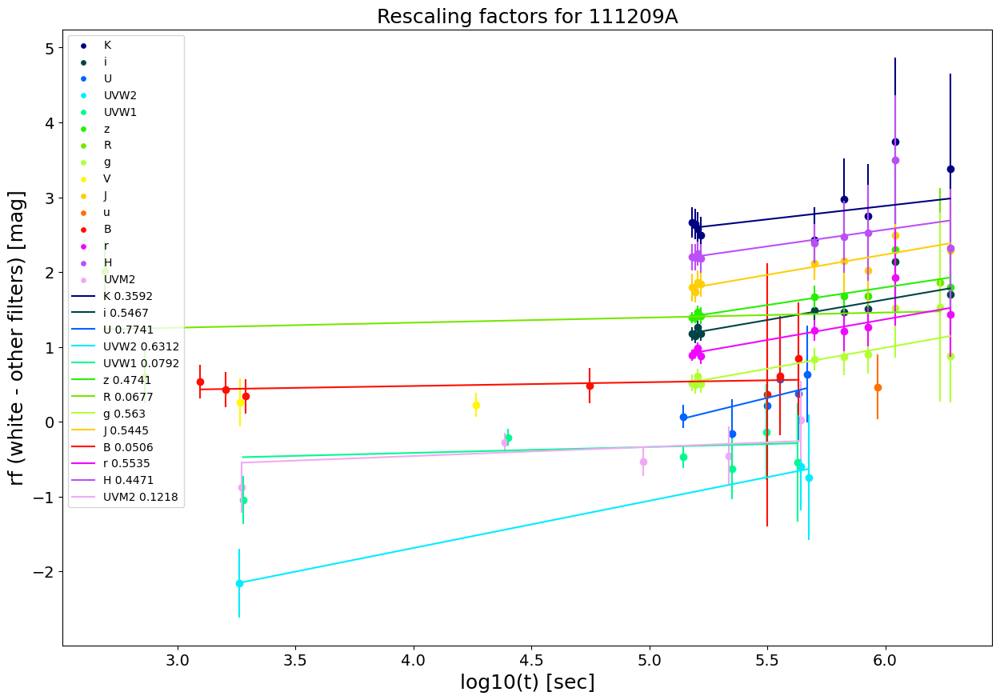


####################################################################################################

111211A
List of filters in the form: [Filter,number of points that have this filter]
[['white', 4], ['R', 2]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  white , with 4 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

111225A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 6], ['U', 2], ['UVW2', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 6 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Oc

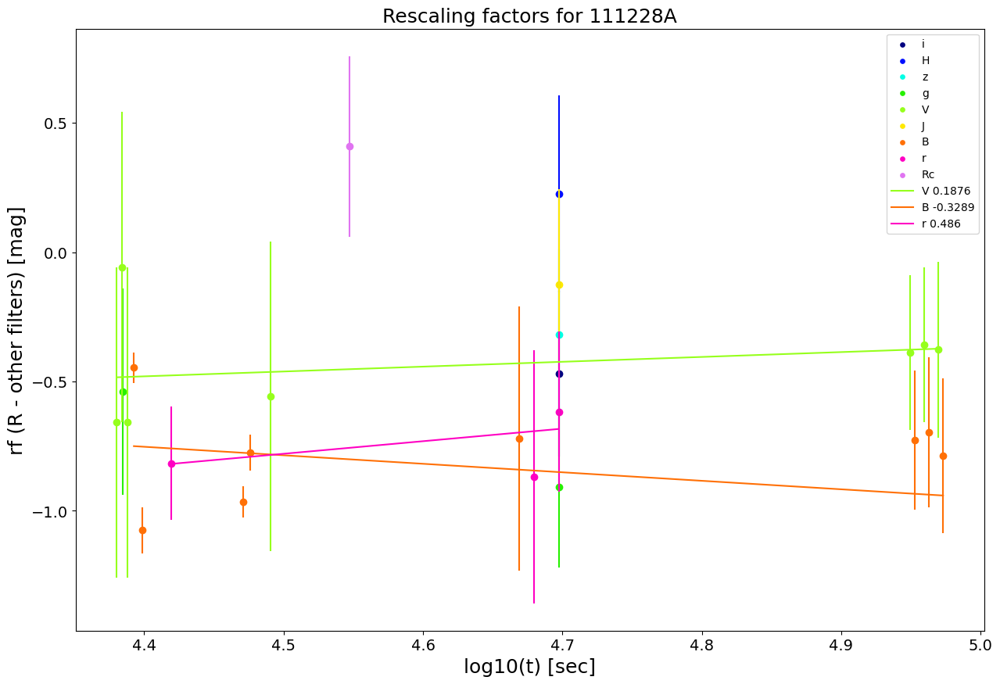


####################################################################################################

111229A
List of filters in the form: [Filter,number of points that have this filter]
[['U', 2], ['i', 2], ['white', 2], ['J', 1], ['r', 1], ['g', 1], ['B', 1], ['R', 1], ['z', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  U , with 2 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

120119A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 94], ['I', 84], ['J', 44], ['K', 43], ['r', 42], ['H', 42], ['unfiltered', 38], ['Clear', 24], ['B', 18], ['i', 15], ['V', 8], ['z', 7], ['g', 3], ['white', 3]]
 
The

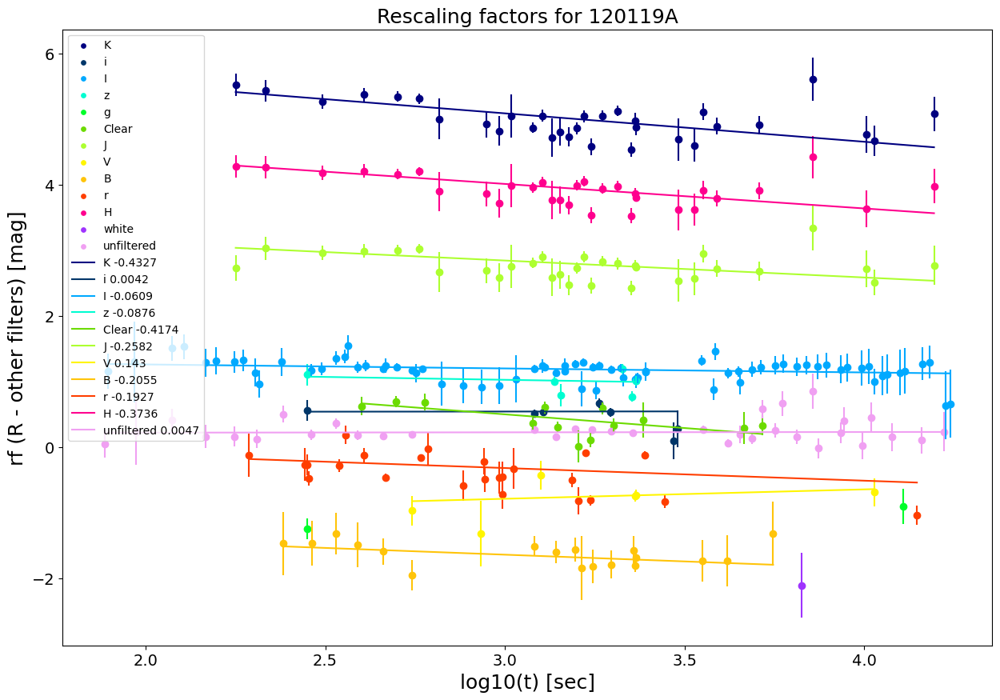


####################################################################################################

120326A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 54], ['r', 11], ['U', 9], ['UVW1', 6], ['white', 5], ['B', 5], ['g', 5], ['V', 4], ['i', 4], ['z', 3], ['H', 2], ['K', 2], ['I', 2], ['J', 2], ['UVW2', 1], ['Unfiltered', 1], ['unfiltered', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 54 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    r         11  2.932474   0.704623           0.46           2.173913
1    r         11  2.935003   0.412235           0.50           2.000000
2    r         11  2.975891   0.224623           0.34           2.941176
3    r         11  3.027350   0.094623           0.24           4.166667
4    i          4  3.088136   0.119590           0.27           

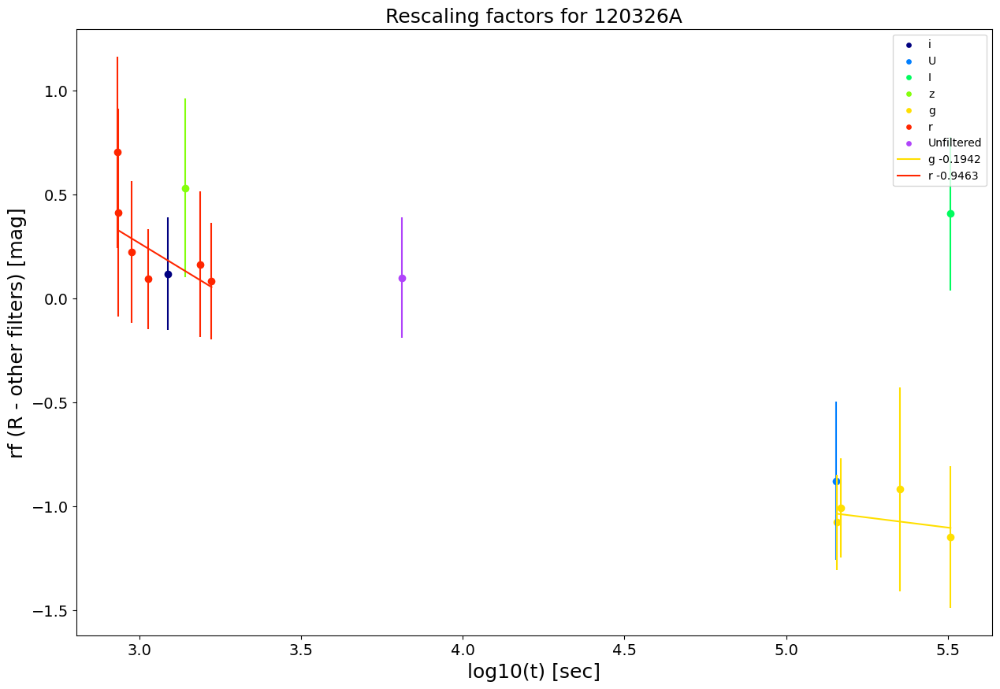


####################################################################################################

120327A
List of filters in the form: [Filter,number of points that have this filter]
[['Ic', 98], ['Rc', 93], ['V', 51], ['B', 25], ['g', 24], ['J', 23], ['H', 19], ['K', 17], ['I', 16], ['R', 13], ['r', 11], ['i', 11], ['z', 11], ['U', 8], ['CR', 6], ['clear', 1], ['Y', 1], ['UVW1', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  Ic , with 98 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
   band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0     B         25  2.851870  -1.754788           0.14           7.142857
1     H         19  2.856124   1.806565           0.05          20.000000
2  UVW1          1  2.866583  -4.303408           0.60           1.666667
3    Rc         93  2.867467  -0.523210           0.02          50.000000
4    CR          6  2.907411  -0.309574           0.11 

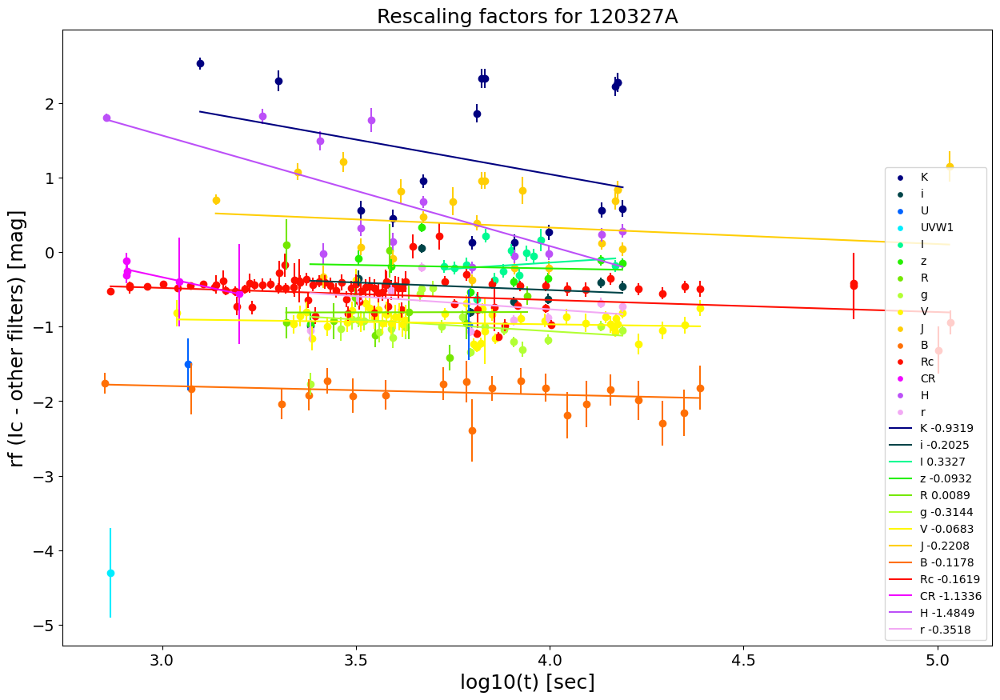


####################################################################################################

120404A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 59], ['i', 42], ['B', 32], ['V', 14], ['unfiltered', 8], ['U', 5], ['I', 4], ['Ic', 3], ['H', 2], ['g', 2], ['r', 2], ['z', 2], ['Rc', 2], ['J', 2], ['white', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 59 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
         band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  \
0  unfiltered          8  3.800098   0.167766           0.35   
1          Ic          3  3.901022   1.090397           0.24   
2           U          5  7.953129  -1.192051           0.49   
3           B         32  8.254577  -0.940866           0.11   
4           i         42  8.401599  -0.080395           0.09   

   Resc_fact_weights  
0           2.857143  
1           4.166667  
2     

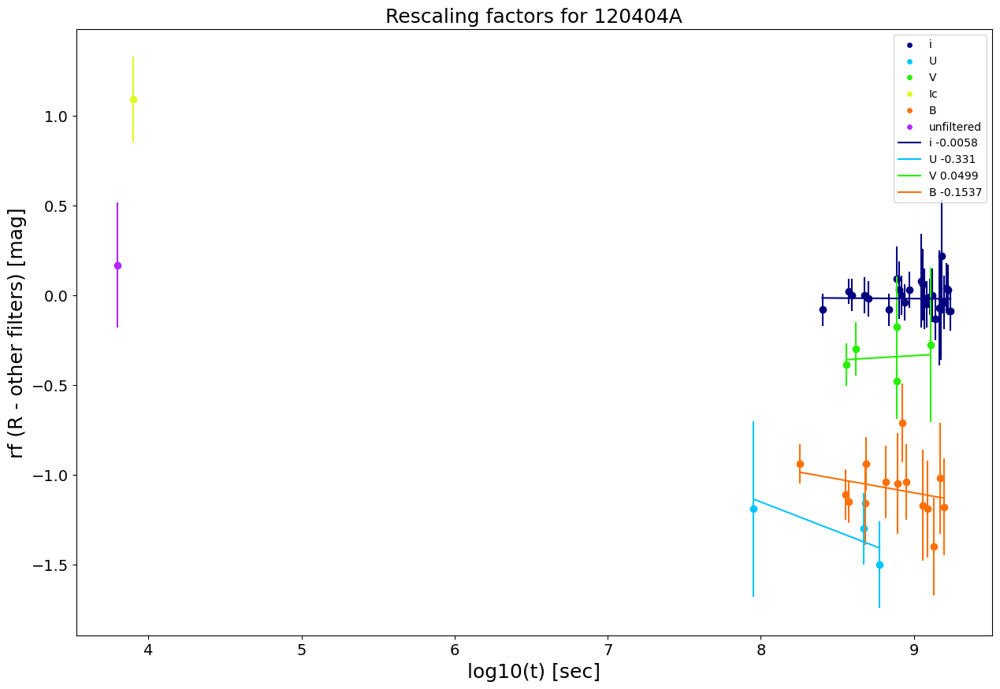


####################################################################################################

120422A
List of filters in the form: [Filter,number of points that have this filter]
[['i', 58], ['r', 46], ['g', 26], ['z', 21], ['R', 12], ['J', 11], ['I', 8], ['B', 8], ['U', 7], ['H', 6], ['V', 6], ['UVM2', 5], ['UVW1', 4], ['white', 3], ['UVW2', 3], ['K', 1], ['CR', 1], ['Y', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  i , with 58 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    r         46  4.774977      -0.18           0.32           3.125000
1    g         26  4.774977      -0.20           0.28           3.571429
2    z         21  4.774977       0.00           0.38           2.631579
3    r         46  4.790299      -0.04           0.14           7.142857
4    g         26  4.790299       0.01           0.12           

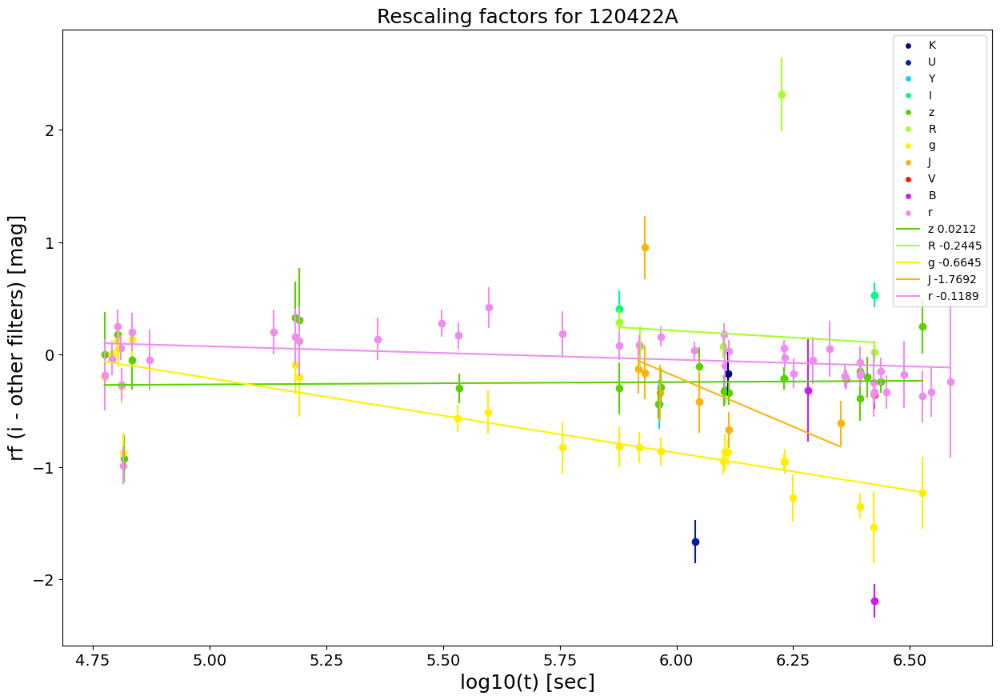


####################################################################################################

120521C
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/120521C_magAB_extcorr.txt has only one data point along all the LC, thus no rescaling is needed

----------------------------------------------------------------------------------------------------


####################################################################################################

120624B
List of filters in the form: [Filter,number of points that have this filter]
[['K', 4], ['H', 1], ['g', 1], ['r', 1], ['i', 1], ['z', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  K , with 4 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    H          1  7.244022  -0.839955           0.46           2.173913
1    J          1  7.244025  -

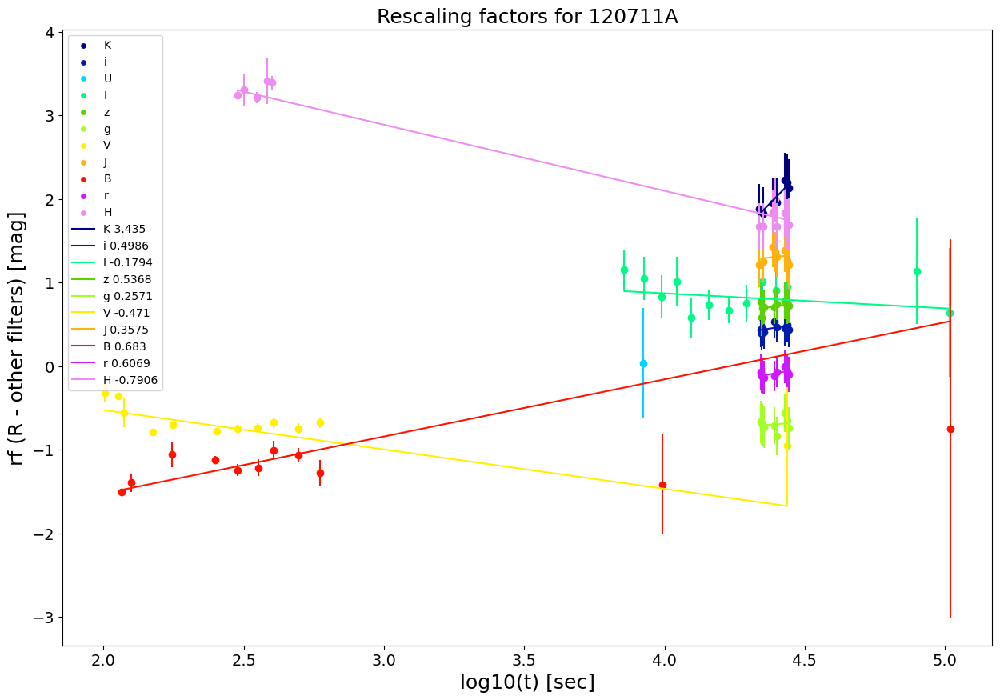


####################################################################################################

120712A
List of filters in the form: [Filter,number of points that have this filter]
[['H', 2], ['white', 2], ['g', 1], ['r', 1], ['i', 1], ['z', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  H , with 2 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    g          1  4.524964  -2.962417            0.2                5.0
1    r          1  4.524964  -1.212610            0.2                5.0
2    i          1  4.524964  -0.542316            0.2                5.0
3    z          1  4.524964  -0.465885            0.2                5.0
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

120714B
List of filters in the 

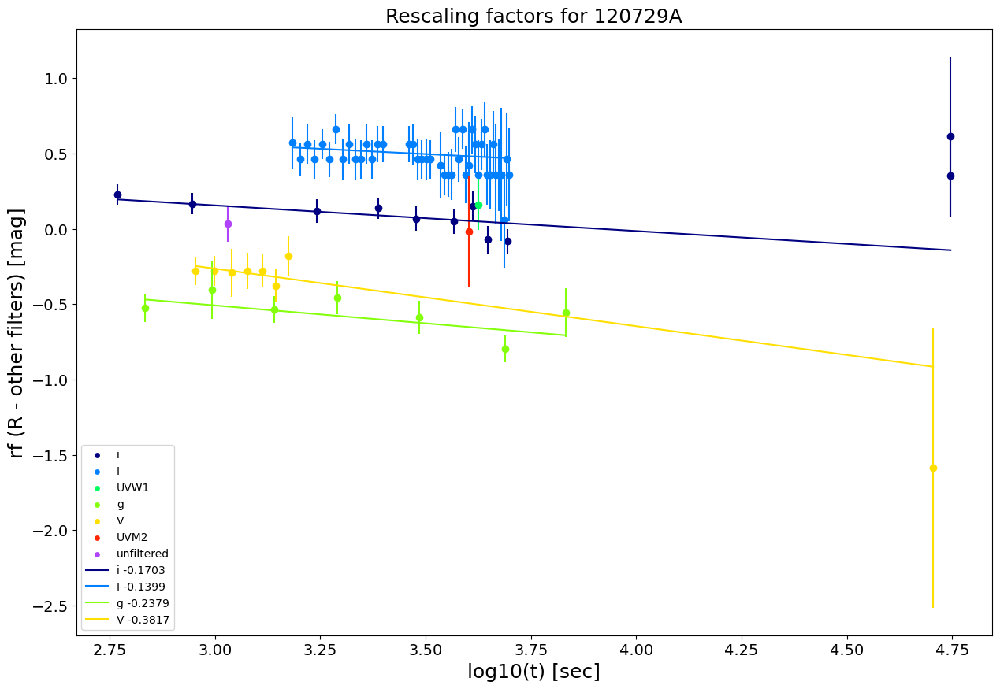


####################################################################################################

120802A
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/120802A_magAB_extcorr.txt has only one data point along all the LC, thus no rescaling is needed

----------------------------------------------------------------------------------------------------


####################################################################################################

120805A
List of filters in the form: [Filter,number of points that have this filter]
[['i', 1], ['r', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  i , with 1 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

############################################################

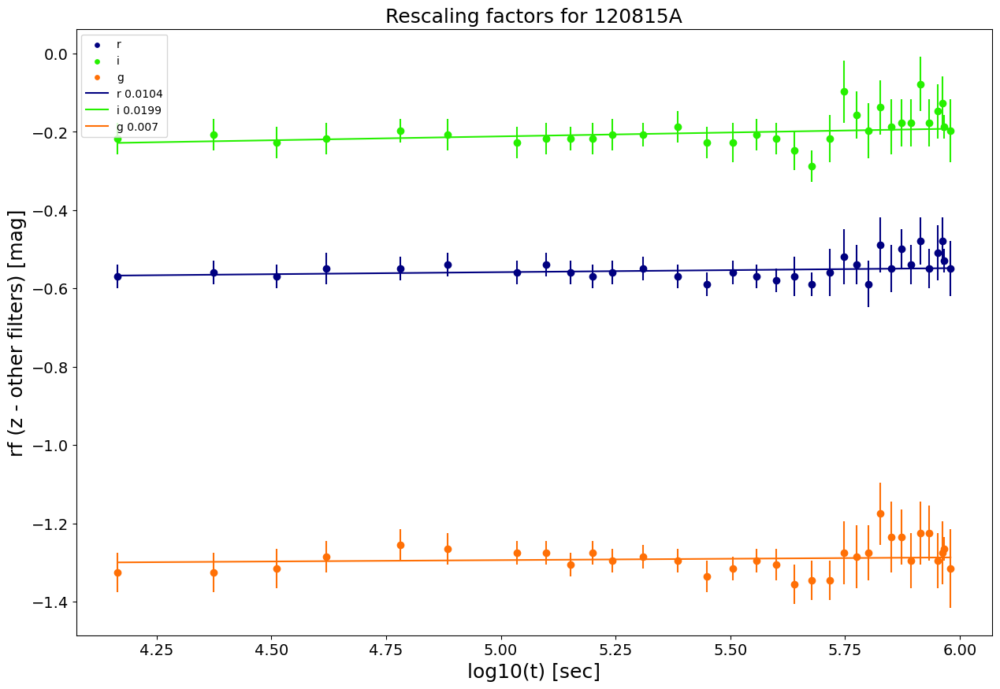


####################################################################################################

120907A
List of filters in the form: [Filter,number of points that have this filter]
[['CR', 4], ['U', 2], ['UVM2', 1], ['UVW2', 1], ['I', 1], ['B', 1], ['UVW1', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  CR , with 4 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

120909A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 6], ['white', 1], ['H', 1], ['K', 1], ['g', 1], ['r', 1], ['i', 1], ['z', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , wit

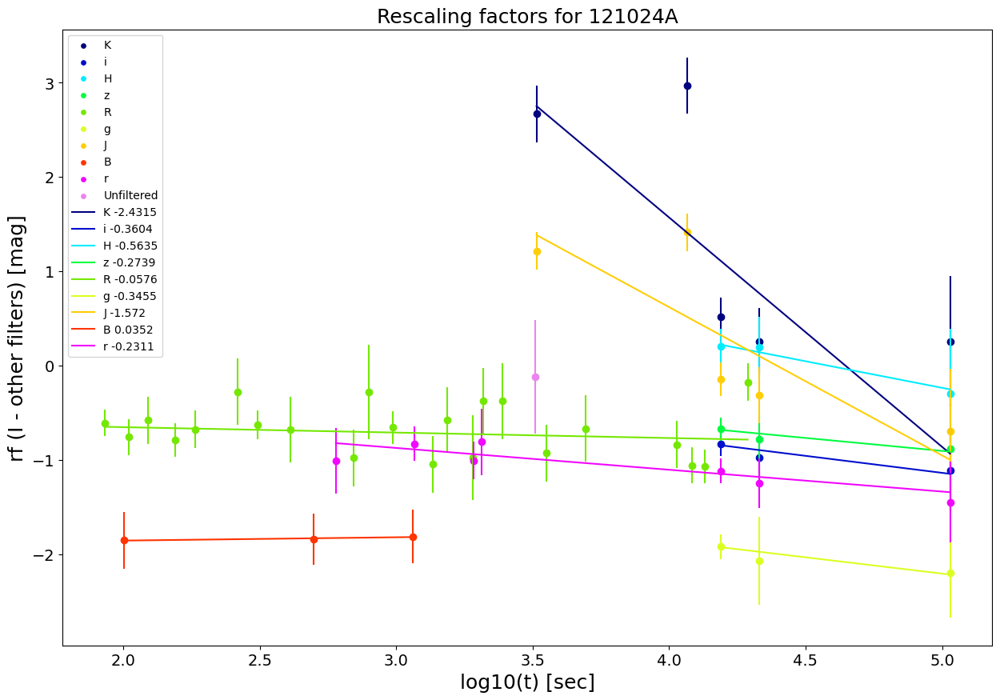


####################################################################################################

121027A
List of filters in the form: [Filter,number of points that have this filter]
[['K', 2], ['white', 1], ['H', 1], ['g', 1], ['r', 1], ['i', 1], ['R', 1], ['z', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  K , with 2 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    g          1  5.248831  -3.029732            0.3           3.333333
1    r          1  5.248831  -2.554009            0.2           5.000000
2    i          1  5.248831  -2.268377            0.2           5.000000
3    z          1  5.248831  -1.879777            0.2           5.000000
4    H          1  5.250859  -0.696277            0.2           5.000000
No filter with at least 3 rescaling factors to be fitted

########################################

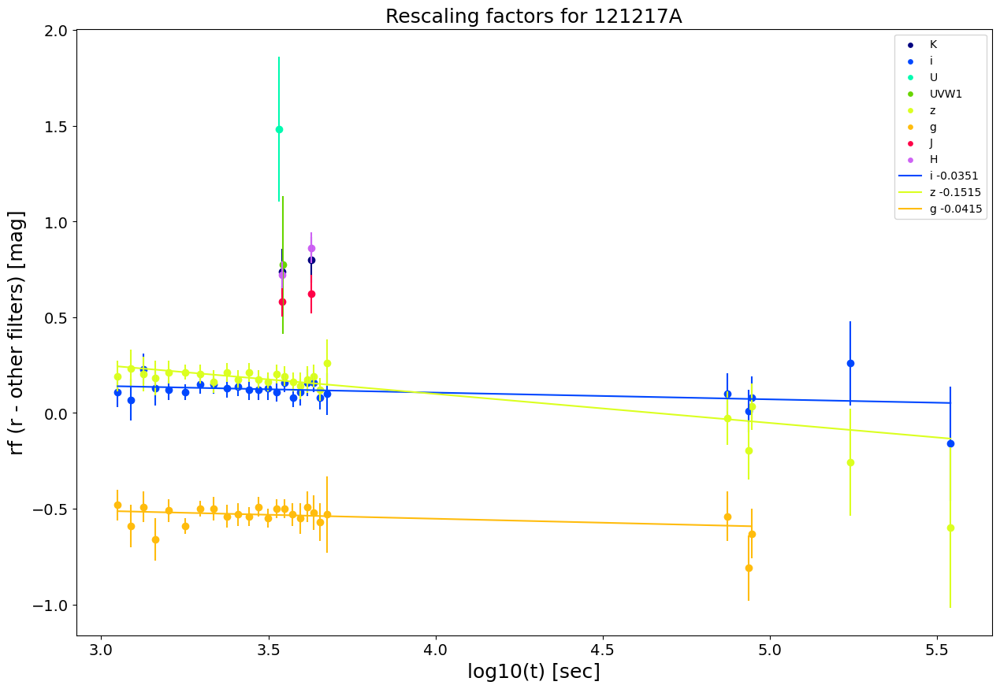


####################################################################################################

121229A
List of filters in the form: [Filter,number of points that have this filter]
[['H', 1], ['g', 1], ['r', 1], ['i', 1], ['z', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  H , with 1 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    g          1  3.584331  -1.485932            0.3           3.333333
1    r          1  3.584331  -0.973474            0.2           5.000000
2    i          1  3.584331  -0.884467            0.2           5.000000
3    z          1  3.584331  -0.772533            0.2           5.000000
4    J          1  3.584331  -0.653700            0.2           5.000000
No filter with at least 3 rescaling factors to be fitted

##########################################################################

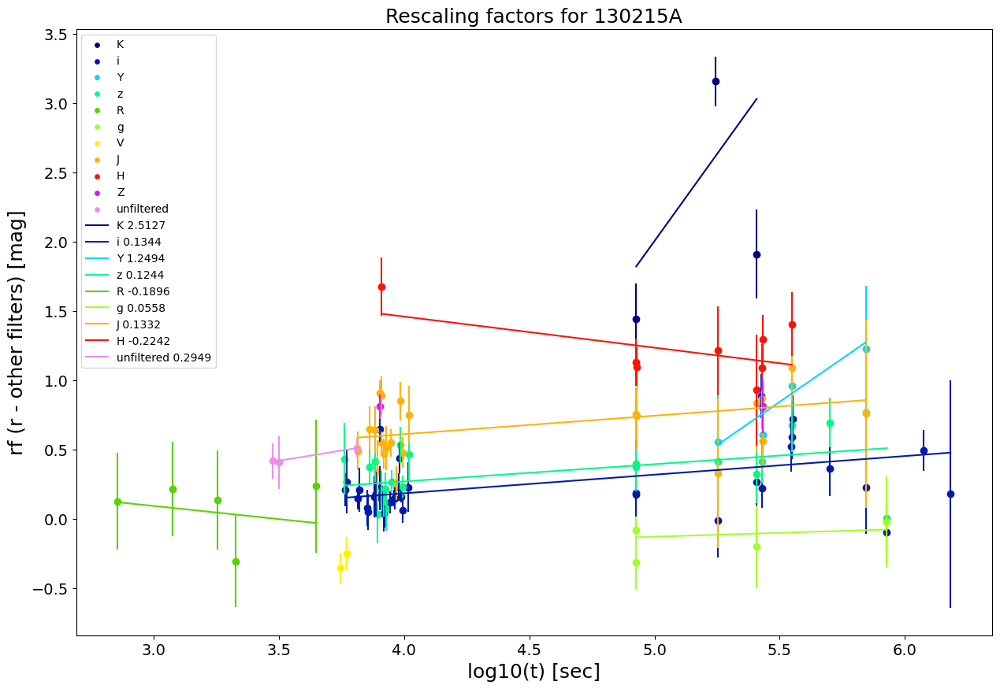


####################################################################################################

130408A
List of filters in the form: [Filter,number of points that have this filter]
[['J', 4], ['white', 3], ['I', 3], ['V', 2], ['r', 1], ['H', 1], ['K', 1], ['g', 1], ['i', 1], ['z', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  J , with 4 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    H          1  3.761928   0.126476            0.2           5.000000
1    I          3  3.978911  -0.788546            0.2           5.000000
2    I          3  4.198217  -0.788546            0.3           3.333333
3    K          1  4.198217   1.680805            0.4           2.500000
4    I          3  4.321578  -1.188546            0.3           3.333333
Rescaling results
------------------
    slope slope_err intercept inter_err acceptance 

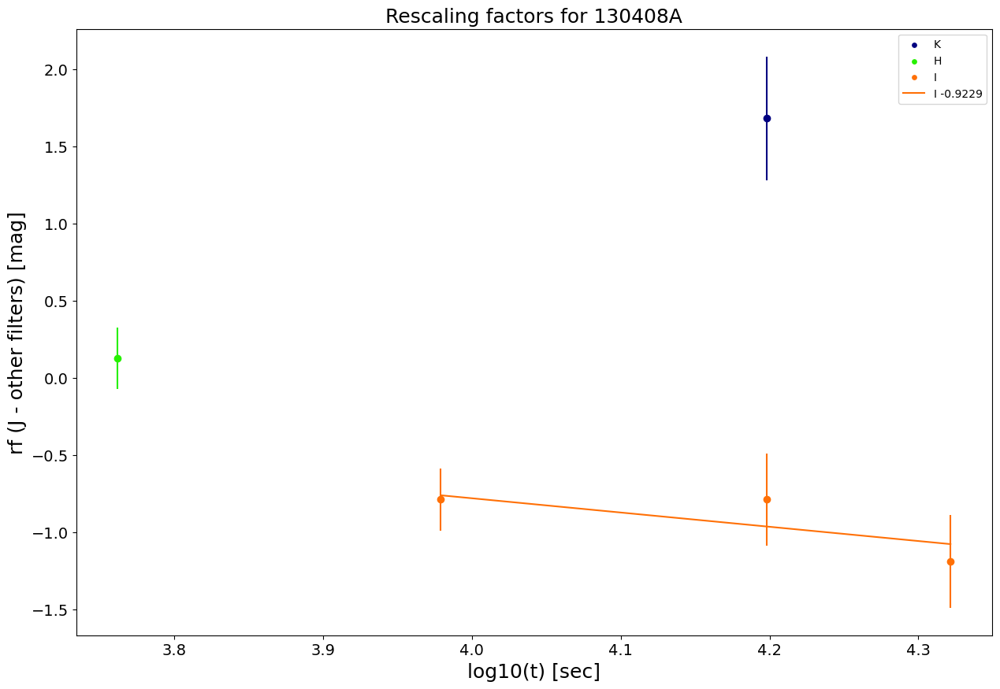


####################################################################################################

130418A
List of filters in the form: [Filter,number of points that have this filter]
[['i', 126], ['r', 115], ['Z', 46], ['J', 45], ['H', 45], ['Y', 45], ['Unfiltered', 14], ['V', 10], ['K', 3], ['I', 3], ['white', 2], ['U', 1], ['R', 1], ['UVW2', 1], ['g', 1], ['UVW1', 1], ['B', 1], ['z', 1], ['UVM2', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  i , with 126 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    r        115  4.360215  -0.219684           0.06          16.666667
1    J         45  4.360215   0.569024           0.08          12.500000
2    H         45  4.360215   1.010549           0.08          12.500000
3    K          3  4.360215   1.365285           0.14           7.142857
4    g          1  4.360215  -0.515356   

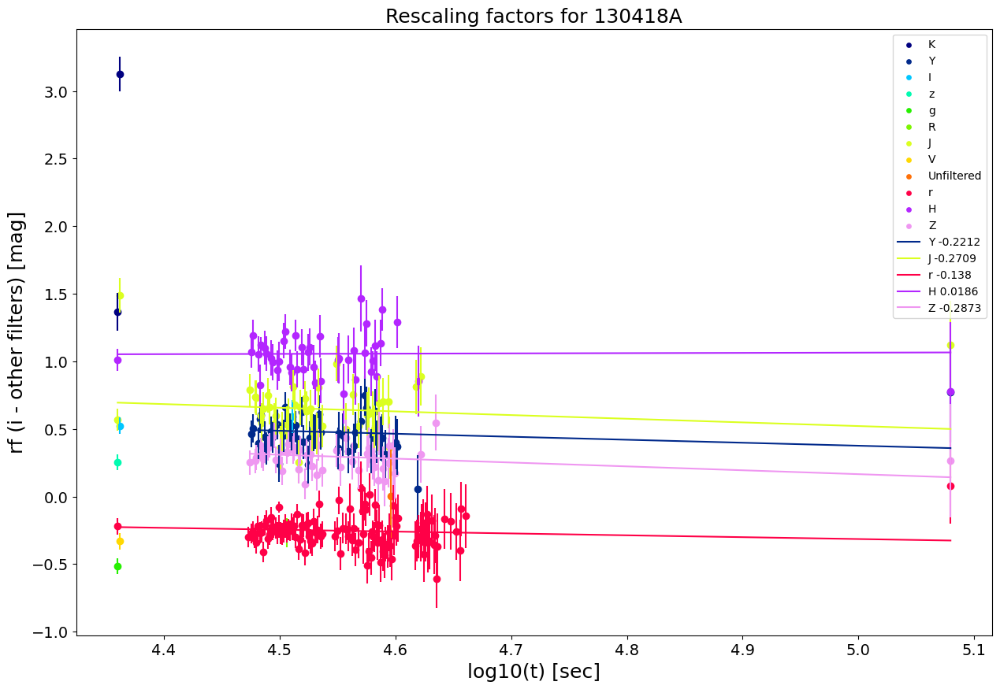


####################################################################################################

130420A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 31], ['i', 31], ['Z', 10], ['J', 5], ['Y', 3], ['H', 3], ['K', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 31 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    i         31  3.953262   0.490609       0.127473           7.844799
1    J          5  3.953583   1.093128       0.263534           3.794577
2    Z         10  3.953632   0.596498       0.204201           4.897136
3    i         31  3.958817   0.183750       0.133563           7.487103
4    i         31  3.963434   0.163364       0.120739           8.282328
Rescaling results
------------------
    slope slope_err intercept inter_err acceptance           red_chi2  \
i -0.829

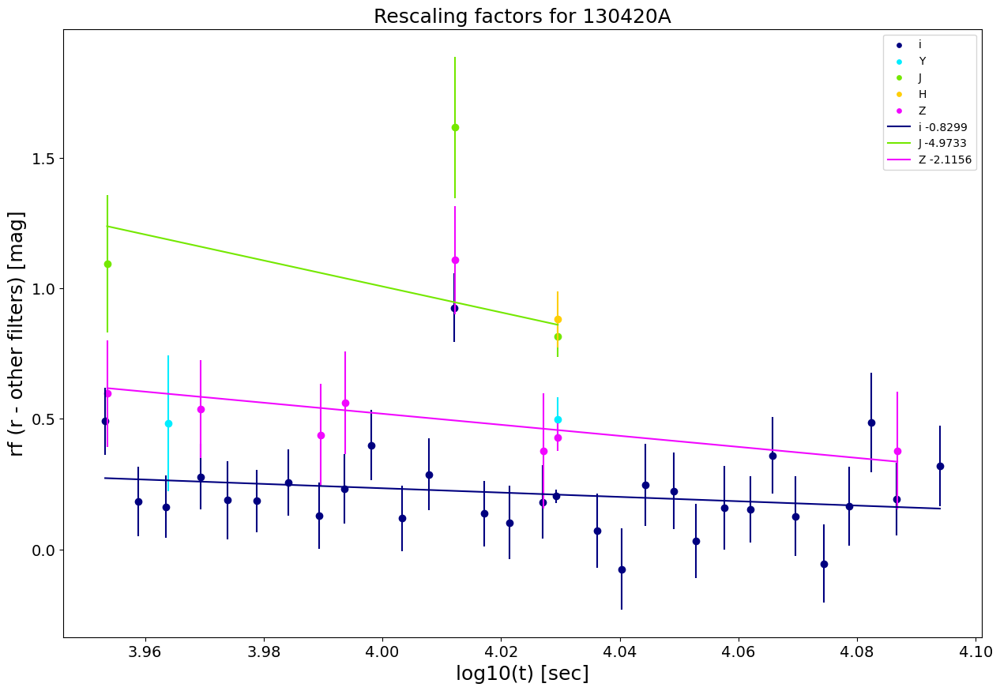


####################################################################################################

130427A
List of filters in the form: [Filter,number of points that have this filter]
[['i', 230], ['r', 198], ['Z', 88], ['Y', 86], ['J', 78], ['g', 74], ['H', 72], ['B', 61], ['UVM2', 36], ['UVW2', 36], ['V', 35], ['UVW1', 31], ['U', 29], ['white', 17], ['K', 3], ['z', 3], ['R', 3], ['unfiltered', 3], ['I', 2]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  i , with 230 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
   band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0     V         35  2.661841  -0.335678          0.071          14.084507
1  UVM2         36  2.669549   0.785335          0.081          12.345679
2  UVW2         36  2.772285   0.759667          0.040          25.000000
3  UVW1         31  2.923218   0.650104          0.040          25.000000
4     U         29  2.935633  

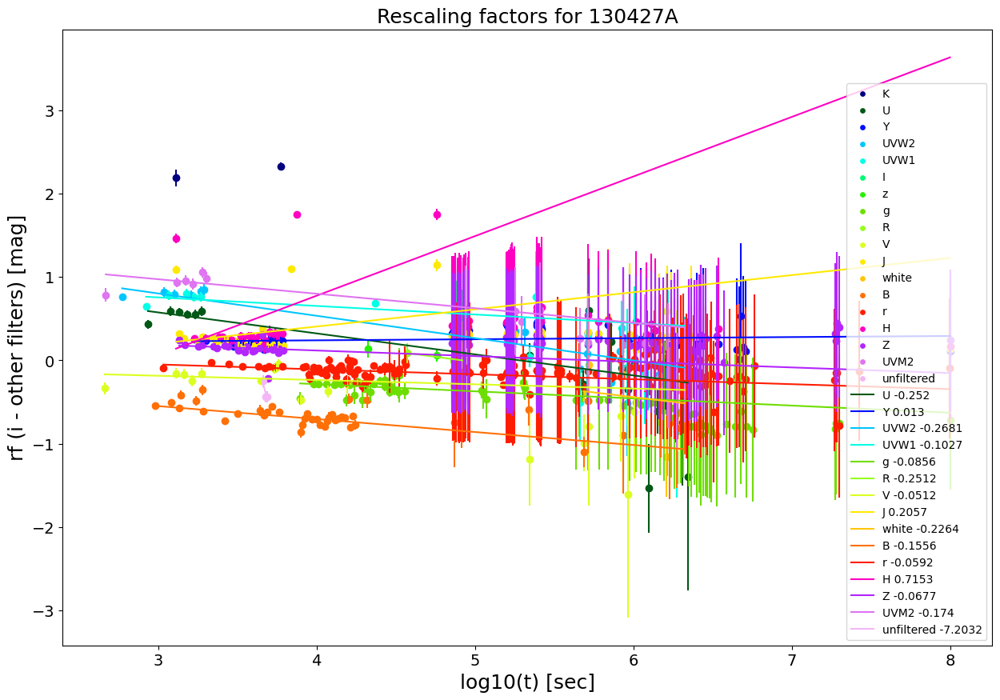


####################################################################################################

130427B
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/130427B_magAB_extcorr.txt has only limiting magnitudes, thus it will be skipped

----------------------------------------------------------------------------------------------------


####################################################################################################

130505A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 3], ['unfiltered', 3], ['Rc', 3], ['white', 3], ['U', 2], ['Ic', 2], ['g', 2], ['i', 2], ['J', 1], ['Z', 1], ['B', 1], ['R', 1], ['Y', 1], ['UVW1', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 3 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    i          2  5.

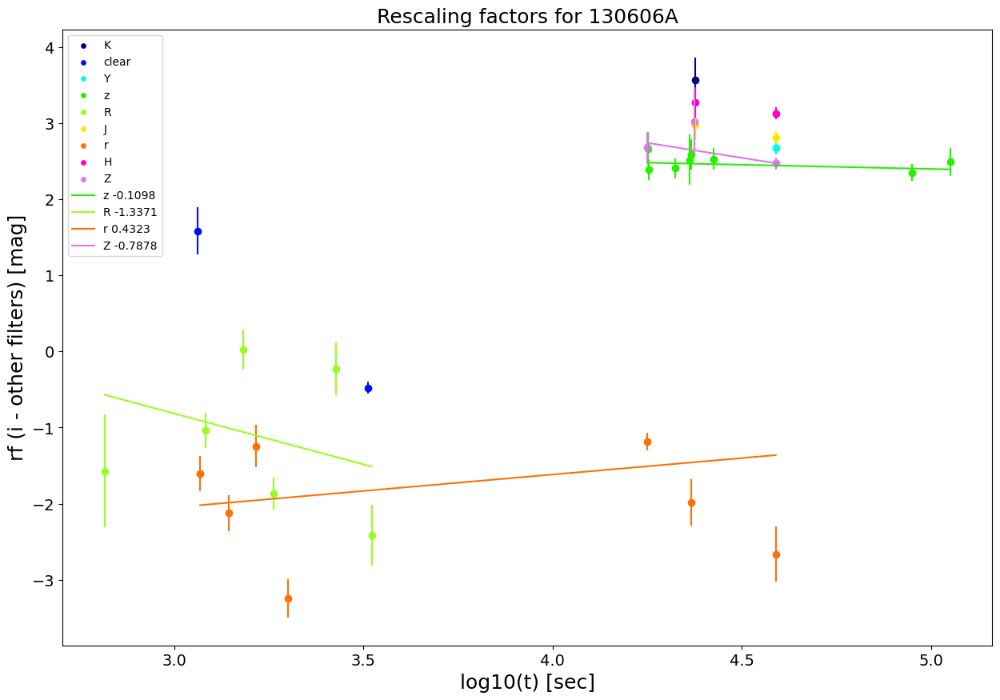


####################################################################################################

130610A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 5], ['white', 4], ['B', 3], ['Unfiltered', 3], ['U', 2], ['Clear', 2], ['V', 1], ['H', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 5 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    B          3  4.038223  -0.951912           0.30           3.333333
1    V          1  4.038223  -0.521934           0.44           2.272727
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

130612A
List of filters in the form: [Filter,number of points that have this filter]
[['CR', 3], ['white', 2], ['U', 1], ['H', 1], ['r', 1], ['i

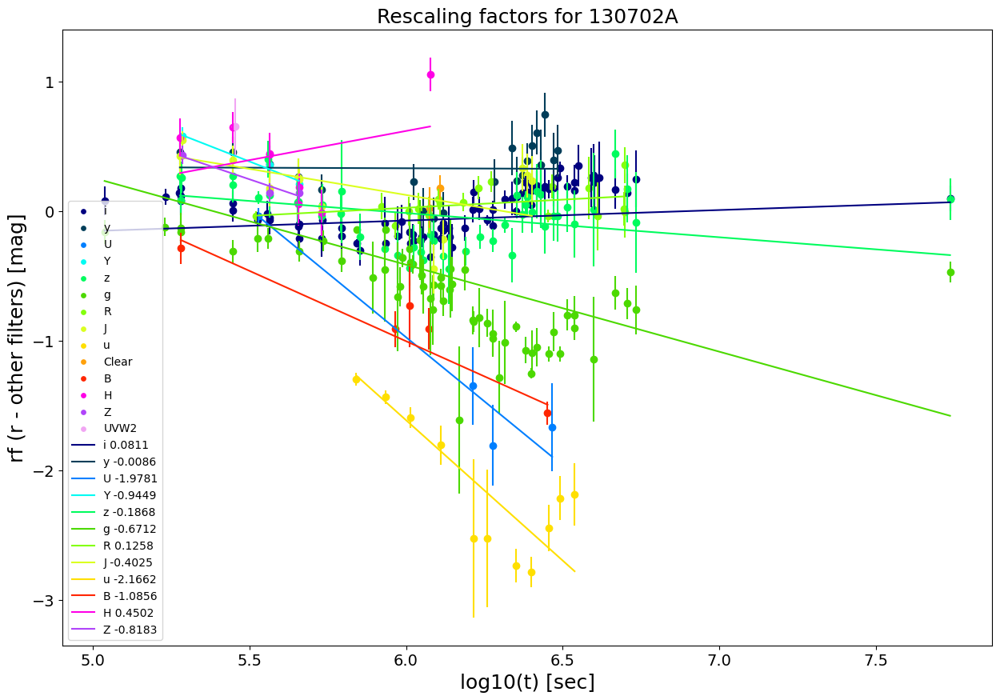


####################################################################################################

130831A
List of filters in the form: [Filter,number of points that have this filter]
[['CR', 115], ['V', 92], ['Rc', 89], ['B', 80], ['Ic', 76], ['i', 25], ['r', 24], ['R', 18], ['U', 13], ['UVW1', 9], ['UVW2', 9], ['UVM2', 8], ['Y', 8], ['z', 7], ['Unfiltered', 6], ['J', 4], ['g', 4], ['H', 2], ['Z', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  CR , with 115 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
   band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0     U         13  2.870404   0.175788          0.110           9.090909
1  UVM2          8  2.925828   0.101004          0.160           6.250000
2  UVW1          9  2.929419  -0.008556          0.150           6.666667
3     V         92  3.336260  -0.417938          0.046          21.739130
4     B         80  3.336660  -0.835

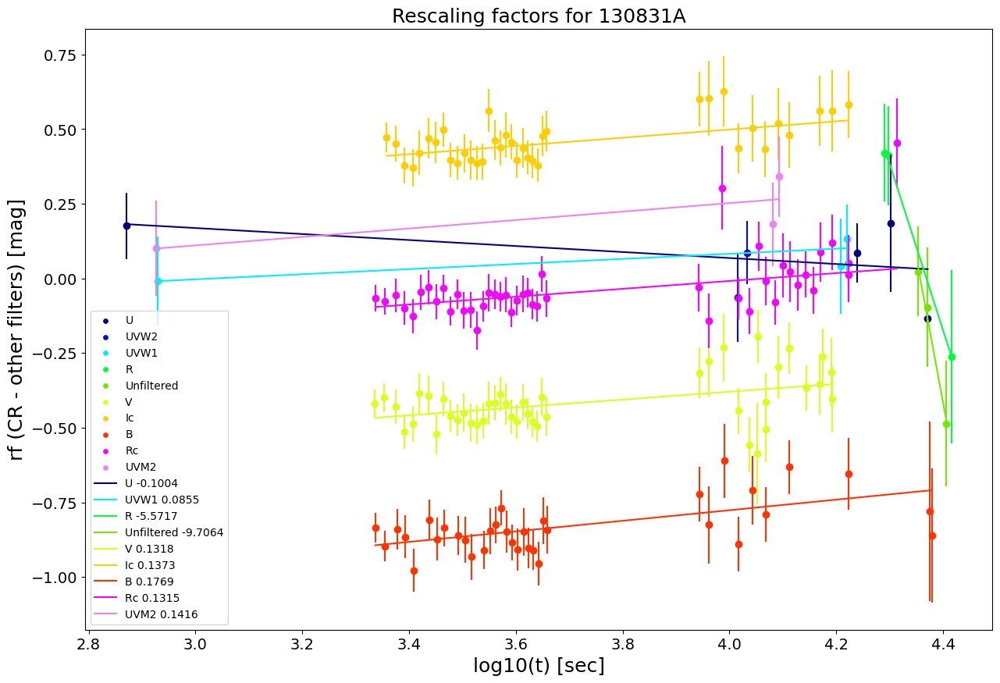


####################################################################################################

130907A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 22], ['i', 21], ['Z', 9], ['I', 7], ['R', 5], ['Ic', 4], ['Y', 3], ['J', 3], ['H', 2], ['unfiltered', 2], ['Rc', 2], ['white', 2], ['U', 1], ['UVW1', 1], ['B', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 22 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    I          7  4.135171   1.289863       0.230000           4.347826
1    i         21  4.303235   0.934093       0.151814           6.587008
2    Z          9  4.303370   1.527897       0.203810           4.906531
3    i         21  4.305401   0.731293       0.145724           6.862288
4    i         21  4.307398   0.829702       0.141995           7.042501
Rescaling r

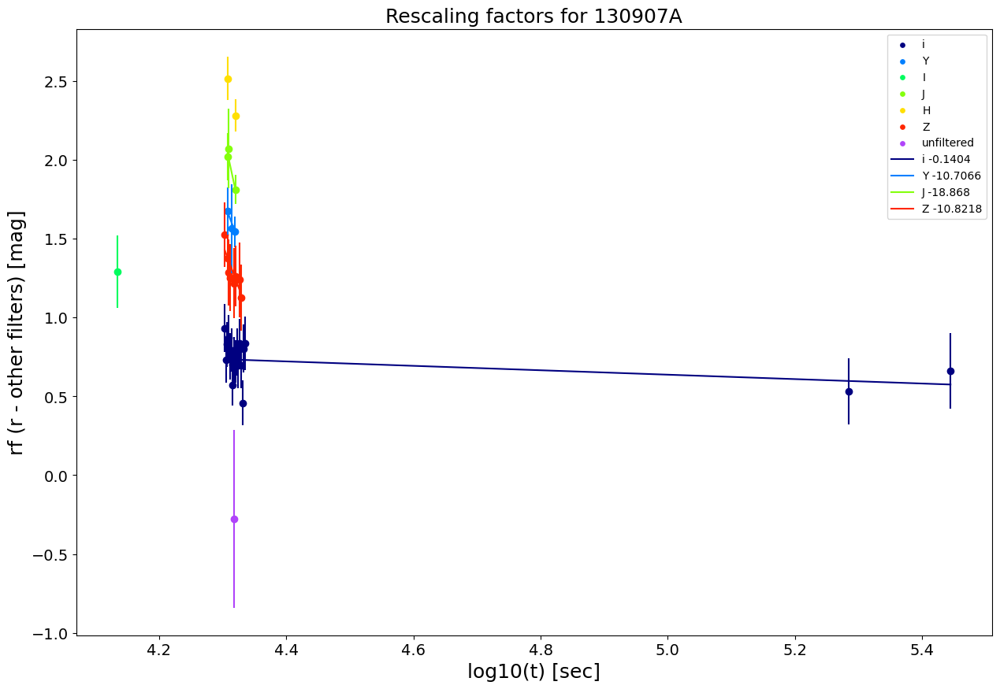


####################################################################################################

130925A
List of filters in the form: [Filter,number of points that have this filter]
[['i', 4], ['Y', 3], ['r', 3], ['J', 3], ['H', 3], ['Z', 2], ['K', 1], ['z', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  i , with 4 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    J          3  2.741939   2.178189           0.20           5.000000
1    H          3  2.741939   3.172222           0.20           5.000000
2    K          1  2.741939   3.768516           0.20           5.000000
3    z          1  2.741939   0.488650           0.20           5.000000
4    r          3  4.172778  -0.496025           0.21           4.761905
Rescaling results
------------------
    slope slope_err intercept inter_err acceptance           red_chi2  \
K 

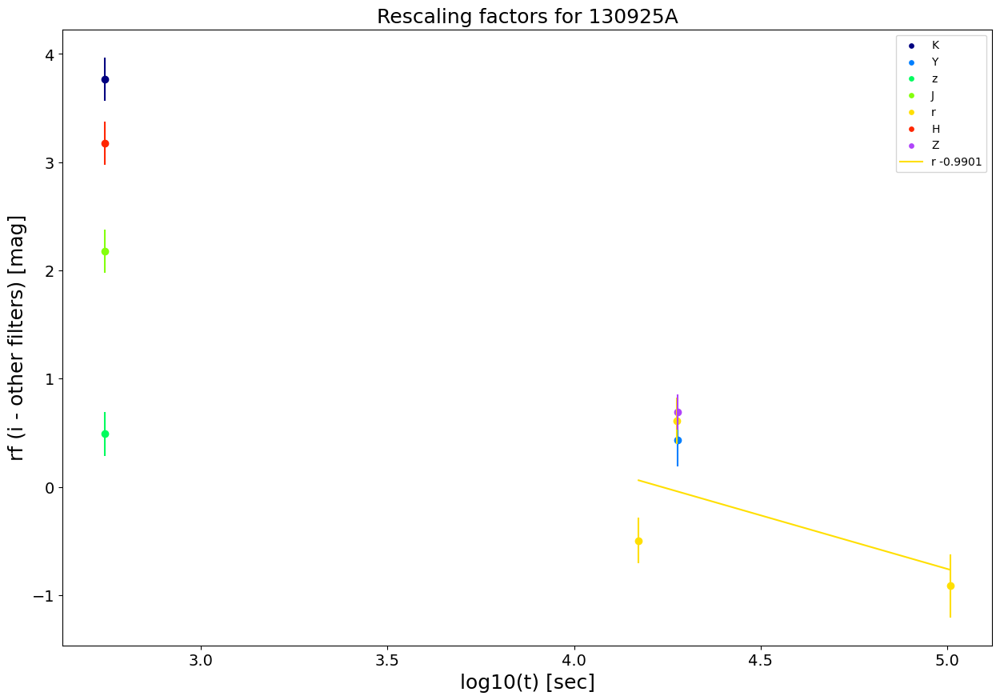


####################################################################################################

131004A
List of filters in the form: [Filter,number of points that have this filter]
[['i', 3], ['U', 2], ['R', 2], ['white', 2], ['H', 1], ['g', 1], ['r', 1], ['z', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  i , with 3 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    H          1  3.995635   1.028593            0.3           3.333333
1    g          1  3.995635  -0.785562            0.2           5.000000
2    r          1  3.995635  -0.308736            0.2           5.000000
3    z          1  3.995635   0.048245            0.2           5.000000
4    J          1  3.995635   1.108377            0.3           3.333333
No filter with at least 3 rescaling factors to be fitted

########################################

List of filters in the form: [Filter,number of points that have this filter]
[['r', 13], ['i', 9], ['g', 7], ['z', 4], ['R', 3], ['Y', 2], ['J', 2], ['Z', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 13 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    i          9  4.424673   0.280000           0.22           4.545455
1    g          7  4.424673  -0.100000           0.24           4.166667
2    i          9  4.561268   0.280000           0.24           4.166667
3    g          7  4.561268  -0.330000           0.31           3.225806
4    i          9  4.895754   0.028614           0.09          11.111111
Rescaling results
------------------
    slope slope_err intercept inter_err acceptance           red_chi2  \
i  0.0423    0.3045   -0.0878    1.4949     7.1986             1.0542   
Y       0         0         0         

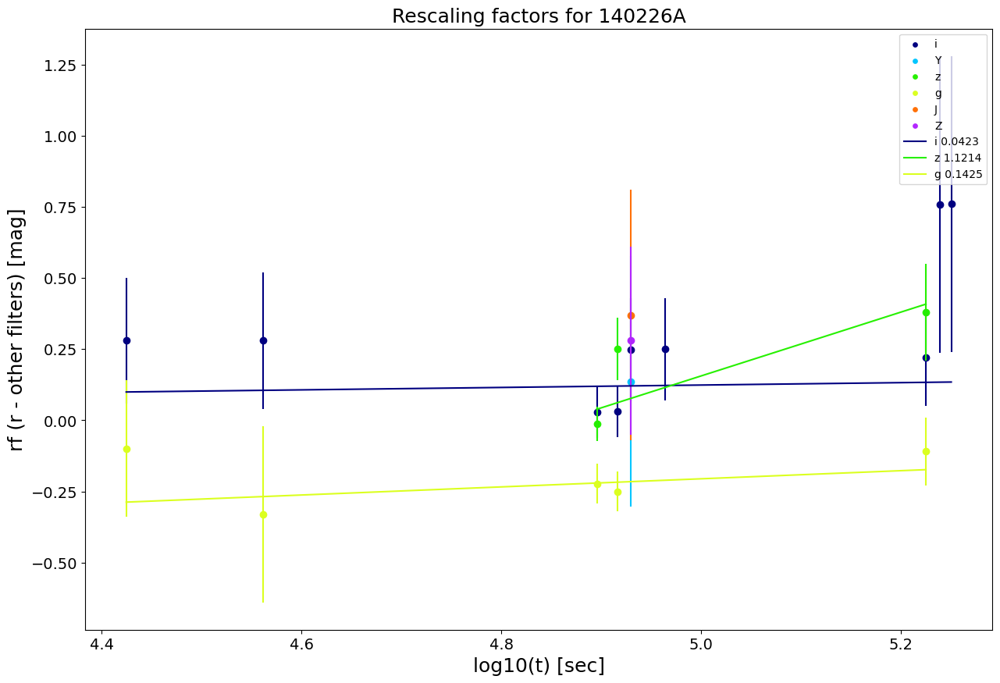


####################################################################################################

140301A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 1], ['r', 1], ['i', 1], ['CR', 1], ['g', 1], ['z', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 1 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

140304A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 2], ['Z', 2], ['H', 1], ['Y', 1], ['r', 1], ['i', 1], ['Unfiltered', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 2 occurrences
-\|/-|/-\

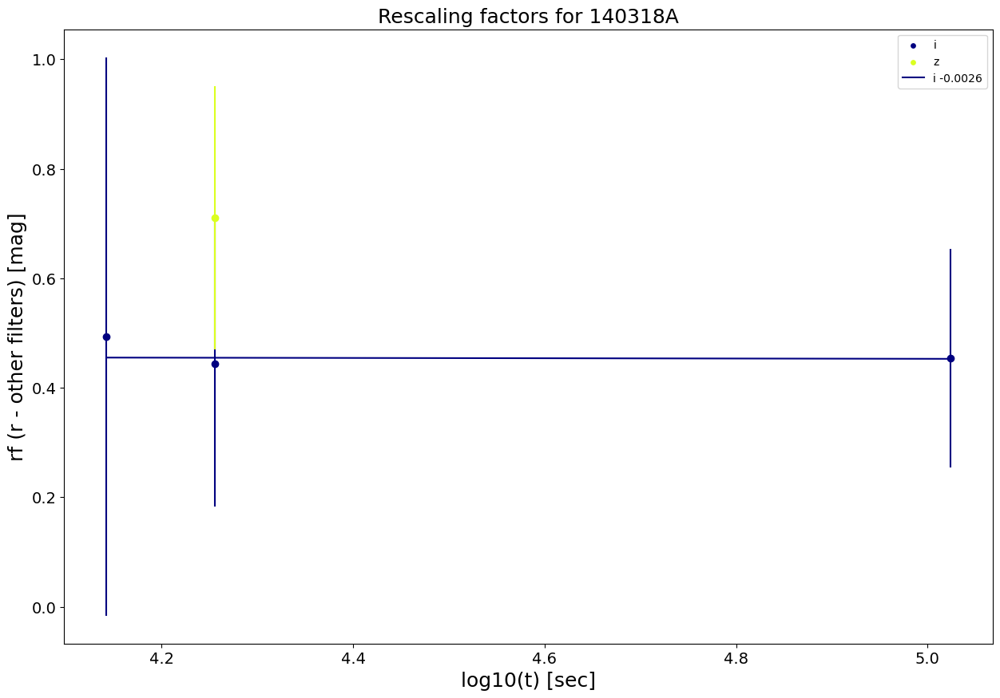


####################################################################################################

140419A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 60], ['i', 52], ['Z', 43], ['Y', 32], ['R', 6], ['H', 5], ['J', 3], ['Rc', 3], ['white', 3], ['Ic', 2], ['Clear', 1], ['B', 1], ['g', 1], ['z', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 60 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    Z         43  2.751702   1.395703       0.037366          26.762297
1    Y         32  2.835215   0.632894       0.022513          44.418780
2    i         52  2.839227   0.271208       0.021751          45.974898
3    Y         32  2.890840   0.634699       0.019524          51.219012
4    i         52  2.894371   0.260588       0.020338          49.169043
Rescaling results
---------

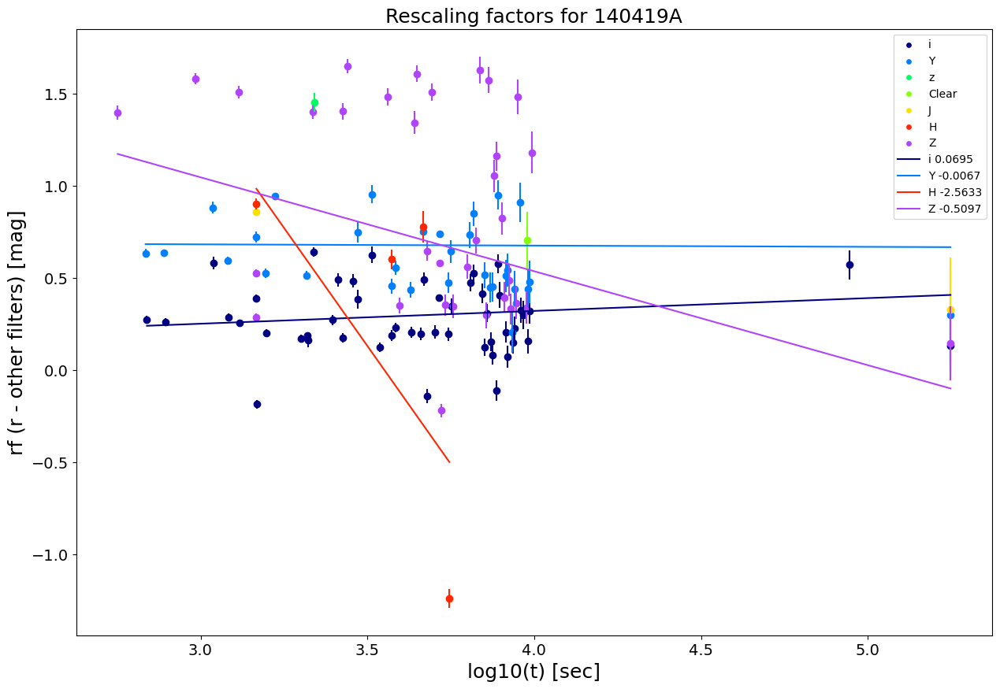


####################################################################################################

140423A
List of filters in the form: [Filter,number of points that have this filter]
[['CR', 88], ['I', 29], ['R', 18], ['V', 16], ['r', 9], ['H', 6], ['Rc', 6], ['K', 5], ['i', 4], ['Ic', 4], ['z', 3], ['J', 3], ['B', 2], ['g', 2], ['Y', 2], ['Z', 2], ['white', 2], ['Clear', 2]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  CR , with 88 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    r          9  2.477121  -7.565072           0.08          12.500000
1    I         29  3.136073   0.644933           0.08          12.500000
2    V         16  3.156840  -0.488313           0.13           7.692308
3    I         29  3.167010   0.394933           0.12           8.333333
4    V         16  3.186945  -0.508313           0.13           7.69

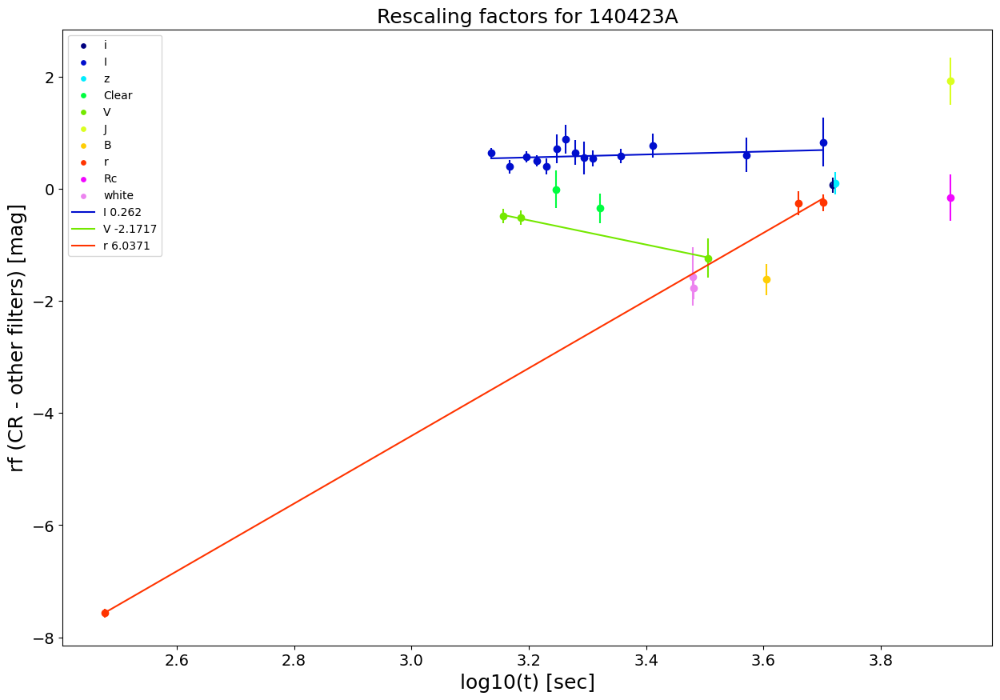


####################################################################################################

140428A
List of filters in the form: [Filter,number of points that have this filter]
[['i', 2], ['z', 1], ['r', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  i , with 2 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    z          1  3.865104   0.194806            0.2           5.000000
1    r          1  3.865104  -1.893454            0.3           3.333333
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

140430A
List of filters in the form: [Filter,number of points that have this filter]
[['I', 58], ['R', 41], ['V', 37], ['r', 15], ['B', 2], ['white', 2], ['U', 1], ['UVW1', 1]]
 
The most numerous filter is considered for

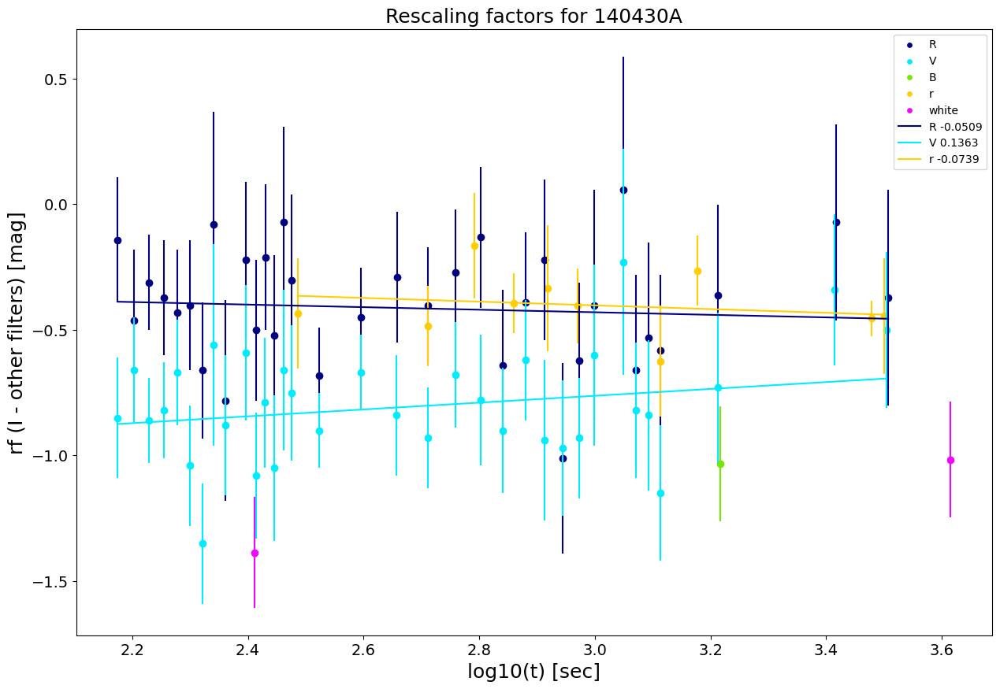


####################################################################################################

140506A
List of filters in the form: [Filter,number of points that have this filter]
[['white', 35], ['U', 20], ['UVW1', 8], ['V', 8], ['B', 7], ['UVW2', 5], ['R', 5], ['r', 4], ['i', 4], ['z', 4], ['UVM2', 3], ['g', 3], ['J', 1], ['K', 1], ['H', 1], ['Unfiltered', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  white , with 35 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
   band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0  UVM2          3  2.838843  -1.401832         0.8305           1.204094
1  UVW2          5  2.910703  -3.175819         2.4985           0.400240
2  UVW2          5  3.086225  -1.037819         3.0485           0.328030
3     B          7  3.123865  -0.801056         0.8685           1.151410
4     B          7  3.180717   0.531944         2.2520           0.4440

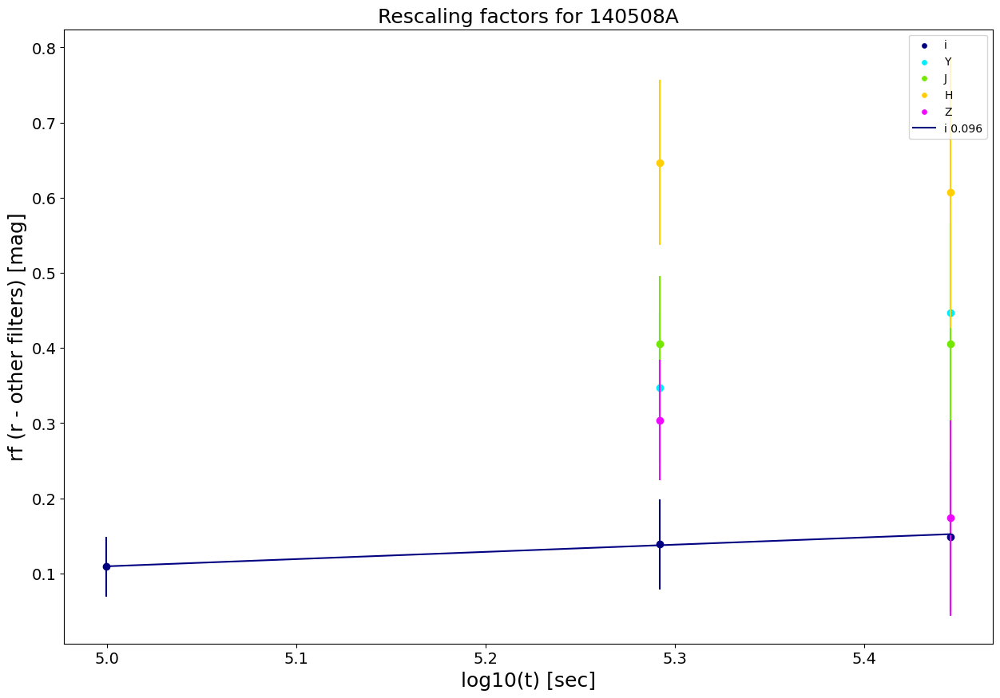


####################################################################################################

140509A
List of filters in the form: [Filter,number of points that have this filter]
[['J', 1], ['U', 1], ['white', 1], ['H', 1], ['B', 1], ['r', 1], ['i', 1], ['g', 1], ['z', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  J , with 1 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    H          1  4.448938   0.294109            0.8           1.250000
1    r          1  4.448938  -0.664343            0.5           2.000000
2    i          1  4.448938  -0.478466            0.5           2.000000
3    g          1  4.448938  -1.140480            0.6           1.666667
4    z          1  4.448938  -0.289672            0.5           2.000000
No filter with at least 3 rescaling factors to be fitted

##############################

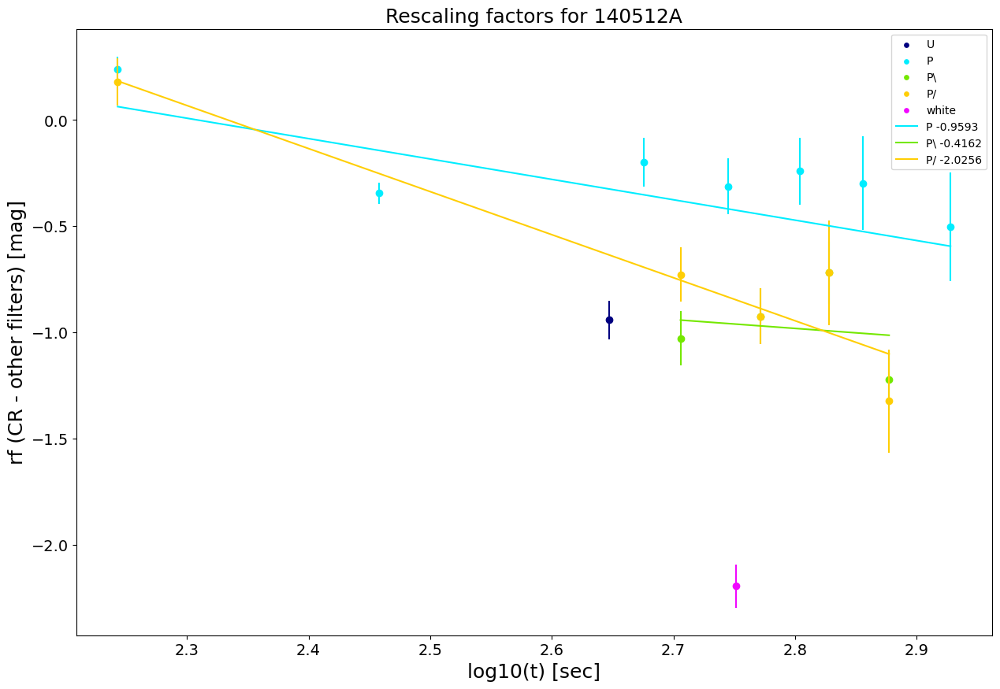


####################################################################################################

140515A
List of filters in the form: [Filter,number of points that have this filter]
[['z', 7], ['H', 2], ['J', 2]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  z , with 7 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    H          2  4.719116   2.953302           0.31           3.225806
1    H          2  4.728516   1.403302           0.39           2.564103
2    J          2  4.728516   1.409367           0.39           2.564103
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

140518A
List of filters in the form: [Filter,number of points that have this filter]
[['i', 47], ['J', 24], ['H', 22], ['Y', 22], ['Z', 19], ['r', 1

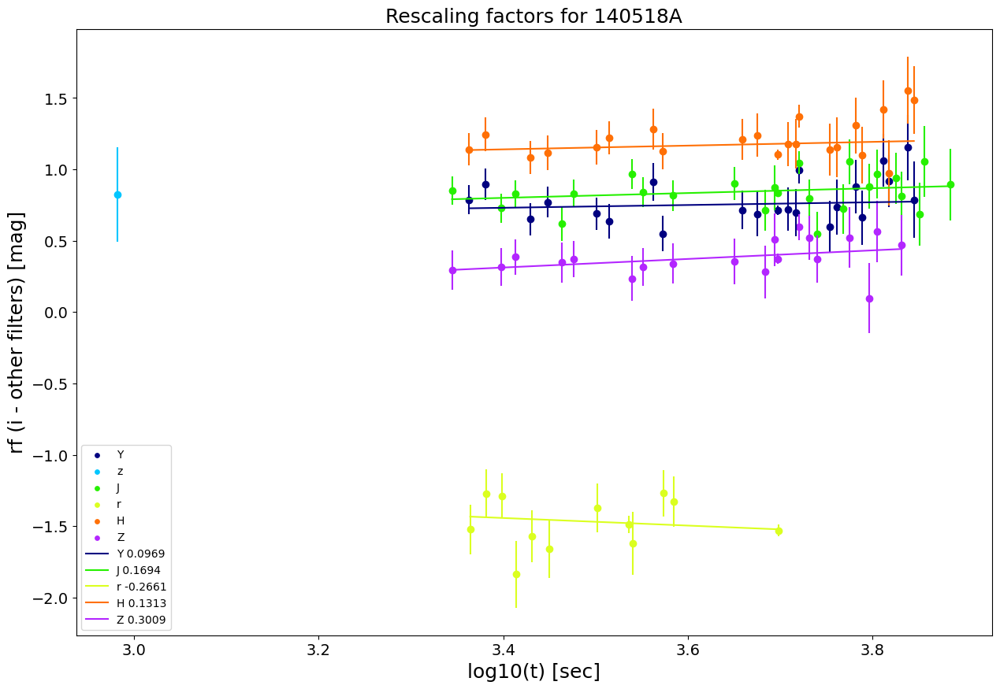


####################################################################################################

140606B
List of filters in the form: [Filter,number of points that have this filter]
[['i', 44], ['r', 18], ['g', 8], ['z', 4], ['K', 2]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  i , with 44 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    g          8  5.412766  -0.428144           0.11           9.090909
1    r         18  5.415080  -0.105091           0.10          10.000000
2    z          4  5.422377   0.073787           0.16           6.250000
3    r         18  6.201397  -0.325091           0.09          11.111111
4    g          8  6.201397  -1.940710           0.09          11.111111
Rescaling results
------------------
    slope slope_err intercept inter_err acceptance red_chi2  \
r -0.1555    0.1249    0.6352    0.7837

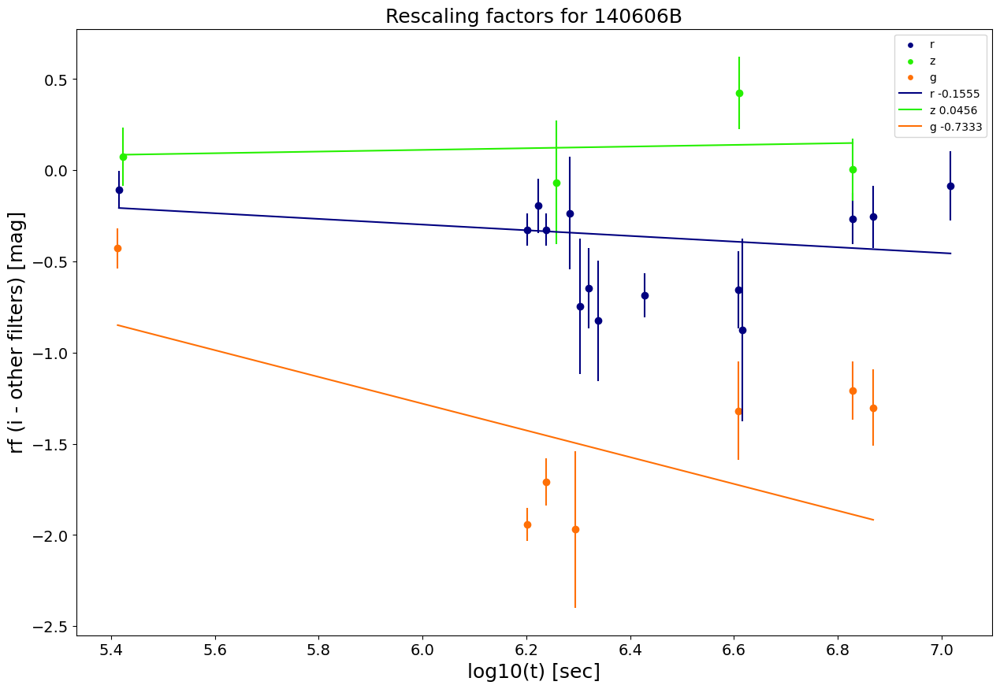


####################################################################################################

140614A
List of filters in the form: [Filter,number of points that have this filter]
[['H', 1], ['r', 1], ['i', 1], ['z', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  H , with 1 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    r          1  3.326336  -1.851041            0.4           2.500000
1    i          1  3.326336  -0.835667            0.3           3.333333
2    z          1  3.326336  -0.602813            0.3           3.333333
3    J          1  3.326336  -0.464699            0.4           2.500000
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

140620A
List of filters in the form: [Filter,number of 

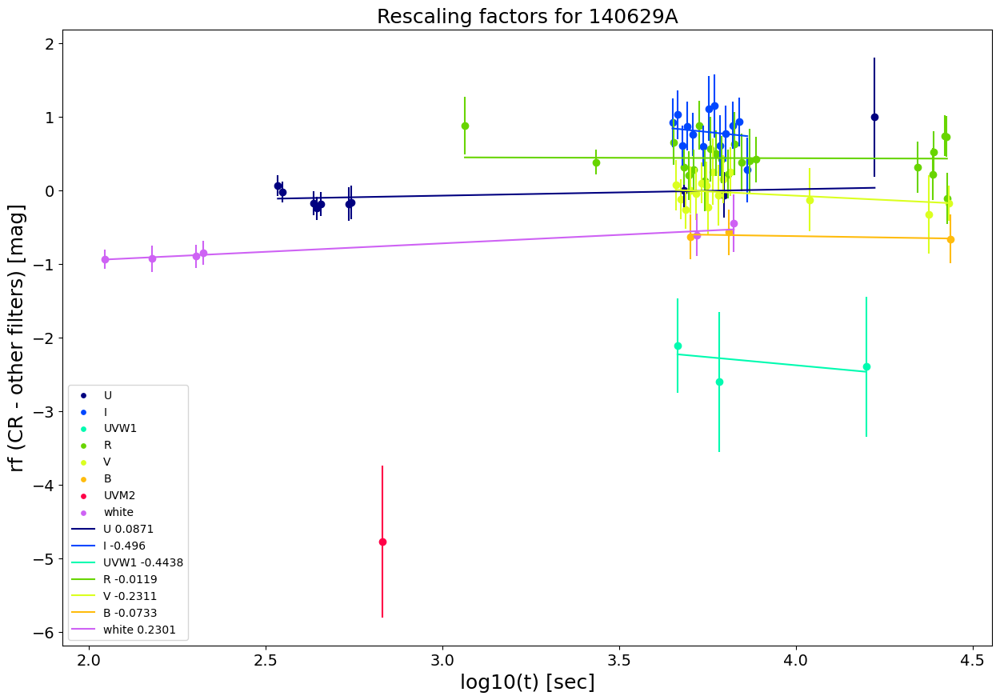


####################################################################################################

140703A
List of filters in the form: [Filter,number of points that have this filter]
[['i', 30], ['r', 19], ['Y', 7], ['z', 6], ['clear', 4], ['H', 2], ['J', 2], ['R', 1], ['Unfiltered', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  i , with 30 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    r         19  4.475841  -0.570000       0.040000          25.000000
1    r         19  4.546428  -0.544282       0.293119           3.411584
2    r         19  4.547524  -0.702238       0.225979           4.425190
3    r         19  4.548679  -0.378836       0.204266           4.895577
4    r         19  4.549809  -0.670069       0.248385           4.026008
Rescaling results
------------------
     slope slope_err intercept inter_err acceptan

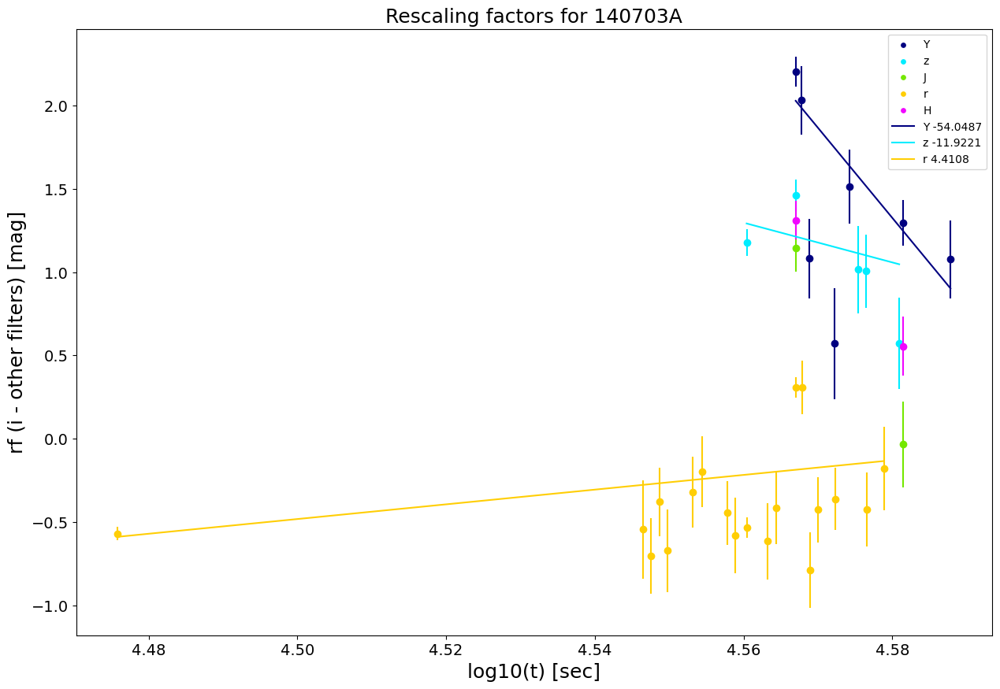


####################################################################################################

140710A
List of filters in the form: [Filter,number of points that have this filter]
[['i', 2], ['Z', 1], ['H', 1], ['Y', 1], ['r', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  i , with 2 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    Z          1  3.327155   0.408002       0.202586           4.936175
1    H          1  3.327155   1.483356       0.195486           5.115456
2    Y          1  3.327155   0.589621       0.236485           4.228598
3    r          1  3.327155  -0.085987       0.154425           6.475635
4    J          1  3.327155   0.911610       0.210822           4.743338
No filter with at least 3 rescaling factors to be fitted

##########################################################################

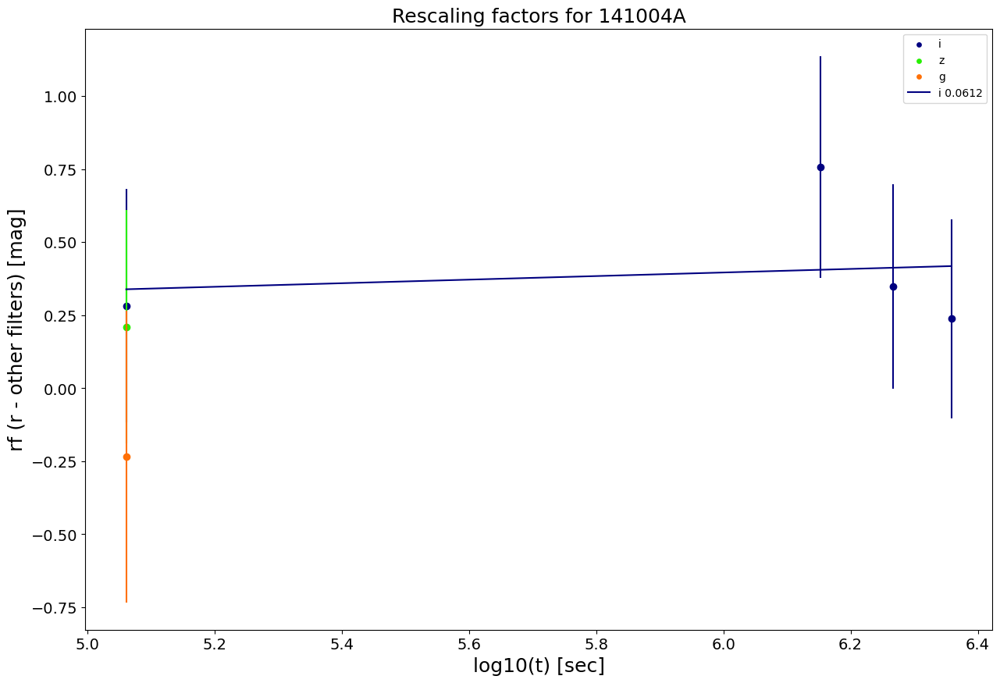


####################################################################################################

141028A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 6], ['i', 5], ['R', 3], ['z', 3], ['U', 3], ['u', 1], ['H', 1], ['g', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 6 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    i          5  4.678365   0.196403           0.03          33.333333
1    z          3  4.678365   0.379746           0.03          33.333333
2    g          1  4.678365  -0.773232           0.03          33.333333
3    i          5  4.709202   0.207178           0.04          25.000000
4    z          3  4.709202   0.528355           0.12           8.333333
Rescaling results
------------------
    slope slope_err intercept inter_err acceptance           red_

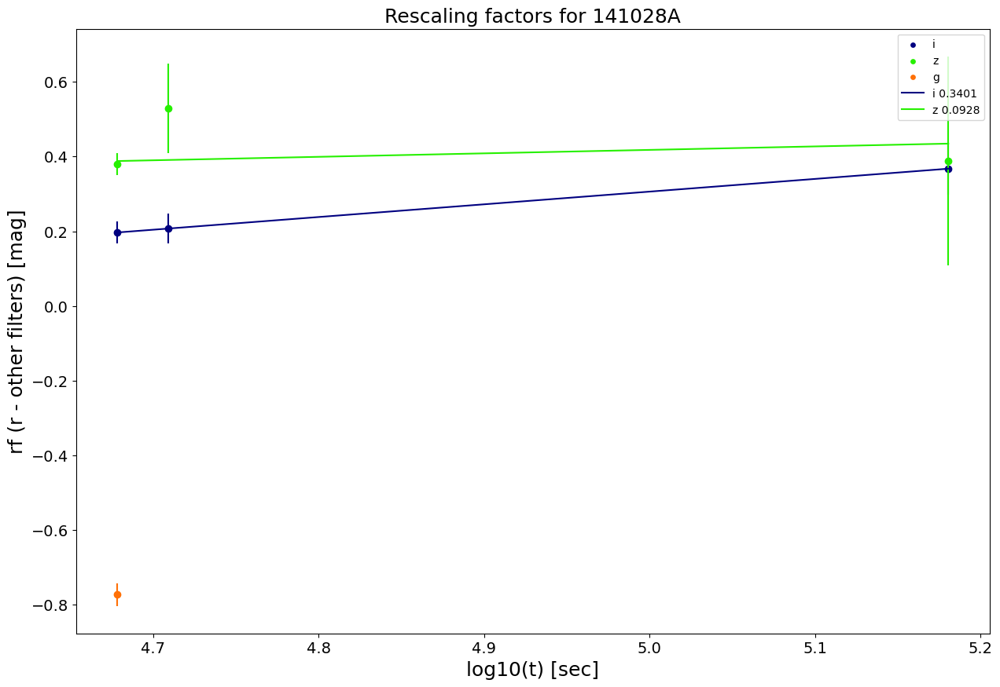


####################################################################################################

141109A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 5], ['r', 2], ['white', 2], ['clear', 1], ['K', 1], ['H', 1], ['g', 1], ['I', 1], ['i', 1], ['z', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 5 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

141121A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 66], ['i', 63], ['U', 12], ['UVW1', 10], ['g', 7], ['B', 4], ['V', 1], ['u', 1]]
 
The most numerous filter is considered for rescaling
The most numerou

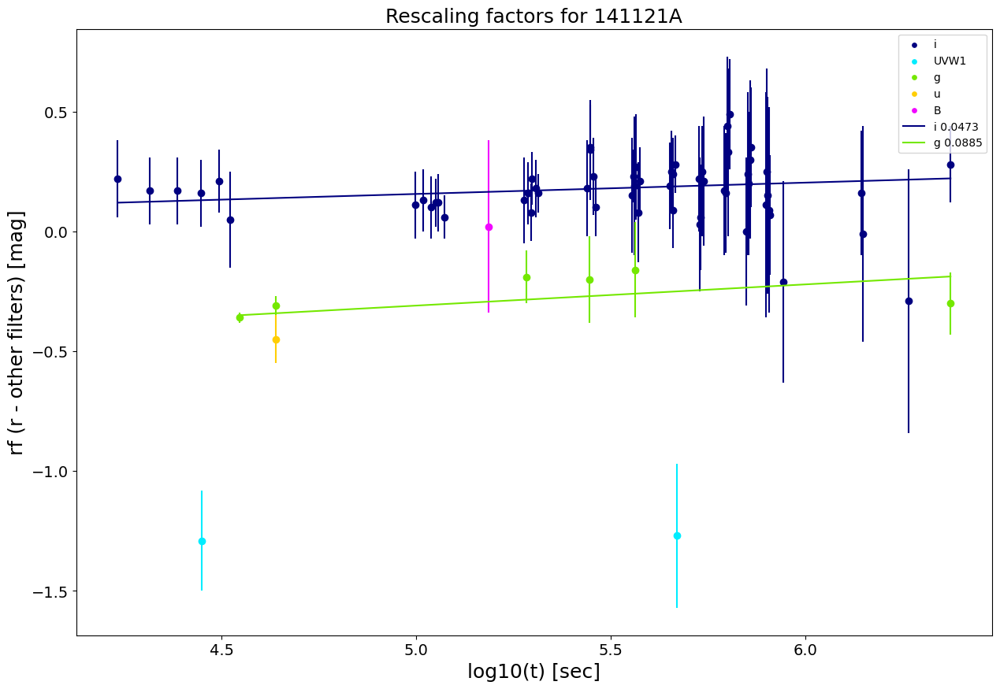


####################################################################################################

141220A
List of filters in the form: [Filter,number of points that have this filter]
[['B', 538], ['R', 222], ['I', 138], ['r', 13], ['white', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  B , with 538 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    R        222  2.114277       0.76           0.18           5.555556
1    I        138  2.114277       1.37           0.17           5.882353
2    I        138  2.117934       1.39           0.18           5.555556
3    R        222  2.118265       0.75           0.18           5.555556
4    R        222  2.121888       0.71           0.18           5.555556
Rescaling results
------------------
        slope slope_err intercept inter_err acceptance           red_chi2  \
I    

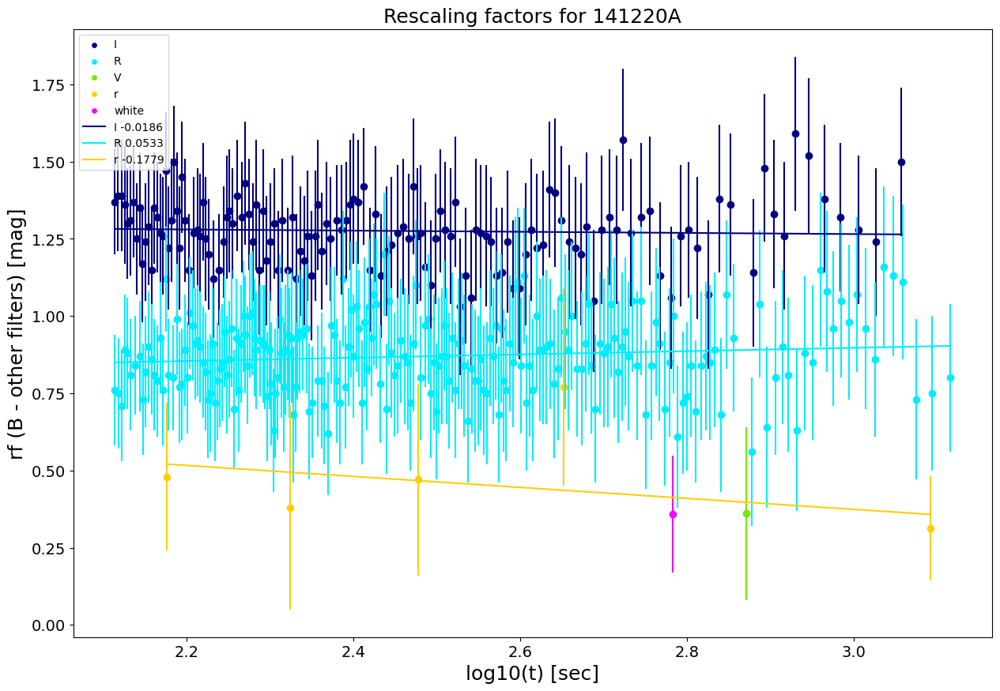


####################################################################################################

141221A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 32], ['V', 23], ['I', 23], ['U', 1], ['white', 1], ['H', 1], ['B', 1], ['r', 1], ['i', 1], ['g', 1], ['K', 1], ['z', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 32 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
    band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0      V         23  1.924279  -1.211602          0.415           2.409639
1      I         23  1.929419  -0.011602          0.265           3.773585
2  white          1  2.201397  -1.897030          0.070          14.285714
3      V         23  2.311754  -0.630000          0.105           9.523810
4      I         23  2.311754   0.110000          0.070          14.285714
Rescaling results
------------------
     

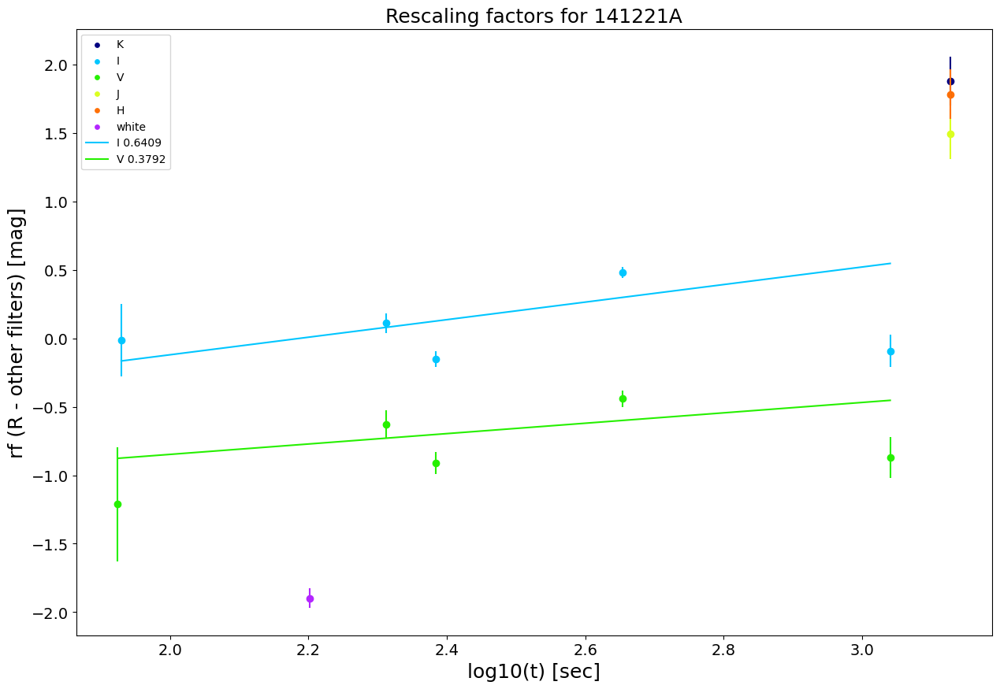


####################################################################################################

141225A
List of filters in the form: [Filter,number of points that have this filter]
[['CR', 9], ['R', 5], ['white', 4], ['r', 2], ['U', 1], ['g', 1], ['i', 1], ['z', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  CR , with 9 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    R          5  2.201397   0.260401           0.14           7.142857
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

150101B
List of filters in the form: [Filter,number of points that have this filter]
[['r', 2], ['white', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 2 occurrences
-\|/-|/-\|/

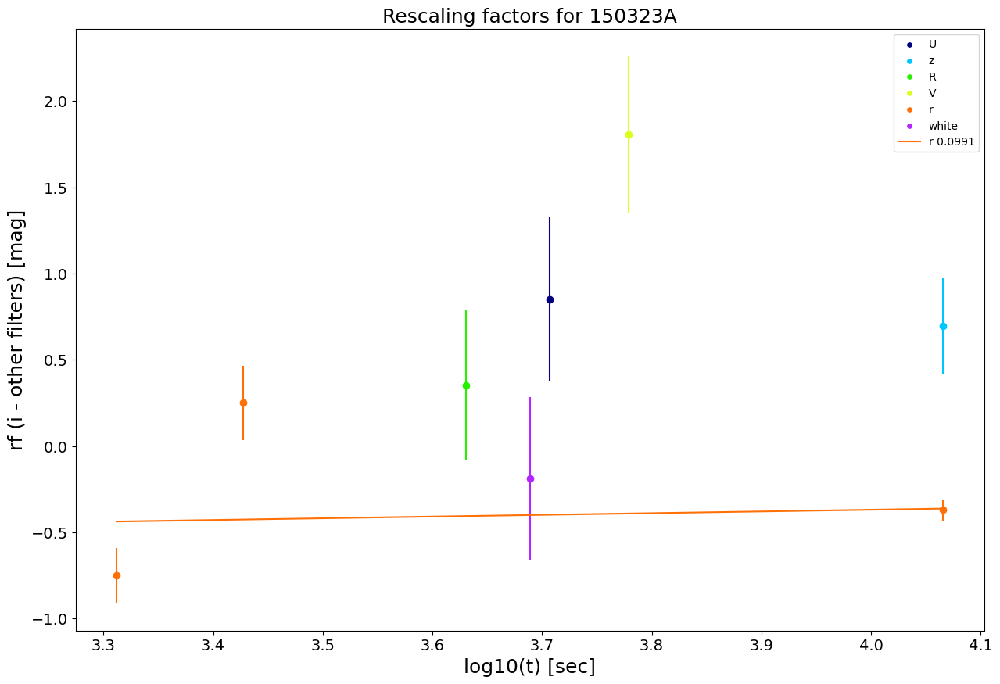


####################################################################################################

150403A
List of filters in the form: [Filter,number of points that have this filter]
[['V', 37], ['U', 1], ['UVW1', 1], ['B', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  V , with 37 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    B          1  2.750508   -0.40281       0.128696           7.770227
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

150413A
List of filters in the form: [Filter,number of points that have this filter]
[['CR', 61], ['R', 38], ['Rc', 4], ['Ic', 3], ['B', 1], ['Unfiltered', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  CR , with 61 occurrences


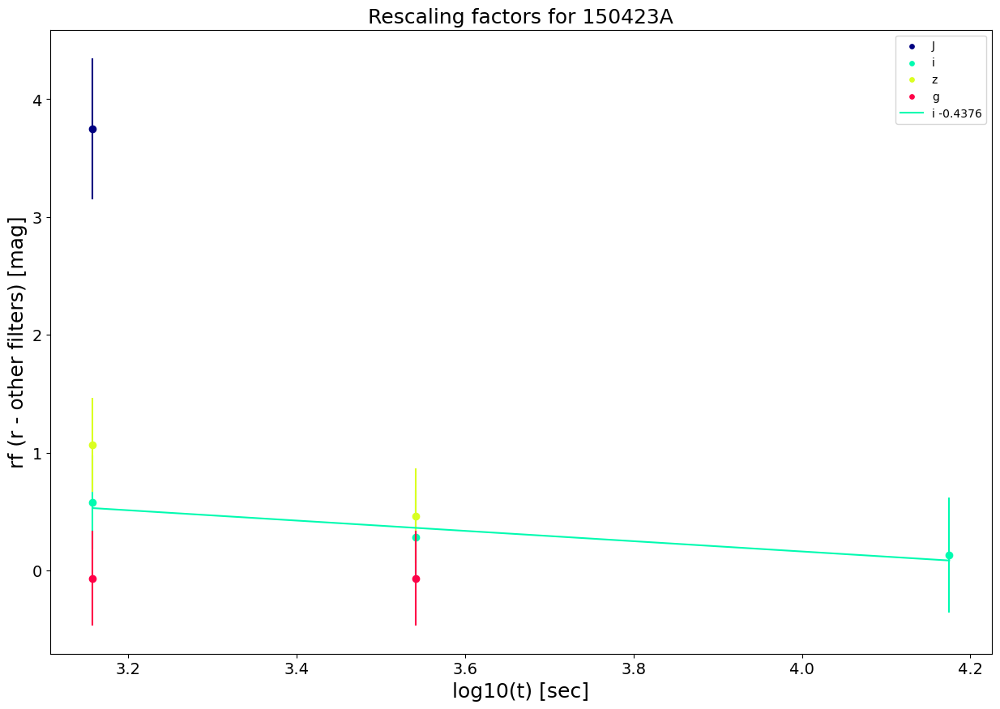


####################################################################################################

150514A
List of filters in the form: [Filter,number of points that have this filter]
[['white', 2], ['J', 1], ['U', 1], ['H', 1], ['g', 1], ['r', 1], ['i', 1], ['z', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  white , with 2 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    U          1  4.613556   0.408484           0.09          11.111111
1    V          1  4.624648  -0.142269           0.24           4.166667
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

150518A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 2], ['Rc', 1], ['Ic', 1], ['R', 1], ['i', 1]]
 
The most nume

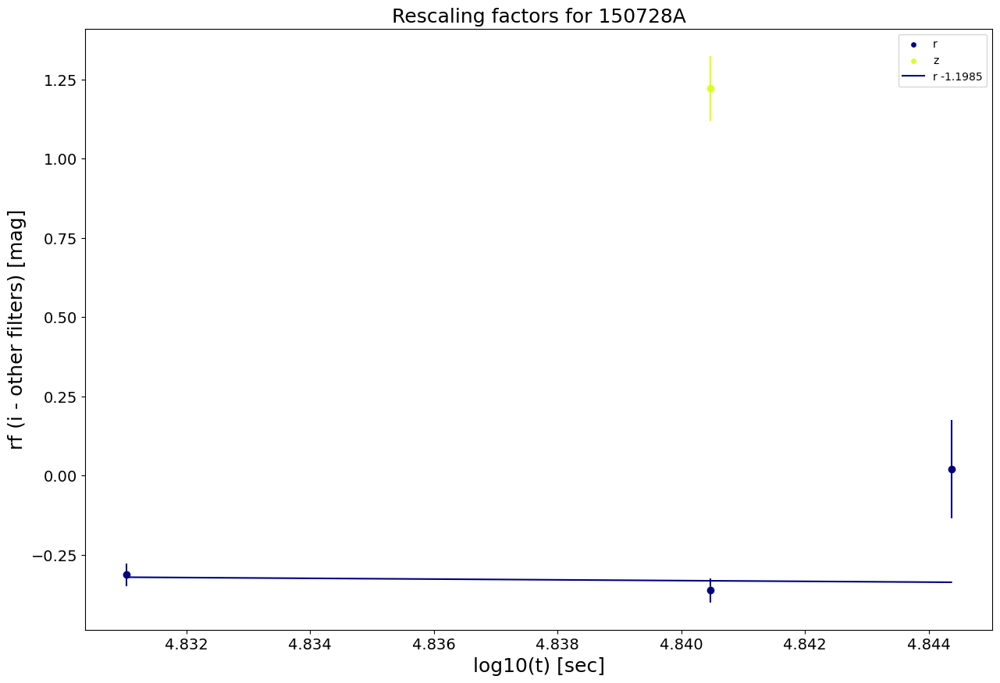


####################################################################################################

150818A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 5], ['white', 4], ['UVW1', 2], ['UVM2', 2], ['U', 1], ['UVW2', 1], ['B', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 5 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

150821A
List of filters in the form: [Filter,number of points that have this filter]
[['V', 15], ['r', 4], ['U', 1], ['white', 1], ['UVW2', 1], ['B', 1], ['g', 1], ['i', 1], ['UVW1', 1], ['z', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of

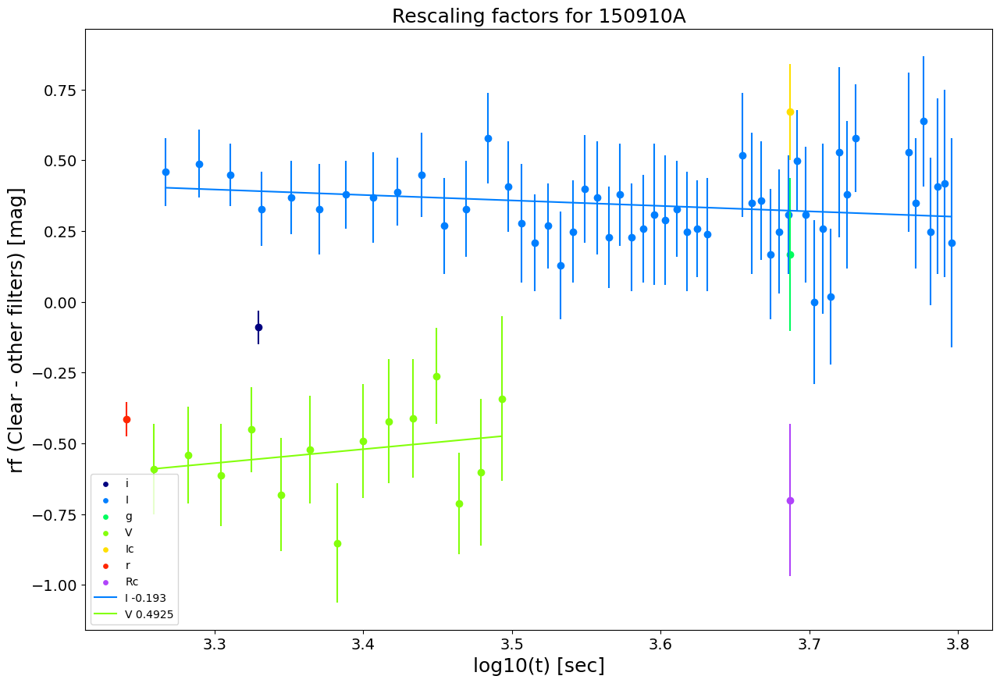


####################################################################################################

150915A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 1], ['g', 1], ['R', 1], ['i', 1], ['z', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 1 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    g          1  4.124504   0.218399            0.2           5.000000
1    i          1  4.124504   0.129928            0.3           3.333333
2    z          1  4.124504   0.274331            0.3           3.333333
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

151021A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 24]]
 
The most numerous filter is c

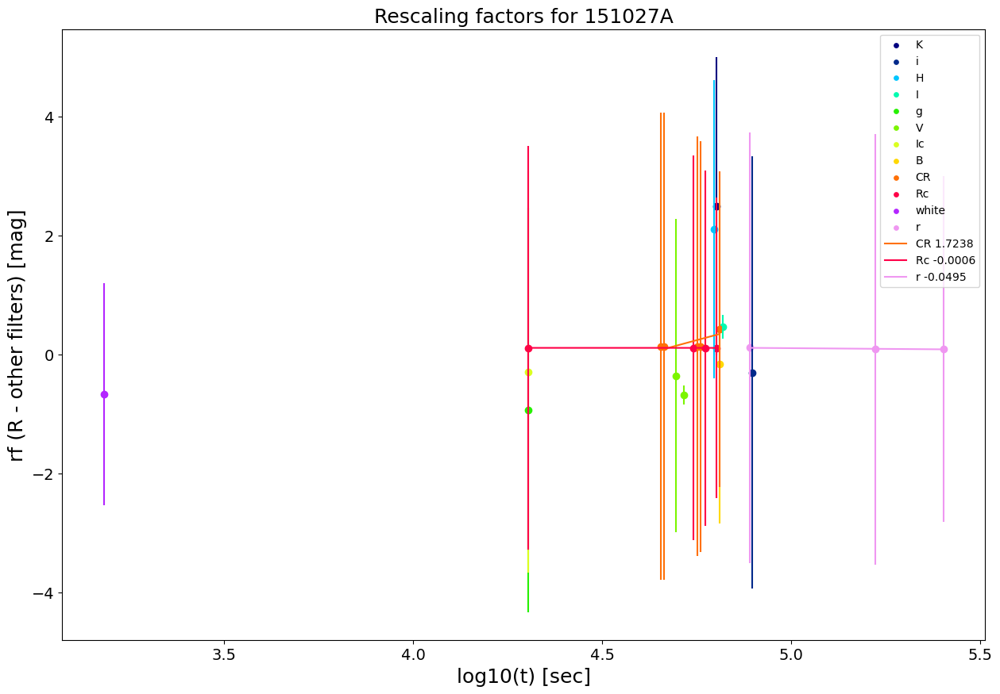


####################################################################################################

151027B
List of filters in the form: [Filter,number of points that have this filter]
[['i', 10], ['r', 9], ['z', 9], ['J', 7], ['H', 7], ['K', 5], ['g', 4], ['R', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  i , with 10 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    r          9  4.452997  -0.530189           0.15           6.666667
1    z          9  4.452997  -0.134733           0.14           7.142857
2    J          7  4.452997  -0.258913           0.47           2.127660
3    H          7  4.452997   0.670251           0.37           2.702703
4    r          9  4.459845  -0.460189           0.09          11.111111
Rescaling results
------------------
    slope slope_err intercept inter_err acceptance red_chi2  \


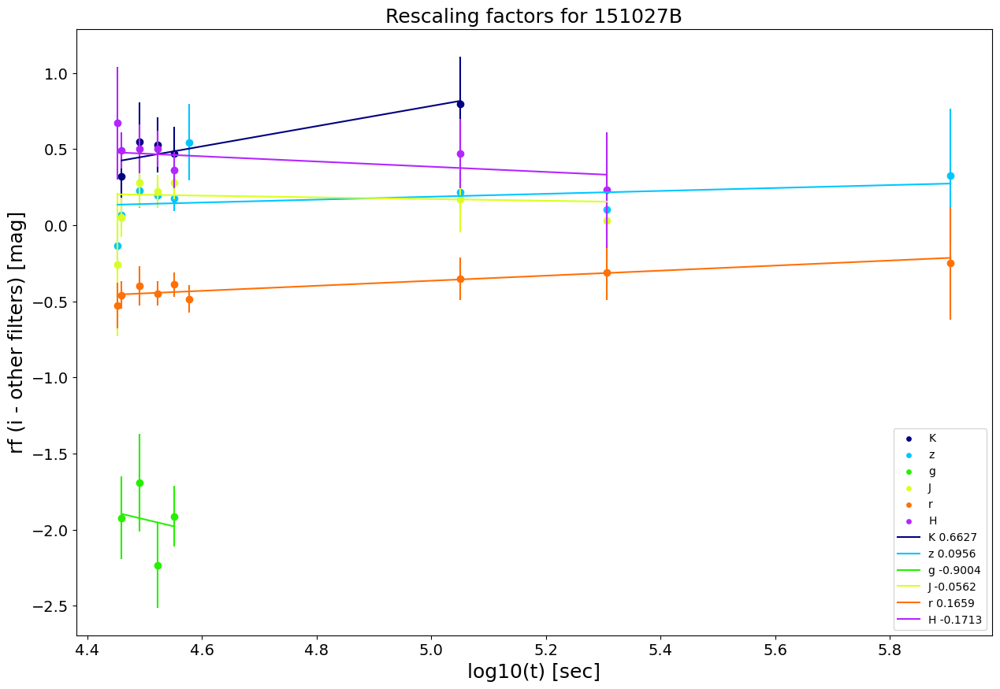


####################################################################################################

151029A
List of filters in the form: [Filter,number of points that have this filter]
[['white', 2], ['J', 1], ['U', 1], ['r', 1], ['I', 1], ['B', 1], ['g', 1], ['i', 1], ['R', 1], ['Unfiltered', 1], ['z', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  white , with 2 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

151031A
List of filters in the form: [Filter,number of points that have this filter]
[['U', 1], ['white', 1], ['r', 1], ['H', 1], ['g', 1], ['R', 1], ['i', 1], ['z', 1], ['J', 1]]
 
The most numerous filter is considered for 

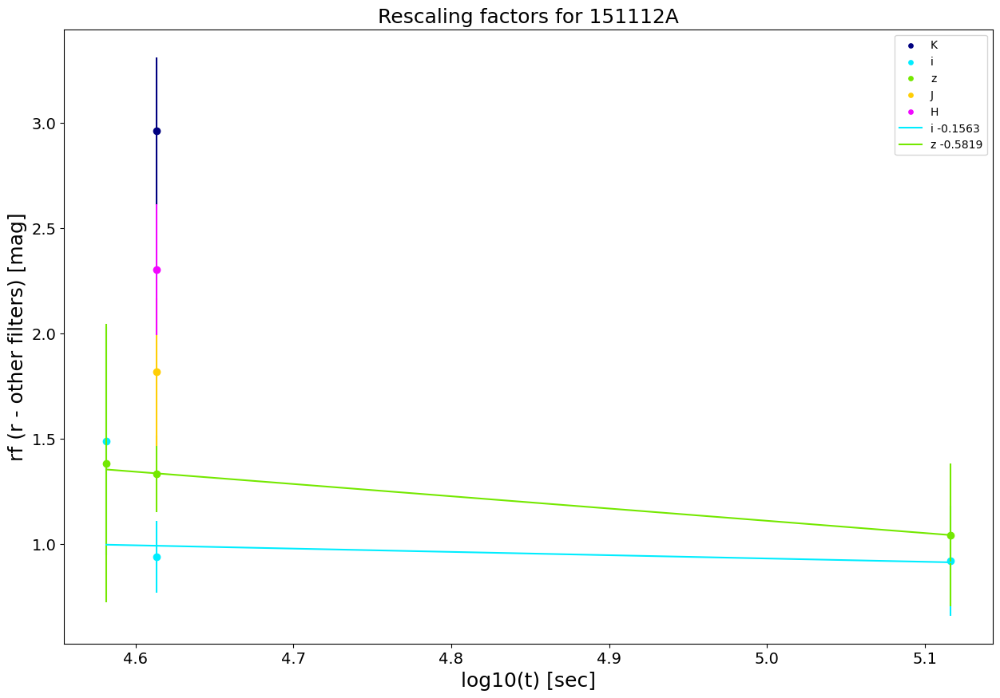


####################################################################################################

151215A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 9], ['i', 3], ['white', 3], ['CR', 2], ['J', 1], ['r', 1], ['K', 1], ['H', 1], ['B', 1], ['g', 1], ['z', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 9 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0   CR          2  2.041393   0.451028           0.20           5.000000
1    i          3  3.598681   0.138115           0.75           1.333333
2    J          1  3.598681   0.563994           0.90           1.111111
3    r          1  3.598681   0.049720           0.75           1.333333
4    K          1  3.598681   1.580318           1.10           0.909091
No filter with at least 3 rescaling factors to be fitted

#########

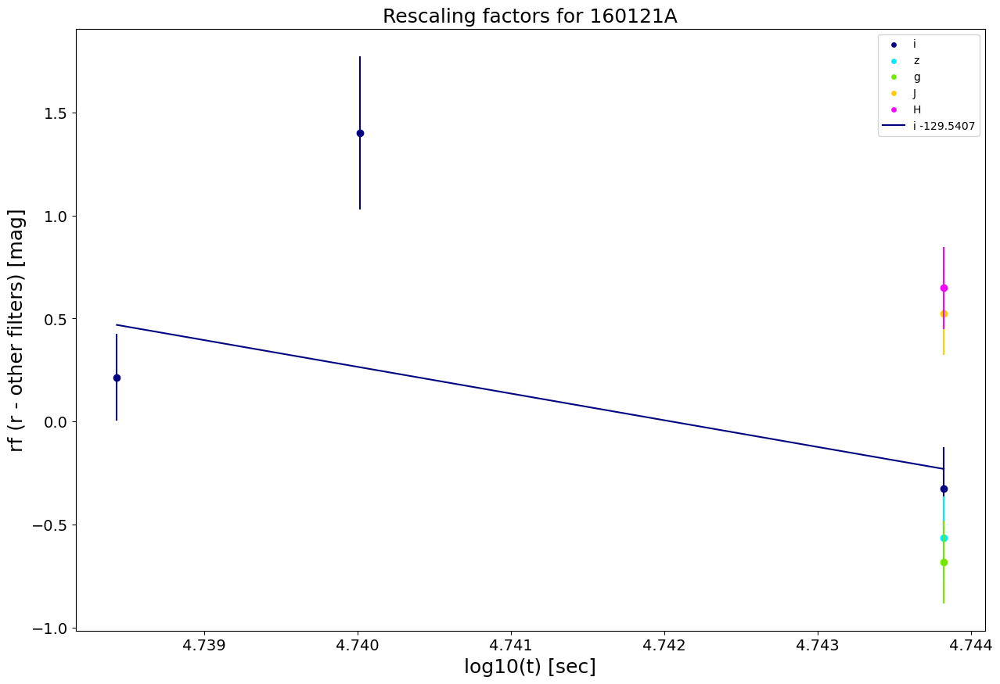


####################################################################################################

160131A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 81], ['i', 77], ['g', 42], ['B', 28], ['R', 27], ['z', 22], ['V', 20], ['UVW1', 11], ['Y', 11], ['UVM2', 7], ['UVW2', 7], ['white', 3], ['U', 2], ['Rc', 1], ['I', 1], ['H', 1], ['Ic', 1], ['K', 1], ['J', 1], ['U-UVOT', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 81 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
   band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0     i         77  3.011147   0.266823       0.060000          16.666667
1     z         22  3.011147   0.542561       0.080000          12.500000
2     i         77  3.660790   0.230039       0.000896        1115.960492
3  UVW1         11  3.660790  -1.702653       0.001857         538.566178
4     B         28  3.676876  

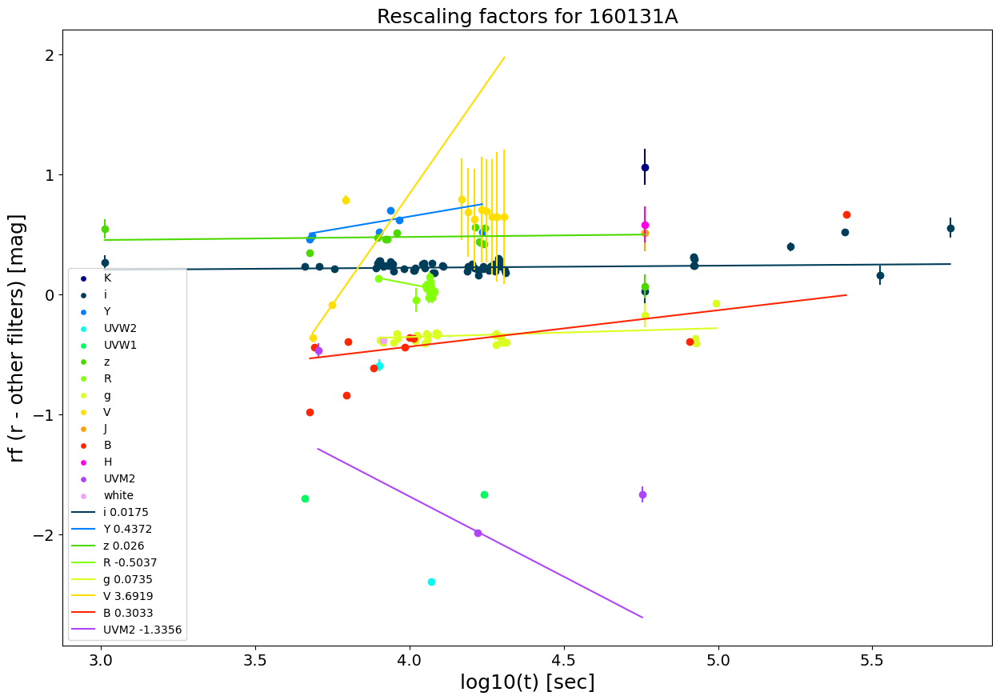


####################################################################################################

160203A
List of filters in the form: [Filter,number of points that have this filter]
[['i', 4], ['r', 3], ['R', 2], ['white', 2], ['H', 1], ['g', 1], ['z', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  i , with 4 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    r          3  2.735599  -0.251783            0.2                5.0
1    H          1  2.735599   0.906369            0.2                5.0
2    g          1  2.735599  -1.070312            0.2                5.0
3    z          1  2.735599   0.091086            0.2                5.0
4    J          1  2.735599   0.626483            0.2                5.0
Rescaling results
------------------
    slope slope_err intercept inter_err acceptance           red_chi2  

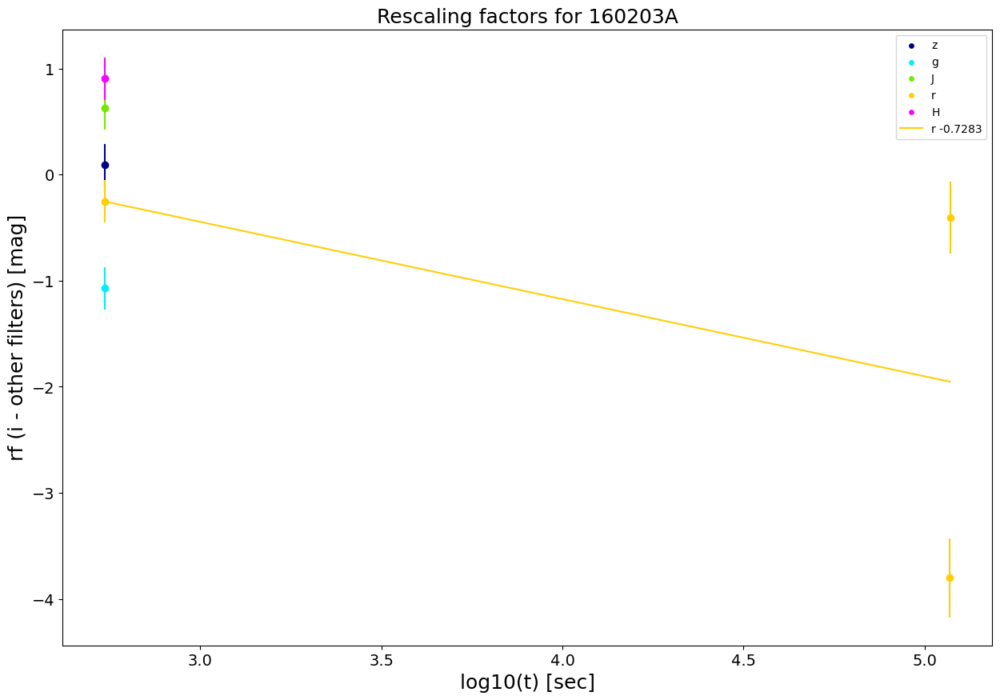


####################################################################################################

160227A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 2], ['B', 2], ['white', 2], ['U', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 2 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    B          2  4.562769  -0.927968           0.55           1.818182
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

160228A
List of filters in the form: [Filter,number of points that have this filter]
[['i', 3], ['H', 1], ['g', 1], ['r', 1], ['z', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  i , with 3 occurrences
-\|/-|/-\|/-|/-\|

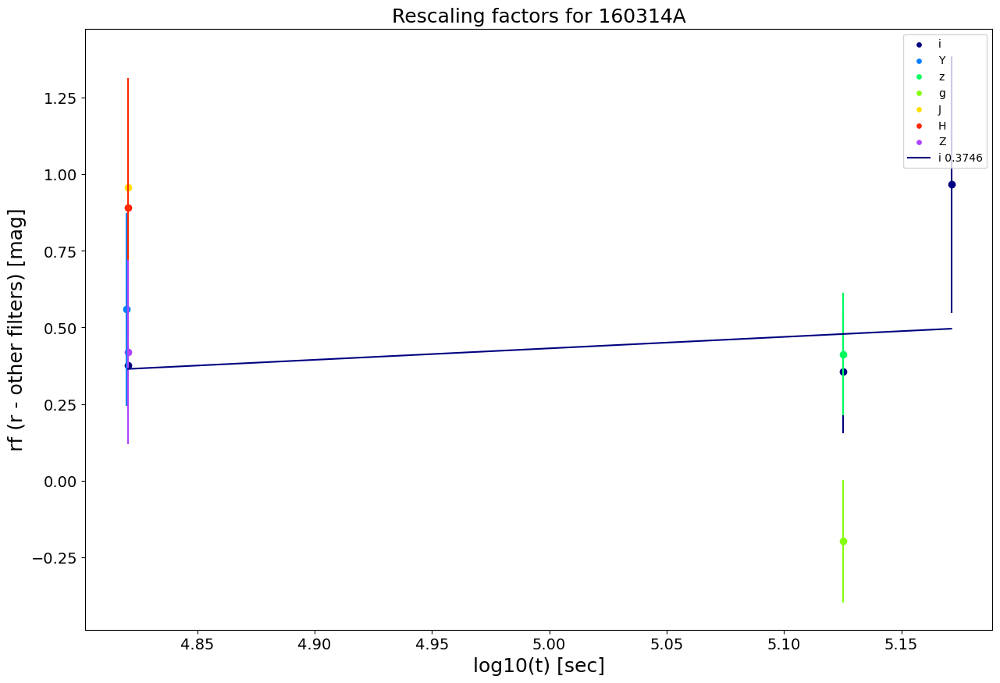


####################################################################################################

160410A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 59], ['white', 10], ['U', 6], ['g', 3], ['i', 3], ['R', 2], ['UVW1', 2], ['B', 2], ['z', 2], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 59 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    g          3  3.309630  -0.076038         0.2000           5.000000
1    i          3  3.309630  -0.214181         0.2000           5.000000
2    z          2  3.309630  -0.025433         0.3000           3.333333
3    g          3  3.333629  -0.053038         0.1220           8.196721
4    i          3  3.333629  -0.207181         0.1525           6.557377
Rescaling results
------------------
    slope slope_err intercept inter_err accep

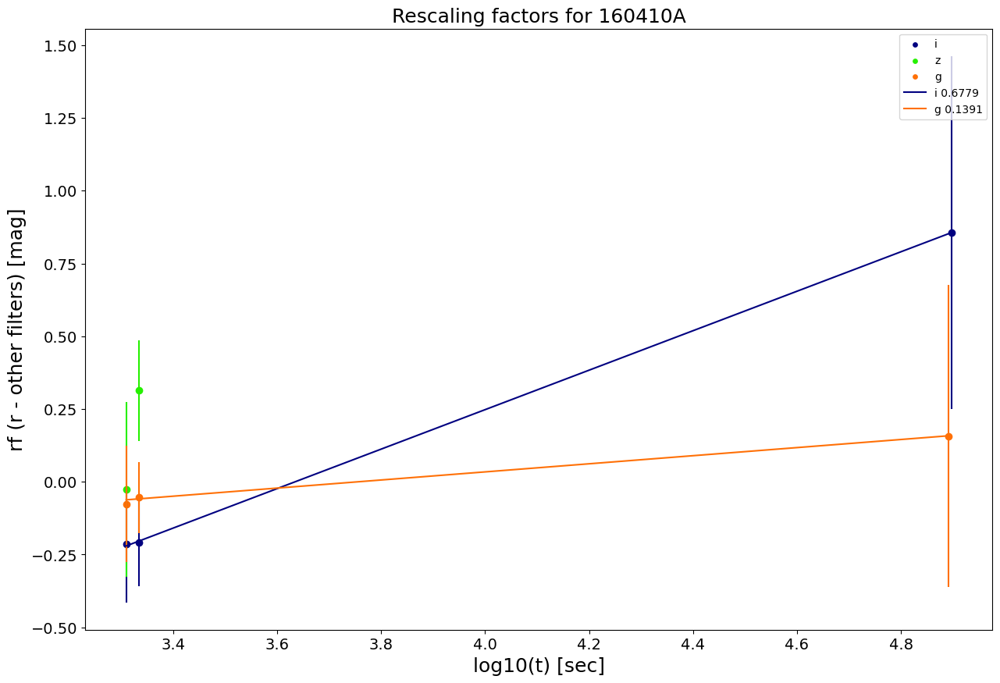


####################################################################################################

160425A
List of filters in the form: [Filter,number of points that have this filter]
[['white', 18], ['U', 2], ['V', 2], ['r', 1], ['H', 1], ['B', 1], ['i', 1], ['g', 1], ['z', 1], ['UVW1', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  white , with 18 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

160509A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 3], ['g', 2], ['Rc', 1], ['H', 1], ['F160W', 1], ['z', 1], ['F110W', 1]]
 
The most numerous filter is considered for rescaling
The most numerous f

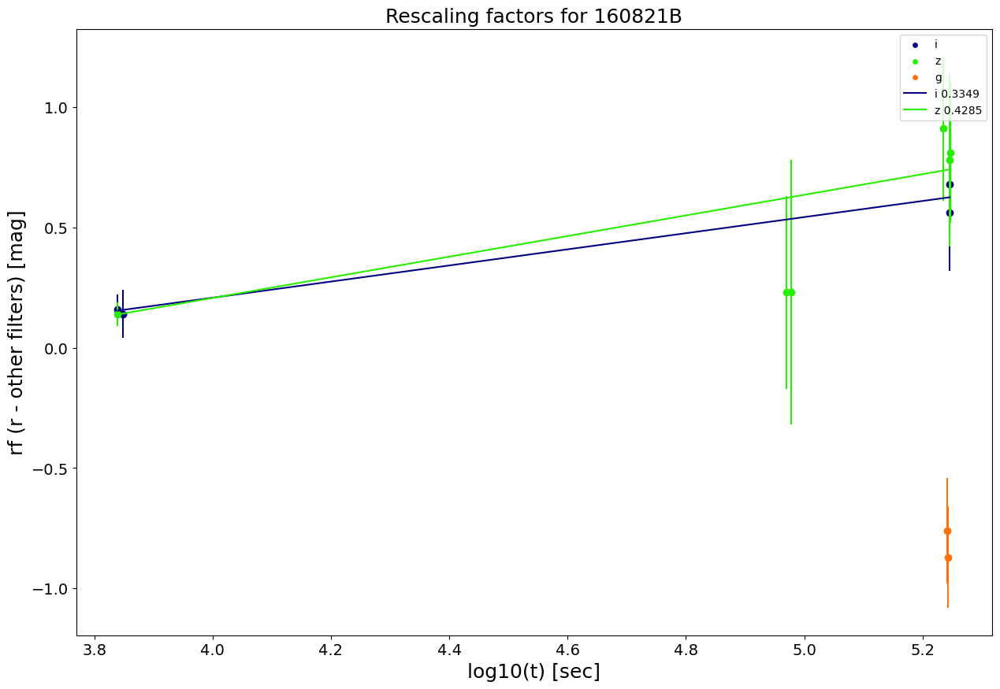


####################################################################################################

161014A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 3], ['Rc', 3], ['R', 2], ['Ic', 2], ['i', 2], ['J', 1], ['Z', 1], ['white', 1], ['g', 1], ['B', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 3 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    J          1  4.816228   1.574463       0.376753           2.654259
1    Z          1  4.822036   0.881689       0.352848           2.834082
2    i          2  4.823084   0.693005       0.284106           3.519813
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

161017A
List of filters in the form: [Filter,number of points 

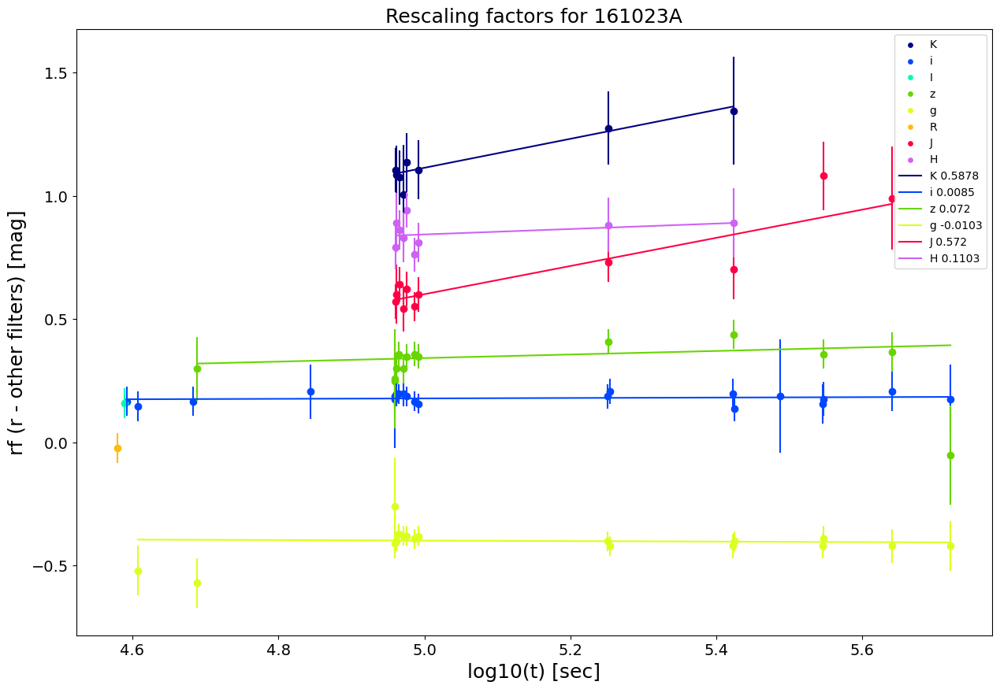


####################################################################################################

161108A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 2], ['r', 2], ['Z', 1], ['Y', 1], ['i', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 2 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

161117A
List of filters in the form: [Filter,number of points that have this filter]
[['V', 2], ['white', 2], ['U', 1], ['UVW1', 1], ['H', 1], ['K', 1], ['B', 1], ['r', 1], ['I', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  V , with 2 occu

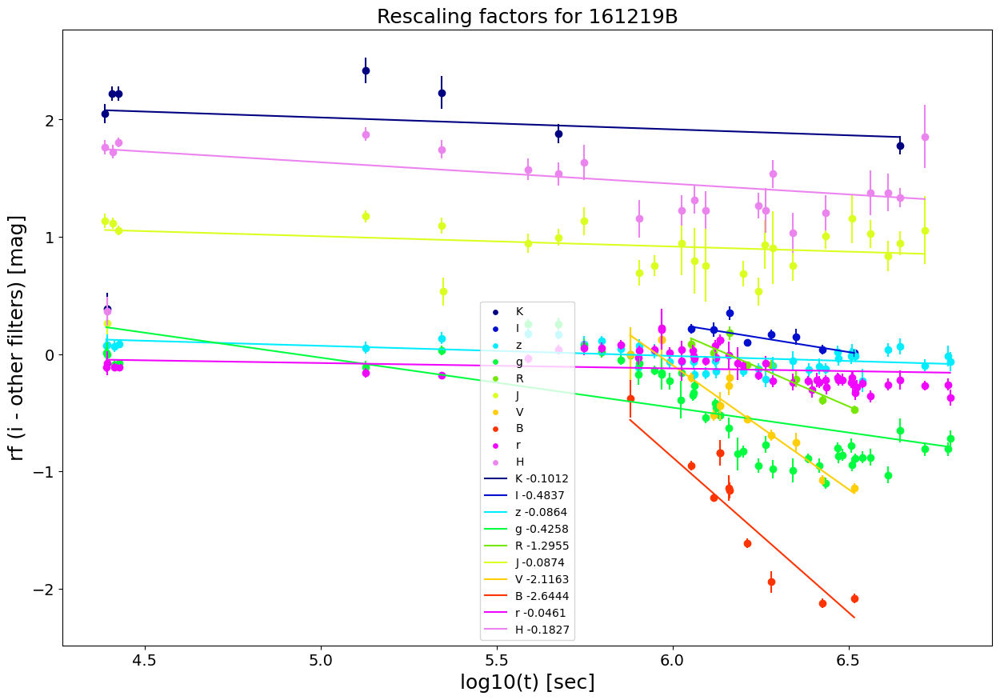


####################################################################################################

170113A
List of filters in the form: [Filter,number of points that have this filter]
[['white', 5], ['U', 2], ['r', 2], ['i', 2], ['J', 1], ['H', 1], ['B', 1], ['g', 1], ['z', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  white , with 5 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

170202A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 31], ['V', 23], ['I', 4], ['r', 4], ['Ic', 2], ['i', 2], ['Rc', 2], ['white', 2], ['Z', 1], ['K', 1], ['g', 1], ['B', 1], ['Y', 1], ['J', 1], ['z', 1]]
 
The most

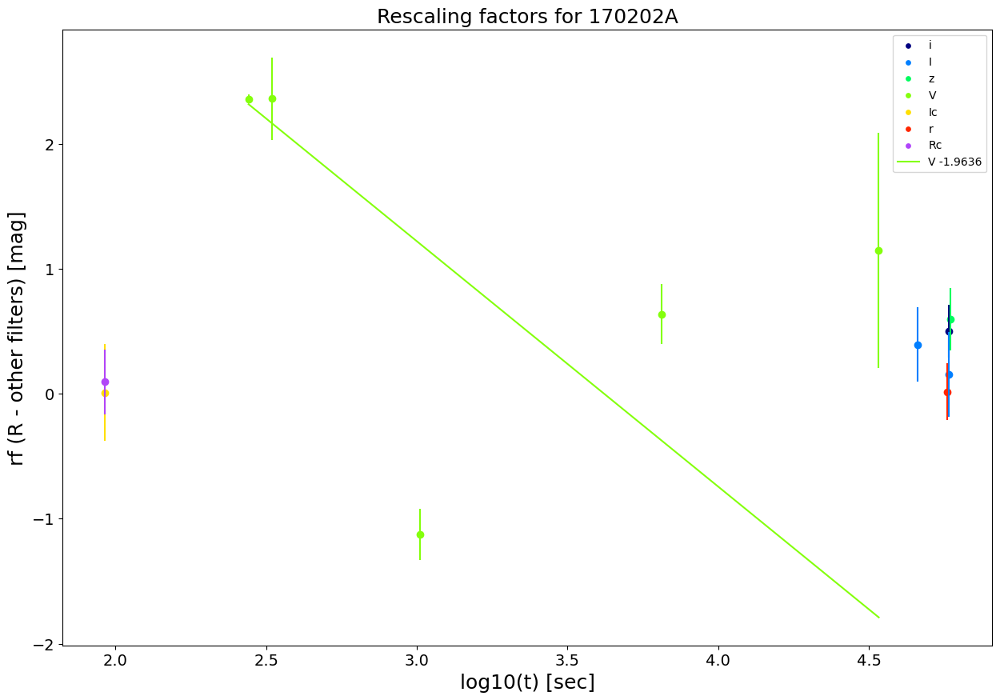


####################################################################################################

170214A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 4], ['i', 3], ['Y', 2], ['Z', 2], ['H', 1], ['K', 1], ['g', 1], ['J', 1], ['z', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 4 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    i          3  4.588921  -0.068629           0.24           4.166667
1    i          3  4.797683   0.255737           0.20           5.000000
2    g          1  4.797683  -0.887275           0.40           2.500000
3    z          1  4.797683   0.561932           0.20           5.000000
4    H          1  4.804889   1.281415           0.20           5.000000
Rescaling results
------------------
    slope slope_err intercept inter_err acceptance           red_

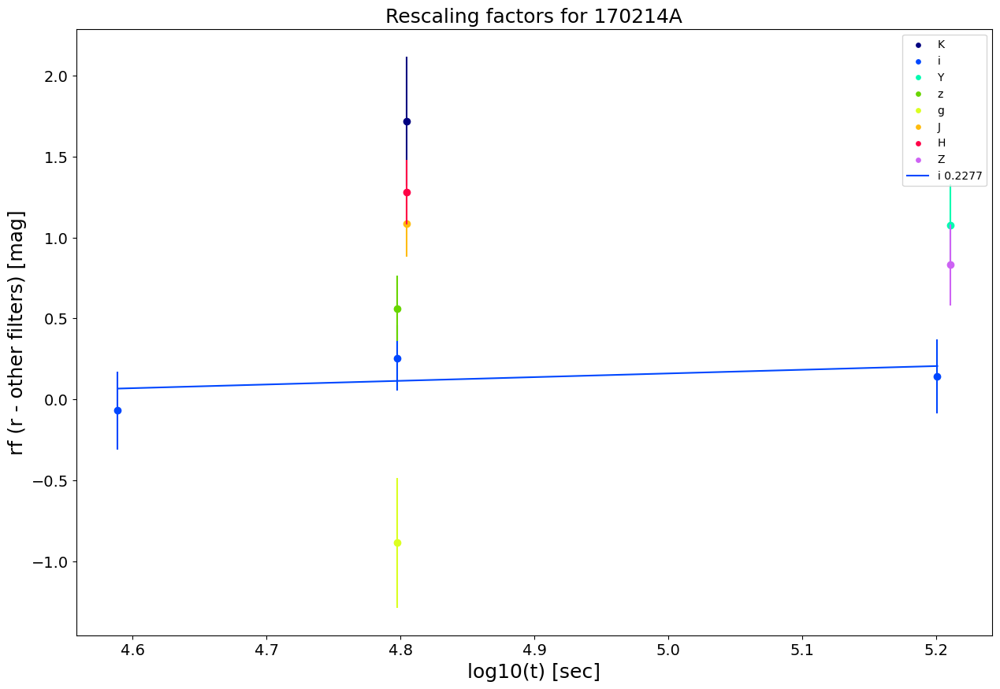


####################################################################################################

170405A
List of filters in the form: [Filter,number of points that have this filter]
[['CR', 4], ['white', 3], ['I', 2], ['r', 2], ['i', 1], ['J', 1], ['Z', 1], ['H', 1], ['R', 1], ['B', 1], ['Y', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  CR , with 4 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

170428A
List of filters in the form: [Filter,number of points that have this filter]
[['i', 3], ['H', 1], ['g', 1], ['r', 1], ['R', 1], ['z', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter 

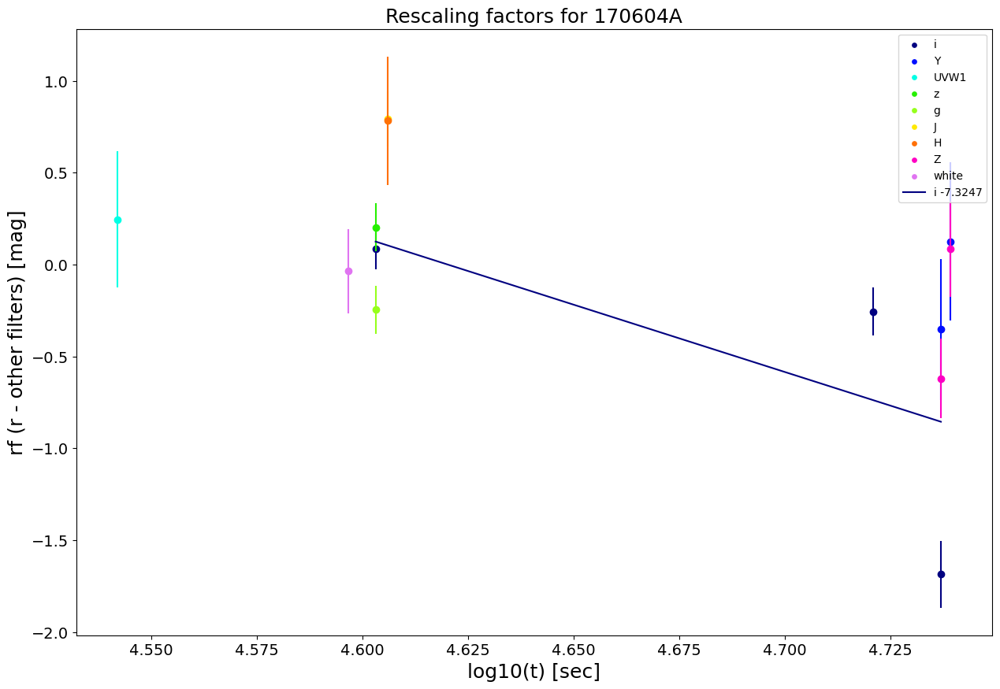


####################################################################################################

170607A
List of filters in the form: [Filter,number of points that have this filter]
[['white', 4], ['U', 3], ['r', 2], ['UVM2', 1], ['Unfiltered', 1], ['UVW2', 1], ['B', 1], ['g', 1], ['i', 1], ['CR', 1], ['UVW1', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  white , with 4 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

170705A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 65], ['i', 65], ['J', 33], ['Z', 33], ['Y', 33], ['H', 31], ['R', 3], ['white', 3], ['U', 1], ['B', 1], ['CR', 1]]
 
The mo

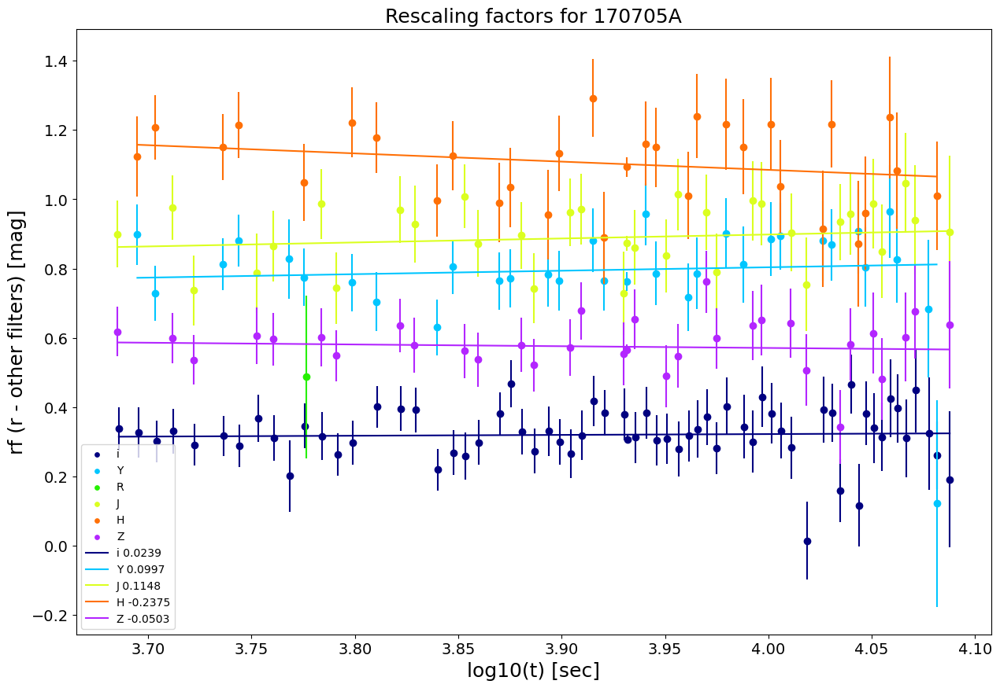


####################################################################################################

170714A
List of filters in the form: [Filter,number of points that have this filter]
[['U', 1], ['z', 1], ['B', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  U , with 1 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    B          1  3.029384   0.072819           0.68           1.470588
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

170817A
List of filters in the form: [Filter,number of points that have this filter]
[['g', 32], ['V', 30], ['r', 28], ['z', 25], ['R', 22], ['J', 19], ['w', 18], ['I', 18], ['B', 14], ['H', 13], ['i', 11], ['Y', 11], ['K', 10], ['U', 7], ['F336W', 4], ['F475W', 4], ['F110W', 4], ['F606W', 3],

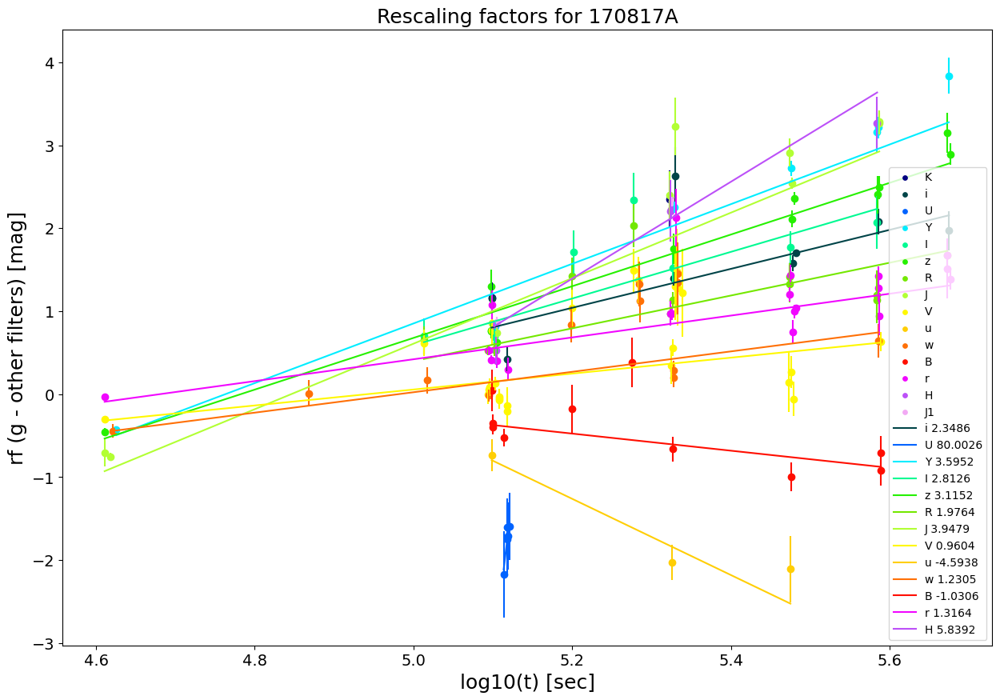


####################################################################################################

171010A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 31], ['white', 30], ['i', 30], ['g', 15], ['z', 14], ['R', 5], ['V', 4], ['I', 3], ['U', 2]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 31 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    g         15  5.285986  -0.155749           0.17           5.882353
1    i         30  5.289853   0.558181           0.37           2.702703
2    i         30  5.477843   0.188181           0.05          20.000000
3    g         15  5.477843  -0.325749           0.05          20.000000
4    z         14  5.477843   0.544467           0.05          20.000000
Rescaling results
------------------
        slope slope_err intercept inter_err acceptance 

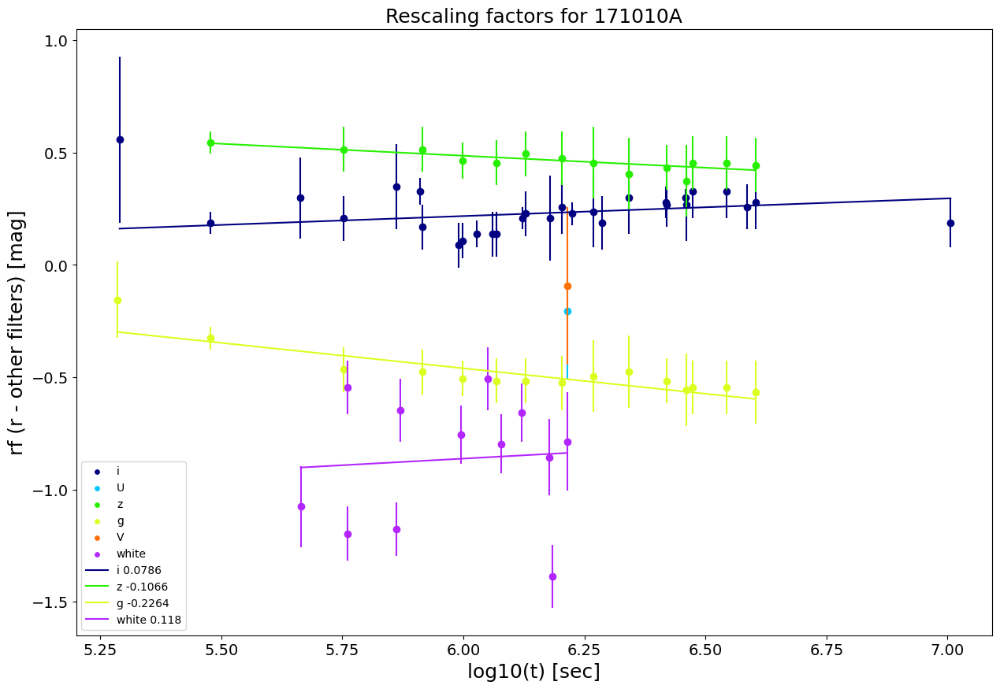


####################################################################################################

171020A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 3], ['R', 2], ['i', 2], ['Rc', 2], ['H', 1], ['Y', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 3 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    i          2  4.416641   0.021043           0.23           4.347826
1    i          2  5.041669   0.111043           0.25           4.000000
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

171205A
List of filters in the form: [Filter,number of points that have this filter]
[['B', 38], ['U', 31], ['V', 31], ['UVW2', 23], ['UVW1', 21], ['UVM2', 16], ['white', 5], ['R',

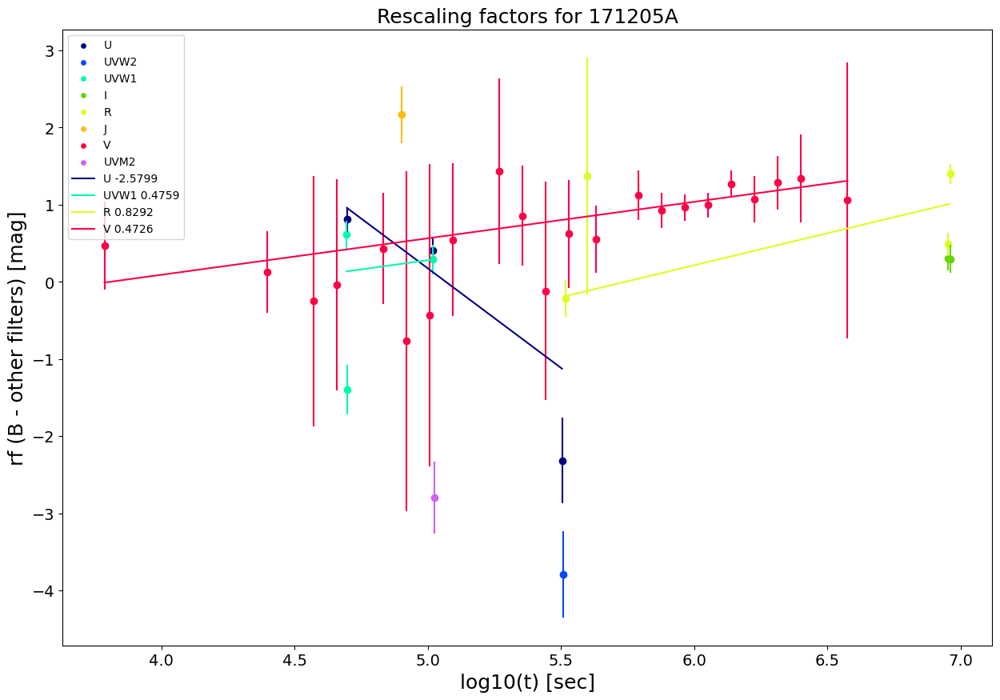


####################################################################################################

171222A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 4]]
 
The most numerous filter is considered for rescaling
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/171222A_magAB_extcorr.txt has only one filter along all the LC, thus no rescaling is needed

####################################################################################################

180115A
List of filters in the form: [Filter,number of points that have this filter]
[['white', 4], ['r', 2], ['U', 1], ['B', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  white , with 4 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors 

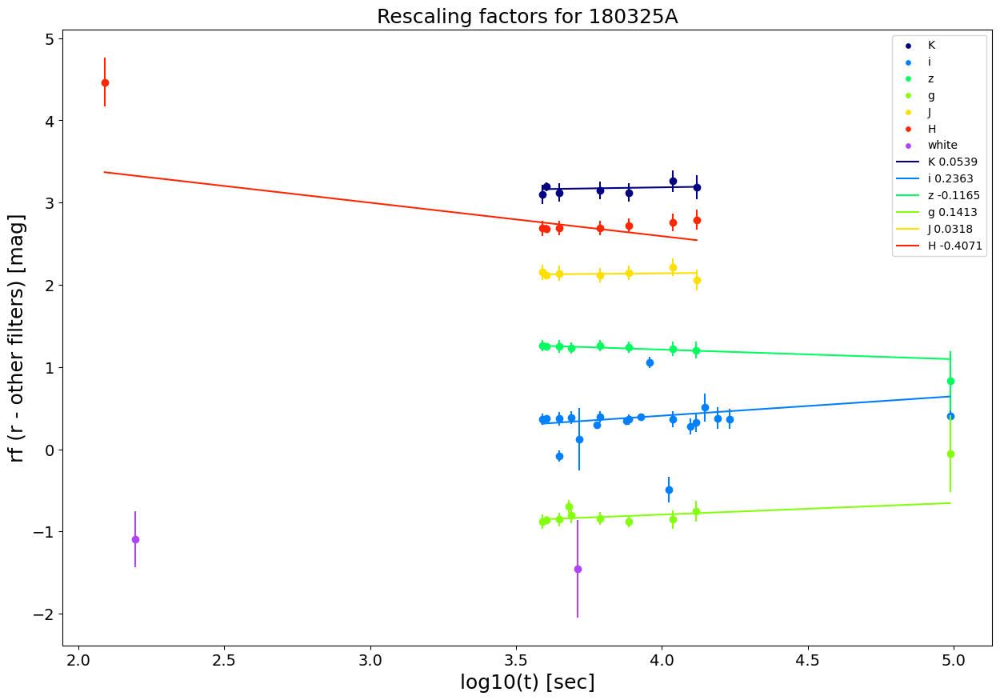


####################################################################################################

180329B
List of filters in the form: [Filter,number of points that have this filter]
[['r', 3], ['white', 3], ['U', 2], ['B', 1], ['i', 1], ['UVW1', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 3 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    i          1  4.688882   -0.05433           0.19           5.263158
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

180404A
List of filters in the form: [Filter,number of points that have this filter]
[['white', 3], ['U', 2], ['r', 1], ['UVW2', 1], ['R', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  white , wi

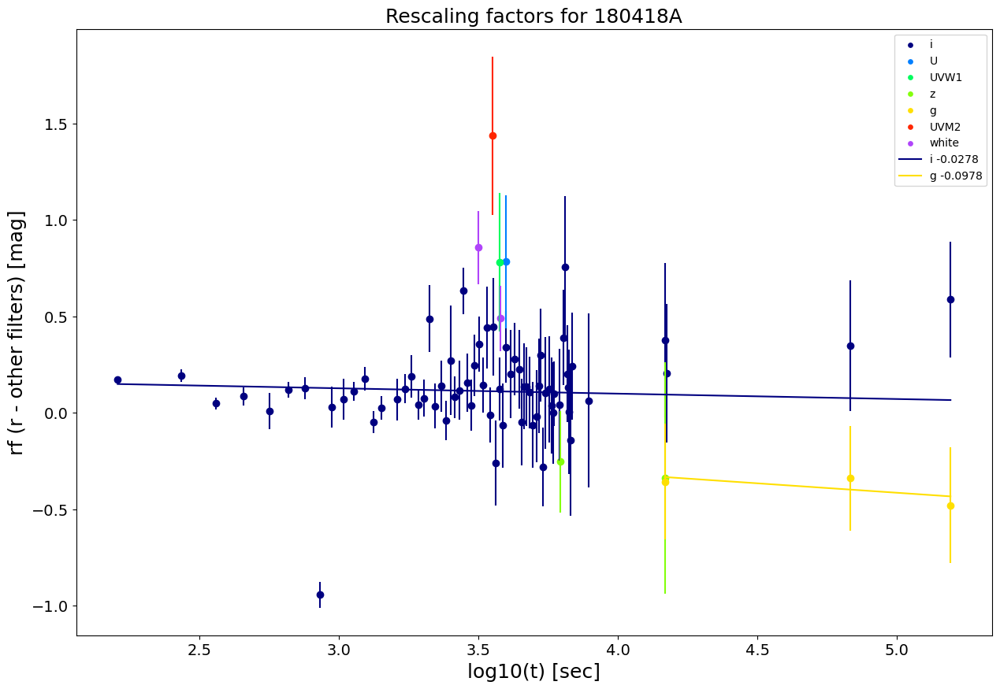


####################################################################################################

180510B
List of filters in the form: [Filter,number of points that have this filter]
[['white', 2], ['H', 1], ['K', 1], ['g', 1], ['r', 1], ['i', 1], ['z', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  white , with 2 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

180620B
List of filters in the form: [Filter,number of points that have this filter]
[['white', 2], ['J', 1], ['U', 1], ['r', 1], ['UVW1', 1], ['H', 1], ['K', 1], ['B', 1], ['g', 1], ['i', 1], ['UVM2', 1], ['V', 1], ['z', 1]]
 
The most numerous filter is considered for res

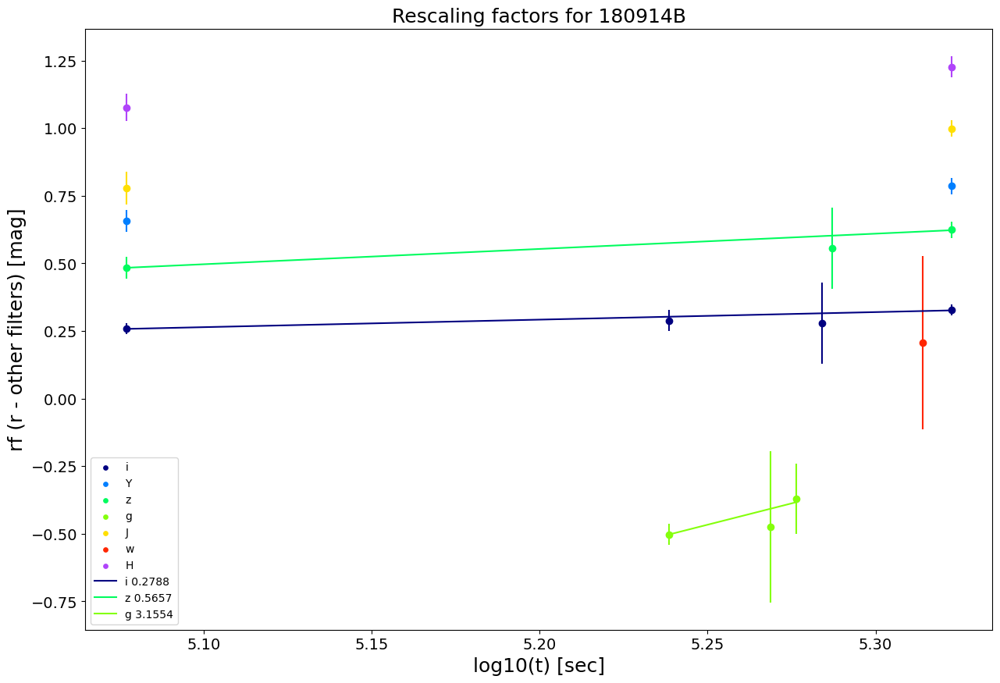


####################################################################################################

181010A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 5], ['i', 3], ['H', 3], ['J', 2], ['white', 2], ['Z', 1], ['g', 1], ['Y', 1], ['R', 1], ['z', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 5 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    H          3  2.390935   3.736652           0.40           2.500000
1    i          3  2.445604   0.177956           0.03          33.333333
2    g          1  2.445604  -0.652752           0.03          33.333333
3    z          1  2.445604   0.730465           0.02          50.000000
4    i          3  3.061452  -0.751536           0.30           3.333333
No filter with at least 3 rescaling factors to be fitted

##############################

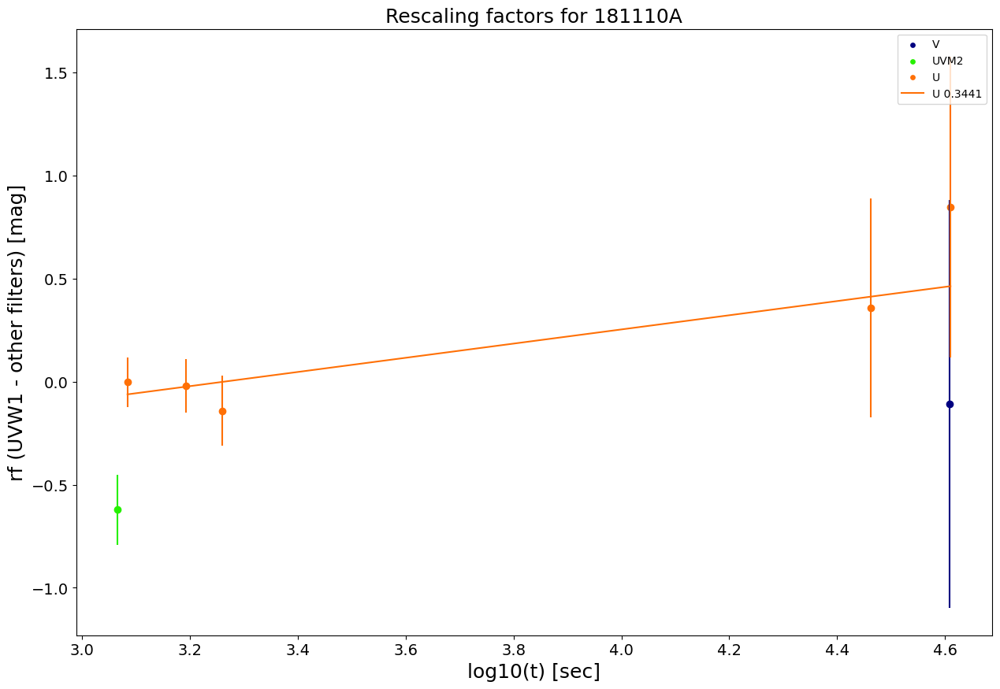


####################################################################################################

181123B
List of filters in the form: [Filter,number of points that have this filter]
[['i', 2], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  i , with 2 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    J          1   4.52009   0.325288           0.44           2.272727
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

190106A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 158], ['r', 30], ['i', 23], ['g', 20], ['V', 2], ['Ic', 2], ['z', 2], ['Rc', 2], ['U', 1], ['white', 1], ['B', 1], ['UVW1', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of t

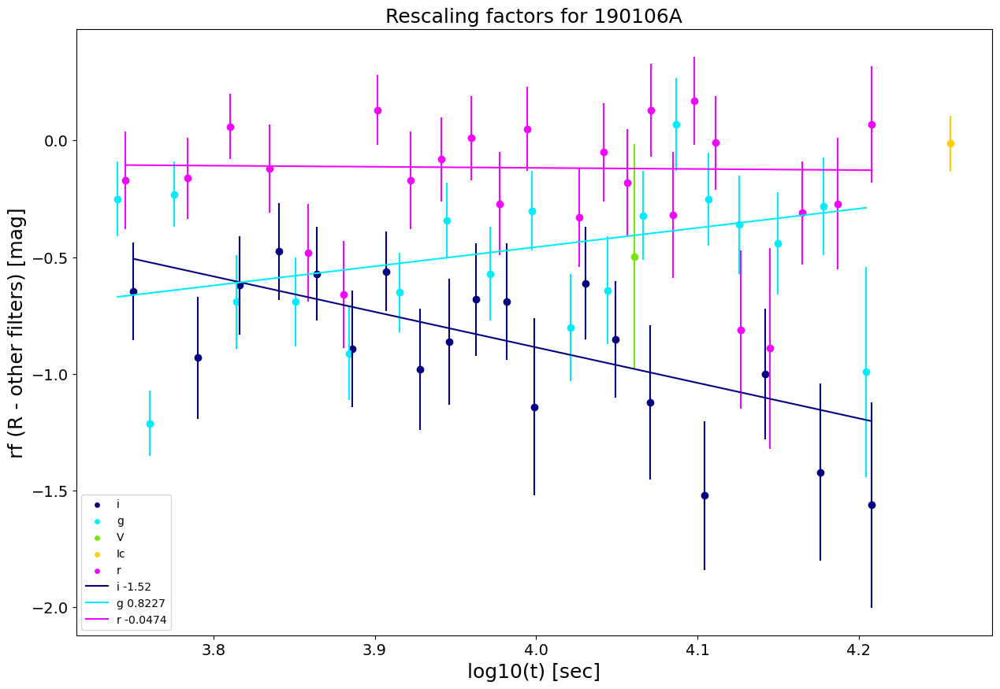


####################################################################################################

190114A
List of filters in the form: [Filter,number of points that have this filter]
[['white', 2], ['V', 1], ['r', 1], ['Ic', 1], ['K', 1], ['H', 1], ['B', 1], ['R', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  white , with 2 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    B          1  3.034628   0.032006            0.4                2.5
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

190114C
List of filters in the form: [Filter,number of points that have this filter]
[['r', 38], ['i', 20], ['z', 19], ['R', 14], ['Rc', 7], ['g', 5], ['white', 5], ['J', 5], ['V', 4], ['F775W', 4], ['F606W', 4], ['F850LP', 4

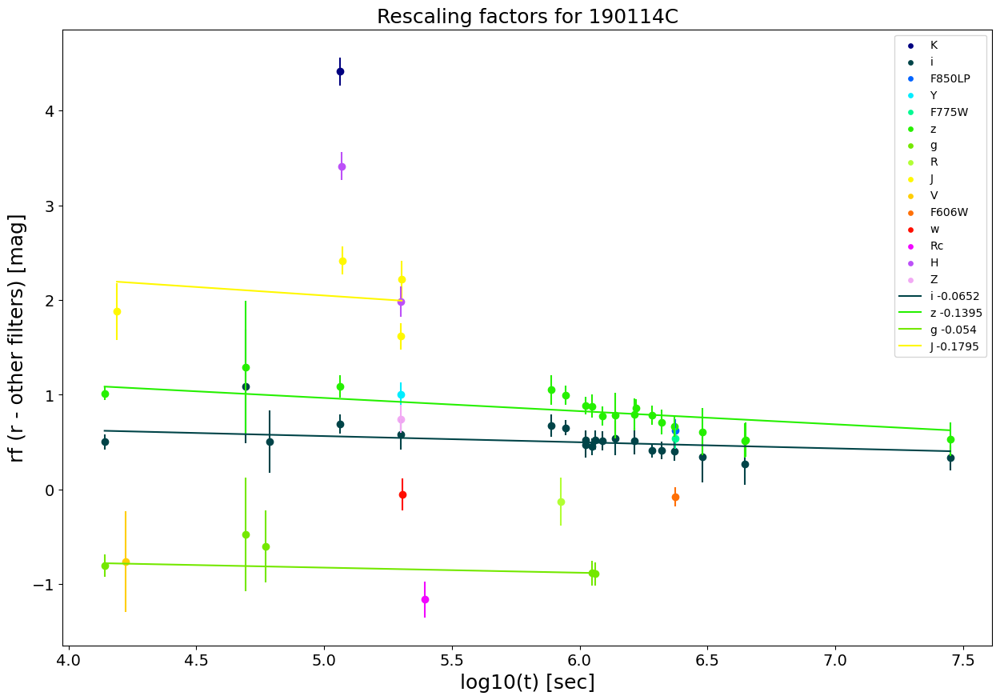


####################################################################################################

190627A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 140], ['R', 35], ['white', 4], ['U', 1], ['H', 1], ['i', 1], ['UVW1', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 140 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    R         35  4.335426  -0.164787        0.10164           9.838646
1    R         35  4.438010  -0.219787        0.13035           7.671653
2    R         35  4.438011  -0.217787        0.12735           7.852375
3    R         35  4.440876  -0.157117        0.11810           8.467401
4    R         35  4.443722  -0.067117        0.11810           8.467401
Rescaling results
------------------
        slope slope_err intercept inter_err acceptance         

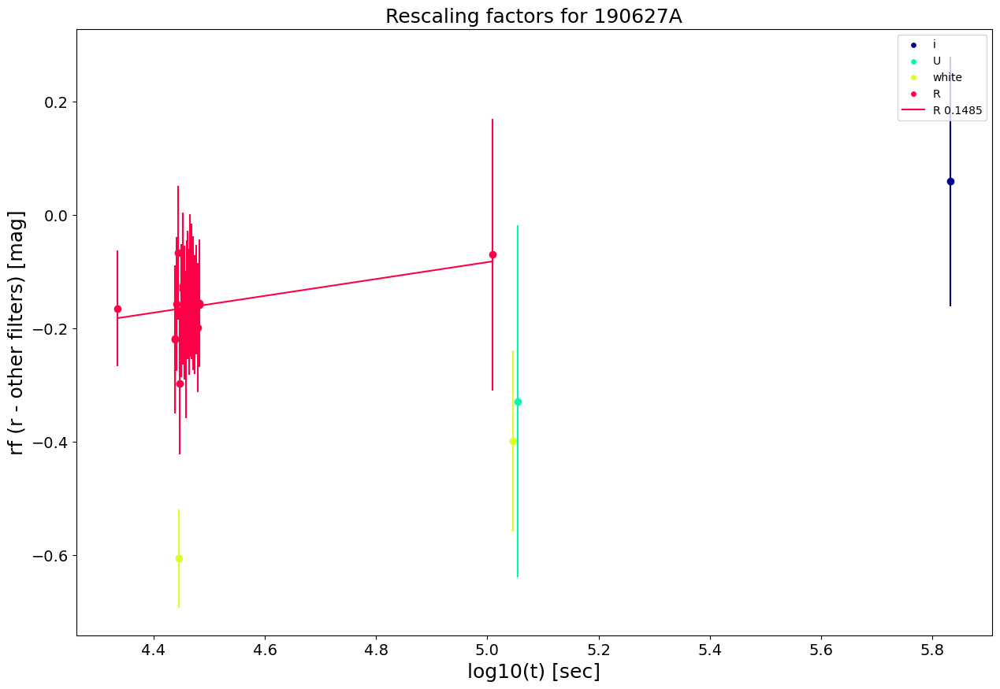


####################################################################################################

190719C
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/190719C_magAB_extcorr.txt has only one data point along all the LC, thus no rescaling is needed

----------------------------------------------------------------------------------------------------


####################################################################################################

190829A
List of filters in the form: [Filter,number of points that have this filter]
[['white', 11], ['i', 11], ['V', 10], ['U', 8], ['B', 6], ['UVW1', 6], ['g', 5], ['r', 5], ['z', 4], ['u', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  white , with 11 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    B          6  3.127655       0.39          0.165     

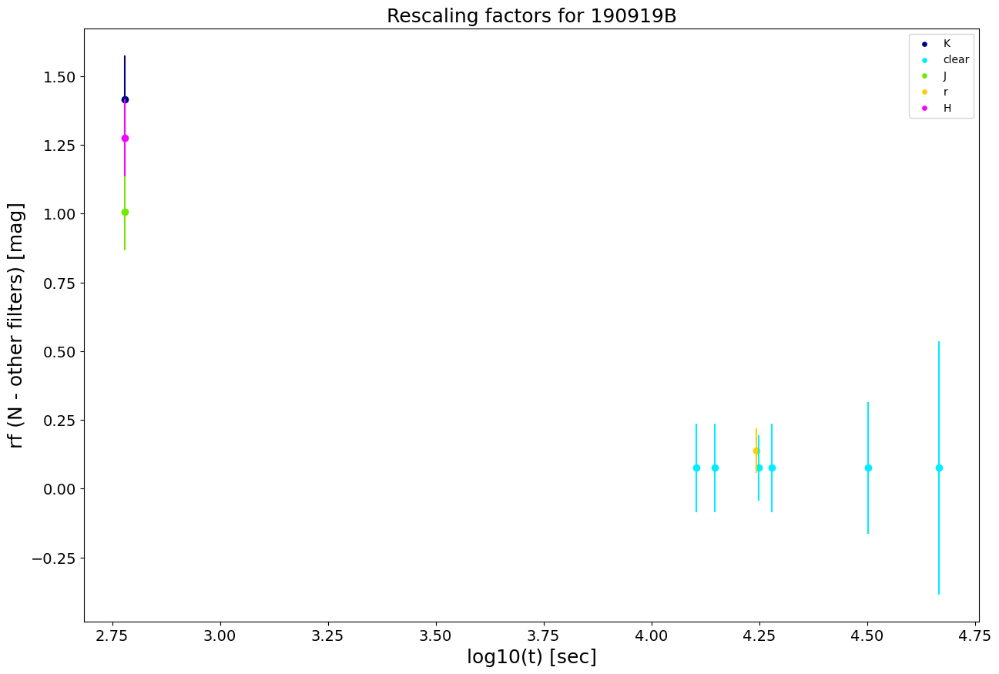


####################################################################################################

191004B
List of filters in the form: [Filter,number of points that have this filter]
[['R', 4], ['r', 3], ['white', 3], ['I', 1], ['w', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 4 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    r          3  4.246499   0.011978           0.09          11.111111
1    I          1  4.265996   1.096362           0.16           6.250000
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

191011A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 2], ['i', 2], ['white', 2], ['U', 1], ['Z', 1], ['H', 1], ['g', 1], ['B', 1], ['z', 1], ['J', 1]]
 
The m

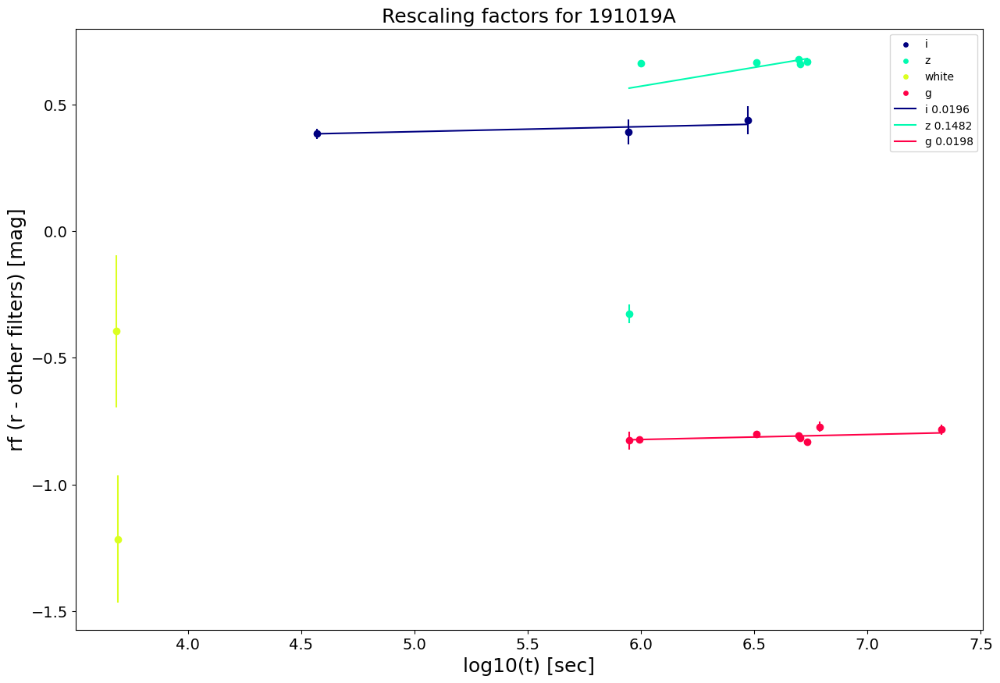


####################################################################################################

191221B
List of filters in the form: [Filter,number of points that have this filter]
[['Clear', 174], ['R', 3], ['V', 2], ['U', 1], ['r', 1], ['UVW1', 1], ['UVW2', 1], ['I', 1], ['B', 1], ['UVM2', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  Clear , with 174 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    R          3  4.141763  -0.243900           0.04          25.000000
1    I          1  4.141763   0.378103           0.04          25.000000
2    r          1  4.549430  -0.174719           0.14           7.142857
3    R          3  4.584444   0.116100           0.12           8.333333
4    V          2  4.784724   0.049778           0.40           2.500000
No filter with at least 3 rescaling factors to be fitted

#############

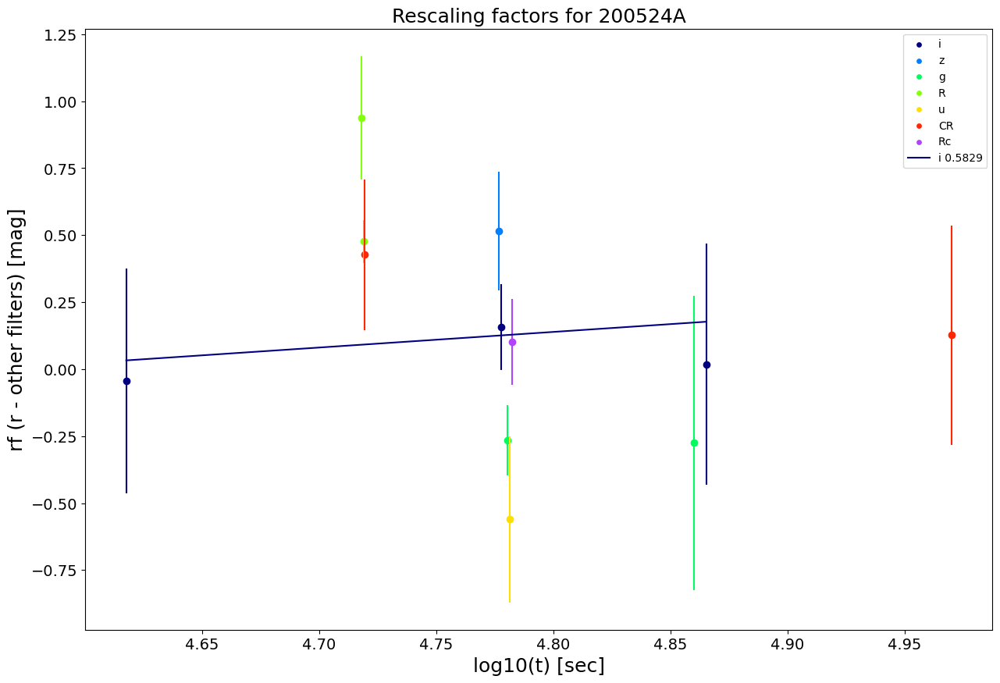


####################################################################################################

200613A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 24], ['CR', 3], ['r', 3], ['Clear', 3], ['Rc', 1], ['U', 1], ['white', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 24 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
    band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0     CR          3  4.669366  -0.108570          0.270           3.703704
1  Clear          3  4.669366  -0.116347          0.404           2.475248
2  Clear          3  5.334395   0.102653          0.428           2.336449
3     CR          3  5.338604   0.081430          0.410           2.439024
4     Rc          1  6.128680  -0.028347          0.676           1.479290
No filter with at least 3 rescaling factors to be fitted

########################################

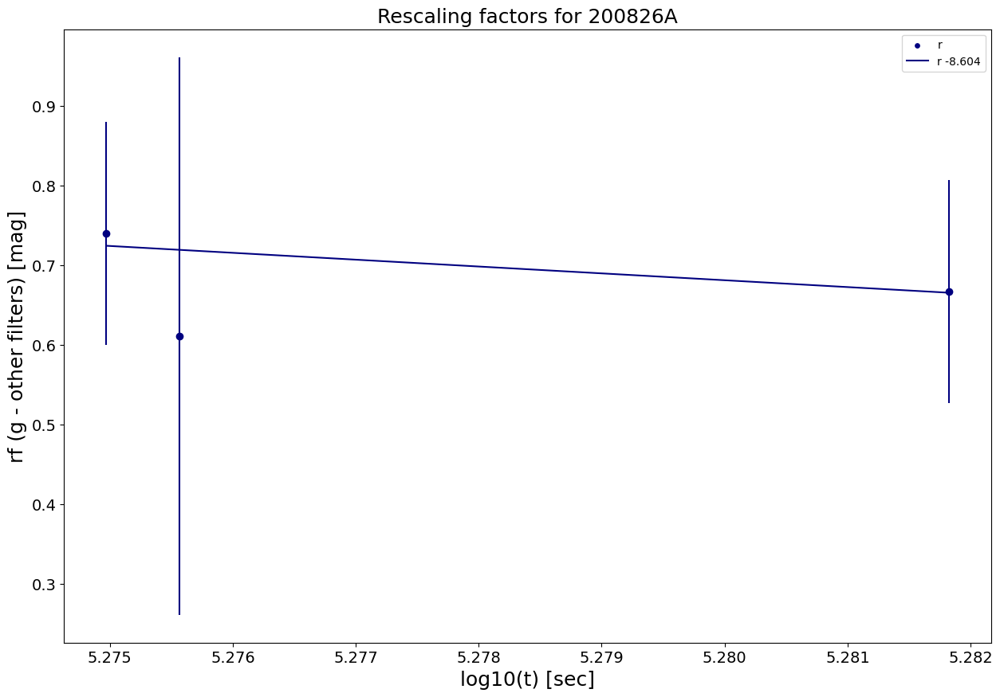


####################################################################################################

200829A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 9], ['white', 9], ['U', 7], ['B', 7], ['UVW1', 5], ['r', 5], ['UVM2', 5], ['V', 4], ['g', 4], ['UVW2', 4], ['i', 4], ['I', 3], ['z', 2]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 9 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
   band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0     r          5  4.286591  -0.163898           0.26           3.846154
1     i          4  4.286591  -0.230309           0.28           3.571429
2  UVW1          5  4.324694  -0.009517           0.20           5.000000
3     r          5  4.333004  -0.475698           0.18           5.555556
4     I          3  5.003288   0.221107           0.23           4.347826
Rescaling results
------------------
      

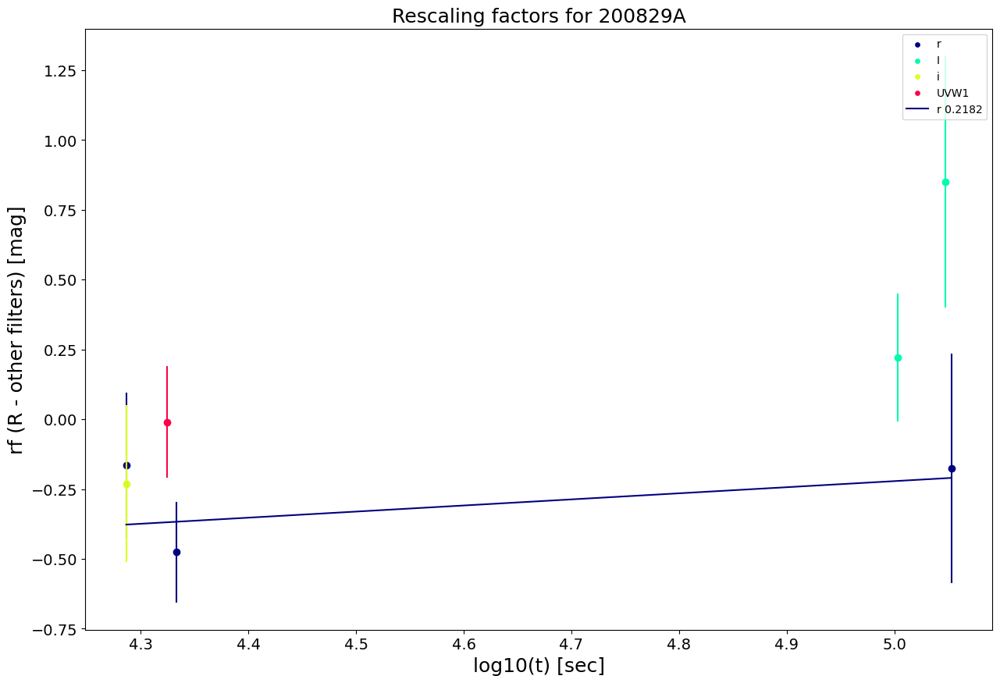


####################################################################################################

201014A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 2], ['i', 2], ['R', 2], ['z', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 2 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    i          2  5.068149   1.500406           0.19           5.263158
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

201015A
List of filters in the form: [Filter,number of points that have this filter]
[['clear', 107], ['r', 93], ['i', 42], ['g', 41], ['white', 8], ['R', 6], ['V', 3], ['Rc', 3], ['B', 2], ['I', 1], ['z', 1]]
 
The most numerous filter is considered for rescaling
The most numerous f

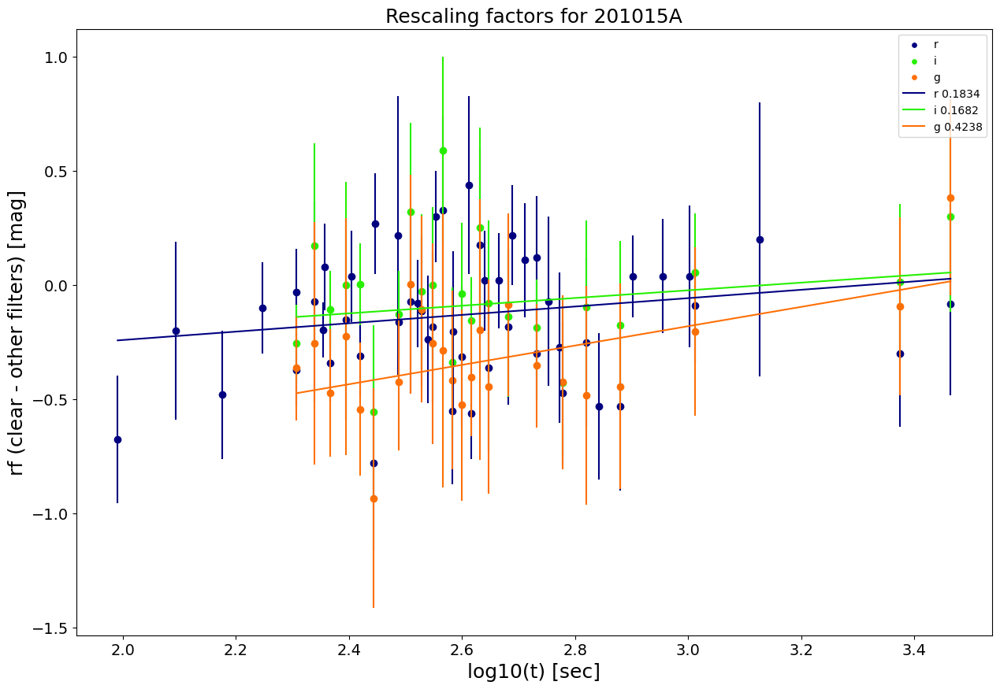


####################################################################################################

201020A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 10], ['V', 4], ['white', 4], ['R', 4], ['B', 2], ['Rc', 1], ['U', 1], ['Ic', 1], ['I', 1], ['g', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 10 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

201020B
List of filters in the form: [Filter,number of points that have this filter]
[['r', 14], ['R', 13], ['U', 2], ['i', 2], ['Rc', 2], ['white', 1], ['Ic', 1], ['g', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numero

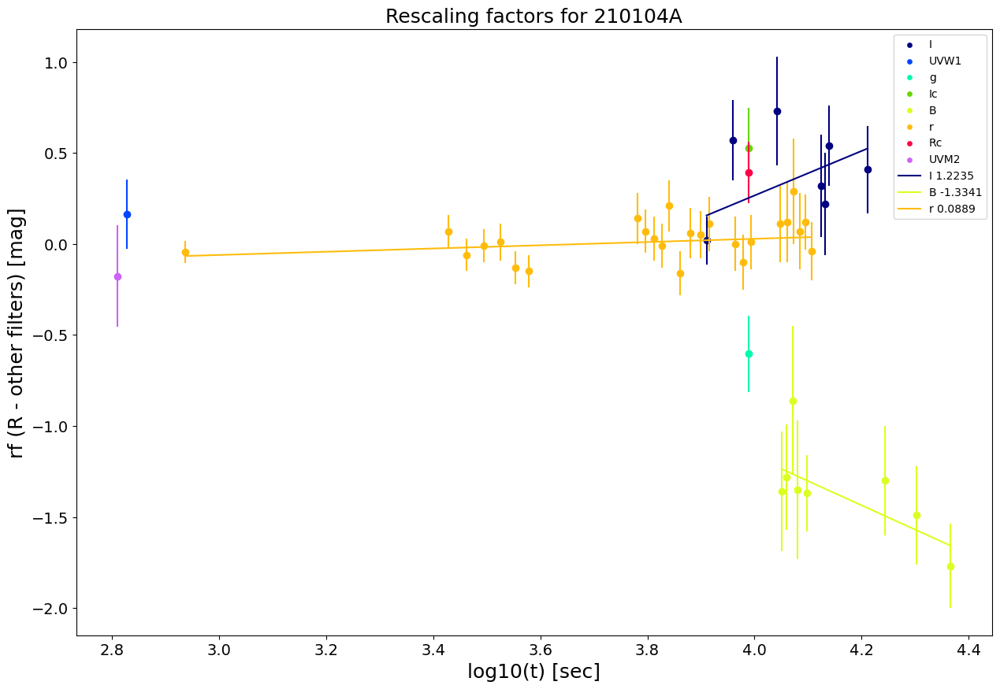


####################################################################################################

210116A
List of filters in the form: [Filter,number of points that have this filter]
[['g', 4], ['R', 2], ['r', 2], ['i', 2], ['Rc', 1], ['H', 1], ['J', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  g , with 4 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    r          2  4.856115   0.281031           0.09          11.111111
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

210204A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 35], ['r', 25], ['i', 14], ['B', 12], ['I', 8], ['V', 7], ['g', 5], ['z', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of 

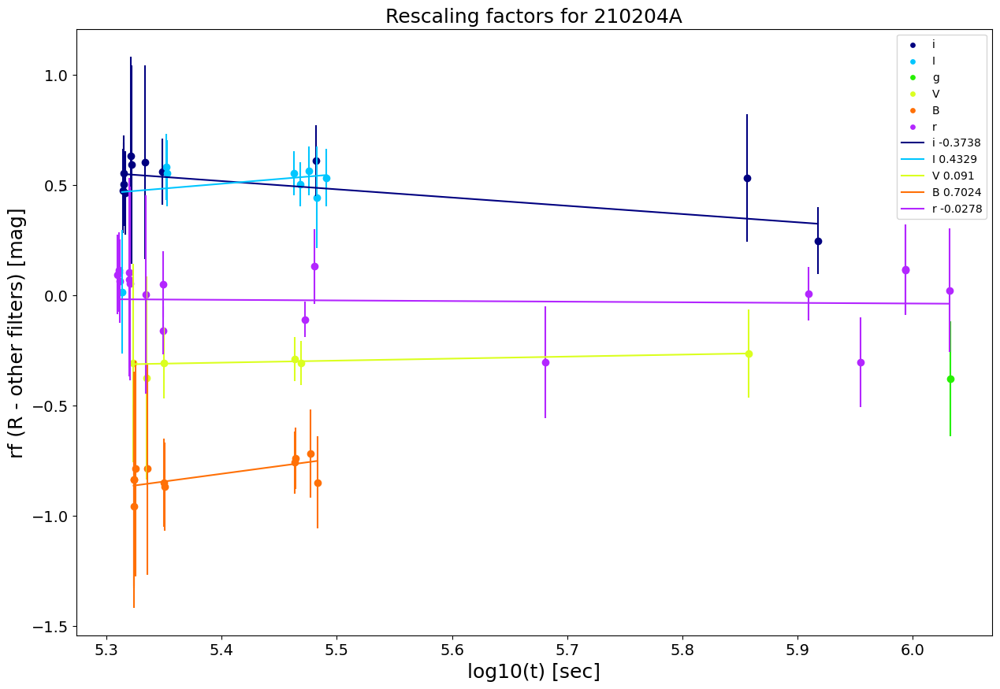


####################################################################################################

210210A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 3], ['Rc', 2], ['white', 2], ['UVM2', 1], ['U', 1], ['UVW2', 1], ['I', 1], ['B', 1], ['r', 1], ['UVW1', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 3 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    I          1  4.546641   0.497747           0.11           9.090909
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

210222B
List of filters in the form: [Filter,number of points that have this filter]
[['R', 25], ['U', 5], ['white', 4], ['B', 3], ['r', 3], ['V', 3], ['g', 2], ['Clear', 1], ['I', 1], ['H', 1], ['i',

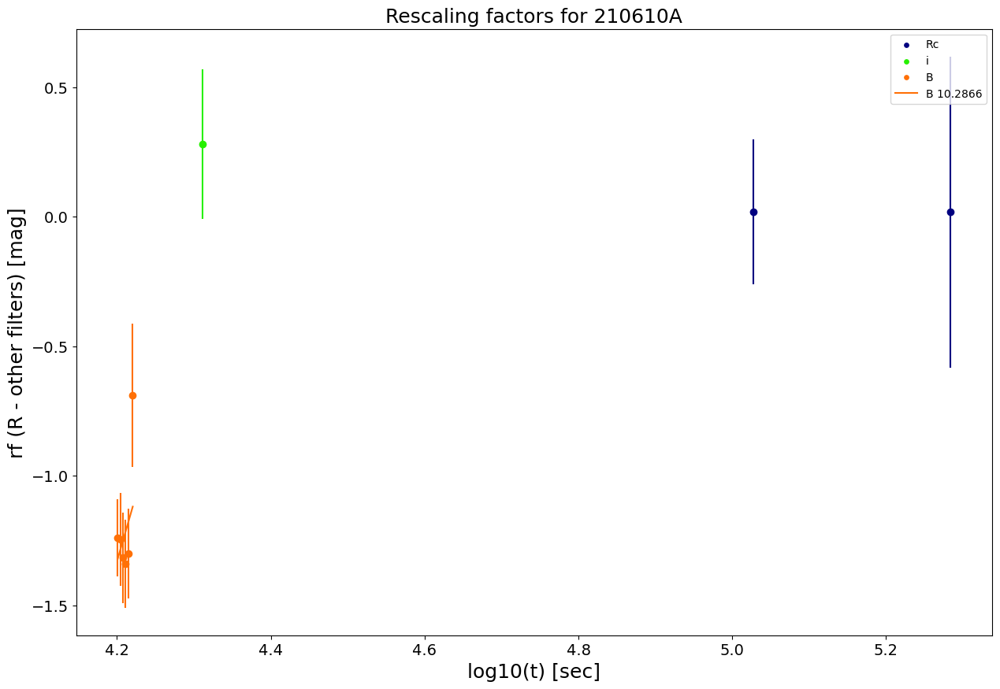


####################################################################################################

210610B
List of filters in the form: [Filter,number of points that have this filter]
[['r', 27], ['Clear', 20], ['Rc', 18], ['g', 16], ['R', 13], ['i', 10], ['V', 8], ['z', 8], ['B', 6], ['U', 6], ['UVW1', 5], ['white', 5], ['CR', 3], ['UVW2', 2], ['Ic', 2], ['J', 2], ['u', 2], ['H', 1], ['Y', 1], ['Z', 1], ['UVM2', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 27 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
    band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0  Clear         20  3.343212  -0.006985           0.40           2.500000
1  Clear         20  3.749504   0.213015           0.11           9.090909
2  Clear         20  3.786041   0.227998           0.19           5.263158
3  Clear         20  3.819807  -0.196985           0.07          14.285714
4   UVM2          

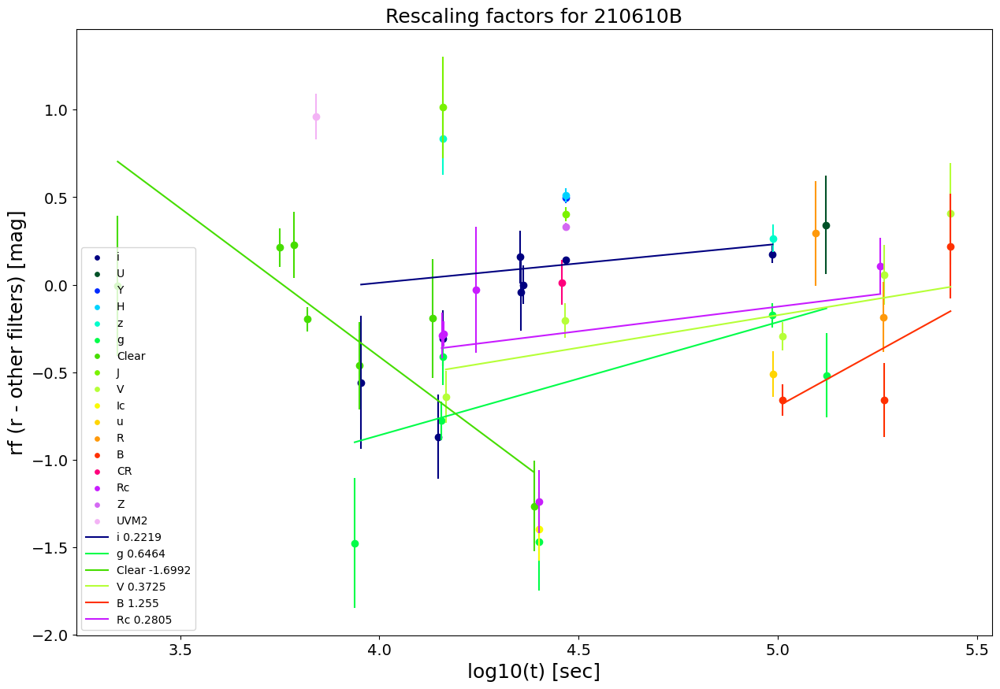


####################################################################################################

210619B
List of filters in the form: [Filter,number of points that have this filter]
[['r', 32], ['R', 24], ['i', 18], ['g', 12], ['z', 11], ['I', 5], ['Ic', 4], ['V', 3], ['K', 2], ['CR', 2], ['J', 2], ['white', 2], ['U', 1], ['UVW2', 1], ['H', 1], ['B', 1], ['UVW1', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 32 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    i         18  3.596817   0.279109           0.11           9.090909
1    g         12  3.968810  -0.548162           0.06          16.666667
2    g         12  3.968810  -0.548162           0.06          16.666667
3    V          3  3.975432   0.015882           0.23           4.347826
4    i         18  3.977274   0.271684           0.07          14.285714
Resc

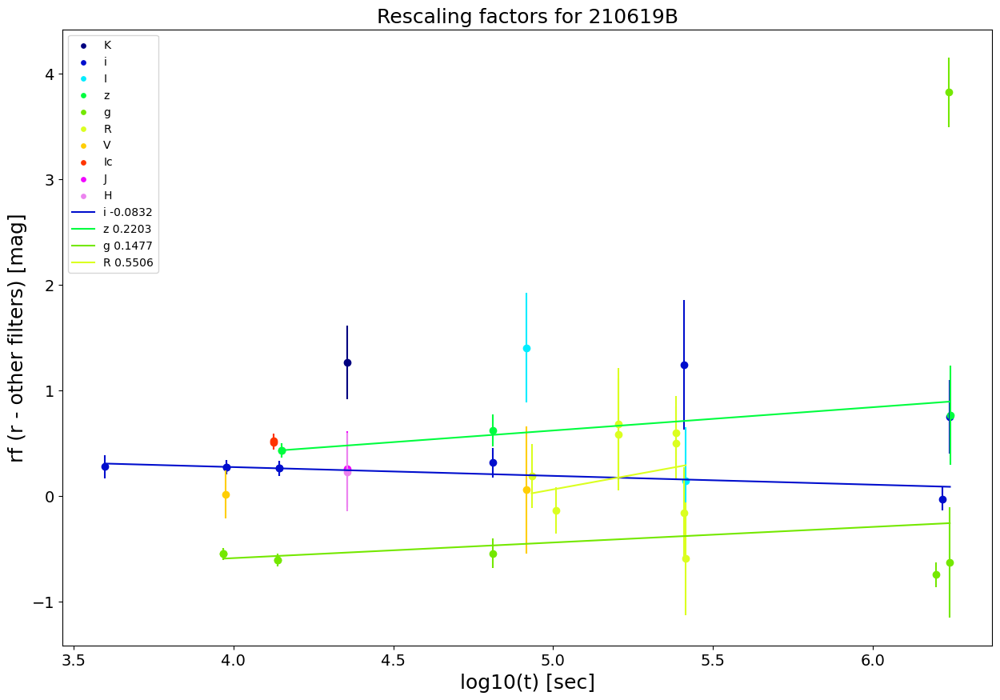


####################################################################################################

210702A
List of filters in the form: [Filter,number of points that have this filter]
[['Clear', 25], ['r', 7], ['i', 2], ['U', 1], ['white', 1], ['u', 1], ['g', 1], ['B', 1], ['R', 1], ['z', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  Clear , with 25 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    R          1  4.631849  -0.318704           0.22           4.545455
1    r          7  4.702387  -0.866754           0.68           1.470588
2    i          2  4.702387  -0.545244           0.58           1.724138
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

210722A
List of filters in the form: [Filter,number of points th

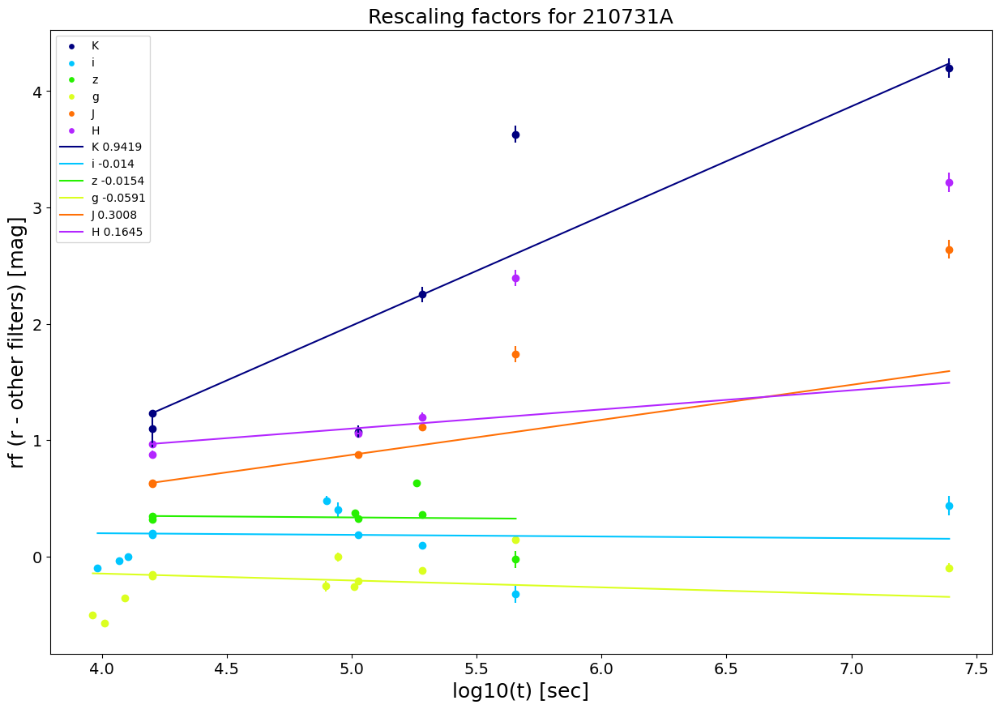


####################################################################################################

210822A
List of filters in the form: [Filter,number of points that have this filter]
[['H', 17], ['R', 13], ['white', 10], ['U', 10], ['UVW1', 7], ['B', 5], ['r', 5], ['V', 5], ['UVW2', 4], ['I', 2], ['i', 2], ['g', 1], ['UVM2', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  H , with 17 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
    band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0      B          5  2.936765   1.214431       0.048382          20.668844
1  white         10  2.948657   0.979689       0.030408          32.886083
2   UVW2          4  2.958325   0.857266       0.103734           9.640041
3   UVW2          4  2.960709  -1.302734       0.193734           5.161717
4      V          5  2.972434  -0.163248       0.063734          15.690212
No filter with at least 3 rescal

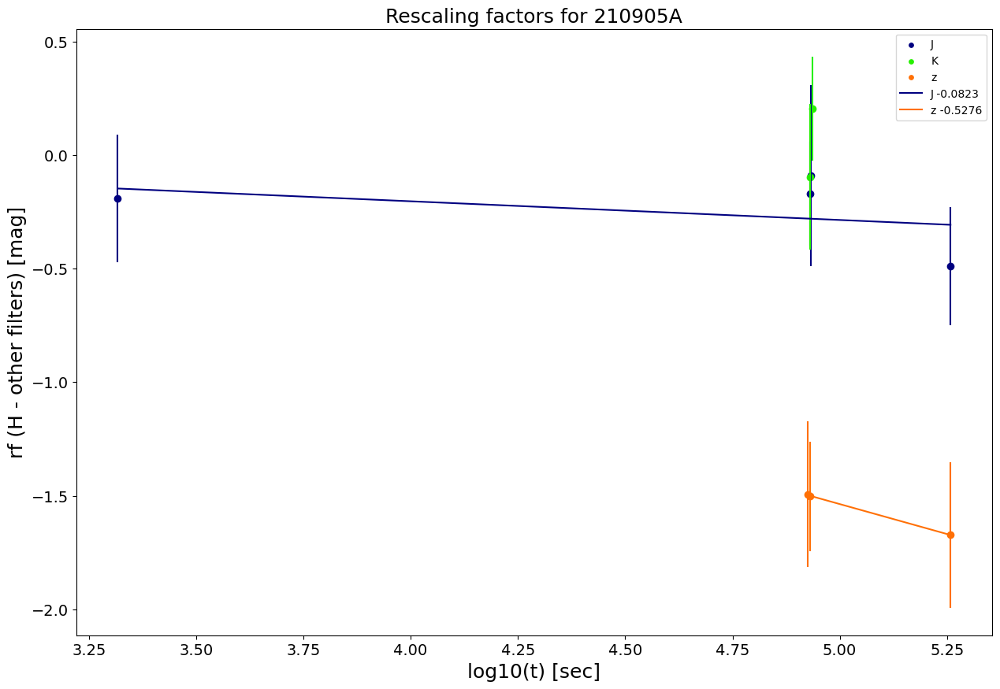


####################################################################################################

211023A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 9], ['r', 3], ['Rc', 1], ['Ic', 1], ['i', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 9 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
Empty DataFrame
Columns: [band, Occur_fil, Log10(t), Resc_fact, Resc_fact_err, Resc_fact_weights]
Index: []
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

211024B
List of filters in the form: [Filter,number of points that have this filter]
[['U', 2], ['UVW2', 2], ['i', 2], ['V', 2], ['r', 1], ['UVW1', 1], ['B', 1], ['UVM2', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  U , with 2 occurrences
-\|/-|/-\|/-|/-\|/

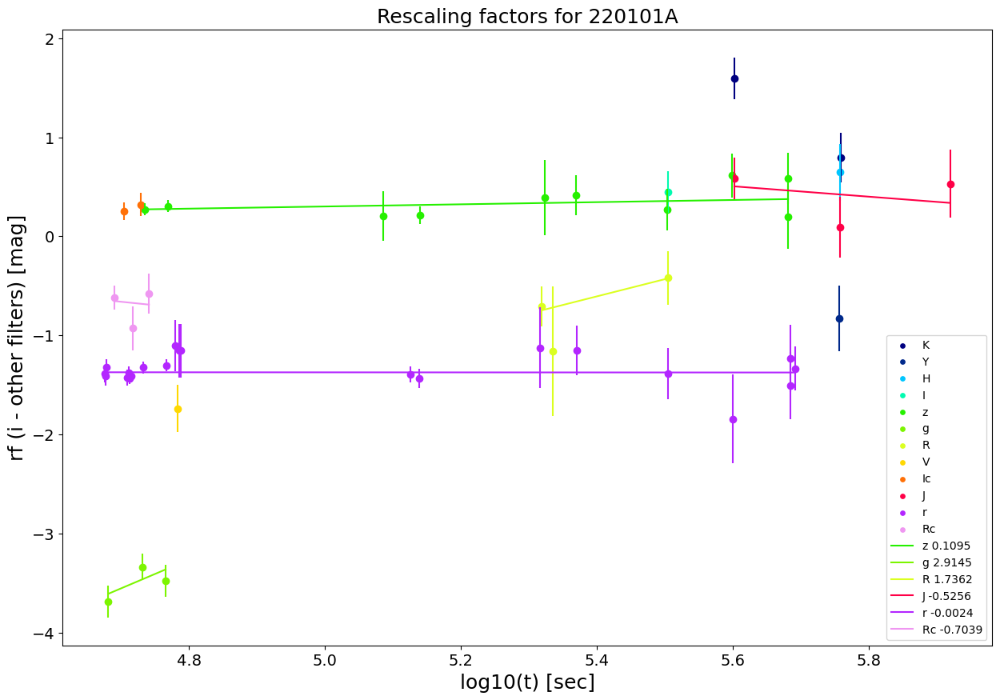


####################################################################################################

220107A
List of filters in the form: [Filter,number of points that have this filter]
[['Rc', 4], ['white', 3], ['R', 2], ['r', 1], ['Clear', 1], ['Ic', 1], ['g', 1], ['B', 1], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  Rc , with 4 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
    band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0     Ic          1  4.306425   0.589404           0.40           2.500000
1      g          1  4.306425  -0.875700           0.70           1.428571
2  Clear          1  5.108572   0.170000           0.17           5.882353
3      V          1  5.117500  -0.546090           0.09          11.111111
4      B          1  5.121064  -1.638498           0.21           4.761905
No filter with at least 3 rescaling factors to be fitted

#####################

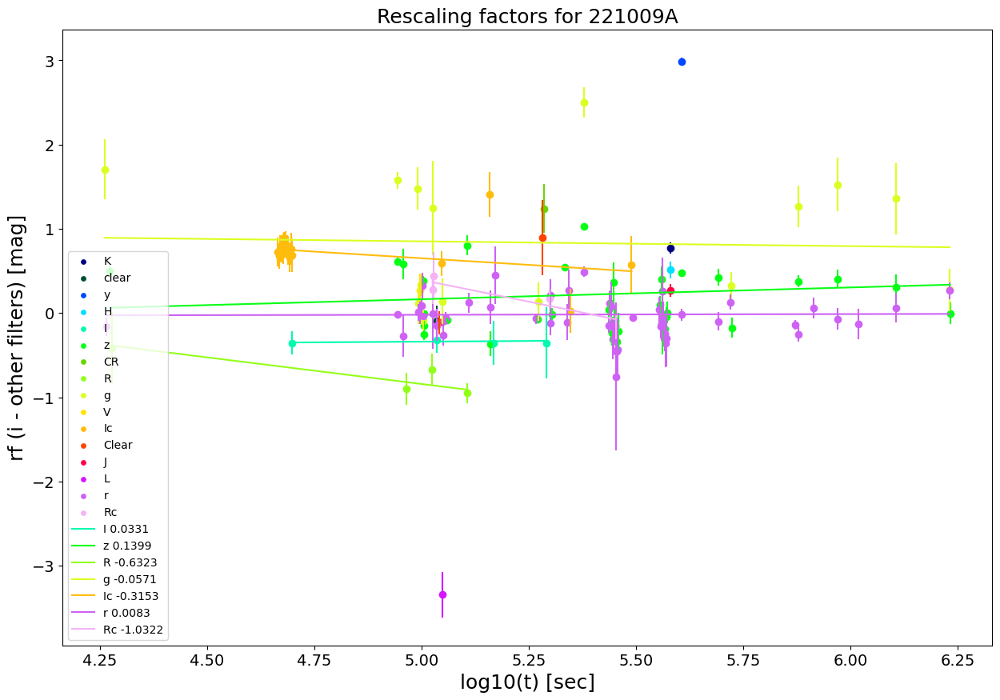


####################################################################################################

221110A
List of filters in the form: [Filter,number of points that have this filter]
[['r', 3], ['i', 2], ['clear', 1], ['white', 1], ['z', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  r , with 3 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    i          2  3.540830   1.251593           0.14           7.142857
1    i          2  4.080266   1.891593           0.30           3.333333
2    z          1  4.080266   2.289987           0.40           2.500000
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

221226B
List of filters in the form: [Filter,number of points that have this filter]
[['white', 1], ['r', 1]]
 
The most

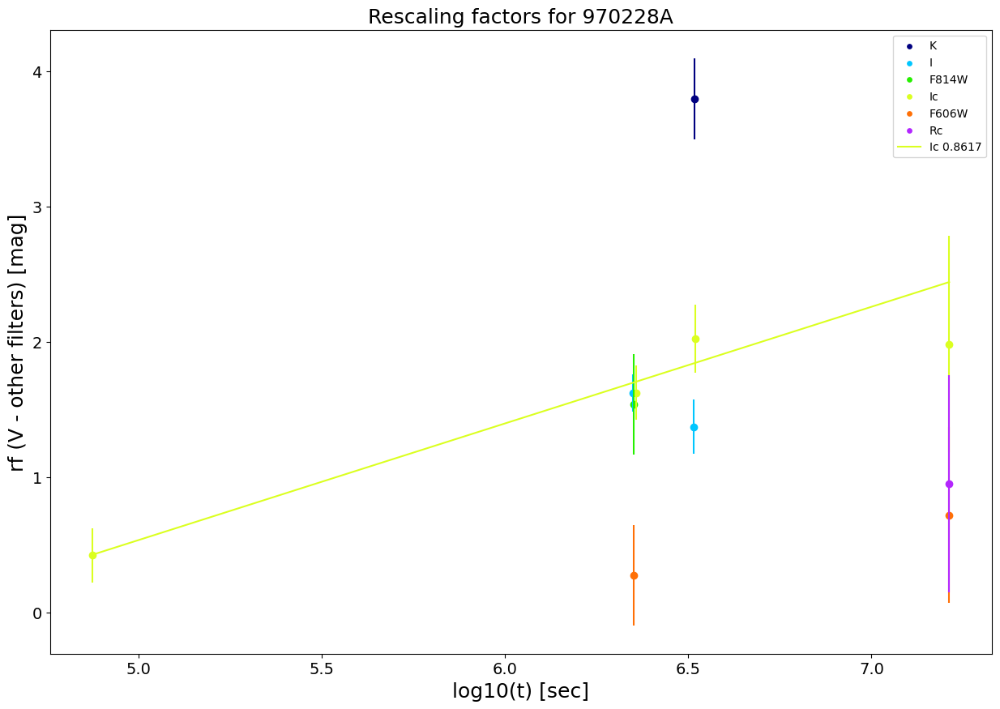


####################################################################################################

970508A
List of filters in the form: [Filter,number of points that have this filter]
[['Rc', 39], ['V', 33], ['Ic', 33], ['B', 23], ['R', 8], ['U', 7], ['r_Gunn', 5], ['K', 3], ['I', 2]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  Rc , with 39 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
     band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0  r_Gunn          5  4.400407   0.053377           0.20           5.000000
1      Ic         33  4.407799   0.682332           0.33           3.030303
2       V         33  4.947664  -0.133678           0.10          10.000000
3      Ic         33  4.947664   0.362332           0.23           4.347826
4       U          7  4.947664   0.385757           0.30           3.333333
Rescaling results
------------------
         slope slope_err intercept

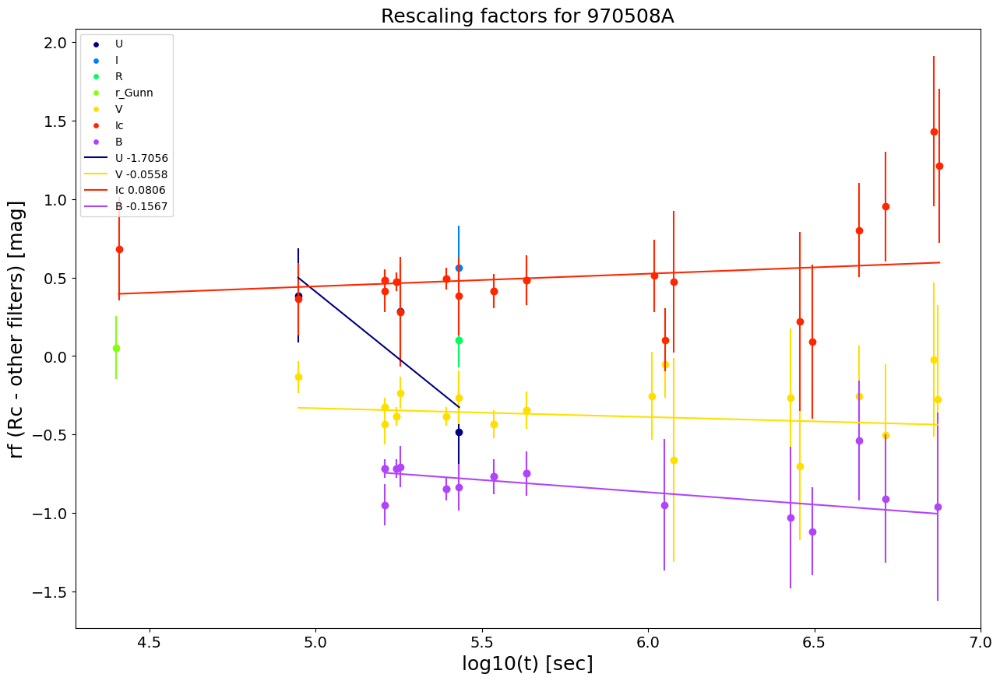


####################################################################################################

971214A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 10], ['I', 5], ['J', 4], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 10 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    J          4  4.606080   1.765783           0.30           3.333333
1    J          4  4.606109   1.765783           0.30           3.333333
2    I          5  4.658546   0.366241           0.14           7.142857
3    V          1  4.666705  -0.546025           0.12           8.333333
4    I          5  5.123263   0.679178           0.70           1.428571
Rescaling results
------------------
   slope slope_err intercept inter_err acceptance           red_chi2  \
J      0         0         0         0   

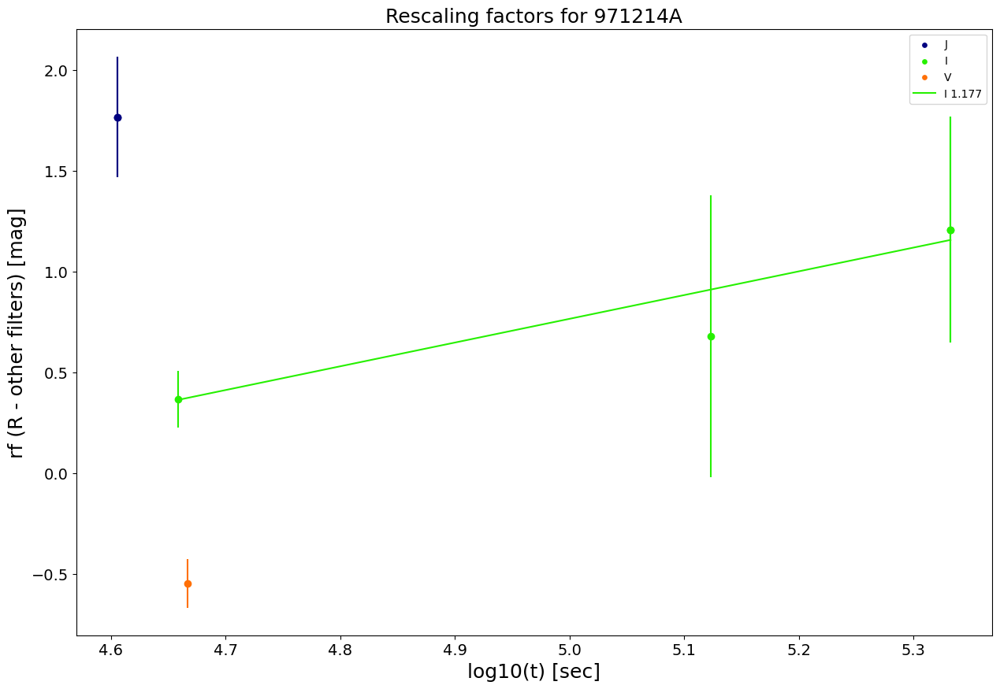


####################################################################################################

980329A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 12], ['K', 10], ['I', 5], ['J', 2], ['H', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 12 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    I          5  4.808145   2.842280          0.800           1.250000
1    J          2  5.415959   7.381642          0.400           2.500000
2    K         10  5.521312   4.841964          0.500           2.000000
3    I          5  5.724266   0.488943          0.665           1.503759
4    K         10  7.324498   3.835202          0.380           2.631579
Rescaling results
------------------
    slope slope_err intercept inter_err acceptance           red_chi2  \
J       0         0         0

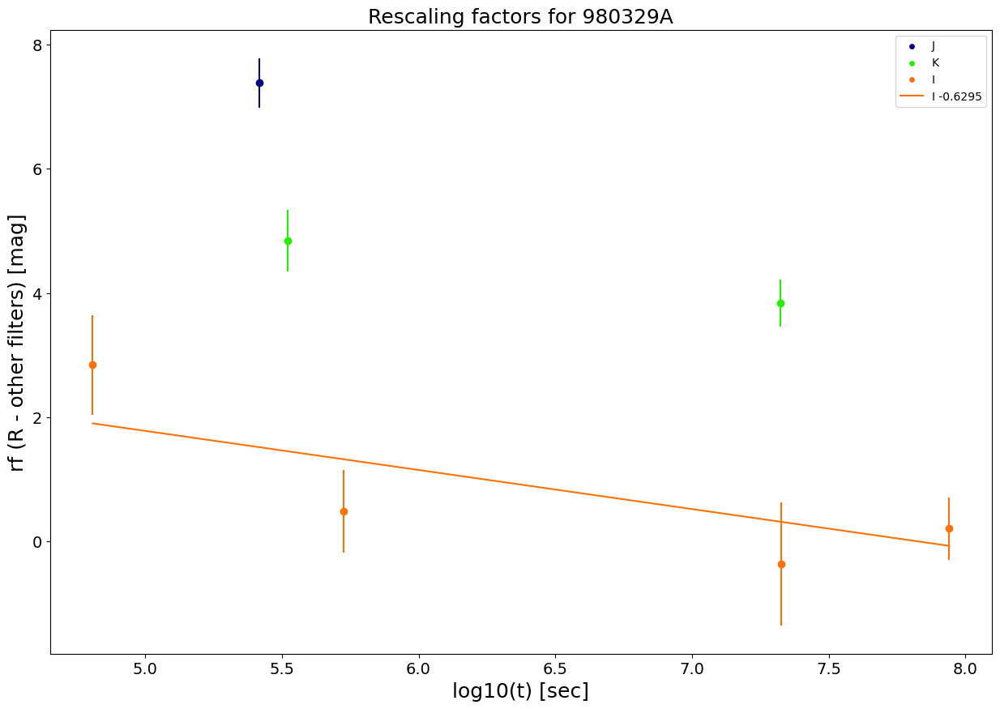


####################################################################################################

980425A
List of filters in the form: [Filter,number of points that have this filter]
[['Rc', 38]]
 
The most numerous filter is considered for rescaling
C:/Users/biagi/Desktop/LCs to inspect deltat/FILTERS_SELECTION/All530GRBs/980425A_magAB_extcorr.txt has only one filter along all the LC, thus no rescaling is needed

####################################################################################################

980613A
List of filters in the form: [Filter,number of points that have this filter]
[['Rc', 3], ['R', 2], ['Ic', 2], ['I', 2]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  Rc , with 3 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    I          2  4.949551   1.142985           0.29           3.448276
No filter with at l

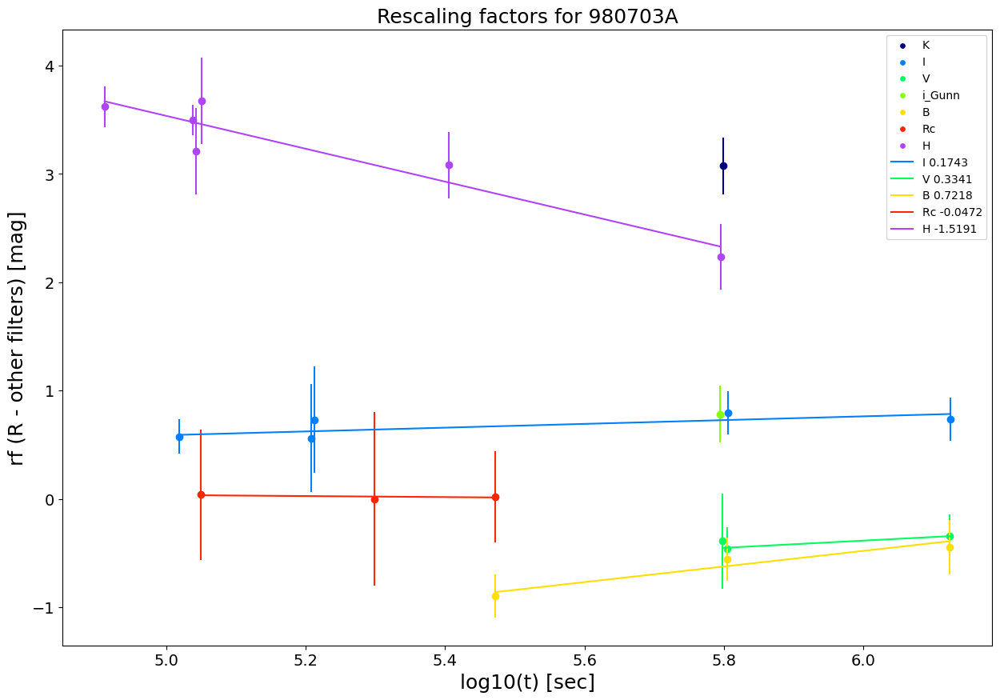


####################################################################################################

990123A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 28], ['r', 16], ['B', 14], ['K', 10], ['V', 8], ['Rc', 6], ['H', 2], ['J', 2], ['U', 1], ['i_BATC', 1], ['Ic', 1], ['I', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 28 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    B         14  4.690373  -0.103789           0.26           3.846154
1    B         14  4.711760  -0.580459           0.18           5.555556
2    B         14  4.755329  -0.418329           0.39           2.564103
3   Ic          1  4.790215   0.615916           0.29           3.448276
4    B         14  4.831383  -0.559491           0.13           7.692308
Rescaling results
------------------
         slope slope_er

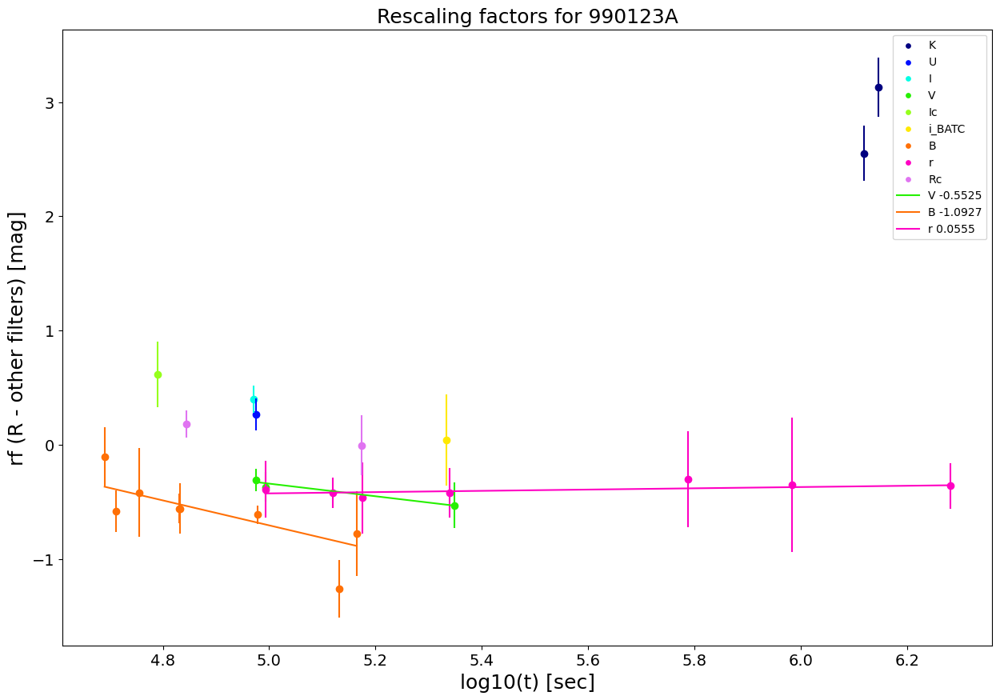


####################################################################################################

990510A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 85], ['V', 41], ['I', 23], ['B', 19]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 85 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    V         41  4.094876  -0.035989           0.04          25.000000
1    V         41  4.118357  -0.005989           0.04          25.000000
2    V         41  4.137911  -0.085989           0.03          33.333333
3    V         41  4.543969  -0.045989           0.13           7.692308
4    V         41  4.552464  -0.025989           0.15           6.666667
Rescaling results
------------------
    slope slope_err intercept inter_err acceptance  red_chi2  \
V -0.1338    0.0499    0.4755     0.235     0.

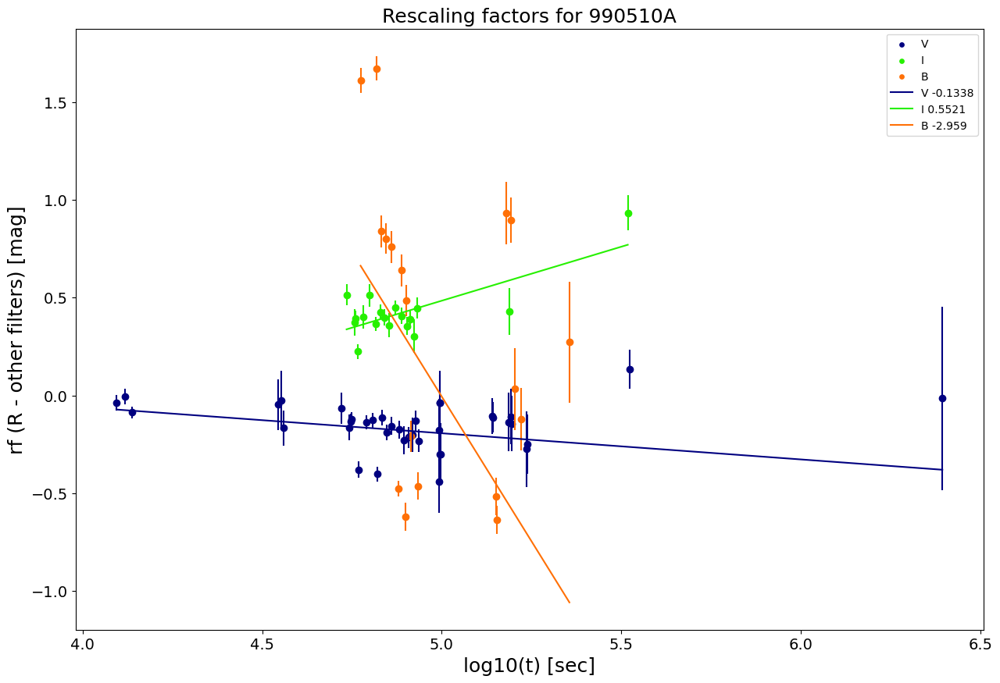


####################################################################################################

990705A
List of filters in the form: [Filter,number of points that have this filter]
[['H', 3], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  H , with 3 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    V          1   4.80226  -3.425967           0.25                4.0
No filter with at least 3 rescaling factors to be fitted

####################################################################################################

990712A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 36], ['V', 22], ['I', 6]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 36 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  ba

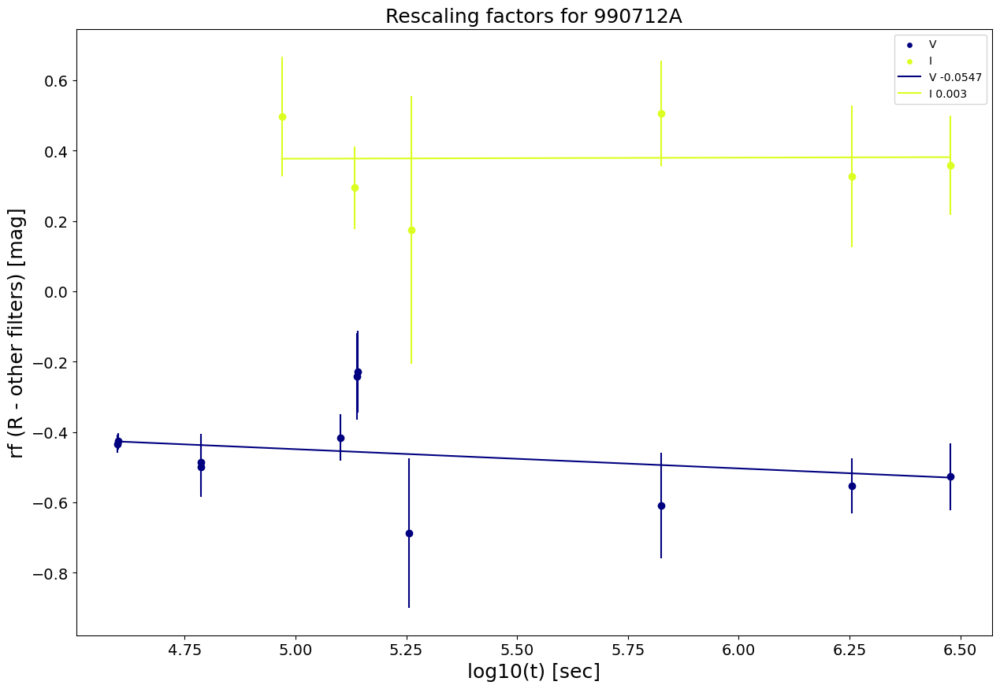


####################################################################################################

991208A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 24], ['I', 17], ['V', 9], ['B', 6], ['Rc', 1], ['K', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 24 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
  band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0    I         17  5.416194   0.336873           0.28           3.571429
1    I         17  5.417101   0.836873           0.14           7.142857
2    I         17  5.424744   0.587055           0.18           5.555556
3    I         17  5.426861   0.487055           0.18           5.555556
4    V          9  5.542198  -0.688091           0.70           1.428571
Rescaling results
------------------
     slope slope_err intercept inter_err acceptance           red_chi2  \
V   0.2479    0.2

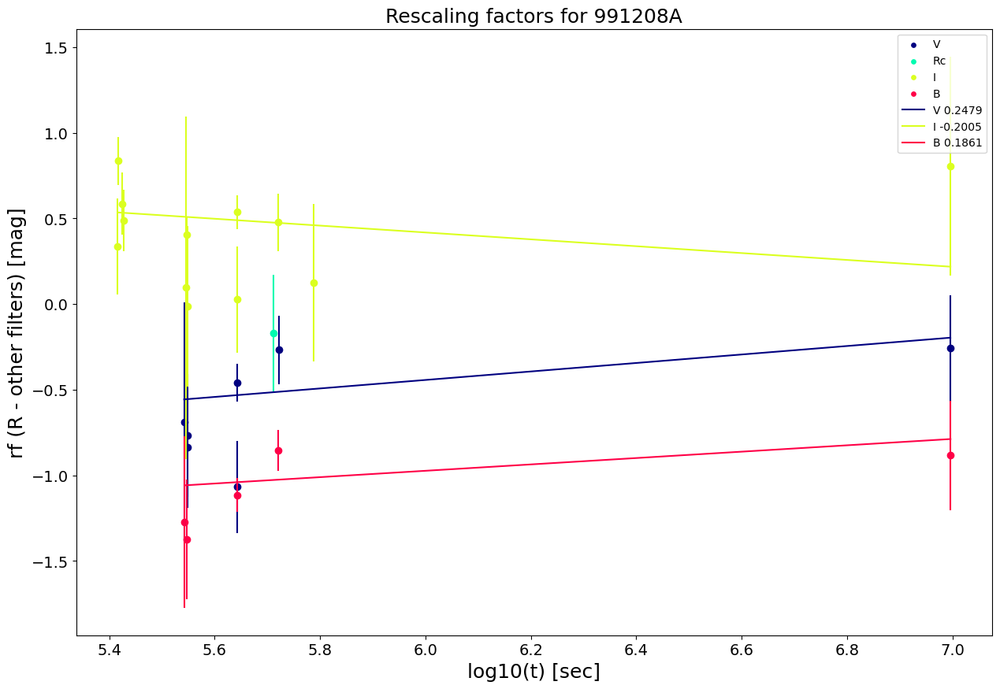


####################################################################################################

991216A
List of filters in the form: [Filter,number of points that have this filter]
[['R', 56], ['J', 12], ['K', 7], ['I', 7], ['H', 2], ['i_Gunn', 2], ['V', 1]]
 
The most numerous filter is considered for rescaling
The most numerous filter of this GRB:  R , with 56 occurrences
-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/
     band  Occur_fil  Log10(t)  Resc_fact  Resc_fact_err  Resc_fact_weights
0  i_Gunn          2  4.670878      -0.10           0.25           4.000000
1       I          7  4.675656       0.76           0.18           5.555556
2       J         12  4.677424       2.03           0.11           9.090909
3       K          7  4.677424       3.77           0.13           7.692308
4       J         12  4.768035       2.00           0.10          10.000000
Rescaling results
------------------
         slope slope_err intercept inter_err acceptance    

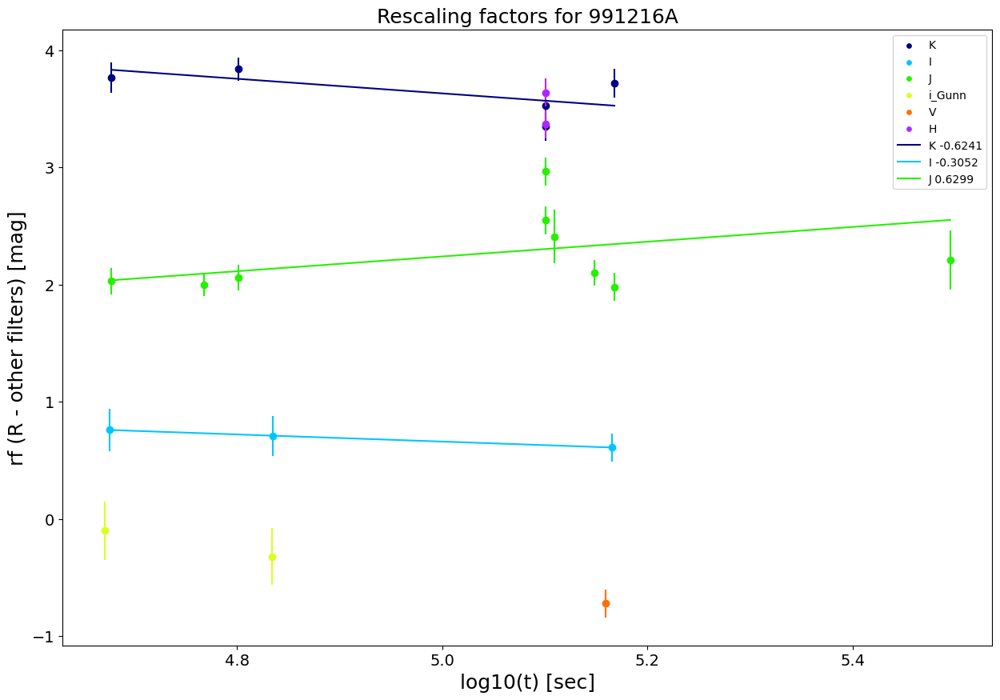


####################################################################################################

000301C.pdf


UnicodeDecodeError: 'utf-8' codec can't decode byte 0xac in position 10: invalid start byte

In [3]:
# LM FITTING

#for root, dirs, files in os.walk(path):
for i, grbtitle in zip(filedf['path'], filedf['grb']):

    print("\n"+ str(100*"#") +"\n")
    #grbtitle=i.replace("/content/drive//MyDrive/gamma-ray-gang/sample/527GRBS_mag_with_telescope&systeminfo/Ready_for_Ridha(completefiles)/GRBs_AB+galextcorr_08-02-2023/","").replace("_mag_AB_galextcorr.txt","")
    print(grbtitle)

    try:
        light = pd.read_csv(path+i, sep=r"\t+\s+", engine="python", header=None, index_col=0).sort_values(by=['time_sec'])
        light=light[light['mag_err'] != 0]
        if light.empty:
            print(i+" has only limiting magnitudes, thus it will be skipped")
            print("\n"+ str(100*"-") +"\n")
            continue
        color=(light[3].values).to_list()
        print(color)

        filterslist=[[x,color.count(x)] for x in set(color)]
        freq=[]
        for k in color:
            for j in filterslist:
                if j[0]==k:
                    freq.append(str(k)+' ('+str(j[1])+')')

        fig = px.scatter(
                    data_frame=light,
                    x=np.log10(light[0].values),
                    y=-light[1].values,
                    error_y=light[2].values,
                    color=color,
                    hover=light[7].values,
                    title=grbtitle,
                )
        
        fig.update_layout(
                    xaxis_title='log Time (s)',
                    yaxis_title='mag'
                )
        #fig.show()
        
        if len(freq)==1:
            print(i+" has only one data point along all the LC, thus no rescaling is needed")
            print("\n"+ str(100*"-") +"\n")
            continue
        
    except:
        light = pd.read_csv(i, sep=r"\t+|\s+", engine="python", header=0).sort_values(by=['time_sec'])#, index_col=0)
        light=light[light['mag_err'] != 0]
        if light.empty:
            print(i+" has only limiting magnitudes, thus it will be skipped")
            print("\n"+ str(100*"-") +"\n")
            continue       
        color=(light['band']).to_list()
        filterslist=[[x,color.count(x)] for x in set(color)]
        freq=[]
        for k in color:
            for j in filterslist:
                if j[0]==k:
                    freq.append(str(k)+' ('+str(j[1])+')')
        
        fig = px.scatter(
            data_frame=light,
            x=np.log10(light['time_sec'].values),
            y=-light['mag'].values,
            error_y= light['mag_err'].values,
            color=freq,
            hover_data=['source'],
            title=grbtitle,
        )
        
        fig.update_layout(
            xaxis_title='log Time (s)',
            yaxis_title='mag'
        )
        
        #fig.show()
        
        if len(freq)==1:
            print(i+" has only one data point along all the LC, thus no rescaling is needed")
            print("\n"+ str(100*"-") +"\n")
            continue        
        
    light = pd.read_csv(i, sep=r"\t+|\s+", engine="python", header=0).sort_values(by=['time_sec'])#, index_col=0)
    light=light[light['mag_err'] != 0]
    if light.empty:
        print(i+" has only limiting magnitudes, thus it will be skipped")
        print("\n"+ str(100*"-") +"\n")
        continue
    x=np.log10(light['time_sec'].values)
    y=light['mag'].values
    error_y= light['mag_err'].values
    color=(light['band']).to_list()
    sys=(light['system']).to_list()
    telescope=(light['telescope']).to_list()
    galextcorr=(light['extcorr']).to_list()
    source=(light['source']).to_list()
    
    for jjj in range(len(color)):
        if color[jjj]=="u'":
            color[jjj]="u"
        if color[jjj]=="g'":
            color[jjj]="g"            
        if color[jjj]=="r'":
            color[jjj]="r"
        if color[jjj]=="i'":
            color[jjj]="i"            
        if color[jjj]=="z'":
            color[jjj]="z"            
        if color[jjj]=="BJ":
            color[jjj]="B"            
        if color[jjj]=="VJ":
            color[jjj]="V"
        if color[jjj]=="UJ":
            color[jjj]="U"            
        if color[jjj]=="RM":
            color[jjj]="R"             
        if color[jjj]=="BM":
            color[jjj]="B"
        if color[jjj]=="UM":
            color[jjj]="U"            
        if color[jjj]=="KS":
            color[jjj]="K"  
        if color[jjj]=="Ks":
            color[jjj]="K" 
        if color[jjj]=="K'":
            color[jjj]="K"
        if color[jjj]=="Kp":
            color[jjj]="K"
            
    filterslist=[[x,color.count(x)] for x in set(color)]
    
    freq=[]
    freq1=[]
    freqfinal=[]
    for k in color:
        for j in filterslist:
            if j[0]==k:
                freq.append(str(k)+' ('+str(j[1])+')')
                freq1.append([k,j[1]])
                freqfinal.append(j[1])
    
    freq_set = set(tuple(x) for x in freq1)
    occurrences = [list(x) for x in freq_set]
    sortedoccur=sorted(occurrences,key=lambda x: int(x[1]),reverse=True)
    
    print('List of filters in the form: [Filter,number of points that have this filter]')
    print(sortedoccur)
    print(' ')
    
    # When we assign the filterposition variable, we are placing another filter in place of the most numerous
    filterposition=0 # for example, with filterposition=1 we are considering the second most numerous filter for rescaling
    # for example, if we put 4 we are cosidering the third most numerous filter (due to Python counting with zero as first element etc.)
    
    if filterposition!=0:
        #print('According to the position of the needed filter in the list, we are considering the filter n.',filterposition+1,' for rescaling')
        sortedoccur[0],sortedoccur[filterposition]=sortedoccur[filterposition],sortedoccur[0]
        #print('List with changed filters')
        print(sortedoccur)
        print(' ')
    else:
        print('The most numerous filter is considered for rescaling')
    
    
    # Identifying the most numerous filter and the second most numerous in the GRB 
    mostcommonfilter=sortedoccur[0][0]
    
    if len(sortedoccur)==1:
        print(i+" has only one filter along all the LC, thus no rescaling is needed")
        continue
    
    print('The most numerous filter of this GRB: ',sortedoccur[0][0],', with', sortedoccur[0][1], 'occurrences')
    
    secondcommonfilter=sortedoccur[1][0]
    
    # Defining the overlap function: this function tells you if two ranges of real numbers overlap
    # So, if we consider the ranges (logflux-err,logflux+err) we can compare if two error bars overlap
    
    def overlap(start1, end1, start2, end2):
        #how much does the range (start1, end1) overlap with (start2, end2)
        return max(max((end2-start1), 0) - max((end2-end1), 0) - max((start2-start1), 0), 0)
    
    # LET'S GO; WE HERE RESCALE ACCORDING TO THE MOST NUMEROUS FILTER

    # We here create the sublist of data points that have the most common filter
    
    mostcommonlight=light.loc[light['band'] == mostcommonfilter].to_dict('subset')
    mostcommonx=np.log10(mostcommonlight['time_sec'].values)
    mostcommony=mostcommonlight['mag'].values
    mostcommonerror_y=mostcommonlight['mag_err'].values
    mostcommonsys=(mostcommonlight['system']).to_list()
    mostcommontelescope=(mostcommonlight['telescope']).to_list()
    mostcommongalextcorr=(mostcommonlight['extcorr']).to_list()
    mostcommonsource=(mostcommonlight['source']).to_list()
    
    # Second step: find the minimum time difference between the most common and the next filter in order of occurrences
    
    # Here we start to create a list that contains the rescaling factors for every filter after the most common
    # The structure is (filtername, number of points, list of rescaling factors (up to 6))
    # scalingfactorslist=[[sortedoccur[0][0],sortedoccur[0][1],[0]]]
    
    scalingfactorslist2=[[sortedoccur[0][0],sortedoccur[0][1],[[0,0,0]]]]

    
    
    # Here we re-import the GRB data (A RE-IMPORTATION IS HEAVY IN CODING AND NOT NECESSARY, THIS CAN BE IMPROVED)
    lightresc = pd.read_csv(i, sep=r"\t+|\s+", engine="python", header=0).sort_values(by=['time_sec'])#, index_col=0)
    lightresc=lightresc[lightresc['mag_err'] != 0]
    if lightresc.empty:
        print(i+" has only limiting magnitudes, thus it will be skipped")
        continue  
    rescx=np.log10(lightresc['time_sec'].values)
    rescy=lightresc['mag'].values
    resccolor=lightresc['band'].values

    for jjj in range(len(resccolor)):
        if resccolor[jjj]=="u'":
            resccolor[jjj]="u"
        if resccolor[jjj]=="g'":
            resccolor[jjj]="g"            
        if resccolor[jjj]=="r'":
            resccolor[jjj]="r"
        if resccolor[jjj]=="i'":
            resccolor[jjj]="i"            
        if resccolor[jjj]=="z'":
            resccolor[jjj]="z"            
        if resccolor[jjj]=="BJ":
            resccolor[jjj]="B"            
        if resccolor[jjj]=="VJ":
            resccolor[jjj]="V"
        if resccolor[jjj]=="UJ":
            resccolor[jjj]="U"            
        if resccolor[jjj]=="RM":
            resccolor[jjj]="R"             
        if resccolor[jjj]=="BM":
            resccolor[jjj]="B"
        if resccolor[jjj]=="UM":
            resccolor[jjj]="U"            
        if resccolor[jjj]=="KS":
            resccolor[jjj]="K"  
        if resccolor[jjj]=="Ks":
            resccolor[jjj]="K"     
        if resccolor[jjj]=="K'":
            resccolor[jjj]="K" 
        if resccolor[jjj]=="Kp":
            resccolor[jjj]="K" 
            
    rescerror_y= lightresc['mag_err'].values
    reschover_data=lightresc['source'].values
    rescsys=(lightresc['system']).to_list()
    resctelescope=(lightresc['telescope']).to_list()
    rescgalextcorr=(lightresc['extcorr']).to_list()    
    

    lightresc2=lightresc.loc[(np.log10(lightresc['time_sec']) > 0)].to_dict('lightresc1')
    rescx2=np.log10(lightresc2['time_sec'])
    rescy2=lightresc2['mag']
    resccolor2=lightresc2['band']
    rescerror_y2= lightresc2['mag_err']
    reschover_data2=lightresc2['source']    
    rescsys2=lightresc2['system']
    resctelescope2=lightresc2['telescope']
    rescgalextcorr2=lightresc2['extcorr']     
    
    
    resc2freq=[]
    for k in resccolor2:
        for j in filterslist:
            if j[0]==k:
                resc2freq.append([k,j[1]])
    
    resc2freq_set = set(tuple(x) for x in resc2freq)
    occurrences2 = [list(x) for x in resc2freq_set]
    sortedoccur2 = sorted(occurrences2,key=lambda x: int(x[1]),reverse=True)
    
    #print('List of filters in the form: [Filter,number of points that have this filter]')
    #print(sortedoccur)
    #print(' ')
    
    mostcommonlight2=light.loc[(lightresc['band'] == mostcommonfilter) & (np.log10(lightresc['time_sec']) > 0)].to_dict('list')
        
    mostcommonx2=np.log10(mostcommonlight2['time_sec'])
    mostcommony2=mostcommonlight2['mag']
    mostcommonerror_y2=mostcommonlight2['mag_err']
    mostcommonsys2=mostcommonlight2['system']
    mostcommontelescope2=mostcommonlight2['telescope']
    mostcommongalextcorr2=mostcommonlight2['extcorr']
    mostcommonsource2=mostcommonlight2['source']    
    
    
    for j in range(1,len(sortedoccur2)):
        scalingfactorslist2.append([sortedoccur2[j][0],sortedoccur2[j][1],[]])
    
    evolutionrescalingfactor2=[]
    
    for j in range(1,len(sortedoccur2)):
        
        sublight=light.loc[(lightresc['band'] == sortedoccur2[j][0]) 
                                    & (np.log10(lightresc['time_sec']) > 0)].to_dict('subset')
        subx=np.log10(sublight['time_sec'].values)
        suby=sublight['mag'].values
        suberror_y=sublight['mag_err'].values
        
        timediff = [[p1,p2] for p1 in range(len(mostcommonx2)) for p2 in range(len(subx)) if np.log10(np.abs(10**mostcommonx2[p1]-10**subx[p2]))<=np.log10((10**mostcommonx2[p1])*2.5/100)]
        #timediffcoinc = [[p1,p2] for p1 in range(len(mostcommonx2)) for p2 in range(len(subx)) if np.abs(mostcommonx2[p1]-subx[p2])<=1e-20]

        if len(timediff)!=0:
            for ll in timediff:
                sf2=[subx[ll[1]],mostcommony2[ll[0]]-suby[ll[1]],np.log10(np.abs(10**mostcommonx2[ll[0]]-10**subx[ll[1]])),mostcommonerror_y2[ll[0]]+suberror_y[ll[1]]]
                scalingfactorslist2[j][2].append(sf2)
        
        #if len(timediffcoinc)==0 and len(timediff)==0:
        if len(timediff)==0:
            continue
            # We here define the re-scaling constant between the most common band and the j-th band (in order of occurencies)
    
    
    #scalingfactorslistjunction2to3=[[sortedoccur[0][0],sortedoccur[0][1],[[0,0,0]]]]   
    

    for fl in scalingfactorslist2:
    #for fl in testlist:

        times=set(el[0] for el in fl[2])
        
        
        for tt in times:
            suppllist=[fl[2][x] for x in range(len(fl[2])) if fl[2][x][0]==tt]
            suppllistdist=[fl[2][x][2] for x in range(len(fl[2])) if fl[2][x][0]==tt]     
            
            mindistpos=suppllistdist.index(min(suppllistdist))
            
            evolutionrescalingfactor2.append([fl[0],fl[1],suppllist[mindistpos]])    
            
          
    finalevolutionlist=evolutionrescalingfactor2 #+evolutionrescalingfactor2+evolutionrescalingfactorjunction2to3 #+evolutionrescalingfactor3+evolutionrescalingfactor4+evolutionrescalingfactor5+evolutionrescalingfactor6+evolutionrescalingfactorjunction3to4+evolutionrescalingfactorjunction4to5+evolutionrescalingfactorjunction5to6+evolutionrescalingfactorjunction6up
        
    
    finalevolutionlist=sorted(finalevolutionlist, key=lambda finalevolutionlist: finalevolutionlist[2][0])
    #print('Final evolution list')
    #print(finalevolutionlist)
    print("-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/-\|/-|/")
    colorevolfilt=[jj[0] for jj in finalevolutionlist if jj[0]!=mostcommonfilter]
    colorevoloccur=[jj[1] for jj in finalevolutionlist if jj[0]!=mostcommonfilter]
    colorevoltime=[jj[2][0] for jj in finalevolutionlist if jj[0]!=mostcommonfilter]
    colorevolrescfact=[jj[2][1] for jj in finalevolutionlist if jj[0]!=mostcommonfilter]
    colorevolrescfacterr=[jj[2][3] for jj in finalevolutionlist if jj[0]!=mostcommonfilter]
    colorevolrescfactweights=[(1/jj[2][3]) for jj in finalevolutionlist if jj[0]!=mostcommonfilter]
    
    #print('Rescaling factor time:')
    #print(colorevoltime)
    #print('Rescaling factor:')
    #print(colorevolrescfact)
    #print('Rescaling factor error:')
    #print(colorevolrescfacterr)
    
    rescalingfactorsframe=pd.DataFrame(list(zip(colorevolfilt,colorevoloccur,colorevoltime,colorevolrescfact,
                                                colorevolrescfacterr,colorevolrescfactweights)),columns=['band','Occur_fil','Log10(t)','Resc_fact','Resc_fact_err','Resc_fact_weights'])
    print(rescalingfactorsframe.head())
    
    filtersplit=set(colorevolfilt)
    #print(filtersplit)
  
    filtersatleast3data=[]
    for jj in filtersplit:
        subframe=rescalingfactorsframe.loc[rescalingfactorsframe['band']==jj]
        if len(subframe)>2:
            filtersatleast3data.append(jj)
    
    if len(filtersatleast3data)==0:
        print('No filter with at least 3 rescaling factors to be fitted')
        continue

    print('Rescaling results\n------------------')

    ## RIDHA'S PART

    x_all = rescalingfactorsframe['Log10(t)']
    y_all = rescalingfactorsframe['Resc_fact']
    yerr_all = rescalingfactorsframe['Resc_fact_err']
    filters = [*set(rescalingfactorsframe['band'].values)]
    rescalingfactorsframe['plot_color'] = ""

    #fig2 = px.scatter(
    #       data_frame=rescalingfactorsframe,
      #      x=rescalingfactorsframe['Log10(t)'].values,
      #     y=rescalingfactorsframe['Resc_fact'].values,
        #    error_y= rescalingfactorsframe['Resc_fact_err'].values,
        #   color=rescalingfactorsframe['band'].values,
          #  hover_data=['band'],
          # title="Rescaling plot",
    #)
    #fig2.update_layout(
    #   xaxis_title='log Time (s)',
      #  yaxis_title='Rescaling factor'
    #)
    
    #plt.scatter(x, y, label='Rescale factors')
    # Set the color map to match the number of filter
    cmap = plt.get_cmap('gist_ncar')
    cNorm  = colors.Normalize(vmin=0, vmax=len(filters))
    scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=cmap)

    # Plot each species
    for i, band in enumerate(filters):
      colour = scalarMap.to_rgba(i)
      index = rescalingfactorsframe['band'] == band
      plt.scatter(x_all[index], y_all[index],
                  s=15, 
                  color=colour, 
                  label=filters[i])
      plt.errorbar(x_all[index], y_all[index], yerr_all[index],
                  fmt='o',
                  barsabove=True,
                  ls='',
                  color=colour
                  )
      for j in rescalingfactorsframe[index].index:
        rescalingfactorsframe.at[j,"plot_color"] = colour


    resc_slopes_df = pd.DataFrame()
    resc_slopes_df.index = filters
    resc_slopes_df['slope'] = ""
    resc_slopes_df['slope_err'] = ""
    resc_slopes_df['intercept'] = ""
    resc_slopes_df['inter_err'] = ""
    resc_slopes_df['acceptance'] = ""
    resc_slopes_df['red_chi2'] = ""
    resc_slopes_df['comment'] = ""
    resc_slopes_df['plot_color'] = ""

    for band in resc_slopes_df.index:
      
      ind = rescalingfactorsframe.index[rescalingfactorsframe['band'] == band][0]
      resc_slopes_df.loc[band]['plot_color'] = rescalingfactorsframe.loc[ind]["plot_color"]

      resc_band_df = rescalingfactorsframe[rescalingfactorsframe['band'] == band]

      x = resc_band_df['Log10(t)']
      y = resc_band_df['Resc_fact']
      weights = resc_band_df['Resc_fact_weights']

    
      ## lmfit linear

      if len(x) >= 3:
        linear_model = LinearModel(prefix='line_')
        linear_params = linear_model.make_params()
        
        linear_params['line_slope'].set(value=-1.0)
        linear_params['line_intercept'].set(value=np.max(y))

        linear_fit = linear_model.fit(y, params=linear_params, x=x, weights=weights)
        
        #print(linear_fit.redchi)
        #print(linear_fit.fit_report())
        
        resc_slopes_df.loc[band]['slope'] = np.around(linear_fit.params['line_slope'].value, decimals=4)
        resc_slopes_df.loc[band]['slope_err'] = np.around(linear_fit.params['line_slope'].stderr, decimals=4)
        resc_slopes_df.loc[band]['intercept'] = np.around(linear_fit.params['line_intercept'].value, decimals=4)
        resc_slopes_df.loc[band]['inter_err'] = np.around(linear_fit.params['line_intercept'].stderr, decimals=4)
        resc_slopes_df.loc[band]['acceptance'] = np.around(np.abs(resc_slopes_df.loc[band]['slope_err']/resc_slopes_df.loc[band]['slope']), decimals=4)
        resc_slopes_df.loc[band]['red_chi2'] = np.around(linear_fit.redchi, decimals=4)
        
      else: # not enough data points
        resc_slopes_df.loc[band]['slope'] = 0
        resc_slopes_df.loc[band]['slope_err'] = 0
        resc_slopes_df.loc[band]['intercept'] = 0
        resc_slopes_df.loc[band]['inter_err'] = 0
        resc_slopes_df.loc[band]['acceptance'] = 0
        resc_slopes_df.loc[band]['comment'] = "insufficient data"
        resc_slopes_df.loc[band]['red_chi2'] = 'insufficient data'
        
      if resc_slopes_df.loc[band]['slope'] != 0:
        if resc_slopes_df.loc[band]['acceptance'] < 10000: #put ad-hoc to have all the plots

            y_fit = resc_slopes_df.loc[band]['slope'] * x + resc_slopes_df.loc[band]['intercept']
            y_fit_err = resc_slopes_df.loc[band]['slope_err'] * x + resc_slopes_df.loc[band]['inter_err']

            plt.plot(x, y_fit, 
                    color=resc_slopes_df.loc[band]["plot_color"],
                    label=str(band+ " " + str(resc_slopes_df.loc[band]["slope"])))
            #plt.fill_between(x, y_fit - y_fit_err, y_fit + y_fit_err,
            #                color=resc_slopes_df.loc[band]["plot_color"],
            #                alpha=0.25
            #                ) # error range for fit

            if np.abs(resc_slopes_df.loc[band]['slope']) < 0.1:
                resc_slopes_df.loc[band]['comment'] = "no color evolution"
            elif resc_slopes_df.loc[band]['slope']-(3*resc_slopes_df.loc[band]['slope_err'])<=0<=resc_slopes_df.loc[band]['slope']+(3*resc_slopes_df.loc[band]['slope_err']):
                resc_slopes_df.loc[band]['comment'] = "no color evolution"
            # elif np.abs(resc_slopes_df.loc[band]['slope_err'])/np.abs(resc_slopes_df.loc[band]['slope'])>=1.0:
            #     resc_slopes_df.loc[band]['comment'] = "no colour evolution"
            else:    
                resc_slopes_df.loc[band]['comment'] = "slope >= 0.1"

        else:
            resc_slopes_df.loc[band]['comment'] = "slope=0"
        # color_evl_test = []
        # if np.abs(resc_slopes_df.loc[band]['resc_slope']) < 0.1:
        #    message = "There was no color evolution in {} band.\n".format(band)
        #    color_evl_test = color_evl_test.append(message)
        # else:
        #    message = "{} band failed the <0.1 test. \n".format(band)
        #    color_evl_test = color_evl_test.append(message)


                 
    resc_slopes_df = resc_slopes_df.drop('plot_color', axis=1)
    print(resc_slopes_df)
    # print(color_evl_test)

    def overlap(start1, end1, start2, end2):
        """Does the range (start1, end1) overlap with (start2, end2)?"""
        return end1 >= start2 and end2 >= start1    
    
    compatibilitylist=[]
    
    for band in resc_slopes_df.index:
        if resc_slopes_df.loc[band]['slope']!=0 and resc_slopes_df.loc[band]['slope_err']!=0:
            compatibilitylist.append([band,[resc_slopes_df.loc[band]['slope']-(3*resc_slopes_df.loc[band]['slope_err']),
                                      resc_slopes_df.loc[band]['slope']+(3*resc_slopes_df.loc[band]['slope_err'])]])
        else:
            continue
        
#     #print(compatibilitylist)    

    compzerolist=[]
    nocompzerolist=[]
    for l in compatibilitylist:
        if l[1][0]<=0<=l[1][1] or np.abs((l[1][0]+l[1][1])/2)<0.10:
                compzerolist.append(l[0])
        else:
            nocompzerolist.append(l[0])
    
    print('\n')

    if len(compzerolist)==0:
        print('No filters compatible with zero in 3sigma or with |slope|<0.1')
        
    else:
        print('Filters compatible with zero in 3sigma: ',*compzerolist)
    
    if len(nocompzerolist)==0:
        print('No filters with |slope|>0.1 or compatible with zero only in >3sigma')
        
    else:
        print('Filters not compatible with zero in 3sigma or with |slope|>0.1: ',*nocompzerolist)    

    print('\n')
    print('No color evolution: ',*compzerolist,' ; Color evolution: ',*nocompzerolist)        

    
    string=""
    for band in resc_slopes_df.index:
            
        string=string+band+":"+str(round(resc_slopes_df.loc[band]['slope'],3))+"+/-"+str(round(resc_slopes_df.loc[band]['slope_err'],3))+"; "
      
    print(string)
    
    plt.title('Rescaling factors for '+ str(grbtitle),fontsize=18)
    plt.xlabel('log10(t) [sec]',fontsize=18)
    plt.ylabel('rf ('+mostcommonfilter+' - other filters) [mag]',fontsize=18)
    plt.rcParams['figure.figsize'] = [15, 10]
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend(fontsize=10)
    plt.savefig(path+str(grbtitle)+'.pdf') #DECOMMENT TO EXPORT THE PLOTS
    plt.show()